# <font color="#30143">Ejercicio 3: Modelos de Deep Learning</font>
<br><br>




---

### <font color="#30143">Importar Librerías</font>

In [1]:
# Load libraries
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go 
from sklearn.preprocessing import MinMaxScaler

# Load sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.stats.stattools import jarque_bera

from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from sklearn.metrics import r2_score

import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error
import itertools
from statsmodels.tools.sm_exceptions import ConvergenceWarning
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.tsa.api as smt
import matplotlib.gridspec as gridspec


from statsmodels.tsa.arima.model import ARIMA
import warnings
import pickle
import os 

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import scipy.stats as stats
from statsmodels.tsa.stattools import acf

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
from statsmodels.graphics.gofplots import qqplot

from arch import arch_model


#librerías para Perceptrón Multicapa
import sys
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense, Input, Dropout
from keras.optimizers import SGD
from keras.models import Model
from keras.models import load_model
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Sequential
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler

from tensorflow.keras import layers
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

#librerías para LSTM 
from keras.layers import Dense, Input, Dropout
from keras.layers import LSTM
from keras.optimizers import SGD
from keras.models import Model
from keras.models import load_model
from keras.callbacks import ModelCheckpoint



#Omitier warnings
import warnings
import os
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=UserWarning, message=".*SGD.*")
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Ignora warnings, muestra solo errores.

### <font color="#30143"> Cargar el dataset</font>

A continuación usamos la función `read_cvs()` de la libreria `pandas`para cargar los datos a nuestro entorno de trabajo. 

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/lihkir/Data/refs/heads/main/Bitcoin%20Historical%20Data.csv", sep=",")

---

## <font color="#30143"> Procesamiento de Datos</font>

Procedemos a renombrar las variables que contienen caracteres especiales y/o espacios para evitar inconvenientes durante el procesamiento de los datos.

In [3]:
df_1 = df.rename(columns={    
    'Vol.': 'Vol',
    'Change %': 'Change' 
})

In [4]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4999 entries, 0 to 4998
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    4999 non-null   object
 1   Price   4999 non-null   object
 2   Open    4999 non-null   object
 3   High    4999 non-null   object
 4   Low     4999 non-null   object
 5   Vol     4993 non-null   object
 6   Change  4999 non-null   object
dtypes: object(7)
memory usage: 273.5+ KB


En este momento, procederemos a convertir el tipo de dato de la columna fecha a datetime y las columnas tipo objet a float64.

In [5]:
df_1['Date'] = pd.to_datetime(df_1['Date'])
df_1[['Price', 'Open', 'High', 'Low']] = df_1[['Price', 'Open', 'High', 'Low']].replace(',', '', regex=True).astype(float) #Eliminar coma (,) de columnas Pice, Open, High, Low y convertir a float

La columna `Vol` incluye letras que representan múltiplos; por lo tanto, a continuación, revisaremos cuántas de estas letras existen. 

In [6]:
final_letters = df_1['Vol'].str.extract(r'([A-Za-z])$', expand=False) # Extraer las últimas letras de cada registro en la columna 'Vol'
print(final_letters.dropna().unique())

['K' 'M' 'B']


De manera similar, la columna `Change` contiene un carácter especial (`%`). Procederemos a reemplazar cada múltiplo, eliminar el carácter `%` y convertir la columna `Vol` a tipo `int` y la columna `Change` a tipo `int` con la función `con_vol_a_numerico()`.

In [7]:
def con_vol_a_numerico(Vol):
    if isinstance(Vol, str): 
        Vol = Vol.replace(',', '') 
        if 'K' in Vol:
            return float(Vol.replace('K', '')) * 1_000  
        elif 'M' in Vol:
            return float(Vol.replace('M', '')) * 1_000_000  
        elif 'B' in Vol:
            return float(Vol.replace('B', '')) * 1_000_000_000  
        else:
            return float(Vol) 
    else:
        return Vol

In [8]:
df_1['Vol'] = df_1['Vol'].apply(con_vol_a_numerico) #Indexación de parámetros de función
df_1['Change'] = df_1['Change'].str.replace('%', '').astype(float) / 100 # Cambio columna Change

In [9]:
df_1['Close'] = df_1['Open'] * (1 + df_1['Change'])

### <font color="#30143"> Imputación Datos Faltantes </font>

A continuación extraemos el número de datos faltantes y el porcentaje para cada característica del conjunto de datos. 

In [10]:
missing_values = df_1.isna().sum()
total_rows = df_1.shape[0]

missing_vars = missing_values[missing_values > 0]

missing_info_df = pd.DataFrame({    
    'Datos faltantes': missing_vars,
    'Porcentaje (%)': round((missing_vars / total_rows) * 100,2)})

missing_info_df

,Datos faltantes,Porcentaje (%)
Vol,6,0.12


Se encontraron 6 datos faltantes en relación al volumen de Bitcoin transaccionado en los registros del conjunto de datos analizado. Procedemos a realizar el análisis de su distribución para escoger la mejor técnica de imputación. 

### <font color="#30143"> Asimetría</font>

A continuación se estima el sesgo de cada atributo utilizando la función `skew()`:

In [11]:
# Skew for each attribute
pd.set_option('display.precision', 4)
df_a = df_1.drop(columns=['Date'])
df_a.skew()

Price      1.6359
Open       1.6353
High       1.6380
Low        1.6303
Vol       18.6076
Change    22.6507
Close      1.6359
dtype: float64

Para evaluar si las variables presentan sesgo, se comparará el valor absoluto de sus coeficientes con un umbral, como 1.0. Se considera que los coeficientes más cercanos a cero indican un menor sesgo. Los valores de inclinación reflejan una tendencia positiva (hacia la derecha) o negativa (hacia la izquierda). En el caso de la variable `Change`, se observa un sesgo considerable hacia la derecha, mientras que las demás variables, incluyendo la `Vol` muestran un ligero sesgo también hacia la derecha, por tanto procedemos a imputar los datos faltantes con la `mediana`.

### <font color="#30143"> Imputación datos faltantes</font>

In [12]:
median_vol = df_1['Vol'].median()  # Calcular la mediana
df_1['Vol'].fillna(median_vol, inplace=True)  # Imputar la mediana

Verificamos que la imputación se haya realizado de forma correcta. 

In [13]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4999 entries, 0 to 4998
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    4999 non-null   datetime64[ns]
 1   Price   4999 non-null   float64       
 2   Open    4999 non-null   float64       
 3   High    4999 non-null   float64       
 4   Low     4999 non-null   float64       
 5   Vol     4999 non-null   float64       
 6   Change  4999 non-null   float64       
 7   Close   4999 non-null   float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 312.6 KB


Se observa que no existen datos faltantes en la columna `Vol`

In [14]:
df_1_sorted = df_1.sort_values(by='Date')
df_1_st = df_1_sorted.copy()


## <font color="#30143">Construcción de Modelos estadísticos</font>
<br><br>


---

En esta sesión se realizará la construcción de los modelos predictivos relacionados a continuación, sobre las variables `precio`, `retorno acumulado` y `volatilidad` para las diferentes ventanas ($\omega$) de 7, 14, 21, 28 días (ver imagen). 

* MLP (Multilayer Perceptrón)
* RNN (Must investigate)
* LSTM (Long short-term memory)

Se requiere calcular el retorno acumulado y la volatilidad para esto se emplean las siguientes ecuaciones: 

* Retorno acumulado diario $\{A_t\}_{t=1}^T$ donde: 

$$A_t = \sum_{j=1}^t R_j \text{, con } R_t = \frac{P_t-P_{t-1}}{P_{t-1}} \text{,}$$

donde $P_t\text{, }t=1,2,3 \ldots , \text{T}$ es la columna `Price` en el dataset de Bitcoin y *T* es el tiempo final.

* La Volatilidad $\{\sigma\}_{t=1}^T$ es la desviación estándar de los retornos diarios. 

$$\sigma = \text{std}(R_1, R_2, \ldots , R_{\omega}) \text{ donde } \omega = 7, 14, 21, 28, $$

siendo $\omega$ el número de retornos diarios considerados para calcular la desviación estándar 

$$\text{std}(R_1, R_2, \ldots , R_{\omega}) = {\sqrt{\frac{1}{\omega -1} \sum_{t=1}^\omega}(R_t-\mu)}, \space \mu= \frac{1}{\omega}\sum_{t=1}^\omega R_t,$$

obtenida por ventanas móviles de longitud $\omega$, donde $\omega$ esta dado en días, y esta desviación es calculada sobre la serie de retornos diarios. 


A continuación se define función para calculo de retorno acumulado y volatilidad. 

In [15]:
def calcular_retorno_acumulado(df):
    # Calcular los retornos diarios R_t
    df['R_t'] = (df['Price'] - df['Price'].shift(1)) / df['Price'].shift(1)

    # Asignar 0 al primer registro de R_t
    df['R_t'].fillna(0, inplace=True)

    # Calcular el retorno acumulado A_t
    df['A_t'] = df['R_t'].cumsum()

    return df

In [16]:
def calcular_volatilidad(df, omegas):
    if 'R_t' not in df.columns:
        df['R_t'] = (df['Price'] - df['Price'].shift(1)) / df['Price'].shift(1)
        df['R_t'].fillna(0, inplace=True)  # Asignar 0 al primer registro

    # Calcular la volatilidad para cada omega en la lista
    for omega in omegas:
        col_name = f'Volatilidad_{omega}'
        df[col_name] = df['R_t'].rolling(window=omega).std()
        df[col_name].fillna(0, inplace=True)  # Reemplazar NaN por 0

    return df 

A continuación se realiza indexación de parámetros sobre la función `calcular_retorno_acumulado()` y `calcular_volatilidad()`. 

In [17]:
st_retorno =calcular_retorno_acumulado(df_1_st)

In [18]:
omegas = [7, 14, 21, 28]  # Lista de diferentes tamaños de ventana
st_retorno_volatilidad = calcular_volatilidad(df_1_st, omegas)

A continuación se imprimen los resultados de los calculos anteriores. 

In [19]:
df_1_st

,Date,Price,Open,High,Low,Vol,Change,Close,R_t,A_t,Volatilidad_7,Volatilidad_14,Volatilidad_21,Volatilidad_28
4998,2010-07-18,0.1,0.0,0.1,0.1,80.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4997,2010-07-19,0.1,0.1,0.1,0.1,570.0,0.0000,0.1000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4996,2010-07-20,0.1,0.1,0.1,0.1,260.0,0.0000,0.1000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4995,2010-07-21,0.1,0.1,0.1,0.1,580.0,0.0000,0.1000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4994,2010-07-22,0.1,0.1,0.1,0.1,2160.0,0.0000,0.1000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,2024-03-20,67854.0,62046.8,68029.5,60850.9,133530.0,0.0935,67848.1758,0.0935,23.7198,0.0607,0.0445,0.0441,0.0434
3,2024-03-21,65503.8,67860.0,68161.7,64616.1,75260.0,-0.0346,65512.0440,-0.0346,23.6852,0.0613,0.0455,0.0446,0.0440
2,2024-03-22,63785.5,65501.5,66633.3,62328.3,72430.0,-0.0262,63785.3607,-0.0262,23.6589,0.0613,0.0456,0.0449,0.0444
1,2024-03-23,64037.8,63785.6,65972.4,63074.9,35110.0,0.0040,64040.7424,0.0040,23.6629,0.0573,0.0456,0.0448,0.0444


### <font color="#30143">División de los datos</font>

A continuación se define función `create_time_series_datasets()`en Python para dividir el conjunto de datos en entrenamiento, validación y test teniendo en cuenta los horizontes: `τ = 7,14,21,28` (data de validación y prueba). Al final debe unir las predicciones de cada punto para obtener el horizonte predicho completo de τ días, luego debe compararlo con el resultado usando como output el y multivariado de τ días, tal como se muestra en la Figura 5.

Para el conjunto de entrenamiento se consideran todas los casos asociados con las combinaciones: 

$$dim(X_{train}^{(j)} = (M_{rows}^{(j)}, N_{cols}^{(j)}) \text{ con } M_{rows}^{(j)}), N_{cols}^{(j)} = 7,14,21,28$$

In [20]:
def create_time_series_datasets(df, column_name, tau):
    """
    Crea conjuntos de entrenamiento, validación y prueba para una serie de tiempo.

    Parameters:
        df: Serie de tiempo (pandas DataFrame).
        column_name: Nombre de la columna que contiene los datos.
        tau: Horizonte (número de días).

    Returns:
        X_train, y_train, X_val, y_val, X_test, y_test: Matrices correspondientes.
    """
    # Asegurarse de que df sea una Serie
    if isinstance(df, pd.DataFrame):
        df = df[column_name].values  # Convertir a un array de numpy

    n = len(df)

    # Verificar que haya suficientes datos para entrenamiento, validación y prueba
    if n <= (tau * 3):
        raise ValueError("No hay suficientes datos para crear los conjuntos.")

    # Crear matrices de entrenamiento
    M_rows_train = n - (tau * 3)  # Filas para entrenamiento
    X_train, y_train = [], []
    
    # Generar conjunto de entrenamiento
    for i in range(tau, M_rows_train):  # las features dependen de tau
        X_train.append(df[i-tau:i])  # Regressors (tau días)
        y_train.append(df[i])  # Target

    X_train = np.array(X_train)
    y_train = np.array(y_train).reshape(-1, 1)

    # Ajustar las filas para validación y prueba
    val_size = tau  # Tamaño de validación basado en tau
    test_size = tau  # Tamaño de prueba basado en tau

    # Generar conjunto de validación
    X_val, y_val = [], []
    for i in range(M_rows_train, M_rows_train + val_size):
        X_val.append(df[i-tau:i])  # Regressors (tau días)
        y_val.append(df[i])  # Target solo un valor para cada y_val

    X_val = np.array(X_val)
    y_val = np.array(y_val).reshape(-1, 1)

    # Generar conjunto de prueba
    X_test, y_test = [], []
    for i in range(M_rows_train + val_size, M_rows_train + val_size + test_size):
        X_test.append(df[i-tau:i])  # Regressors (tau días)
        y_test.append(df[i])  # Target solo un valor para cada y_test

    X_test = np.array(X_test)
    y_test = np.array(y_test).reshape(-1, 1) 

    return X_train, y_train, X_val, y_val, X_test, y_test

A continuación se define función `data_plot()` para extraer los datos dependiendo del horizonte para realizar el gráfico de predicciones. 

In [21]:
def data_plot(data_rn, horizonte): 

    val_train = len(data_rn) - (horizonte * 2)
    val_val =   val_train + horizonte
    val_test = val_val + horizonte

    # Filtrar los datos según el rango especificado usando iloc
    data_train_plot = data_rn.iloc[0:val_train]  # Filtra de la fila 0 a la 4887
    data_train_plot.index = data_rn.index[0:val_train]  # Asigna el índice correspondiente
    data_train_plot = data_train_plot.squeeze()

    data_val_plot = data_rn.iloc[val_train:val_val]  # Filtra de la fila 4888 a la 4916
    data_val_plot.index = data_rn.index[val_train:val_val]  # Asigna el índice correspondiente
    data_val_plot = data_val_plot.squeeze()


    data_test_plot = data_rn.iloc[val_val:val_test]  # Filtra de la fila 4917 a la 4998
    data_test_plot.index = data_rn.index[val_val:val_test]  # Asigna el índice correspondiente
    data_test_plot = data_test_plot.squeeze()

    # Verifica los resultados
    print("Datos de entrenamiento:")
    print(f"{data_train_plot}{horizonte}")
    print("\nDatos de validación:")
    print(f"{data_val_plot}{horizonte}")
    print("\nDatos de prueba:")
    print(f"{data_test_plot}{horizonte}")

    return data_train_plot, data_val_plot, data_test_plot


A continuación se indexan los parámetros sobre la función `create_time_series_datasets()` para generar la división de los pliegues (folds) para el conjunto de `entrenamiento`, `validación` y `test`.

#### <font color="#30143">Precio (Price)</font>

**Horizonte de 7 días ($\tau=7$)**

In [22]:
tau7 = 7
X_train_price7, y_train_price7, X_val_price7, y_val_price7, X_test_price7, y_test_price7 = create_time_series_datasets(df_1_st,'Price',tau7)

# Imprimir las dimensiones
print("X_train shape:", X_train_price7.shape)
print("y_train shape:", y_train_price7.shape)
print("X_val shape:", X_val_price7.shape)
print("y_val shape:", y_val_price7.shape)
print("X_test shape:", X_test_price7.shape)
print("y_test shape:", y_test_price7.shape)

X_train shape: (4971, 7)
y_train shape: (4971, 1)
X_val shape: (7, 7)
y_val shape: (7, 1)
X_test shape: (7, 7)
y_test shape: (7, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 7$.

In [23]:
X_train_price7

array([[1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       [1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       [1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       ...,
       [5.07405e+04, 5.15716e+04, 5.17227e+04, ..., 5.70562e+04,
        6.24676e+04, 6.11693e+04],
       [5.15716e+04, 5.17227e+04, 5.44951e+04, ..., 6.24676e+04,
        6.11693e+04, 6.23977e+04],
       [5.17227e+04, 5.44951e+04, 5.70562e+04, ..., 6.11693e+04,
        6.23977e+04, 6.19945e+04]])

In [24]:
y_train_price7

array([[1.00000e-01],
       [1.00000e-01],
       [1.00000e-01],
       ...,
       [6.23977e+04],
       [6.19945e+04],
       [6.31358e+04]])

In [25]:
X_val_price7

array([[54495.1, 57056.2, 62467.6, 61169.3, 62397.7, 61994.5, 63135.8],
       [57056.2, 62467.6, 61169.3, 62397.7, 61994.5, 63135.8, 68270.1],
       [62467.6, 61169.3, 62397.7, 61994.5, 63135.8, 68270.1, 63792.6],
       [61169.3, 62397.7, 61994.5, 63135.8, 68270.1, 63792.6, 66080.4],
       [62397.7, 61994.5, 63135.8, 68270.1, 63792.6, 66080.4, 66855.3],
       [61994.5, 63135.8, 68270.1, 63792.6, 66080.4, 66855.3, 68172. ],
       [63135.8, 68270.1, 63792.6, 66080.4, 66855.3, 68172. , 68366.5]])

In [26]:
y_val_price7

array([[68270.1],
       [63792.6],
       [66080.4],
       [66855.3],
       [68172. ],
       [68366.5],
       [68964.8]])

In [27]:
X_test_price7

array([[68270.1, 63792.6, 66080.4, 66855.3, 68172. , 68366.5, 68964.8],
       [63792.6, 66080.4, 66855.3, 68172. , 68366.5, 68964.8, 72099.1],
       [66080.4, 66855.3, 68172. , 68366.5, 68964.8, 72099.1, 71470.2],
       [66855.3, 68172. , 68366.5, 68964.8, 72099.1, 71470.2, 73066.3],
       [68172. , 68366.5, 68964.8, 72099.1, 71470.2, 73066.3, 71387.5],
       [68366.5, 68964.8, 72099.1, 71470.2, 73066.3, 71387.5, 69463.7],
       [68964.8, 72099.1, 71470.2, 73066.3, 71387.5, 69463.7, 65314.2]])

In [28]:
y_test_price7

array([[72099.1],
       [71470.2],
       [73066.3],
       [71387.5],
       [69463.7],
       [65314.2],
       [68391.2]])

* **Horizonte de 14 días ($\tau=14$)**

In [29]:
tau14 = 14
X_train_price14, y_train_price14, X_val_price14, y_val_price14, X_test_price14, y_test_price14 = create_time_series_datasets(df_1_st,'Price',tau14)

# Imprimir las dimensiones
print("X_train shape:", X_train_price14.shape)
print("y_train shape:", y_train_price14.shape)
print("X_val shape:", X_val_price14.shape)
print("y_val shape:", y_val_price14.shape)
print("X_test shape:", X_test_price14.shape)
print("y_test shape:", y_test_price14.shape)

X_train shape: (4943, 14)
y_train shape: (4943, 1)
X_val shape: (14, 14)
y_val shape: (14, 1)
X_test shape: (14, 14)
y_test shape: (14, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 14$.

In [30]:
X_train_price14

array([[1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       [1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       [1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       ...,
       [4.18113e+04, 4.21209e+04, 4.20307e+04, ..., 4.30877e+04,
        4.43398e+04, 4.52933e+04],
       [4.21209e+04, 4.20307e+04, 4.32998e+04, ..., 4.43398e+04,
        4.52933e+04, 4.71275e+04],
       [4.20307e+04, 4.32998e+04, 4.29462e+04, ..., 4.52933e+04,
        4.71275e+04, 4.77582e+04]])

In [31]:
y_train_price14

array([[1.00000e-01],
       [1.00000e-01],
       [1.00000e-01],
       ...,
       [4.71275e+04],
       [4.77582e+04],
       [4.82773e+04]])

In [32]:
X_val_price14

array([[43299.8, 42946.2, 42580.5, 43081.4, 43194.7, 43005.7, 42581.4,
        42697.2, 43087.7, 44339.8, 45293.3, 47127.5, 47758.2, 48277.3],
       [42946.2, 42580.5, 43081.4, 43194.7, 43005.7, 42581.4, 42697.2,
        43087.7, 44339.8, 45293.3, 47127.5, 47758.2, 48277.3, 49941.3],
       [42580.5, 43081.4, 43194.7, 43005.7, 42581.4, 42697.2, 43087.7,
        44339.8, 45293.3, 47127.5, 47758.2, 48277.3, 49941.3, 49716. ],
       [43081.4, 43194.7, 43005.7, 42581.4, 42697.2, 43087.7, 44339.8,
        45293.3, 47127.5, 47758.2, 48277.3, 49941.3, 49716. , 51782.4],
       [43194.7, 43005.7, 42581.4, 42697.2, 43087.7, 44339.8, 45293.3,
        47127.5, 47758.2, 48277.3, 49941.3, 49716. , 51782.4, 51901.3],
       [43005.7, 42581.4, 42697.2, 43087.7, 44339.8, 45293.3, 47127.5,
        47758.2, 48277.3, 49941.3, 49716. , 51782.4, 51901.3, 52134.2],
       [42581.4, 42697.2, 43087.7, 44339.8, 45293.3, 47127.5, 47758.2,
        48277.3, 49941.3, 49716. , 51782.4, 51901.3, 52134.2, 51646. ],

In [33]:
y_val_price14

array([[49941.3],
       [49716. ],
       [51782.4],
       [51901.3],
       [52134.2],
       [51646. ],
       [52117.5],
       [51783.6],
       [52263.5],
       [51858.2],
       [51320.4],
       [50740.5],
       [51571.6],
       [51722.7]])

In [34]:
y_test_price14

array([[54495.1],
       [57056.2],
       [62467.6],
       [61169.3],
       [62397.7],
       [61994.5],
       [63135.8],
       [68270.1],
       [63792.6],
       [66080.4],
       [66855.3],
       [68172. ],
       [68366.5],
       [68964.8]])

In [35]:
X_test_price14

array([[49941.3, 49716. , 51782.4, 51901.3, 52134.2, 51646. , 52117.5,
        51783.6, 52263.5, 51858.2, 51320.4, 50740.5, 51571.6, 51722.7],
       [49716. , 51782.4, 51901.3, 52134.2, 51646. , 52117.5, 51783.6,
        52263.5, 51858.2, 51320.4, 50740.5, 51571.6, 51722.7, 54495.1],
       [51782.4, 51901.3, 52134.2, 51646. , 52117.5, 51783.6, 52263.5,
        51858.2, 51320.4, 50740.5, 51571.6, 51722.7, 54495.1, 57056.2],
       [51901.3, 52134.2, 51646. , 52117.5, 51783.6, 52263.5, 51858.2,
        51320.4, 50740.5, 51571.6, 51722.7, 54495.1, 57056.2, 62467.6],
       [52134.2, 51646. , 52117.5, 51783.6, 52263.5, 51858.2, 51320.4,
        50740.5, 51571.6, 51722.7, 54495.1, 57056.2, 62467.6, 61169.3],
       [51646. , 52117.5, 51783.6, 52263.5, 51858.2, 51320.4, 50740.5,
        51571.6, 51722.7, 54495.1, 57056.2, 62467.6, 61169.3, 62397.7],
       [52117.5, 51783.6, 52263.5, 51858.2, 51320.4, 50740.5, 51571.6,
        51722.7, 54495.1, 57056.2, 62467.6, 61169.3, 62397.7, 61994.5],

* **Horizonte de 21 días ($\tau=21$)**

In [36]:
tau21 = 21
X_train_price21, y_train_price21, X_val_price21, y_val_price21, X_test_price21, y_test_price21 = create_time_series_datasets(df_1_st,'Price',tau21)

# Imprimir las dimensiones
print("X_train shape:", X_train_price21.shape)
print("y_train shape:", y_train_price21.shape)
print("X_val shape:", X_val_price21.shape)
print("y_val shape:", y_val_price21.shape)
print("X_test shape:", X_test_price21.shape)
print("y_test shape:", y_test_price21.shape)

X_train shape: (4915, 21)
y_train shape: (4915, 1)
X_val shape: (21, 21)
y_val shape: (21, 1)
X_test shape: (21, 21)
y_test shape: (21, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 21$.

In [37]:
X_train_price21

array([[1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       [1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       [1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       ...,
       [4.20724e+04, 4.21367e+04, 4.22725e+04, ..., 4.31455e+04,
        4.27687e+04, 4.12927e+04],
       [4.21367e+04, 4.22725e+04, 4.41834e+04, ..., 4.27687e+04,
        4.12927e+04, 4.16480e+04],
       [4.22725e+04, 4.41834e+04, 4.49437e+04, ..., 4.12927e+04,
        4.16480e+04, 4.16954e+04]])

In [38]:
y_train_price21

array([[1.00000e-01],
       [1.00000e-01],
       [1.00000e-01],
       ...,
       [4.16480e+04],
       [4.16954e+04],
       [4.15832e+04]])

In [39]:
X_val_price21

array([[44183.4, 44943.7, 42836.1, 44157. , 44156.9, 43967.9, 43927.3,
        46962.2, 46129. , 46629.3, 46348.2, 42835.9, 42851.3, 41746.1,
        42510.7, 43145.5, 42768.7, 41292.7, 41648. , 41695.4, 41583.2],
       [44943.7, 42836.1, 44157. , 44156.9, 43967.9, 43927.3, 46962.2,
        46129. , 46629.3, 46348.2, 42835.9, 42851.3, 41746.1, 42510.7,
        43145.5, 42768.7, 41292.7, 41648. , 41695.4, 41583.2, 39556.4],
       [42836.1, 44157. , 44156.9, 43967.9, 43927.3, 46962.2, 46129. ,
        46629.3, 46348.2, 42835.9, 42851.3, 41746.1, 42510.7, 43145.5,
        42768.7, 41292.7, 41648. , 41695.4, 41583.2, 39556.4, 39888.8],
       [44157. , 44156.9, 43967.9, 43927.3, 46962.2, 46129. , 46629.3,
        46348.2, 42835.9, 42851.3, 41746.1, 42510.7, 43145.5, 42768.7,
        41292.7, 41648. , 41695.4, 41583.2, 39556.4, 39888.8, 40086. ],
       [44156.9, 43967.9, 43927.3, 46962.2, 46129. , 46629.3, 46348.2,
        42835.9, 42851.3, 41746.1, 42510.7, 43145.5, 42768.7, 41292.7,
  

In [40]:
y_val_price21

array([[39556.4],
       [39888.8],
       [40086. ],
       [39935.7],
       [41811.3],
       [42120.9],
       [42030.7],
       [43299.8],
       [42946.2],
       [42580.5],
       [43081.4],
       [43194.7],
       [43005.7],
       [42581.4],
       [42697.2],
       [43087.7],
       [44339.8],
       [45293.3],
       [47127.5],
       [47758.2],
       [48277.3]])

In [41]:
X_test_price21

array([[39556.4, 39888.8, 40086. , 39935.7, 41811.3, 42120.9, 42030.7,
        43299.8, 42946.2, 42580.5, 43081.4, 43194.7, 43005.7, 42581.4,
        42697.2, 43087.7, 44339.8, 45293.3, 47127.5, 47758.2, 48277.3],
       [39888.8, 40086. , 39935.7, 41811.3, 42120.9, 42030.7, 43299.8,
        42946.2, 42580.5, 43081.4, 43194.7, 43005.7, 42581.4, 42697.2,
        43087.7, 44339.8, 45293.3, 47127.5, 47758.2, 48277.3, 49941.3],
       [40086. , 39935.7, 41811.3, 42120.9, 42030.7, 43299.8, 42946.2,
        42580.5, 43081.4, 43194.7, 43005.7, 42581.4, 42697.2, 43087.7,
        44339.8, 45293.3, 47127.5, 47758.2, 48277.3, 49941.3, 49716. ],
       [39935.7, 41811.3, 42120.9, 42030.7, 43299.8, 42946.2, 42580.5,
        43081.4, 43194.7, 43005.7, 42581.4, 42697.2, 43087.7, 44339.8,
        45293.3, 47127.5, 47758.2, 48277.3, 49941.3, 49716. , 51782.4],
       [41811.3, 42120.9, 42030.7, 43299.8, 42946.2, 42580.5, 43081.4,
        43194.7, 43005.7, 42581.4, 42697.2, 43087.7, 44339.8, 45293.3,
  

In [42]:
y_test_price21

array([[49941.3],
       [49716. ],
       [51782.4],
       [51901.3],
       [52134.2],
       [51646. ],
       [52117.5],
       [51783.6],
       [52263.5],
       [51858.2],
       [51320.4],
       [50740.5],
       [51571.6],
       [51722.7],
       [54495.1],
       [57056.2],
       [62467.6],
       [61169.3],
       [62397.7],
       [61994.5],
       [63135.8]])

* **Horizonte de 28 días ($\tau=28$)**

In [43]:
tau28 = 28
X_train_price28, y_train_price28, X_val_price28, y_val_price28, X_test_price28, y_test_price28 = create_time_series_datasets(df_1_st,'Price',tau28)

# Imprimir las dimensiones
print("X_train shape:", X_train_price28.shape)
print("y_train shape:", y_train_price28.shape)
print("X_val shape:", X_val_price28.shape)
print("y_val shape:", y_val_price28.shape)
print("X_test shape:", X_test_price28.shape)
print("y_test shape:", y_test_price28.shape)

X_train shape: (4887, 28)
y_train shape: (4887, 1)
X_val shape: (28, 28)
y_val shape: (28, 1)
X_test shape: (28, 28)
y_test shape: (28, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 28$.

In [44]:
X_train_price28

array([[1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       [1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       [1.00000e-01, 1.00000e-01, 1.00000e-01, ..., 1.00000e-01,
        1.00000e-01, 1.00000e-01],
       ...,
       [3.86882e+04, 3.94584e+04, 3.99702e+04, ..., 4.25133e+04,
        4.34465e+04, 4.25811e+04],
       [3.94584e+04, 3.99702e+04, 4.19878e+04, ..., 4.34465e+04,
        4.25811e+04, 4.20724e+04],
       [3.99702e+04, 4.19878e+04, 4.40762e+04, ..., 4.25811e+04,
        4.20724e+04, 4.21367e+04]])

In [45]:
y_train_price28

array([[1.00000e-01],
       [1.00000e-01],
       [1.00000e-01],
       ...,
       [4.20724e+04],
       [4.21367e+04],
       [4.22725e+04]])

In [46]:
X_val_price28

array([[41987.8, 44076.2, 43776.3, 43289.7, 44175.5, 43718.4, 43791. ,
        41256.1, 41487. , 42884.5, 43025.9, 41929. , 42271.7, 41368.7,
        42659.7, 42259.3, 43662.8, 43865.9, 43968.9, 43710.4, 42981.5,
        43578.5, 42513.3, 43446.5, 42581.1, 42072.4, 42136.7, 42272.5],
       [44076.2, 43776.3, 43289.7, 44175.5, 43718.4, 43791. , 41256.1,
        41487. , 42884.5, 43025.9, 41929. , 42271.7, 41368.7, 42659.7,
        42259.3, 43662.8, 43865.9, 43968.9, 43710.4, 42981.5, 43578.5,
        42513.3, 43446.5, 42581.1, 42072.4, 42136.7, 42272.5, 44183.4],
       [43776.3, 43289.7, 44175.5, 43718.4, 43791. , 41256.1, 41487. ,
        42884.5, 43025.9, 41929. , 42271.7, 41368.7, 42659.7, 42259.3,
        43662.8, 43865.9, 43968.9, 43710.4, 42981.5, 43578.5, 42513.3,
        43446.5, 42581.1, 42072.4, 42136.7, 42272.5, 44183.4, 44943.7],
       [43289.7, 44175.5, 43718.4, 43791. , 41256.1, 41487. , 42884.5,
        43025.9, 41929. , 42271.7, 41368.7, 42659.7, 42259.3, 43662.8,
   

In [47]:
y_val_price28

array([[44183.4],
       [44943.7],
       [42836.1],
       [44157. ],
       [44156.9],
       [43967.9],
       [43927.3],
       [46962.2],
       [46129. ],
       [46629.3],
       [46348.2],
       [42835.9],
       [42851.3],
       [41746.1],
       [42510.7],
       [43145.5],
       [42768.7],
       [41292.7],
       [41648. ],
       [41695.4],
       [41583.2],
       [39556.4],
       [39888.8],
       [40086. ],
       [39935.7],
       [41811.3],
       [42120.9],
       [42030.7]])

In [48]:
X_test_price28

array([[44183.4, 44943.7, 42836.1, 44157. , 44156.9, 43967.9, 43927.3,
        46962.2, 46129. , 46629.3, 46348.2, 42835.9, 42851.3, 41746.1,
        42510.7, 43145.5, 42768.7, 41292.7, 41648. , 41695.4, 41583.2,
        39556.4, 39888.8, 40086. , 39935.7, 41811.3, 42120.9, 42030.7],
       [44943.7, 42836.1, 44157. , 44156.9, 43967.9, 43927.3, 46962.2,
        46129. , 46629.3, 46348.2, 42835.9, 42851.3, 41746.1, 42510.7,
        43145.5, 42768.7, 41292.7, 41648. , 41695.4, 41583.2, 39556.4,
        39888.8, 40086. , 39935.7, 41811.3, 42120.9, 42030.7, 43299.8],
       [42836.1, 44157. , 44156.9, 43967.9, 43927.3, 46962.2, 46129. ,
        46629.3, 46348.2, 42835.9, 42851.3, 41746.1, 42510.7, 43145.5,
        42768.7, 41292.7, 41648. , 41695.4, 41583.2, 39556.4, 39888.8,
        40086. , 39935.7, 41811.3, 42120.9, 42030.7, 43299.8, 42946.2],
       [44157. , 44156.9, 43967.9, 43927.3, 46962.2, 46129. , 46629.3,
        46348.2, 42835.9, 42851.3, 41746.1, 42510.7, 43145.5, 42768.7,
   

In [49]:
y_test_price28

array([[43299.8],
       [42946.2],
       [42580.5],
       [43081.4],
       [43194.7],
       [43005.7],
       [42581.4],
       [42697.2],
       [43087.7],
       [44339.8],
       [45293.3],
       [47127.5],
       [47758.2],
       [48277.3],
       [49941.3],
       [49716. ],
       [51782.4],
       [51901.3],
       [52134.2],
       [51646. ],
       [52117.5],
       [51783.6],
       [52263.5],
       [51858.2],
       [51320.4],
       [50740.5],
       [51571.6],
       [51722.7]])

#### <font color="#30143">Retorno Acumulado (A_t)</font>

**Horizonte de 7 días ($\tau=7$)**

In [50]:
X_train_at7, y_train_at7, X_val_at7, y_val_at7, X_test_at7, y_test_at7 = create_time_series_datasets(df_1_st,'A_t',tau7)

# Imprimir las dimensiones
print("X_train shape:", X_train_at7.shape)
print("y_train shape:", y_train_at7.shape)
print("X_val shape:", X_val_at7.shape)
print("y_val shape:", y_val_at7.shape)
print("X_test shape:", X_test_at7.shape)
print("y_test shape:", y_test_at7.shape)

X_train shape: (4971, 7)
y_train shape: (4971, 1)
X_val shape: (7, 7)
y_val shape: (7, 1)
X_test shape: (7, 7)
y_test shape: (7, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 7$.

In [51]:
X_train_at7

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [23.40281077, 23.41919019, 23.4221201 , ..., 23.52271821,
        23.61756154, 23.59677797],
       [23.41919019, 23.4221201 , 23.47572133, ..., 23.61756154,
        23.59677797, 23.61685994],
       [23.4221201 , 23.47572133, 23.52271821, ..., 23.59677797,
        23.61685994, 23.61039816]])

In [52]:
y_train_at7

array([[ 0.        ],
       [ 0.        ],
       [ 0.        ],
       ...,
       [23.61685994],
       [23.61039816],
       [23.62880786]])

In [53]:
X_val_at7

array([[23.47572133, 23.52271821, 23.61756154, 23.59677797, 23.61685994,
        23.61039816, 23.62880786],
       [23.52271821, 23.61756154, 23.59677797, 23.61685994, 23.61039816,
        23.62880786, 23.71012939],
       [23.61756154, 23.59677797, 23.61685994, 23.61039816, 23.62880786,
        23.71012939, 23.64454431],
       [23.59677797, 23.61685994, 23.61039816, 23.62880786, 23.71012939,
        23.64454431, 23.6804074 ],
       [23.61685994, 23.61039816, 23.62880786, 23.71012939, 23.64454431,
        23.6804074 , 23.69213403],
       [23.61039816, 23.62880786, 23.71012939, 23.64454431, 23.6804074 ,
        23.69213403, 23.7118288 ],
       [23.62880786, 23.71012939, 23.64454431, 23.6804074 , 23.69213403,
        23.7118288 , 23.71468188]])

In [54]:
y_val_at7

array([[23.71012939],
       [23.64454431],
       [23.6804074 ],
       [23.69213403],
       [23.7118288 ],
       [23.71468188],
       [23.72343324]])

In [55]:
X_test_at7

array([[23.71012939, 23.64454431, 23.6804074 , 23.69213403, 23.7118288 ,
        23.71468188, 23.72343324],
       [23.64454431, 23.6804074 , 23.69213403, 23.7118288 , 23.71468188,
        23.72343324, 23.76888106],
       [23.6804074 , 23.69213403, 23.7118288 , 23.71468188, 23.72343324,
        23.76888106, 23.76015835],
       [23.69213403, 23.7118288 , 23.71468188, 23.72343324, 23.76888106,
        23.76015835, 23.78249073],
       [23.7118288 , 23.71468188, 23.72343324, 23.76888106, 23.76015835,
        23.78249073, 23.75951434],
       [23.71468188, 23.72343324, 23.76888106, 23.76015835, 23.78249073,
        23.75951434, 23.73256564],
       [23.72343324, 23.76888106, 23.76015835, 23.78249073, 23.75951434,
        23.73256564, 23.67282941]])

In [56]:

y_test_at7

array([[23.76888106],
       [23.76015835],
       [23.78249073],
       [23.75951434],
       [23.73256564],
       [23.67282941],
       [23.71994014]])

* **Horizonte de 14 días ($\tau=14$)**

In [57]:
X_train_at14, y_train_at14, X_val_at14, y_val_at14, X_test_at14, y_test_at14 = create_time_series_datasets(df_1_st,'A_t',tau14)

# Imprimir las dimensiones
print("X_train shape:", X_train_at14.shape)
print("y_train shape:", y_train_at14.shape)
print("X_val shape:", X_val_at14.shape)
print("y_val shape:", y_val_at14.shape)
print("X_test shape:", X_test_at14.shape)
print("y_test shape:", y_test_at14.shape)

X_train shape: (4943, 14)
y_train shape: (4943, 1)
X_val shape: (14, 14)
y_val shape: (14, 1)
X_test shape: (14, 14)
y_test shape: (14, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 14$.

In [58]:
X_train_at14

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [23.20520085, 23.21260555, 23.21046409, ..., 23.2359942 ,
        23.26505353, 23.28655792],
       [23.21260555, 23.21046409, 23.24065869, ..., 23.26505353,
        23.28655792, 23.32705397],
       [23.21046409, 23.24065869, 23.23249237, ..., 23.28655792,
        23.32705397, 23.34043682]])

In [59]:
y_train_at14

array([[ 0.        ],
       [ 0.        ],
       [ 0.        ],
       ...,
       [23.32705397],
       [23.34043682],
       [23.35130615]])

In [60]:
X_val_at14

array([[23.24065869, 23.23249237, 23.22397707, 23.23574067, 23.23837057,
        23.23399503, 23.2241289 , 23.2268484 , 23.2359942 , 23.26505353,
        23.28655792, 23.32705397, 23.34043682, 23.35130615],
       [23.23249237, 23.22397707, 23.23574067, 23.23837057, 23.23399503,
        23.2241289 , 23.2268484 , 23.2359942 , 23.26505353, 23.28655792,
        23.32705397, 23.34043682, 23.35130615, 23.3857737 ],
       [23.22397707, 23.23574067, 23.23837057, 23.23399503, 23.2241289 ,
        23.2268484 , 23.2359942 , 23.26505353, 23.28655792, 23.32705397,
        23.34043682, 23.35130615, 23.3857737 , 23.3812624 ],
       [23.23574067, 23.23837057, 23.23399503, 23.2241289 , 23.2268484 ,
        23.2359942 , 23.26505353, 23.28655792, 23.32705397, 23.34043682,
        23.35130615, 23.3857737 , 23.3812624 , 23.42282649],
       [23.23837057, 23.23399503, 23.2241289 , 23.2268484 , 23.2359942 ,
        23.26505353, 23.28655792, 23.32705397, 23.34043682, 23.35130615,
        23.3857737 , 23.38

In [61]:
y_val_at14

array([[23.3857737 ],
       [23.3812624 ],
       [23.42282649],
       [23.42512263],
       [23.42961   ],
       [23.4202457 ],
       [23.42937516],
       [23.42296848],
       [23.4322359 ],
       [23.42448096],
       [23.41411037],
       [23.40281077],
       [23.41919019],
       [23.4221201 ]])

In [62]:
X_test_at14

array([[23.3857737 , 23.3812624 , 23.42282649, 23.42512263, 23.42961   ,
        23.4202457 , 23.42937516, 23.42296848, 23.4322359 , 23.42448096,
        23.41411037, 23.40281077, 23.41919019, 23.4221201 ],
       [23.3812624 , 23.42282649, 23.42512263, 23.42961   , 23.4202457 ,
        23.42937516, 23.42296848, 23.4322359 , 23.42448096, 23.41411037,
        23.40281077, 23.41919019, 23.4221201 , 23.47572133],
       [23.42282649, 23.42512263, 23.42961   , 23.4202457 , 23.42937516,
        23.42296848, 23.4322359 , 23.42448096, 23.41411037, 23.40281077,
        23.41919019, 23.4221201 , 23.47572133, 23.52271821],
       [23.42512263, 23.42961   , 23.4202457 , 23.42937516, 23.42296848,
        23.4322359 , 23.42448096, 23.41411037, 23.40281077, 23.41919019,
        23.4221201 , 23.47572133, 23.52271821, 23.61756154],
       [23.42961   , 23.4202457 , 23.42937516, 23.42296848, 23.4322359 ,
        23.42448096, 23.41411037, 23.40281077, 23.41919019, 23.4221201 ,
        23.47572133, 23.52

In [63]:
y_test_at14

array([[23.47572133],
       [23.52271821],
       [23.61756154],
       [23.59677797],
       [23.61685994],
       [23.61039816],
       [23.62880786],
       [23.71012939],
       [23.64454431],
       [23.6804074 ],
       [23.69213403],
       [23.7118288 ],
       [23.71468188],
       [23.72343324]])

* **Horizonte de 21 días ($\tau=21$)**

In [64]:
X_train_at21, y_train_at21, X_val_at21, y_val_at21, X_test_at21, y_test_at21 = create_time_series_datasets(df_1_st,'A_t',tau21)

# Imprimir las dimensiones
print("X_train shape:", X_train_at21.shape)
print("y_train shape:", y_train_at21.shape)
print("X_val shape:", X_val_at21.shape)
print("y_val shape:", y_val_at21.shape)
print("X_test shape:", X_test_at21.shape)
print("y_test shape:", y_test_at21.shape)

X_train shape: (4915, 21)
y_train shape: (4915, 1)
X_val shape: (21, 21)
y_val shape: (21, 1)
X_test shape: (21, 21)
y_test shape: (21, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 21$.

In [65]:
X_train_at21

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [23.19947223, 23.20100054, 23.20422339, ..., 23.23357156,
        23.22483832, 23.1903271 ],
       [23.20100054, 23.20422339, 23.24942772, ..., 23.22483832,
        23.1903271 , 23.19893153],
       [23.20422339, 23.24942772, 23.26663554, ..., 23.1903271 ,
        23.19893153, 23.20006964]])

In [66]:
y_train_at21

array([[ 0.        ],
       [ 0.        ],
       [ 0.        ],
       ...,
       [23.19893153],
       [23.20006964],
       [23.1973787 ]])

In [67]:
X_val_at21

array([[23.24942772, 23.26663554, 23.21974131, 23.25057745, 23.25057519,
        23.246295  , 23.2453716 , 23.31446075, 23.29671882, 23.30756449,
        23.30153609, 23.22575537, 23.22611489, 23.20032337, 23.21863885,
        23.23357156, 23.22483832, 23.1903271 , 23.19893153, 23.20006964,
        23.1973787 ],
       [23.26663554, 23.21974131, 23.25057745, 23.25057519, 23.246295  ,
        23.2453716 , 23.31446075, 23.29671882, 23.30756449, 23.30153609,
        23.22575537, 23.22611489, 23.20032337, 23.21863885, 23.23357156,
        23.22483832, 23.1903271 , 23.19893153, 23.20006964, 23.1973787 ,
        23.14863786],
       [23.21974131, 23.25057745, 23.25057519, 23.246295  , 23.2453716 ,
        23.31446075, 23.29671882, 23.30756449, 23.30153609, 23.22575537,
        23.22611489, 23.20032337, 23.21863885, 23.23357156, 23.22483832,
        23.1903271 , 23.19893153, 23.20006964, 23.1973787 , 23.14863786,
        23.15704105],
       [23.25057745, 23.25057519, 23.246295  , 23.2453716 

In [68]:
y_val_at21

array([[23.14863786],
       [23.15704105],
       [23.16198479],
       [23.15823535],
       [23.20520085],
       [23.21260555],
       [23.21046409],
       [23.24065869],
       [23.23249237],
       [23.22397707],
       [23.23574067],
       [23.23837057],
       [23.23399503],
       [23.2241289 ],
       [23.2268484 ],
       [23.2359942 ],
       [23.26505353],
       [23.28655792],
       [23.32705397],
       [23.34043682],
       [23.35130615]])

In [69]:
X_test_at21

array([[23.14863786, 23.15704105, 23.16198479, 23.15823535, 23.20520085,
        23.21260555, 23.21046409, 23.24065869, 23.23249237, 23.22397707,
        23.23574067, 23.23837057, 23.23399503, 23.2241289 , 23.2268484 ,
        23.2359942 , 23.26505353, 23.28655792, 23.32705397, 23.34043682,
        23.35130615],
       [23.15704105, 23.16198479, 23.15823535, 23.20520085, 23.21260555,
        23.21046409, 23.24065869, 23.23249237, 23.22397707, 23.23574067,
        23.23837057, 23.23399503, 23.2241289 , 23.2268484 , 23.2359942 ,
        23.26505353, 23.28655792, 23.32705397, 23.34043682, 23.35130615,
        23.3857737 ],
       [23.16198479, 23.15823535, 23.20520085, 23.21260555, 23.21046409,
        23.24065869, 23.23249237, 23.22397707, 23.23574067, 23.23837057,
        23.23399503, 23.2241289 , 23.2268484 , 23.2359942 , 23.26505353,
        23.28655792, 23.32705397, 23.34043682, 23.35130615, 23.3857737 ,
        23.3812624 ],
       [23.15823535, 23.20520085, 23.21260555, 23.21046409

In [70]:
y_test_at21

array([[23.3857737 ],
       [23.3812624 ],
       [23.42282649],
       [23.42512263],
       [23.42961   ],
       [23.4202457 ],
       [23.42937516],
       [23.42296848],
       [23.4322359 ],
       [23.42448096],
       [23.41411037],
       [23.40281077],
       [23.41919019],
       [23.4221201 ],
       [23.47572133],
       [23.52271821],
       [23.61756154],
       [23.59677797],
       [23.61685994],
       [23.61039816],
       [23.62880786]])

* **Horizonte de 28 días ($\tau=28$)**

In [71]:
X_train_at28, y_train_at28, X_val_at28, y_val_at28, X_test_at28, y_test_at28 = create_time_series_datasets(df_1_st,'A_t',tau28)

# Imprimir las dimensiones
print("X_train shape:", X_train_at28.shape)
print("y_train shape:", y_train_at28.shape)
print("X_val shape:", X_val_at28.shape)
print("y_val shape:", y_val_at28.shape)
print("X_test shape:", X_test_at28.shape)
print("y_test shape:", y_test_at28.shape)

X_train shape: (4887, 28)
y_train shape: (4887, 1)
X_val shape: (28, 28)
y_val shape: (28, 1)
X_test shape: (28, 28)
y_test shape: (28, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 28$.

In [72]:
X_train_at28

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [23.10750215, 23.12741003, 23.14038065, ..., 23.20938681,
        23.23133759, 23.21141884],
       [23.12741003, 23.14038065, 23.19085825, ..., 23.23133759,
        23.21141884, 23.19947223],
       [23.14038065, 23.19085825, 23.24059651, ..., 23.21141884,
        23.19947223, 23.20100054]])

In [73]:
y_train_at28

array([[ 0.        ],
       [ 0.        ],
       [ 0.        ],
       ...,
       [23.19947223],
       [23.20100054],
       [23.20422339]])

In [74]:
X_val_at28

array([[23.19085825, 23.24059651, 23.23379239, 23.22267678, 23.24313893,
        23.23279156, 23.23445219, 23.17656587, 23.18216261, 23.21584786,
        23.21914509, 23.19365115, 23.20182449, 23.18046268, 23.21166985,
        23.20228394, 23.23549556, 23.24014712, 23.24249518, 23.23661603,
        23.21994036, 23.23383006, 23.20938681, 23.23133759, 23.21141884,
        23.19947223, 23.20100054, 23.20422339],
       [23.24059651, 23.23379239, 23.22267678, 23.24313893, 23.23279156,
        23.23445219, 23.17656587, 23.18216261, 23.21584786, 23.21914509,
        23.19365115, 23.20182449, 23.18046268, 23.21166985, 23.20228394,
        23.23549556, 23.24014712, 23.24249518, 23.23661603, 23.21994036,
        23.23383006, 23.20938681, 23.23133759, 23.21141884, 23.19947223,
        23.20100054, 23.20422339, 23.24942772],
       [23.23379239, 23.22267678, 23.24313893, 23.23279156, 23.23445219,
        23.17656587, 23.18216261, 23.21584786, 23.21914509, 23.19365115,
        23.20182449, 23.1804

In [75]:
y_val_at28

array([[23.24942772],
       [23.26663554],
       [23.21974131],
       [23.25057745],
       [23.25057519],
       [23.246295  ],
       [23.2453716 ],
       [23.31446075],
       [23.29671882],
       [23.30756449],
       [23.30153609],
       [23.22575537],
       [23.22611489],
       [23.20032337],
       [23.21863885],
       [23.23357156],
       [23.22483832],
       [23.1903271 ],
       [23.19893153],
       [23.20006964],
       [23.1973787 ],
       [23.14863786],
       [23.15704105],
       [23.16198479],
       [23.15823535],
       [23.20520085],
       [23.21260555],
       [23.21046409]])

In [76]:
X_test_at28

array([[23.24942772, 23.26663554, 23.21974131, 23.25057745, 23.25057519,
        23.246295  , 23.2453716 , 23.31446075, 23.29671882, 23.30756449,
        23.30153609, 23.22575537, 23.22611489, 23.20032337, 23.21863885,
        23.23357156, 23.22483832, 23.1903271 , 23.19893153, 23.20006964,
        23.1973787 , 23.14863786, 23.15704105, 23.16198479, 23.15823535,
        23.20520085, 23.21260555, 23.21046409],
       [23.26663554, 23.21974131, 23.25057745, 23.25057519, 23.246295  ,
        23.2453716 , 23.31446075, 23.29671882, 23.30756449, 23.30153609,
        23.22575537, 23.22611489, 23.20032337, 23.21863885, 23.23357156,
        23.22483832, 23.1903271 , 23.19893153, 23.20006964, 23.1973787 ,
        23.14863786, 23.15704105, 23.16198479, 23.15823535, 23.20520085,
        23.21260555, 23.21046409, 23.24065869],
       [23.21974131, 23.25057745, 23.25057519, 23.246295  , 23.2453716 ,
        23.31446075, 23.29671882, 23.30756449, 23.30153609, 23.22575537,
        23.22611489, 23.2003

In [77]:
y_test_at28

array([[23.24065869],
       [23.23249237],
       [23.22397707],
       [23.23574067],
       [23.23837057],
       [23.23399503],
       [23.2241289 ],
       [23.2268484 ],
       [23.2359942 ],
       [23.26505353],
       [23.28655792],
       [23.32705397],
       [23.34043682],
       [23.35130615],
       [23.3857737 ],
       [23.3812624 ],
       [23.42282649],
       [23.42512263],
       [23.42961   ],
       [23.4202457 ],
       [23.42937516],
       [23.42296848],
       [23.4322359 ],
       [23.42448096],
       [23.41411037],
       [23.40281077],
       [23.41919019],
       [23.4221201 ]])

#### <font color="#30143">Volatilidad</font>

* $\omega = 7$

**Horizonte de 7 días ($\tau=7$)**

In [78]:
X_train_vola7, y_train_vola7, X_val_vola7, y_val_vola7, X_test_vola7, y_test_vola7 = create_time_series_datasets(df_1_st,'Volatilidad_7',tau7)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola7.shape)
print("y_train shape:", y_train_vola7.shape)
print("X_val shape:", X_val_vola7.shape)
print("y_val shape:", y_val_vola7.shape)
print("X_test shape:", X_test_vola7.shape)
print("y_test shape:", y_test_vola7.shape)

X_train shape: (4971, 7)
y_train shape: (4971, 1)
X_val shape: (7, 7)
y_val shape: (7, 1)
X_test shape: (7, 7)
y_test shape: (7, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 7$.

In [79]:
X_train_vola7

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.00904375, 0.01135615, 0.01073662, ..., 0.0273388 , 0.03929255,
        0.04112336],
       [0.01135615, 0.01073662, 0.02285338, ..., 0.03929255, 0.04112336,
        0.03795584],
       [0.01073662, 0.02285338, 0.0273388 , ..., 0.04112336, 0.03795584,
        0.04029001]])

In [80]:
y_train_vola7

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.03795584],
       [0.04029001],
       [0.03913681]])

In [81]:
X_val_vola7

array([[0.02285338, 0.0273388 , 0.03929255, 0.04112336, 0.03795584,
        0.04029001, 0.03913681],
       [0.0273388 , 0.03929255, 0.04112336, 0.03795584, 0.04029001,
        0.03913681, 0.04317306],
       [0.03929255, 0.04112336, 0.03795584, 0.04029001, 0.03913681,
        0.04317306, 0.05628134],
       [0.04112336, 0.03795584, 0.04029001, 0.03913681, 0.04317306,
        0.05628134, 0.04628254],
       [0.03795584, 0.04029001, 0.03913681, 0.04317306, 0.05628134,
        0.04628254, 0.0443908 ],
       [0.04029001, 0.03913681, 0.04317306, 0.05628134, 0.04628254,
        0.0443908 , 0.04438165],
       [0.03913681, 0.04317306, 0.05628134, 0.04628254, 0.0443908 ,
        0.04438165, 0.04381709]])

In [82]:
y_val_vola7

array([[0.04317306],
       [0.05628134],
       [0.04628254],
       [0.0443908 ],
       [0.04438165],
       [0.04381709],
       [0.04384013]])

In [83]:
X_test_vola7

array([[0.04317306, 0.05628134, 0.04628254, 0.0443908 , 0.04438165,
        0.04381709, 0.04384013],
       [0.05628134, 0.04628254, 0.0443908 , 0.04438165, 0.04381709,
        0.04384013, 0.0359863 ],
       [0.04628254, 0.0443908 , 0.04438165, 0.04381709, 0.04384013,
        0.0359863 , 0.01883419],
       [0.0443908 , 0.04438165, 0.04381709, 0.04384013, 0.0359863 ,
        0.01883419, 0.01713542],
       [0.04438165, 0.04381709, 0.04384013, 0.0359863 , 0.01883419,
        0.01713542, 0.02233183],
       [0.04381709, 0.04384013, 0.0359863 , 0.01883419, 0.01713542,
        0.02233183, 0.02555311],
       [0.04384013, 0.0359863 , 0.01883419, 0.01713542, 0.02233183,
        0.02555311, 0.03485504]])

In [84]:
y_test_vola7

array([[0.0359863 ],
       [0.01883419],
       [0.01713542],
       [0.02233183],
       [0.02555311],
       [0.03485504],
       [0.0401675 ]])

* **Horizonte de 14 días ($\tau=14$)**

In [85]:
X_train_vola14, y_train_vola14, X_val_vola14, y_val_vola14, X_test_vola14, y_test_vola14 = create_time_series_datasets(df_1_st,'Volatilidad_7',tau14)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola14.shape)
print("y_train shape:", y_train_vola14.shape)
print("X_val shape:", X_val_vola14.shape)
print("y_val shape:", y_val_vola14.shape)
print("X_test shape:", X_test_vola14.shape)
print("y_test shape:", y_test_vola14.shape)

X_train shape: (4943, 14)
y_train shape: (4943, 1)
X_val shape: (14, 14)
y_val shape: (14, 1)
X_test shape: (14, 14)
y_test shape: (14, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 14$.

In [86]:
X_train_vola14

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.02796862, 0.02807775, 0.0280639 , ..., 0.00840223, 0.01262426,
        0.0138589 ],
       [0.02807775, 0.0280639 , 0.01860246, ..., 0.01262426, 0.0138589 ,
        0.01839749],
       [0.0280639 , 0.01860246, 0.02028465, ..., 0.0138589 , 0.01839749,
        0.01681143]])

In [87]:
y_train_vola14

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.01839749],
       [0.01681143],
       [0.01306726]])

In [88]:
X_val_vola14

array([[0.01860246, 0.02028465, 0.02152959, 0.0208019 , 0.01353053,
        0.01387194, 0.01464025, 0.00797008, 0.00840223, 0.01262426,
        0.0138589 , 0.01839749, 0.01681143, 0.01306726],
       [0.02028465, 0.02152959, 0.0208019 , 0.01353053, 0.01387194,
        0.01464025, 0.00797008, 0.00840223, 0.01262426, 0.0138589 ,
        0.01839749, 0.01681143, 0.01306726, 0.01229862],
       [0.02152959, 0.0208019 , 0.01353053, 0.01387194, 0.01464025,
        0.00797008, 0.00840223, 0.01262426, 0.0138589 , 0.01839749,
        0.01681143, 0.01306726, 0.01229862, 0.0154797 ],
       [0.0208019 , 0.01353053, 0.01387194, 0.01464025, 0.00797008,
        0.00840223, 0.01262426, 0.0138589 , 0.01839749, 0.01681143,
        0.01306726, 0.01229862, 0.0154797 , 0.01722162],
       [0.01353053, 0.01387194, 0.01464025, 0.00797008, 0.00840223,
        0.01262426, 0.0138589 , 0.01839749, 0.01681143, 0.01306726,
        0.01229862, 0.0154797 , 0.01722162, 0.01886575],
       [0.01387194, 0.01464025, 0.0

In [89]:
y_val_vola14

array([[0.01229862],
       [0.0154797 ],
       [0.01722162],
       [0.01886575],
       [0.01710777],
       [0.01939611],
       [0.0194152 ],
       [0.01726162],
       [0.01673203],
       [0.00799087],
       [0.00883617],
       [0.00904375],
       [0.01135615],
       [0.01073662]])

In [90]:
X_test_vola14

array([[0.01229862, 0.0154797 , 0.01722162, 0.01886575, 0.01710777,
        0.01939611, 0.0194152 , 0.01726162, 0.01673203, 0.00799087,
        0.00883617, 0.00904375, 0.01135615, 0.01073662],
       [0.0154797 , 0.01722162, 0.01886575, 0.01710777, 0.01939611,
        0.0194152 , 0.01726162, 0.01673203, 0.00799087, 0.00883617,
        0.00904375, 0.01135615, 0.01073662, 0.02285338],
       [0.01722162, 0.01886575, 0.01710777, 0.01939611, 0.0194152 ,
        0.01726162, 0.01673203, 0.00799087, 0.00883617, 0.00904375,
        0.01135615, 0.01073662, 0.02285338, 0.0273388 ],
       [0.01886575, 0.01710777, 0.01939611, 0.0194152 , 0.01726162,
        0.01673203, 0.00799087, 0.00883617, 0.00904375, 0.01135615,
        0.01073662, 0.02285338, 0.0273388 , 0.03929255],
       [0.01710777, 0.01939611, 0.0194152 , 0.01726162, 0.01673203,
        0.00799087, 0.00883617, 0.00904375, 0.01135615, 0.01073662,
        0.02285338, 0.0273388 , 0.03929255, 0.04112336],
       [0.01939611, 0.0194152 , 0.0

In [91]:
y_test_vola14

array([[0.02285338],
       [0.0273388 ],
       [0.03929255],
       [0.04112336],
       [0.03795584],
       [0.04029001],
       [0.03913681],
       [0.04317306],
       [0.05628134],
       [0.04628254],
       [0.0443908 ],
       [0.04438165],
       [0.04381709],
       [0.04384013]])

* **Horizonte de 21 días ($\tau=21$)**

In [92]:
X_train_vola21, y_train_vola21, X_val_vola21, y_val_vola21, X_test_vola21, y_test_vola21= create_time_series_datasets(df_1_st,'Volatilidad_7',tau21)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola21.shape)
print("y_train shape:", y_train_vola21.shape)
print("X_val shape:", X_val_vola21.shape)
print("y_val shape:", y_val_vola21.shape)
print("X_test shape:", X_test_vola21.shape)
print("y_test shape:", y_test_vola21.shape)

X_train shape: (4915, 21)
y_train shape: (4915, 1)
X_val shape: (21, 21)
y_val shape: (21, 1)
X_test shape: (21, 21)
y_test shape: (21, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 21$.

In [93]:
X_train_vola21

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01760648, 0.01784617, 0.0172682 , ..., 0.03304242, 0.03188898,
        0.03283039],
       [0.01784617, 0.0172682 , 0.02463123, ..., 0.03188898, 0.03283039,
        0.02025799],
       [0.0172682 , 0.02463123, 0.02200521, ..., 0.03283039, 0.02025799,
        0.02028695]])

In [94]:
y_train_vola21

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.02025799],
       [0.02028695],
       [0.01782821]])

In [95]:
X_val_vola21

array([[0.02463123, 0.02200521, 0.02907347, 0.03007176, 0.02923789,
        0.02951017, 0.0296276 , 0.03567059, 0.03680559, 0.0290801 ,
        0.02854897, 0.04265354, 0.04267626, 0.04351283, 0.03135964,
        0.03304242, 0.03188898, 0.03283039, 0.02025799, 0.02028695,
        0.01782821],
       [0.02200521, 0.02907347, 0.03007176, 0.02923789, 0.02951017,
        0.0296276 , 0.03567059, 0.03680559, 0.0290801 , 0.02854897,
        0.04265354, 0.04267626, 0.04351283, 0.03135964, 0.03304242,
        0.03188898, 0.03283039, 0.02025799, 0.02028695, 0.01782821,
        0.02326837],
       [0.02907347, 0.03007176, 0.02923789, 0.02951017, 0.0296276 ,
        0.03567059, 0.03680559, 0.0290801 , 0.02854897, 0.04265354,
        0.04267626, 0.04351283, 0.03135964, 0.03304242, 0.03188898,
        0.03283039, 0.02025799, 0.02028695, 0.01782821, 0.02326837,
        0.02220903],
       [0.03007176, 0.02923789, 0.02951017, 0.0296276 , 0.03567059,
        0.03680559, 0.0290801 , 0.02854897, 0.0426535

In [96]:
y_val_vola21

array([[0.02326837],
       [0.02220903],
       [0.02302156],
       [0.02008411],
       [0.02796862],
       [0.02807775],
       [0.0280639 ],
       [0.01860246],
       [0.02028465],
       [0.02152959],
       [0.0208019 ],
       [0.01353053],
       [0.01387194],
       [0.01464025],
       [0.00797008],
       [0.00840223],
       [0.01262426],
       [0.0138589 ],
       [0.01839749],
       [0.01681143],
       [0.01306726]])

In [97]:
y_test_vola21

array([[0.01229862],
       [0.0154797 ],
       [0.01722162],
       [0.01886575],
       [0.01710777],
       [0.01939611],
       [0.0194152 ],
       [0.01726162],
       [0.01673203],
       [0.00799087],
       [0.00883617],
       [0.00904375],
       [0.01135615],
       [0.01073662],
       [0.02285338],
       [0.0273388 ],
       [0.03929255],
       [0.04112336],
       [0.03795584],
       [0.04029001],
       [0.03913681]])

In [98]:
X_test_vola21

array([[0.02326837, 0.02220903, 0.02302156, 0.02008411, 0.02796862,
        0.02807775, 0.0280639 , 0.01860246, 0.02028465, 0.02152959,
        0.0208019 , 0.01353053, 0.01387194, 0.01464025, 0.00797008,
        0.00840223, 0.01262426, 0.0138589 , 0.01839749, 0.01681143,
        0.01306726],
       [0.02220903, 0.02302156, 0.02008411, 0.02796862, 0.02807775,
        0.0280639 , 0.01860246, 0.02028465, 0.02152959, 0.0208019 ,
        0.01353053, 0.01387194, 0.01464025, 0.00797008, 0.00840223,
        0.01262426, 0.0138589 , 0.01839749, 0.01681143, 0.01306726,
        0.01229862],
       [0.02302156, 0.02008411, 0.02796862, 0.02807775, 0.0280639 ,
        0.01860246, 0.02028465, 0.02152959, 0.0208019 , 0.01353053,
        0.01387194, 0.01464025, 0.00797008, 0.00840223, 0.01262426,
        0.0138589 , 0.01839749, 0.01681143, 0.01306726, 0.01229862,
        0.0154797 ],
       [0.02008411, 0.02796862, 0.02807775, 0.0280639 , 0.01860246,
        0.02028465, 0.02152959, 0.0208019 , 0.0135305

* **Horizonte de 28 días ($\tau=28$)**

In [99]:
X_train_vola28, y_train_vola28, X_val_vola28, y_val_vola28, X_test_vola28, y_test_vola28 = create_time_series_datasets(df_1_st,'Volatilidad_7',tau28)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola28.shape)
print("y_train shape:", y_train_vola28.shape)
print("X_val shape:", X_val_vola28.shape)
print("y_val shape:", y_val_vola28.shape)
print("X_test shape:", X_test_vola28.shape)
print("y_test shape:", y_test_vola28.shape)

X_train shape: (4887, 28)
y_train shape: (4887, 1)
X_val shape: (28, 28)
y_val shape: (28, 1)
X_test shape: (28, 28)
y_test shape: (28, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 28$.

In [100]:
X_train_vola28

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01249856, 0.0138433 , 0.01222517, ..., 0.01926133, 0.01637862,
        0.01765051],
       [0.0138433 , 0.01222517, 0.01787648, ..., 0.01637862, 0.01765051,
        0.01760648],
       [0.01222517, 0.01787648, 0.02157085, ..., 0.01765051, 0.01760648,
        0.01784617]])

In [101]:
y_train_vola28

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.01760648],
       [0.01784617],
       [0.0172682 ]])

In [102]:
X_val_vola28

array([[0.01787648, 0.02157085, 0.02298662, 0.02443874, 0.02431325,
        0.02676837, 0.02725207, 0.03289862, 0.02447018, 0.02922022,
        0.0290243 , 0.02868688, 0.02918397, 0.0296771 , 0.02290491,
        0.0235329 , 0.02343   , 0.02344032, 0.01989328, 0.02045367,
        0.01950276, 0.01660156, 0.01926133, 0.01637862, 0.01765051,
        0.01760648, 0.01784617, 0.0172682 ],
       [0.02157085, 0.02298662, 0.02443874, 0.02431325, 0.02676837,
        0.02725207, 0.03289862, 0.02447018, 0.02922022, 0.0290243 ,
        0.02868688, 0.02918397, 0.0296771 , 0.02290491, 0.0235329 ,
        0.02343   , 0.02344032, 0.01989328, 0.02045367, 0.01950276,
        0.01660156, 0.01926133, 0.01637862, 0.01765051, 0.01760648,
        0.01784617, 0.0172682 , 0.02463123],
       [0.02298662, 0.02443874, 0.02431325, 0.02676837, 0.02725207,
        0.03289862, 0.02447018, 0.02922022, 0.0290243 , 0.02868688,
        0.02918397, 0.0296771 , 0.02290491, 0.0235329 , 0.02343   ,
        0.02344032, 0.0198

In [103]:
y_val_vola28

array([[0.02463123],
       [0.02200521],
       [0.02907347],
       [0.03007176],
       [0.02923789],
       [0.02951017],
       [0.0296276 ],
       [0.03567059],
       [0.03680559],
       [0.0290801 ],
       [0.02854897],
       [0.04265354],
       [0.04267626],
       [0.04351283],
       [0.03135964],
       [0.03304242],
       [0.03188898],
       [0.03283039],
       [0.02025799],
       [0.02028695],
       [0.01782821],
       [0.02326837],
       [0.02220903],
       [0.02302156],
       [0.02008411],
       [0.02796862],
       [0.02807775],
       [0.0280639 ]])

In [104]:
X_test_vola28

array([[0.02463123, 0.02200521, 0.02907347, 0.03007176, 0.02923789,
        0.02951017, 0.0296276 , 0.03567059, 0.03680559, 0.0290801 ,
        0.02854897, 0.04265354, 0.04267626, 0.04351283, 0.03135964,
        0.03304242, 0.03188898, 0.03283039, 0.02025799, 0.02028695,
        0.01782821, 0.02326837, 0.02220903, 0.02302156, 0.02008411,
        0.02796862, 0.02807775, 0.0280639 ],
       [0.02200521, 0.02907347, 0.03007176, 0.02923789, 0.02951017,
        0.0296276 , 0.03567059, 0.03680559, 0.0290801 , 0.02854897,
        0.04265354, 0.04267626, 0.04351283, 0.03135964, 0.03304242,
        0.03188898, 0.03283039, 0.02025799, 0.02028695, 0.01782821,
        0.02326837, 0.02220903, 0.02302156, 0.02008411, 0.02796862,
        0.02807775, 0.0280639 , 0.01860246],
       [0.02907347, 0.03007176, 0.02923789, 0.02951017, 0.0296276 ,
        0.03567059, 0.03680559, 0.0290801 , 0.02854897, 0.04265354,
        0.04267626, 0.04351283, 0.03135964, 0.03304242, 0.03188898,
        0.03283039, 0.0202

In [105]:
y_test_vola28

array([[0.01860246],
       [0.02028465],
       [0.02152959],
       [0.0208019 ],
       [0.01353053],
       [0.01387194],
       [0.01464025],
       [0.00797008],
       [0.00840223],
       [0.01262426],
       [0.0138589 ],
       [0.01839749],
       [0.01681143],
       [0.01306726],
       [0.01229862],
       [0.0154797 ],
       [0.01722162],
       [0.01886575],
       [0.01710777],
       [0.01939611],
       [0.0194152 ],
       [0.01726162],
       [0.01673203],
       [0.00799087],
       [0.00883617],
       [0.00904375],
       [0.01135615],
       [0.01073662]])

* $\omega = 14$

**Horizonte de 7 días ($\tau=7$)**

In [106]:
X_train_vola14_7, y_train_vola14_7, X_val_vola14_7, y_val_vola14_7, X_test_vola14_7, y_test_vola14_7 = create_time_series_datasets(df_1_st,'Volatilidad_14',tau7)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola14_7.shape)
print("y_train shape:", y_train_vola14_7.shape)
print("X_val shape:", X_val_vola14_7.shape)
print("y_val shape:", y_val_vola14_7.shape)
print("X_test shape:", X_test_vola14_7.shape)
print("y_test shape:", y_test_vola14_7.shape)

X_train shape: (4971, 7)
y_train shape: (4971, 1)
X_val shape: (7, 7)
y_val shape: (7, 1)
X_test shape: (7, 7)
y_test shape: (7, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 7$.

In [107]:
X_train_vola14_7

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01627171, 0.01640381, 0.0163457 , ..., 0.02197152, 0.03071454,
        0.03197917],
       [0.01640381, 0.0163457 , 0.01949109, ..., 0.03071454, 0.03197917,
        0.03195915],
       [0.0163457 , 0.01949109, 0.02197152, ..., 0.03197917, 0.03195915,
        0.03180936]])

In [108]:
y_train_vola14_7

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.03195915],
       [0.03180936],
       [0.03180612]])

In [109]:
X_val_vola14_7

array([[0.01949109, 0.02197152, 0.03071454, 0.03197917, 0.03195915,
        0.03180936, 0.03180612],
       [0.02197152, 0.03071454, 0.03197917, 0.03195915, 0.03180936,
        0.03180612, 0.03581382],
       [0.03071454, 0.03197917, 0.03195915, 0.03180936, 0.03180612,
        0.03581382, 0.04257136],
       [0.03197917, 0.03195915, 0.03180936, 0.03180612, 0.03581382,
        0.04257136, 0.04236052],
       [0.03195915, 0.03180936, 0.03180612, 0.03581382, 0.04257136,
        0.04236052, 0.04161598],
       [0.03180936, 0.03180612, 0.03581382, 0.04257136, 0.04236052,
        0.04161598, 0.04064398],
       [0.03180612, 0.03581382, 0.04257136, 0.04236052, 0.04161598,
        0.04064398, 0.04094935]])

In [110]:
y_val_vola14_7

array([[0.03581382],
       [0.04257136],
       [0.04236052],
       [0.04161598],
       [0.04064398],
       [0.04094935],
       [0.04077978]])

In [111]:
X_test_vola14_7

array([[0.03581382, 0.04257136, 0.04236052, 0.04161598, 0.04064398,
        0.04094935, 0.04077978],
       [0.04257136, 0.04236052, 0.04161598, 0.04064398, 0.04094935,
        0.04077978, 0.04034229],
       [0.04236052, 0.04161598, 0.04064398, 0.04094935, 0.04077978,
        0.04034229, 0.04032241],
       [0.04161598, 0.04064398, 0.04094935, 0.04077978, 0.04034229,
        0.04032241, 0.03365452],
       [0.04064398, 0.04094935, 0.04077978, 0.04034229, 0.04032241,
        0.03365452, 0.03382242],
       [0.04094935, 0.04077978, 0.04034229, 0.04032241, 0.03365452,
        0.03382242, 0.03522428],
       [0.04077978, 0.04034229, 0.04032241, 0.03365452, 0.03382242,
        0.03522428, 0.03954966]])

In [112]:
y_test_vola14_7

array([[0.04034229],
       [0.04032241],
       [0.03365452],
       [0.03382242],
       [0.03522428],
       [0.03954966],
       [0.04104404]])

* **Horizonte de 14 días ($\tau=14$)**

In [113]:
X_train_vola14_14, y_train_vola14_14, X_val_vola14_14, y_val_vola14_14, X_test_vola14_14, y_test_vola14_14 = create_time_series_datasets(df_1_st,'Volatilidad_14',tau14)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola14_14.shape)
print("y_train shape:", y_train_vola14_14.shape)
print("X_val shape:", X_val_vola14_14.shape)
print("y_val shape:", y_val_vola14_14.shape)
print("X_test shape:", X_test_vola14_14.shape)
print("y_test shape:", y_test_vola14_14.shape)

X_train shape: (4943, 14)
y_train shape: (4943, 1)
X_val shape: (14, 14)
y_val shape: (14, 1)
X_test shape: (14, 14)
y_test shape: (14, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 14$.

In [114]:
X_train_vola14_14

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.02358944, 0.02370629, 0.02261878, ..., 0.01584093, 0.01702626,
        0.01709612],
       [0.02370629, 0.02261878, 0.02353375, ..., 0.01702626, 0.01709612,
        0.01605132],
       [0.02261878, 0.02353375, 0.02333393, ..., 0.01709612, 0.01605132,
        0.01609356]])

In [115]:
y_train_vola14_14

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.01605132],
       [0.01609356],
       [0.01576487]])

In [116]:
X_val_vola14_14

array([[0.02353375, 0.02333393, 0.02332778, 0.02125759, 0.0212016 ,
        0.02128622, 0.0215041 , 0.01582952, 0.01584093, 0.01702626,
        0.01709612, 0.01605132, 0.01609356, 0.01576487],
       [0.02333393, 0.02332778, 0.02125759, 0.0212016 , 0.02128622,
        0.0215041 , 0.01582952, 0.01584093, 0.01702626, 0.01709612,
        0.01605132, 0.01609356, 0.01576487, 0.01621947],
       [0.02332778, 0.02125759, 0.0212016 , 0.02128622, 0.0215041 ,
        0.01582952, 0.01584093, 0.01702626, 0.01709612, 0.01605132,
        0.01609356, 0.01576487, 0.01621947, 0.01592497],
       [0.02125759, 0.0212016 , 0.02128622, 0.0215041 , 0.01582952,
        0.01584093, 0.01702626, 0.01709612, 0.01605132, 0.01609356,
        0.01576487, 0.01621947, 0.01592497, 0.01688981],
       [0.0212016 , 0.02128622, 0.0215041 , 0.01582952, 0.01584093,
        0.01702626, 0.01709612, 0.01605132, 0.01609356, 0.01576487,
        0.01621947, 0.01592497, 0.01688981, 0.01718203],
       [0.02128622, 0.0215041 , 0.0

In [117]:
y_val_vola14_14

array([[0.01621947],
       [0.01592497],
       [0.01688981],
       [0.01718203],
       [0.01709837],
       [0.0175492 ],
       [0.01631064],
       [0.01699268],
       [0.01699004],
       [0.0173284 ],
       [0.01797874],
       [0.01627171],
       [0.01640381],
       [0.0163457 ]])

In [118]:
X_test_vola14_14

array([[0.01621947, 0.01592497, 0.01688981, 0.01718203, 0.01709837,
        0.0175492 , 0.01631064, 0.01699268, 0.01699004, 0.0173284 ,
        0.01797874, 0.01627171, 0.01640381, 0.0163457 ],
       [0.01592497, 0.01688981, 0.01718203, 0.01709837, 0.0175492 ,
        0.01631064, 0.01699268, 0.01699004, 0.0173284 , 0.01797874,
        0.01627171, 0.01640381, 0.0163457 , 0.01949109],
       [0.01688981, 0.01718203, 0.01709837, 0.0175492 , 0.01631064,
        0.01699268, 0.01699004, 0.0173284 , 0.01797874, 0.01627171,
        0.01640381, 0.0163457 , 0.01949109, 0.02197152],
       [0.01718203, 0.01709837, 0.0175492 , 0.01631064, 0.01699268,
        0.01699004, 0.0173284 , 0.01797874, 0.01627171, 0.01640381,
        0.0163457 , 0.01949109, 0.02197152, 0.03071454],
       [0.01709837, 0.0175492 , 0.01631064, 0.01699268, 0.01699004,
        0.0173284 , 0.01797874, 0.01627171, 0.01640381, 0.0163457 ,
        0.01949109, 0.02197152, 0.03071454, 0.03197917],
       [0.0175492 , 0.01631064, 0.0

In [119]:
y_test_vola14_14

array([[0.01949109],
       [0.02197152],
       [0.03071454],
       [0.03197917],
       [0.03195915],
       [0.03180936],
       [0.03180612],
       [0.03581382],
       [0.04257136],
       [0.04236052],
       [0.04161598],
       [0.04064398],
       [0.04094935],
       [0.04077978]])

* **Horizonte de 21 días ($\tau=21$)**

In [120]:
X_train_vola14_21, y_train_vola14_21, X_val_vola14_21, y_val_vola14_21, X_test_vola14_21, y_test_vola14_21 = create_time_series_datasets(df_1_st,'Volatilidad_14',tau21)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola14_21.shape)
print("y_train shape:", y_train_vola14_21.shape)
print("X_val shape:", X_val_vola14_21.shape)
print("y_val shape:", y_val_vola14_21.shape)
print("X_test shape:", X_test_vola14_21.shape)
print("y_test shape:", y_test_vola14_21.shape)

X_train shape: (4915, 21)
y_train shape: (4915, 1)
X_val shape: (21, 21)
y_val shape: (21, 1)
X_test shape: (21, 21)
y_test shape: (21, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 21$.

In [121]:
X_train_vola14_21

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01928971, 0.0191655 , 0.01816356, ..., 0.03430583, 0.03192901,
        0.03190819],
       [0.0191655 , 0.01816356, 0.02018555, ..., 0.03192901, 0.03190819,
        0.03207988],
       [0.01816356, 0.02018555, 0.0202123 , ..., 0.03190819, 0.03207988,
        0.03210488]])

In [122]:
y_train_vola14_21

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.03207988],
       [0.03210488],
       [0.03209828]])

In [123]:
X_val_vola14_21

array([[0.02018555, 0.0202123 , 0.02267684, 0.02421744, 0.02421361,
        0.02418457, 0.02367551, 0.02967658, 0.02920221, 0.02889174,
        0.02818356, 0.0355796 , 0.03558185, 0.03632934, 0.03439932,
        0.03430583, 0.03192901, 0.03190819, 0.03207988, 0.03210488,
        0.03209828],
       [0.0202123 , 0.02267684, 0.02421744, 0.02421361, 0.02418457,
        0.02367551, 0.02967658, 0.02920221, 0.02889174, 0.02818356,
        0.0355796 , 0.03558185, 0.03632934, 0.03439932, 0.03430583,
        0.03192901, 0.03190819, 0.03207988, 0.03210488, 0.03209828,
        0.02659769],
       [0.02267684, 0.02421744, 0.02421361, 0.02418457, 0.02367551,
        0.02967658, 0.02920221, 0.02889174, 0.02818356, 0.0355796 ,
        0.03558185, 0.03632934, 0.03439932, 0.03430583, 0.03192901,
        0.03190819, 0.03207988, 0.03210488, 0.03209828, 0.02659769,
        0.02706552],
       [0.02421744, 0.02421361, 0.02418457, 0.02367551, 0.02967658,
        0.02920221, 0.02889174, 0.02818356, 0.0355796

In [124]:
y_val_vola14_21

array([[0.02659769],
       [0.02706552],
       [0.02676048],
       [0.02679602],
       [0.02358944],
       [0.02370629],
       [0.02261878],
       [0.02353375],
       [0.02333393],
       [0.02332778],
       [0.02125759],
       [0.0212016 ],
       [0.02128622],
       [0.0215041 ],
       [0.01582952],
       [0.01584093],
       [0.01702626],
       [0.01709612],
       [0.01605132],
       [0.01609356],
       [0.01576487]])

In [125]:
X_test_vola14_21

array([[0.02659769, 0.02706552, 0.02676048, 0.02679602, 0.02358944,
        0.02370629, 0.02261878, 0.02353375, 0.02333393, 0.02332778,
        0.02125759, 0.0212016 , 0.02128622, 0.0215041 , 0.01582952,
        0.01584093, 0.01702626, 0.01709612, 0.01605132, 0.01609356,
        0.01576487],
       [0.02706552, 0.02676048, 0.02679602, 0.02358944, 0.02370629,
        0.02261878, 0.02353375, 0.02333393, 0.02332778, 0.02125759,
        0.0212016 , 0.02128622, 0.0215041 , 0.01582952, 0.01584093,
        0.01702626, 0.01709612, 0.01605132, 0.01609356, 0.01576487,
        0.01621947],
       [0.02676048, 0.02679602, 0.02358944, 0.02370629, 0.02261878,
        0.02353375, 0.02333393, 0.02332778, 0.02125759, 0.0212016 ,
        0.02128622, 0.0215041 , 0.01582952, 0.01584093, 0.01702626,
        0.01709612, 0.01605132, 0.01609356, 0.01576487, 0.01621947,
        0.01592497],
       [0.02679602, 0.02358944, 0.02370629, 0.02261878, 0.02353375,
        0.02333393, 0.02332778, 0.02125759, 0.0212016

In [126]:
y_test_vola14_21

array([[0.01621947],
       [0.01592497],
       [0.01688981],
       [0.01718203],
       [0.01709837],
       [0.0175492 ],
       [0.01631064],
       [0.01699268],
       [0.01699004],
       [0.0173284 ],
       [0.01797874],
       [0.01627171],
       [0.01640381],
       [0.0163457 ],
       [0.01949109],
       [0.02197152],
       [0.03071454],
       [0.03197917],
       [0.03195915],
       [0.03180936],
       [0.03180612]])

* **Horizonte de 28 días ($\tau=28$)**

In [127]:
X_train_vola14_28, y_train_vola14_28, X_val_vola14_28, y_val_vola14_28, X_test_vola14_28, y_test_vola14_28 = create_time_series_datasets(df_1_st,'Volatilidad_14',tau28)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola14_28.shape)
print("y_train shape:", y_train_vola14_28.shape)
print("X_val shape:", X_val_vola14_28.shape)
print("y_val shape:", y_val_vola14_28.shape)
print("X_test shape:", X_test_vola14_28.shape)
print("y_test shape:", y_test_vola14_28.shape)

X_train shape: (4887, 28)
y_train shape: (4887, 1)
X_val shape: (28, 28)
y_val shape: (28, 1)
X_test shape: (28, 28)
y_test shape: (28, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 28$.

In [128]:
X_train_vola14_28

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.02020241, 0.02056699, 0.020185  , ..., 0.02068237, 0.01950113,
        0.02027235],
       [0.02056699, 0.020185  , 0.02352213, ..., 0.01950113, 0.02027235,
        0.01928971],
       [0.020185  , 0.02352213, 0.02064785, ..., 0.02027235, 0.01928971,
        0.0191655 ]])

In [129]:
y_train_vola14_28

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.01928971],
       [0.0191655 ],
       [0.01816356]])

In [130]:
X_val_vola14_28

array([[0.02352213, 0.02064785, 0.01954596, 0.02011193, 0.02027472,
        0.02097313, 0.0203994 , 0.02736212, 0.02727381, 0.02810602,
        0.02791582, 0.02899915, 0.02873944, 0.02949093, 0.02747868,
        0.02378801, 0.02559696, 0.0254107 , 0.02481118, 0.02469695,
        0.02510062, 0.01924227, 0.02068237, 0.01950113, 0.02027235,
        0.01928971, 0.0191655 , 0.01816356],
       [0.02064785, 0.01954596, 0.02011193, 0.02027472, 0.02097313,
        0.0203994 , 0.02736212, 0.02727381, 0.02810602, 0.02791582,
        0.02899915, 0.02873944, 0.02949093, 0.02747868, 0.02378801,
        0.02559696, 0.0254107 , 0.02481118, 0.02469695, 0.02510062,
        0.01924227, 0.02068237, 0.01950113, 0.02027235, 0.01928971,
        0.0191655 , 0.01816356, 0.02018555],
       [0.01954596, 0.02011193, 0.02027472, 0.02097313, 0.0203994 ,
        0.02736212, 0.02727381, 0.02810602, 0.02791582, 0.02899915,
        0.02873944, 0.02949093, 0.02747868, 0.02378801, 0.02559696,
        0.0254107 , 0.0248

In [131]:
y_val_vola14_28

array([[0.02018555],
       [0.0202123 ],
       [0.02267684],
       [0.02421744],
       [0.02421361],
       [0.02418457],
       [0.02367551],
       [0.02967658],
       [0.02920221],
       [0.02889174],
       [0.02818356],
       [0.0355796 ],
       [0.03558185],
       [0.03632934],
       [0.03439932],
       [0.03430583],
       [0.03192901],
       [0.03190819],
       [0.03207988],
       [0.03210488],
       [0.03209828],
       [0.02659769],
       [0.02706552],
       [0.02676048],
       [0.02679602],
       [0.02358944],
       [0.02370629],
       [0.02261878]])

In [132]:
X_test_vola14_28

array([[0.02018555, 0.0202123 , 0.02267684, 0.02421744, 0.02421361,
        0.02418457, 0.02367551, 0.02967658, 0.02920221, 0.02889174,
        0.02818356, 0.0355796 , 0.03558185, 0.03632934, 0.03439932,
        0.03430583, 0.03192901, 0.03190819, 0.03207988, 0.03210488,
        0.03209828, 0.02659769, 0.02706552, 0.02676048, 0.02679602,
        0.02358944, 0.02370629, 0.02261878],
       [0.0202123 , 0.02267684, 0.02421744, 0.02421361, 0.02418457,
        0.02367551, 0.02967658, 0.02920221, 0.02889174, 0.02818356,
        0.0355796 , 0.03558185, 0.03632934, 0.03439932, 0.03430583,
        0.03192901, 0.03190819, 0.03207988, 0.03210488, 0.03209828,
        0.02659769, 0.02706552, 0.02676048, 0.02679602, 0.02358944,
        0.02370629, 0.02261878, 0.02353375],
       [0.02267684, 0.02421744, 0.02421361, 0.02418457, 0.02367551,
        0.02967658, 0.02920221, 0.02889174, 0.02818356, 0.0355796 ,
        0.03558185, 0.03632934, 0.03439932, 0.03430583, 0.03192901,
        0.03190819, 0.0320

In [133]:
y_test_vola14_28

array([[0.02353375],
       [0.02333393],
       [0.02332778],
       [0.02125759],
       [0.0212016 ],
       [0.02128622],
       [0.0215041 ],
       [0.01582952],
       [0.01584093],
       [0.01702626],
       [0.01709612],
       [0.01605132],
       [0.01609356],
       [0.01576487],
       [0.01621947],
       [0.01592497],
       [0.01688981],
       [0.01718203],
       [0.01709837],
       [0.0175492 ],
       [0.01631064],
       [0.01699268],
       [0.01699004],
       [0.0173284 ],
       [0.01797874],
       [0.01627171],
       [0.01640381],
       [0.0163457 ]])

* $\omega = 21$

**Horizonte de 7 días ($\tau=7$)**

In [134]:
X_train_vola21_7, y_train_vola21_7, X_val_vola21_7, y_val_vola21_7, X_test_vola21_7, y_test_vola21_7 = create_time_series_datasets(df_1_st,'Volatilidad_21',tau7)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola21_7.shape)
print("y_train shape:", y_train_vola21_7.shape)
print("X_val shape:", X_val_vola21_7.shape)
print("y_val shape:", y_val_vola21_7.shape)
print("X_test shape:", X_test_vola21_7.shape)
print("y_test shape:", y_test_vola21_7.shape)

X_train shape: (4971, 7)
y_train shape: (4971, 1)
X_val shape: (7, 7)
y_val shape: (7, 1)
X_test shape: (7, 7)
y_test shape: (7, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 7$.

In [135]:
X_train_vola21_7

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01690949, 0.01676634, 0.01627876, ..., 0.020301  , 0.02682442,
        0.02801343],
       [0.01676634, 0.01627876, 0.01881878, ..., 0.02682442, 0.02801343,
        0.02742416],
       [0.01627876, 0.01881878, 0.020301  , ..., 0.02801343, 0.02742416,
        0.02777887]])

In [136]:
y_train_vola21_7

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.02742416],
       [0.02777887],
       [0.02780064]])

In [137]:
X_val_vola21_7

array([[0.01881878, 0.020301  , 0.02682442, 0.02801343, 0.02742416,
        0.02777887, 0.02780064],
       [0.020301  , 0.02682442, 0.02801343, 0.02742416, 0.02777887,
        0.02780064, 0.03125689],
       [0.02682442, 0.02801343, 0.02742416, 0.02777887, 0.02780064,
        0.03125689, 0.03572809],
       [0.02801343, 0.02742416, 0.02777887, 0.02780064, 0.03125689,
        0.03572809, 0.03551754],
       [0.02742416, 0.02777887, 0.02780064, 0.03125689, 0.03572809,
        0.03551754, 0.03544473],
       [0.02777887, 0.02780064, 0.03125689, 0.03572809, 0.03551754,
        0.03544473, 0.03542358],
       [0.02780064, 0.03125689, 0.03572809, 0.03551754, 0.03544473,
        0.03542358, 0.03512944]])

In [138]:
y_val_vola21_7

array([[0.03125689],
       [0.03572809],
       [0.03551754],
       [0.03544473],
       [0.03542358],
       [0.03512944],
       [0.03513217]])

In [139]:
X_test_vola21_7

array([[0.03125689, 0.03572809, 0.03551754, 0.03544473, 0.03542358,
        0.03512944, 0.03513217],
       [0.03572809, 0.03551754, 0.03544473, 0.03542358, 0.03512944,
        0.03513217, 0.03544686],
       [0.03551754, 0.03544473, 0.03542358, 0.03512944, 0.03513217,
        0.03544686, 0.03584484],
       [0.03544473, 0.03542358, 0.03512944, 0.03513217, 0.03544686,
        0.03584484, 0.03546329],
       [0.03542358, 0.03512944, 0.03513217, 0.03544686, 0.03584484,
        0.03546329, 0.03605239],
       [0.03512944, 0.03513217, 0.03544686, 0.03584484, 0.03546329,
        0.03605239, 0.03680841],
       [0.03513217, 0.03544686, 0.03584484, 0.03546329, 0.03605239,
        0.03680841, 0.04031864]])

In [140]:
y_test_vola21_7

array([[0.03544686],
       [0.03584484],
       [0.03546329],
       [0.03605239],
       [0.03680841],
       [0.04031864],
       [0.04096493]])

* **Horizonte de 14 días ($\tau=14$)**

In [141]:
X_train_vola21_14, y_train_vola21_14, X_val_vola21_14, y_val_vola21_14, X_test_vola21_14, y_test_vola21_14 = create_time_series_datasets(df_1_st,'Volatilidad_21',tau14)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola21_14.shape)
print("y_train shape:", y_train_vola21_14.shape)
print("X_val shape:", X_val_vola21_14.shape)
print("y_val shape:", y_val_vola21_14.shape)
print("X_test shape:", X_test_vola21_14.shape)
print("y_test shape:", y_test_vola21_14.shape)

X_train shape: (4943, 14)
y_train shape: (4943, 1)
X_val shape: (14, 14)
y_val shape: (14, 1)
X_test shape: (14, 14)
y_test shape: (14, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 14$.

In [142]:
X_train_vola21_14

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.03014141, 0.0302081 , 0.0302079 , ..., 0.01936915, 0.02024194,
        0.01884434],
       [0.0302081 , 0.0302079 , 0.02663401, ..., 0.02024194, 0.01884434,
        0.0204051 ],
       [0.0302079 , 0.02663401, 0.02645964, ..., 0.01884434, 0.0204051 ,
        0.02043112]])

In [143]:
y_train_vola21_14

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.0204051 ],
       [0.02043112],
       [0.02033406]])

In [144]:
X_val_vola21_14

array([[0.02663401, 0.02645964, 0.0262877 , 0.02650421, 0.02063035,
        0.02065898, 0.01992985, 0.01954443, 0.01936915, 0.02024194,
        0.01884434, 0.0204051 , 0.02043112, 0.02033406],
       [0.02645964, 0.0262877 , 0.02650421, 0.02063035, 0.02065898,
        0.01992985, 0.01954443, 0.01936915, 0.02024194, 0.01884434,
        0.0204051 , 0.02043112, 0.02033406, 0.01663176],
       [0.0262877 , 0.02650421, 0.02063035, 0.02065898, 0.01992985,
        0.01954443, 0.01936915, 0.02024194, 0.01884434, 0.0204051 ,
        0.02043112, 0.02033406, 0.01663176, 0.01697907],
       [0.02650421, 0.02063035, 0.02065898, 0.01992985, 0.01954443,
        0.01936915, 0.02024194, 0.01884434, 0.0204051 , 0.02043112,
        0.02033406, 0.01663176, 0.01697907, 0.01819758],
       [0.02063035, 0.02065898, 0.01992985, 0.01954443, 0.01936915,
        0.02024194, 0.01884434, 0.0204051 , 0.02043112, 0.02033406,
        0.01663176, 0.01697907, 0.01819758, 0.01797544],
       [0.02065898, 0.01992985, 0.0

In [145]:
y_val_vola21_14

array([[0.01663176],
       [0.01697907],
       [0.01819758],
       [0.01797544],
       [0.01623343],
       [0.01680528],
       [0.01658037],
       [0.01631993],
       [0.0158569 ],
       [0.01581449],
       [0.01638668],
       [0.01690949],
       [0.01676634],
       [0.01627876]])

In [146]:
X_test_vola21_14

array([[0.01663176, 0.01697907, 0.01819758, 0.01797544, 0.01623343,
        0.01680528, 0.01658037, 0.01631993, 0.0158569 , 0.01581449,
        0.01638668, 0.01690949, 0.01676634, 0.01627876],
       [0.01697907, 0.01819758, 0.01797544, 0.01623343, 0.01680528,
        0.01658037, 0.01631993, 0.0158569 , 0.01581449, 0.01638668,
        0.01690949, 0.01676634, 0.01627876, 0.01881878],
       [0.01819758, 0.01797544, 0.01623343, 0.01680528, 0.01658037,
        0.01631993, 0.0158569 , 0.01581449, 0.01638668, 0.01690949,
        0.01676634, 0.01627876, 0.01881878, 0.020301  ],
       [0.01797544, 0.01623343, 0.01680528, 0.01658037, 0.01631993,
        0.0158569 , 0.01581449, 0.01638668, 0.01690949, 0.01676634,
        0.01627876, 0.01881878, 0.020301  , 0.02682442],
       [0.01623343, 0.01680528, 0.01658037, 0.01631993, 0.0158569 ,
        0.01581449, 0.01638668, 0.01690949, 0.01676634, 0.01627876,
        0.01881878, 0.020301  , 0.02682442, 0.02801343],
       [0.01680528, 0.01658037, 0.0

In [147]:
y_test_vola21_14

array([[0.01881878],
       [0.020301  ],
       [0.02682442],
       [0.02801343],
       [0.02742416],
       [0.02777887],
       [0.02780064],
       [0.03125689],
       [0.03572809],
       [0.03551754],
       [0.03544473],
       [0.03542358],
       [0.03512944],
       [0.03513217]])

* **Horizonte de 21 días ($\tau=21$)**

In [148]:
X_train_vola21_21, y_train_vola21_21, X_val_vola21_21, y_val_vola21_21, X_test_vola21_21, y_test_vola21_21 = create_time_series_datasets(df_1_st,'Volatilidad_21',tau21)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola21_21.shape)
print("y_train shape:", y_train_vola21_21.shape)
print("X_val shape:", X_val_vola21_21.shape)
print("y_val shape:", y_val_vola21_21.shape)
print("X_test shape:", X_test_vola21_21.shape)
print("y_test shape:", y_test_vola21_21.shape)

X_train shape: (4915, 21)
y_train shape: (4915, 1)
X_val shape: (21, 21)
y_val shape: (21, 1)
X_test shape: (21, 21)
y_test shape: (21, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 21$.

In [149]:
X_train_vola21_21

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.02240124, 0.02233188, 0.02234558, ..., 0.03059688, 0.03028503,
        0.03091824],
       [0.02233188, 0.02234558, 0.02057889, ..., 0.03028503, 0.03091824,
        0.0308798 ],
       [0.02234558, 0.02057889, 0.02079376, ..., 0.03091824, 0.0308798 ,
        0.03087893]])

In [150]:
y_train_vola21_21

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.0308798 ],
       [0.03087893],
       [0.03087461]])

In [151]:
X_val_vola21_21

array([[0.02057889, 0.02079376, 0.02241768, 0.02339308, 0.02256937,
        0.02258226, 0.02195136, 0.02562631, 0.0259223 , 0.02513092,
        0.02521293, 0.03050996, 0.03048837, 0.03079356, 0.03091499,
        0.03059688, 0.03028503, 0.03091824, 0.0308798 , 0.03087893,
        0.03087461],
       [0.02079376, 0.02241768, 0.02339308, 0.02256937, 0.02258226,
        0.02195136, 0.02562631, 0.0259223 , 0.02513092, 0.02521293,
        0.03050996, 0.03048837, 0.03079356, 0.03091499, 0.03059688,
        0.03028503, 0.03091824, 0.0308798 , 0.03087893, 0.03087461,
        0.0307535 ],
       [0.02241768, 0.02339308, 0.02256937, 0.02258226, 0.02195136,
        0.02562631, 0.0259223 , 0.02513092, 0.02521293, 0.03050996,
        0.03048837, 0.03079356, 0.03091499, 0.03059688, 0.03028503,
        0.03091824, 0.0308798 , 0.03087893, 0.03087461, 0.0307535 ,
        0.03049742],
       [0.02339308, 0.02256937, 0.02258226, 0.02195136, 0.02562631,
        0.0259223 , 0.02513092, 0.02521293, 0.0305099

In [152]:
y_val_vola21_21

array([[0.0307535 ],
       [0.03049742],
       [0.02901752],
       [0.02797885],
       [0.03014141],
       [0.0302081 ],
       [0.0302079 ],
       [0.02663401],
       [0.02645964],
       [0.0262877 ],
       [0.02650421],
       [0.02063035],
       [0.02065898],
       [0.01992985],
       [0.01954443],
       [0.01936915],
       [0.02024194],
       [0.01884434],
       [0.0204051 ],
       [0.02043112],
       [0.02033406]])

In [153]:
X_test_vola21_21

array([[0.0307535 , 0.03049742, 0.02901752, 0.02797885, 0.03014141,
        0.0302081 , 0.0302079 , 0.02663401, 0.02645964, 0.0262877 ,
        0.02650421, 0.02063035, 0.02065898, 0.01992985, 0.01954443,
        0.01936915, 0.02024194, 0.01884434, 0.0204051 , 0.02043112,
        0.02033406],
       [0.03049742, 0.02901752, 0.02797885, 0.03014141, 0.0302081 ,
        0.0302079 , 0.02663401, 0.02645964, 0.0262877 , 0.02650421,
        0.02063035, 0.02065898, 0.01992985, 0.01954443, 0.01936915,
        0.02024194, 0.01884434, 0.0204051 , 0.02043112, 0.02033406,
        0.01663176],
       [0.02901752, 0.02797885, 0.03014141, 0.0302081 , 0.0302079 ,
        0.02663401, 0.02645964, 0.0262877 , 0.02650421, 0.02063035,
        0.02065898, 0.01992985, 0.01954443, 0.01936915, 0.02024194,
        0.01884434, 0.0204051 , 0.02043112, 0.02033406, 0.01663176,
        0.01697907],
       [0.02797885, 0.03014141, 0.0302081 , 0.0302079 , 0.02663401,
        0.02645964, 0.0262877 , 0.02650421, 0.0206303

In [154]:
y_test_vola21_21

array([[0.01663176],
       [0.01697907],
       [0.01819758],
       [0.01797544],
       [0.01623343],
       [0.01680528],
       [0.01658037],
       [0.01631993],
       [0.0158569 ],
       [0.01581449],
       [0.01638668],
       [0.01690949],
       [0.01676634],
       [0.01627876],
       [0.01881878],
       [0.020301  ],
       [0.02682442],
       [0.02801343],
       [0.02742416],
       [0.02777887],
       [0.02780064]])

* **Horizonte de 28 días ($\tau=28$)**

In [155]:
X_train_vola21_28, y_train_vola21_28, X_val_vola21_28, y_val_vola21_28, X_test_vola21_28, y_test_vola21_28 = create_time_series_datasets(df_1_st,'Volatilidad_21',tau28)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola21_28.shape)
print("y_train shape:", y_train_vola21_28.shape)
print("X_val shape:", X_val_vola21_28.shape)
print("y_val shape:", y_val_vola21_28.shape)
print("X_test shape:", X_test_vola21_28.shape)
print("y_test shape:", y_test_vola21_28.shape)

X_train shape: (4887, 28)
y_train shape: (4887, 1)
X_val shape: (28, 28)
y_val shape: (28, 1)
X_test shape: (28, 28)
y_test shape: (28, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 28$.

In [156]:
X_train_vola21_28

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.02535099, 0.02560046, 0.0256535 , ..., 0.02196357, 0.02250512,
        0.02280028],
       [0.02560046, 0.0256535 , 0.02714042, ..., 0.02250512, 0.02280028,
        0.02240124],
       [0.0256535 , 0.02714042, 0.02759058, ..., 0.02280028, 0.02240124,
        0.02233188]])

In [157]:
y_train_vola21_28

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.02240124],
       [0.02233188],
       [0.02234558]])

In [158]:
X_val_vola21_28

array([[0.02714042, 0.02759058, 0.02478046, 0.02214729, 0.02228425,
        0.02259596, 0.02245239, 0.02664624, 0.0241948 , 0.02345985,
        0.0233654 , 0.02439022, 0.02438403, 0.02490249, 0.02541036,
        0.02556494, 0.02623063, 0.02611958, 0.02579728, 0.02573722,
        0.02610021, 0.02396126, 0.02196357, 0.02250512, 0.02280028,
        0.02240124, 0.02233188, 0.02234558],
       [0.02759058, 0.02478046, 0.02214729, 0.02228425, 0.02259596,
        0.02245239, 0.02664624, 0.0241948 , 0.02345985, 0.0233654 ,
        0.02439022, 0.02438403, 0.02490249, 0.02541036, 0.02556494,
        0.02623063, 0.02611958, 0.02579728, 0.02573722, 0.02610021,
        0.02396126, 0.02196357, 0.02250512, 0.02280028, 0.02240124,
        0.02233188, 0.02234558, 0.02057889],
       [0.02478046, 0.02214729, 0.02228425, 0.02259596, 0.02245239,
        0.02664624, 0.0241948 , 0.02345985, 0.0233654 , 0.02439022,
        0.02438403, 0.02490249, 0.02541036, 0.02556494, 0.02623063,
        0.02611958, 0.0257

In [159]:
y_val_vola21_28

array([[0.02057889],
       [0.02079376],
       [0.02241768],
       [0.02339308],
       [0.02256937],
       [0.02258226],
       [0.02195136],
       [0.02562631],
       [0.0259223 ],
       [0.02513092],
       [0.02521293],
       [0.03050996],
       [0.03048837],
       [0.03079356],
       [0.03091499],
       [0.03059688],
       [0.03028503],
       [0.03091824],
       [0.0308798 ],
       [0.03087893],
       [0.03087461],
       [0.0307535 ],
       [0.03049742],
       [0.02901752],
       [0.02797885],
       [0.03014141],
       [0.0302081 ],
       [0.0302079 ]])

In [160]:
X_test_vola21_28

array([[0.02057889, 0.02079376, 0.02241768, 0.02339308, 0.02256937,
        0.02258226, 0.02195136, 0.02562631, 0.0259223 , 0.02513092,
        0.02521293, 0.03050996, 0.03048837, 0.03079356, 0.03091499,
        0.03059688, 0.03028503, 0.03091824, 0.0308798 , 0.03087893,
        0.03087461, 0.0307535 , 0.03049742, 0.02901752, 0.02797885,
        0.03014141, 0.0302081 , 0.0302079 ],
       [0.02079376, 0.02241768, 0.02339308, 0.02256937, 0.02258226,
        0.02195136, 0.02562631, 0.0259223 , 0.02513092, 0.02521293,
        0.03050996, 0.03048837, 0.03079356, 0.03091499, 0.03059688,
        0.03028503, 0.03091824, 0.0308798 , 0.03087893, 0.03087461,
        0.0307535 , 0.03049742, 0.02901752, 0.02797885, 0.03014141,
        0.0302081 , 0.0302079 , 0.02663401],
       [0.02241768, 0.02339308, 0.02256937, 0.02258226, 0.02195136,
        0.02562631, 0.0259223 , 0.02513092, 0.02521293, 0.03050996,
        0.03048837, 0.03079356, 0.03091499, 0.03059688, 0.03028503,
        0.03091824, 0.0308

In [161]:
y_test_vola21_28

array([[0.02663401],
       [0.02645964],
       [0.0262877 ],
       [0.02650421],
       [0.02063035],
       [0.02065898],
       [0.01992985],
       [0.01954443],
       [0.01936915],
       [0.02024194],
       [0.01884434],
       [0.0204051 ],
       [0.02043112],
       [0.02033406],
       [0.01663176],
       [0.01697907],
       [0.01819758],
       [0.01797544],
       [0.01623343],
       [0.01680528],
       [0.01658037],
       [0.01631993],
       [0.0158569 ],
       [0.01581449],
       [0.01638668],
       [0.01690949],
       [0.01676634],
       [0.01627876]])

* $\omega = 28$

**Horizonte de 7 días ($\tau=7$)**

In [162]:
X_train_vola28_7, y_train_vola28_7, X_val_vola28_7, y_val_vola28_7, X_test_vola28_7, y_test_vola28_7 = create_time_series_datasets(df_1_st,'Volatilidad_28',tau7)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola28_7.shape)
print("y_train shape:", y_train_vola28_7.shape)
print("X_val shape:", X_val_vola28_7.shape)
print("y_val shape:", y_val_vola28_7.shape)
print("X_test shape:", X_test_vola28_7.shape)
print("y_test shape:", y_test_vola28_7.shape)

X_train shape: (4971, 7)
y_train shape: (4971, 1)
X_val shape: (7, 7)
y_val shape: (7, 1)
X_test shape: (7, 7)
y_test shape: (7, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 7$.

In [163]:
X_train_vola28_7

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.01594814, 0.01604526, 0.01596223, ..., 0.01883111, 0.0243227 ,
        0.02519831],
       [0.01604526, 0.01596223, 0.01770891, ..., 0.0243227 , 0.02519831,
        0.02515081],
       [0.01596223, 0.01770891, 0.01883111, ..., 0.02519831, 0.02515081,
        0.02520881]])

In [164]:
y_train_vola28_7

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.02515081],
       [0.02520881],
       [0.02480357]])

In [165]:
X_val_vola28_7

array([[0.01770891, 0.01883111, 0.0243227 , 0.02519831, 0.02515081,
        0.02520881, 0.02480357],
       [0.01883111, 0.0243227 , 0.02519831, 0.02515081, 0.02520881,
        0.02480357, 0.02770477],
       [0.0243227 , 0.02519831, 0.02515081, 0.02520881, 0.02480357,
        0.02770477, 0.03181078],
       [0.02519831, 0.02515081, 0.02520881, 0.02480357, 0.02770477,
        0.03181078, 0.03195106],
       [0.02515081, 0.02520881, 0.02480357, 0.02770477, 0.03181078,
        0.03195106, 0.03192889],
       [0.02520881, 0.02480357, 0.02770477, 0.03181078, 0.03195106,
        0.03192889, 0.0315409 ],
       [0.02480357, 0.02770477, 0.03181078, 0.03195106, 0.03192889,
        0.0315409 , 0.03160804]])

In [166]:
y_val_vola28_7

array([[0.02770477],
       [0.03181078],
       [0.03195106],
       [0.03192889],
       [0.0315409 ],
       [0.03160804],
       [0.03161677]])

In [167]:
X_test_vola28_7

array([[0.02770477, 0.03181078, 0.03195106, 0.03192889, 0.0315409 ,
        0.03160804, 0.03161677],
       [0.03181078, 0.03195106, 0.03192889, 0.0315409 , 0.03160804,
        0.03161677, 0.03195545],
       [0.03195106, 0.03192889, 0.0315409 , 0.03160804, 0.03161677,
        0.03195545, 0.03205401],
       [0.03192889, 0.0315409 , 0.03160804, 0.03161677, 0.03195545,
        0.03205401, 0.0316344 ],
       [0.0315409 , 0.03160804, 0.03161677, 0.03195545, 0.03205401,
        0.0316344 , 0.03230006],
       [0.03160804, 0.03161677, 0.03195545, 0.03205401, 0.0316344 ,
        0.03230006, 0.03310511],
       [0.03161677, 0.03195545, 0.03205401, 0.0316344 , 0.03230006,
        0.03310511, 0.03552294]])

In [168]:
y_test_vola28_7

array([[0.03195545],
       [0.03205401],
       [0.0316344 ],
       [0.03230006],
       [0.03310511],
       [0.03552294],
       [0.03624507]])

* **Horizonte de 14 días ($\tau=14$)**

In [169]:
X_train_vola28_14, y_train_vola28_14, X_val_vola28_14, y_val_vola28_14, X_test_vola28_14, y_test_vola28_14 = create_time_series_datasets(df_1_st,'Volatilidad_28',tau14)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola28_14.shape)
print("y_train shape:", y_train_vola28_14.shape)
print("X_val shape:", X_val_vola28_14.shape)
print("y_val shape:", y_val_vola28_14.shape)
print("X_test shape:", X_test_vola28_14.shape)
print("y_test shape:", y_test_vola28_14.shape)

X_train shape: (4943, 14)
y_train shape: (4943, 1)
X_val shape: (14, 14)
y_val shape: (14, 1)
X_test shape: (14, 14)
y_test shape: (14, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 14$.

In [170]:
X_train_vola28_14

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.02967051, 0.02970099, 0.0296995 , ..., 0.02316793, 0.0237941 ,
        0.0241668 ],
       [0.02970099, 0.0296995 , 0.02898439, ..., 0.0237941 , 0.0241668 ,
        0.02046467],
       [0.0296995 , 0.02898439, 0.02881245, ..., 0.0241668 , 0.02046467,
        0.02053574]])

In [171]:
y_train_vola28_14

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.02046467],
       [0.02053574],
       [0.01971268]])

In [172]:
X_val_vola28_14

array([[0.02898439, 0.02881245, 0.02743928, 0.02688038, 0.02688689,
        0.0268874 , 0.02694642, 0.02323871, 0.02316793, 0.0237941 ,
        0.0241668 , 0.02046467, 0.02053574, 0.01971268],
       [0.02881245, 0.02743928, 0.02688038, 0.02688689, 0.0268874 ,
        0.02694642, 0.02323871, 0.02316793, 0.0237941 , 0.0241668 ,
        0.02046467, 0.02053574, 0.01971268, 0.02033148],
       [0.02743928, 0.02688038, 0.02688689, 0.0268874 , 0.02694642,
        0.02323871, 0.02316793, 0.0237941 , 0.0241668 , 0.02046467,
        0.02053574, 0.01971268, 0.02033148, 0.02034604],
       [0.02688038, 0.02688689, 0.0268874 , 0.02694642, 0.02323871,
        0.02316793, 0.0237941 , 0.0241668 , 0.02046467, 0.02053574,
        0.01971268, 0.02033148, 0.02034604, 0.02126317],
       [0.02688689, 0.0268874 , 0.02694642, 0.02323871, 0.02316793,
        0.0237941 , 0.0241668 , 0.02046467, 0.02053574, 0.01971268,
        0.02033148, 0.02034604, 0.02126317, 0.01967574],
       [0.0268874 , 0.02694642, 0.0

In [173]:
y_val_vola28_14

array([[0.02033148],
       [0.02034604],
       [0.02126317],
       [0.01967574],
       [0.01968943],
       [0.01992829],
       [0.01982134],
       [0.01667527],
       [0.0166734 ],
       [0.01698105],
       [0.01721507],
       [0.01594814],
       [0.01604526],
       [0.01596223]])

In [174]:
X_test_vola28_14

array([[0.02033148, 0.02034604, 0.02126317, 0.01967574, 0.01968943,
        0.01992829, 0.01982134, 0.01667527, 0.0166734 , 0.01698105,
        0.01721507, 0.01594814, 0.01604526, 0.01596223],
       [0.02034604, 0.02126317, 0.01967574, 0.01968943, 0.01992829,
        0.01982134, 0.01667527, 0.0166734 , 0.01698105, 0.01721507,
        0.01594814, 0.01604526, 0.01596223, 0.01770891],
       [0.02126317, 0.01967574, 0.01968943, 0.01992829, 0.01982134,
        0.01667527, 0.0166734 , 0.01698105, 0.01721507, 0.01594814,
        0.01604526, 0.01596223, 0.01770891, 0.01883111],
       [0.01967574, 0.01968943, 0.01992829, 0.01982134, 0.01667527,
        0.0166734 , 0.01698105, 0.01721507, 0.01594814, 0.01604526,
        0.01596223, 0.01770891, 0.01883111, 0.0243227 ],
       [0.01968943, 0.01992829, 0.01982134, 0.01667527, 0.0166734 ,
        0.01698105, 0.01721507, 0.01594814, 0.01604526, 0.01596223,
        0.01770891, 0.01883111, 0.0243227 , 0.02519831],
       [0.01992829, 0.01982134, 0.0

In [175]:
y_test_vola28_14

array([[0.01770891],
       [0.01883111],
       [0.0243227 ],
       [0.02519831],
       [0.02515081],
       [0.02520881],
       [0.02480357],
       [0.02770477],
       [0.03181078],
       [0.03195106],
       [0.03192889],
       [0.0315409 ],
       [0.03160804],
       [0.03161677]])

* **Horizonte de 21 días ($\tau=21$)**

In [176]:
X_train_vola28_21, y_train_vola28_21, X_val_vola28_21, y_val_vola28_21, X_test_vola28_21, y_test_vola28_21 = create_time_series_datasets(df_1_st,'Volatilidad_28',tau21)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola28_21.shape)
print("y_train shape:", y_train_vola28_21.shape)
print("X_val shape:", X_val_vola28_21.shape)
print("y_val shape:", y_val_vola28_21.shape)
print("X_test shape:", X_test_vola28_21.shape)
print("y_test shape:", y_test_vola28_21.shape)

X_train shape: (4915, 21)
y_train shape: (4915, 1)
X_val shape: (21, 21)
y_val shape: (21, 1)
X_test shape: (21, 21)
y_test shape: (21, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 21$.

In [177]:
X_train_vola28_21

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.02434324, 0.02412522, 0.02404063, ..., 0.0278551 , 0.02718499,
        0.02791418],
       [0.02412522, 0.02404063, 0.02366682, ..., 0.02718499, 0.02791418,
        0.02797342],
       [0.02404063, 0.02366682, 0.02197955, ..., 0.02791418, 0.02797342,
        0.02796468]])

In [178]:
y_train_vola28_21

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.02797342],
       [0.02796468],
       [0.02780442]])

In [179]:
X_val_vola28_21

array([[0.02366682, 0.02197955, 0.02373749, 0.02435859, 0.02405806,
        0.02398615, 0.02398642, 0.02455684, 0.02492649, 0.02428771,
        0.02435126, 0.02809308, 0.02805948, 0.02820158, 0.02778743,
        0.0278551 , 0.02718499, 0.02791418, 0.02797342, 0.02796468,
        0.02780442],
       [0.02197955, 0.02373749, 0.02435859, 0.02405806, 0.02398615,
        0.02398642, 0.02455684, 0.02492649, 0.02428771, 0.02435126,
        0.02809308, 0.02805948, 0.02820158, 0.02778743, 0.0278551 ,
        0.02718499, 0.02791418, 0.02797342, 0.02796468, 0.02780442,
        0.02906891],
       [0.02373749, 0.02435859, 0.02405806, 0.02398615, 0.02398642,
        0.02455684, 0.02492649, 0.02428771, 0.02435126, 0.02809308,
        0.02805948, 0.02820158, 0.02778743, 0.0278551 , 0.02718499,
        0.02791418, 0.02797342, 0.02796468, 0.02780442, 0.02906891,
        0.02883512],
       [0.02435859, 0.02405806, 0.02398615, 0.02398642, 0.02455684,
        0.02492649, 0.02428771, 0.02435126, 0.0280930

In [180]:
y_val_vola28_21

array([[0.02906891],
       [0.02883512],
       [0.02849185],
       [0.02828838],
       [0.02967051],
       [0.02970099],
       [0.0296995 ],
       [0.02898439],
       [0.02881245],
       [0.02743928],
       [0.02688038],
       [0.02688689],
       [0.0268874 ],
       [0.02694642],
       [0.02323871],
       [0.02316793],
       [0.0237941 ],
       [0.0241668 ],
       [0.02046467],
       [0.02053574],
       [0.01971268]])

In [181]:
X_test_vola28_21

array([[0.02906891, 0.02883512, 0.02849185, 0.02828838, 0.02967051,
        0.02970099, 0.0296995 , 0.02898439, 0.02881245, 0.02743928,
        0.02688038, 0.02688689, 0.0268874 , 0.02694642, 0.02323871,
        0.02316793, 0.0237941 , 0.0241668 , 0.02046467, 0.02053574,
        0.01971268],
       [0.02883512, 0.02849185, 0.02828838, 0.02967051, 0.02970099,
        0.0296995 , 0.02898439, 0.02881245, 0.02743928, 0.02688038,
        0.02688689, 0.0268874 , 0.02694642, 0.02323871, 0.02316793,
        0.0237941 , 0.0241668 , 0.02046467, 0.02053574, 0.01971268,
        0.02033148],
       [0.02849185, 0.02828838, 0.02967051, 0.02970099, 0.0296995 ,
        0.02898439, 0.02881245, 0.02743928, 0.02688038, 0.02688689,
        0.0268874 , 0.02694642, 0.02323871, 0.02316793, 0.0237941 ,
        0.0241668 , 0.02046467, 0.02053574, 0.01971268, 0.02033148,
        0.02034604],
       [0.02828838, 0.02967051, 0.02970099, 0.0296995 , 0.02898439,
        0.02881245, 0.02743928, 0.02688038, 0.0268868

In [182]:
y_test_vola28_21

array([[0.02033148],
       [0.02034604],
       [0.02126317],
       [0.01967574],
       [0.01968943],
       [0.01992829],
       [0.01982134],
       [0.01667527],
       [0.0166734 ],
       [0.01698105],
       [0.01721507],
       [0.01594814],
       [0.01604526],
       [0.01596223],
       [0.01770891],
       [0.01883111],
       [0.0243227 ],
       [0.02519831],
       [0.02515081],
       [0.02520881],
       [0.02480357]])

* **Horizonte de 28 días ($\tau=28$)**

In [183]:
X_train_vola28_28, y_train_vola28_28, X_val_vola28_28, y_val_vola28_28, X_test_vola28_28, y_test_vola28_28 = create_time_series_datasets(df_1_st,'Volatilidad_28',tau28)

# Imprimir las dimensiones
print("X_train shape:", X_train_vola28_28.shape)
print("y_train shape:", y_train_vola28_28.shape)
print("X_val shape:", X_val_vola21_28.shape)
print("y_val shape:", y_val_vola21_28.shape)
print("X_test shape:", X_test_vola28_28.shape)
print("y_test shape:", y_test_vola28_28.shape)

X_train shape: (4887, 28)
y_train shape: (4887, 1)
X_val shape: (28, 28)
y_val shape: (28, 1)
X_test shape: (28, 28)
y_test shape: (28, 1)


A continuación se puede visualizar el arreglo para cada una de las matrices generadas para los datos de `entrenamiento`, `validación`y `prueba`para un $\tau = 28$.

In [184]:
X_train_vola28_28

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.02267613, 0.02284795, 0.0228733 , ..., 0.02388862, 0.02410246,
        0.02451506],
       [0.02284795, 0.0228733 , 0.0244102 , ..., 0.02410246, 0.02451506,
        0.02434324],
       [0.0228733 , 0.0244102 , 0.02572188, ..., 0.02451506, 0.02434324,
        0.02412522]])

In [185]:
y_train_vola28_28

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.02434324],
       [0.02412522],
       [0.02404063]])

In [186]:
X_val_vola28_28

array([[0.0244102 , 0.02572188, 0.02587475, 0.02573349, 0.02580405,
        0.02592489, 0.02588763, 0.02832466, 0.027697  , 0.02575233,
        0.02382231, 0.02454451, 0.024523  , 0.02482233, 0.02534815,
        0.02367498, 0.02308133, 0.02301646, 0.02300261, 0.02309728,
        0.02332277, 0.0232827 , 0.02388862, 0.02410246, 0.02451506,
        0.02434324, 0.02412522, 0.02404063],
       [0.02572188, 0.02587475, 0.02573349, 0.02580405, 0.02592489,
        0.02588763, 0.02832466, 0.027697  , 0.02575233, 0.02382231,
        0.02454451, 0.024523  , 0.02482233, 0.02534815, 0.02367498,
        0.02308133, 0.02301646, 0.02300261, 0.02309728, 0.02332277,
        0.0232827 , 0.02388862, 0.02410246, 0.02451506, 0.02434324,
        0.02412522, 0.02404063, 0.02366682],
       [0.02587475, 0.02573349, 0.02580405, 0.02592489, 0.02588763,
        0.02832466, 0.027697  , 0.02575233, 0.02382231, 0.02454451,
        0.024523  , 0.02482233, 0.02534815, 0.02367498, 0.02308133,
        0.02301646, 0.0230

In [187]:
y_val_vola28_28

array([[0.02366682],
       [0.02197955],
       [0.02373749],
       [0.02435859],
       [0.02405806],
       [0.02398615],
       [0.02398642],
       [0.02455684],
       [0.02492649],
       [0.02428771],
       [0.02435126],
       [0.02809308],
       [0.02805948],
       [0.02820158],
       [0.02778743],
       [0.0278551 ],
       [0.02718499],
       [0.02791418],
       [0.02797342],
       [0.02796468],
       [0.02780442],
       [0.02906891],
       [0.02883512],
       [0.02849185],
       [0.02828838],
       [0.02967051],
       [0.02970099],
       [0.0296995 ]])

In [188]:
X_test_vola28_28

array([[0.02366682, 0.02197955, 0.02373749, 0.02435859, 0.02405806,
        0.02398615, 0.02398642, 0.02455684, 0.02492649, 0.02428771,
        0.02435126, 0.02809308, 0.02805948, 0.02820158, 0.02778743,
        0.0278551 , 0.02718499, 0.02791418, 0.02797342, 0.02796468,
        0.02780442, 0.02906891, 0.02883512, 0.02849185, 0.02828838,
        0.02967051, 0.02970099, 0.0296995 ],
       [0.02197955, 0.02373749, 0.02435859, 0.02405806, 0.02398615,
        0.02398642, 0.02455684, 0.02492649, 0.02428771, 0.02435126,
        0.02809308, 0.02805948, 0.02820158, 0.02778743, 0.0278551 ,
        0.02718499, 0.02791418, 0.02797342, 0.02796468, 0.02780442,
        0.02906891, 0.02883512, 0.02849185, 0.02828838, 0.02967051,
        0.02970099, 0.0296995 , 0.02898439],
       [0.02373749, 0.02435859, 0.02405806, 0.02398615, 0.02398642,
        0.02455684, 0.02492649, 0.02428771, 0.02435126, 0.02809308,
        0.02805948, 0.02820158, 0.02778743, 0.0278551 , 0.02718499,
        0.02791418, 0.0279

In [189]:
y_test_vola28_28

array([[0.02898439],
       [0.02881245],
       [0.02743928],
       [0.02688038],
       [0.02688689],
       [0.0268874 ],
       [0.02694642],
       [0.02323871],
       [0.02316793],
       [0.0237941 ],
       [0.0241668 ],
       [0.02046467],
       [0.02053574],
       [0.01971268],
       [0.02033148],
       [0.02034604],
       [0.02126317],
       [0.01967574],
       [0.01968943],
       [0.01992829],
       [0.01982134],
       [0.01667527],
       [0.0166734 ],
       [0.01698105],
       [0.01721507],
       [0.01594814],
       [0.01604526],
       [0.01596223]])

### <font color="#30143">Modelos predictivos</font>

**Definición de funciónes**

La función `plot_model()` nos permitirá visualizar los conjuntos de entrenamiento, prueba y las predicciones correspondientes al conjunto de prueba. También, en el título de los gráficos, se incluirá la métrica `MAE`.

In [190]:
import plotly.graph_objects as go

def plot_model(train, val, test, y_pred_val, y_pred_test, title):
    # Crear la figura
    fig = go.Figure()

    # Añadir la serie de entrenamiento
    fig.add_trace(go.Scatter(
        x=train.index, 
        y=train, 
        mode='lines', 
        name='Entrenamiento',
        line=dict(color='blue')
    ))

    # Añadir la serie de validación
    fig.add_trace(go.Scatter(
        x=val.index, 
        y=val, 
        mode='lines', 
        name='Validación',
        line=dict(color='orange')
    ))

    # Añadir la serie de predicción validación
    fig.add_trace(go.Scatter(
        x=val.index,  
        y=y_pred_val, 
        mode='lines', 
        name='Predicción Validación',
        line=dict(color='red', dash='dash')  # Líneas punteadas para las predicciones
    ))

    # Añadir la serie de test
    fig.add_trace(go.Scatter(
        x=test.index, 
        y=test, 
        mode='lines', 
        name='Prueba',
        line=dict(color='green')
    ))

    # Añadir la serie de predicción test
    fig.add_trace(go.Scatter(
        x=test.index, 
        y=y_pred_test, 
        mode='lines', 
        name='Predicción Prueba',
        line=dict(color='purple', dash='dash')  # Líneas punteadas para las predicciones
    ))


    # Actualizar el diseño de la gráfica
    fig.update_layout(
        title=f"{title}",
        xaxis_title="Tiempo",
        yaxis_title="Valor",
        legend_title="Series",
        template="plotly_white",  # Usar fondo blanco
        xaxis=dict(range=[train.index.min(), test.index.max()])  # Ajustar el rango del eje x
    )

    # Mostrar la gráfica interactiva
    fig.show()


A continuación se define función `metricas()` para estimación de métricas de desempeño.

In [191]:
def metricas(y, out):

    if len(y) > 0 and (type(y[0]) == list or type(y[0]) == np.ndarray) :
        flattened = [val for sublist in y for val in sublist]
        y = flattened

    if type(out) != np.ndarray:
        out = np.array(out)

    if type(y) != np.ndarray:
        y = np.array(y)

    T = len(y)
    yh = y 
    
    prederr = yh - out
    SSE = sum(prederr**2)
    MAPE = round(100 * sum(abs(prederr / yh)[yh != 0]) / T, 2)
    MAD = round(sum(abs(prederr)) / T, 2)
    MSD = round(sum(prederr**2) / T, 2)
    r2 = round(r2_score(yh, out) * 100, 2)

    ret1 = pd.DataFrame({
        "SSE": [SSE],
        "MAPE": [f"{MAPE}%"],
        "MAD": [MAD],
        "MSD": [MSD],
        "R2": [f"{r2}%"]
    })
    ret1.reset_index(drop=True, inplace=True)
    return ret1

A continuación se define función `evaluate_residuals()` para la evaluación de los residuales del conjunto de prueba.

In [192]:
def evaluate_residuals(test_data, predictions):

    residuals = test_data - predictions

    # Prueba de Ljung-Box
    ljung_box_results = acorr_ljungbox(residuals)
    ljung_box_pval = ljung_box_results['lb_pvalue'].values[0]
    ljung_box_stat = ljung_box_results['lb_stat'].values[0]

    #print('Ljung-Box LB Statistic: %f' % ljung_box_stat)
    #print('Ljung-Box p-value: %f' % ljung_box_pval)
    
    # Evaluar resultados del test
    if ljung_box_pval > 0.05:
        print('No se rechaza H0: los residuales son independientes (no correlacionados).')
    else:
        print('Se rechaza H0: hay autocorrelación en los residuales.')

    # Test de Jarque-Bera
    jarque_bera_results = jarque_bera(residuals)
    jarque_bera_pval = jarque_bera_results[1]  # Accede al p-valor
    #print('Jarque-Bera p-value: %f' % jarque_bera_pval)

    # Evaluar resultados del test
    if jarque_bera_pval > 0.05:
        print('No se rechaza H0: los residuales siguen una distribución normal.')
    else:
        print('Se rechaza H0: los residuales no siguen una distribución normal.')

    return ljung_box_pval, jarque_bera_pval

A continuación se define función `evaluate_residuals_train()` para la evaluación de los residuales del conjunto de Entrenamiento.

In [193]:
def evaluate_residuals_train(residuals):
    # Prueba de Ljung-Box
    ljung_box_results = acorr_ljungbox(residuals)
    ljung_box_pval = ljung_box_results['lb_pvalue'].values[0]
    ljung_box_stat = ljung_box_results['lb_stat'].values[0]

    print('Ljung-Box LB Statistic: %f' % ljung_box_stat)
    print('Ljung-Box p-value: %f' % ljung_box_pval)
    # Evaluar resultados del test
    if ljung_box_pval > 0.05:
        print('No se rechaza H0: los residuales son independientes (no correlacionados).')
    else:
        print('Se rechaza H0: hay autocorrelación en los residuales.')

    # Test de Jarque-Bera
    jarque_bera_results = jarque_bera(residuals)
    jarque_bera_pval = jarque_bera_results[1]  # Accede al p-valor
    print('Jarque-Bera p-value: %f' % jarque_bera_pval)
    # Evaluar resultados del test
    if jarque_bera_pval > 0.05:
        print('No se rechaza H0: los residuales siguen una distribución normal.')
    else:
        print('Se rechaza H0: los residuales no siguen una distribución normal.')

    return ljung_box_pval, jarque_bera_pval

A continuación se define función `diagnostic_plots()` para la evaluación de los residuales del conjunto de entrenamiento.

In [194]:
def diagnostic_plots(y, y_hat):
    """
    Función para calcular y graficar los residuos de un modelo MLP.
    
    Parameters:
    y (array-like): Valores reales.
    y_hat (array-like): Predicciones del modelo.
    """
    # Calcular residuos
    residuos = y.flatten() - y_hat

    # Crear la figura y los ejes
    fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 8))

    # Gráfico de residuos
    axes[0].plot(residuos, label='Residuos', color='#1f77b4')
    axes[0].axhline(0, color='black', linestyle='--', linewidth=1)
    axes[0].set_title('Residuos')
    axes[0].legend()

    # Gráfico QQ plot
    sm.qqplot(residuos, line='s', ax=axes[1])
    axes[1].set_title('QQ Plot de los Residuos')

    # Gráfico de autocorrelación parcial (PACF)
    sm.graphics.tsa.plot_pacf(residuos, lags=30, ax=axes[2])
    axes[2].set_title('Autocorrelación Parcial de los Residuos')

    plt.suptitle('Diagnóstico de Residuales Conjunto de Entrenamiento Modelo MLP', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Ajustar el layout para el título
    plt.show()

    # Evaluar los residuos y retornar p-values
    ljung_box_pval, jarque_bera_pval = evaluate_residuals_train(residuos)
    return ljung_box_pval, jarque_bera_pval

A continuación se define función `errores_plots()` para la evaluación de los residuales del conjunto de entrenamiento, validación y test.

In [195]:
import numpy as np
import plotly.graph_objects as go

def errores_plots(y_train, y_hat_train, y_val, y_hat_val, y_test, y_hat_test):
    # Calcular residuos
    residuos_train = y_train.flatten() - y_hat_train
    residuos_val = y_val.flatten() - y_hat_val
    residuos_test = y_test.flatten() - y_hat_test

    # Crear la figura para el boxplot
    figbox = go.Figure()

    # Añadir boxplots
    figbox.add_trace(go.Box(
        y=residuos_train,
        name='Entrenamiento',
        marker_color='#30143F'
    ))
    figbox.add_trace(go.Box(
        y=residuos_val,
        name='Validación',
        marker_color='#734764'
    ))
    figbox.add_trace(go.Box(
        y=residuos_test,
        name='Prueba',
        marker_color='#d98e31'
    ))

    # Añadir líneas para la media
    media_train = np.mean(residuos_train)
    media_val = np.mean(residuos_val)
    media_test = np.mean(residuos_test)

    figbox.add_trace(go.Scatter(
        x=['Entrenamiento', 'Validación', 'Prueba'],
        y=[media_train, media_val, media_test],
        mode='markers',
        name='Media',
        marker=dict(color='black', size=10, symbol='x')
    ))

    # Títulos y diseño
    figbox.update_layout(
        title='Boxplot de Residuales con Media',
        xaxis_title='Conjuntos',
        yaxis_title='Residuos',
        boxmode='group'
    )

    figbox.show()


A continuación se define función `plot_best_model_validation_loss()` para la evaluación del error/score vs las epocas del mejor modelo seleccionado para cada modelo.

In [196]:
def plot_best_model_validation_loss(history_at_LSTM):
    """
    Función para encontrar el mejor modelo basado en la mínima pérdida de validación
    y graficar su pérdida de validación.

    Parameters:
    history_at_LSTM (list): Lista de historias de modelos, donde cada historia es un diccionario 
                             que contiene 'val_loss'.
    """
    val_losses = []
    model_indices = []

    # Iterar sobre las historias para encontrar el mejor modelo
    for i, history in enumerate(history_at_LSTM):
        if 'val_loss' in history:
            val_loss = history['val_loss']
            min_val_loss = np.min(val_loss)
            val_losses.append(min_val_loss)
            model_indices.append(i)

    # Encontrar el índice del mejor modelo
    best_model_index = model_indices[np.argmin(val_losses)]
    best_model_history = history_at_LSTM[best_model_index]

    # Extraer val_loss y épocas
    epochs = range(1, len(best_model_history['val_loss']) + 1)
    val_loss_values = best_model_history['val_loss']

    # Crear un DataFrame
    df_val_loss = pd.DataFrame({
        'Epoch': epochs,
        'Val_Loss': val_loss_values
    })

    # Crear la figura
    fig = go.Figure()

    # Añadir la traza de la pérdida de validación
    fig.add_trace(go.Scatter(
        x=df_val_loss['Epoch'],
        y=df_val_loss['Val_Loss'],
        mode='markers+lines',
        name='Validation Loss',
        marker=dict(size=8),
        line=dict(width=2)
    ))

    # Títulos y etiquetas
    fig.update_layout(
        title='Run vs Error/Score',
        xaxis_title='Epocas',
        yaxis_title='Error/Score',
        template='plotly',
        showlegend=True
    )

    # Mostrar la figura
    fig.show()

#### <font color="#30143">Price: Perceptrones Multicapa (MLP)</font>


##### Horizonte de 7 días ($\tau=7$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [197]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(7,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [20, 50, 100], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_price7, y_train_price7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   5.9s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   6.2s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   6.5s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   6.5s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   6.6s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  12.9s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  13.4s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  13.8s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  11.9s
[CV] END ...activation=relu, epochs=100, learning_rate=0.001; total time=  20.0s
[CV] END ...activation=relu, epochs=100, learning_rate=0.001; total time=  19.9s
[CV] END ...activation=relu, epochs=100, learning

A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(7,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 7 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se definen las `capas ocultas`
* `Dense`: Se refiere a una capa completamente conectada (fully connected).
* `Unidades` (Neuronas): [10, 100, 1000 y 10000] neuronas en esta capa.

* `dense1`: Esta capa recibe como entrada input_layer, que representa la capa inicial del modelo.

Las múltiples capas ocultas y el elevado número de neuronas en cada una permiten a las redes neuronales capturar la complejidad de las relaciones no lineales entre los regresores y la variable objetivo. No obstante, este diseño también puede llevar al sobreajuste, afectando negativamente el rendimiento en los conjuntos de validación o prueba. Para mitigar este riesgo, se emplea la técnica de Dropout, que regula eficazmente las redes neuronales profundas.

Se incorpora una capa `Dropout` antes de la capa de salida, que apaga aleatoriamente un porcentaje de neuronas. Esta técnica actúa como un método de ensamblaje, similar al `bootstrap`, evitando que la red dependa en exceso de neuronas específicas y mejorando así su capacidad de generalización. Al igual que un bosque aleatorio, que construye árboles a partir de subconjuntos aleatorios de características, se establece un Dropout del 20, 40, 60 y 80 porciento, eliminando de manera aleatoria esa fracción de neuronas en cada paso.

Por último, la capa de salida predice el valor del día siguiente.

Las capas de entrada, oculta y de salida se combinan en un modelo que permite entrenar y realizar predicciones. Se utiliza el error cuadrático medio `(MSE)` como `función de pérdida`. Para optimizar los pesos de la red, se aplica el `algoritmo adams`, que se destaca por su adaptabilidad y popularidad en el entrenamiento de redes neuronales profundas. A diferencia del `Gradiente Descendente Estocástico`, `Adam ajusta individualmente las tasas de aprendizaje para cada peso`, actualizándolas en función de medias móviles ponderadas de los gradientes y sus cuadrados.

A continuación se define `función buil_models_mlp` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

In [198]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.models import Model

def build_models_mlp(input_shape, neurons_list, dropout_rates, activation):
    models = []
    for neurons in neurons_list:
        for dropout in dropout_rates:
            input_layer = Input(shape=(input_shape,), dtype='float32')  # Capa de entrada
            dense1 = Dense(32, activation=activation)(input_layer) 
            dense2 = Dense(16, activation=activation)(dense1)
            dense3 = Dense(16, activation=activation)(dense2)
            dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
            output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida
            
            # Crear el modelo
            ts_model = Model(inputs=input_layer, outputs=output_layer)
            
            # Compilar el modelo
            learning_rate = 0.001  # Ajusta este valor según tus necesidades
            optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate)
            ts_model.compile(loss='mean_absolute_error', optimizer=optimizer)
            
            # Guardar el modelo en la lista
            models.append(ts_model)
            
            # Mostrar un resumen del modelo
            print(f'Modelo con {neurons} neuronas y dropout {dropout}:')
            ts_model.summary()
            print('-' * 40)
    
    return models

A idexación de parámetros función `build_models` con base a lo indicado en el númeral 3 del parcial práctico. 

In [199]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP7 = build_models_mlp(input_shape7, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 7)]               0         
                                                                 
 dense_4 (Dense)             (None, 32)                256       
                                                                 
 dense_5 (Dense)             (None, 16)                528       
                                                                 
 dense_6 (Dense)             (None, 16)                272       
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_7 (Dense)             (None, 1)                 17        
                                                                 
Total params: 1,073
T

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [200]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights_at = os.path.join('keras_models', 'PRSA_data_price_MLP7_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7 = ModelCheckpoint(save_weights_at, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP7`. 

In [201]:
import os
from joblib import dump, load

history_price_MPL7 = []

# Iterar sobre cada modelo en la lista models_MLP7
for i, model in enumerate(models_MLP7):
    filename = f'history_price_MPL7_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_price7, y=y_train_price7, batch_size=16, epochs=100, 
                                  verbose=2, callbacks=[save_best7], validation_data=(X_val_price7, y_val_price7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_price_MPL7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_price_MPL7_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL7_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL7_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL7_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL7_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL7_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL7_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL7_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL7_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL7_model_9.joblib' ya existe. Se ha 

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [202]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_price_MLP7_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model7 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model7 = load_model(best_model_path)  # Cargar el modelo

    if best_model7 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_price_MLP7_weights.10-1248.9592.keras con val_loss: 1248.9592


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [203]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [204]:
# Predicciones usando el mejor modelo
if best_model7 is not None:

    train_preds_price_MLP7 = best_model7.predict(X_train_price7)
    val_preds_price_MLP7 = best_model7.predict(X_val_price7)
    test_preds_price_MLP7 = best_model7.predict(X_test_price7)

    # Aplanar las predicciones si es necesario
    train_preds_price_MLP7 = np.squeeze(train_preds_price_MLP7)
    val_preds_price_MLP7 = np.squeeze(val_preds_price_MLP7)
    test_preds_price_MLP7 = np.squeeze(test_preds_price_MLP7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_price_MLP7)
    print("Predicciones de validación:", val_preds_price_MLP7)
    print("Predicciones de prueba:", test_preds_price_MLP7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de Entrenamiento: [2.7667654e-01 2.7667654e-01 2.7667654e-01 ... 6.0041758e+04 6.2077590e+04
 6.3053477e+04]
Predicciones de validación: [64795.645 66291.18  65770.01  66731.305 66945.586 69419.24  68908.664]
Predicciones de prueba: [69146.27 71416.43 72183.79 73269.2  73095.1  73247.4  71013.57]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [205]:
data_train_plot_price7, data_val_plot_price7, data_test_plot_price7 = data_plot(df_1_st['Price'], 7)

Datos de entrenamiento:
4998        0.1
4997        0.1
4996        0.1
4995        0.1
4994        0.1
         ...   
18      66080.4
17      66855.3
16      68172.0
15      68366.5
14      68964.8
Name: Price, Length: 4985, dtype: float647

Datos de validación:
13    72099.1
12    71470.2
11    73066.3
10    71387.5
9     69463.7
8     65314.2
7     68391.2
Name: Price, dtype: float647

Datos de prueba:
6    67594.1
5    62050.0
4    67854.0
3    65503.8
2    63785.5
1    64037.8
0    67211.9
Name: Price, dtype: float647


In [206]:
plot_model(data_train_plot_price7[-100:], data_val_plot_price7, data_test_plot_price7, val_preds_price_MLP7, test_preds_price_MLP7, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

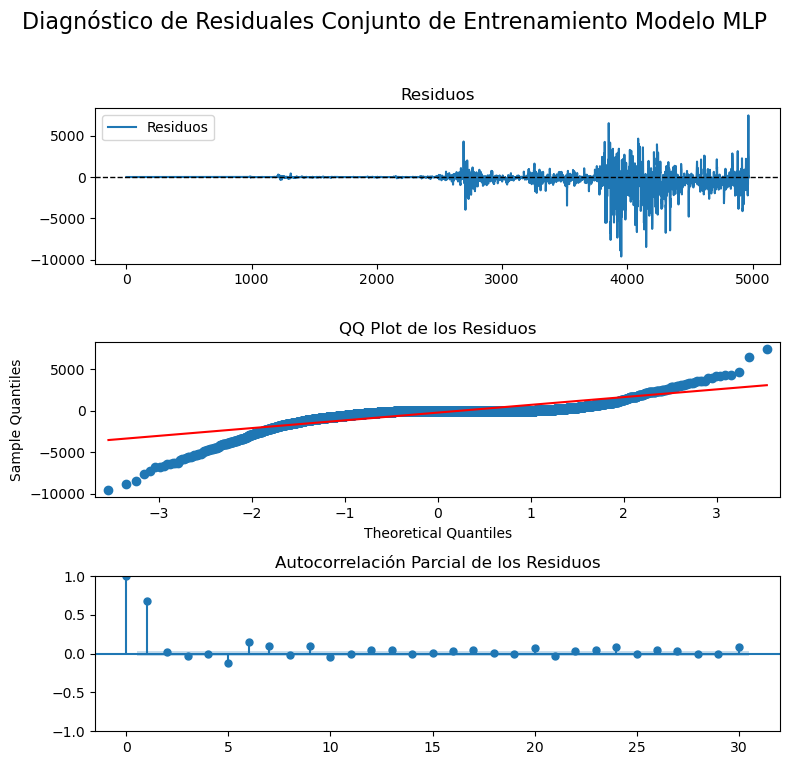

Ljung-Box LB Statistic: 2250.445657
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [207]:
ljung_box_pval_MLP_train7, jarque_bera_pval_MLP_train7 = diagnostic_plots(y_train_price7, train_preds_price_MLP7)

In [208]:
#calcular las métricas 
metrica_price_MLP_train = metricas(y_train_price7,train_preds_price_MLP7)
metrica_price_MLP_train.index = metrica_price_MLP_train.index.map({0: 'MLP Entrenamiento Price τ = 7'})
metrica_price_MLP_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train7], index=metrica_price_MLP_train.index)
metrica_price_MLP_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train7], index=metrica_price_MLP_train.index)
metrica_price_MLP_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Price τ = 7,4.5824e+09,9.01%,416.59,921829.51,99.62%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [209]:
ljung_box_pvalMLP7, jarque_bera_pvalMLP7 = evaluate_residuals(data_test_plot_price7, test_preds_price_MLP7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [210]:
metrica_MLP7_test = metricas(y_test_price7,test_preds_price_MLP7)
metrica_MLP7_test.index = metrica_MLP7_test.index.map({0: 'MLP Prueba Price τ = 7'})
metrica_MLP7_test['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP7], index=metrica_MLP7_test.index)
metrica_MLP7_test['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP7], index=metrica_MLP7_test.index)
metrica_MLP7_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Price τ = 7,9.6041e+07,4.17%,2851.11,1.3720e+07,-125.85%,0.314,0.6674


* **Curva Runs vs Error/Score :**

In [211]:
plot_best_model_validation_loss(history_price_MPL7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [212]:
errores_plots(y_train_price7, train_preds_price_MLP7, y_val_price7, val_preds_price_MLP7, y_test_price7, test_preds_price_MLP7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 14 días ($\tau=14$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [213]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(14,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [20], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_price14, y_train_price14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   6.3s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   7.0s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   7.2s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   7.4s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=  11.4s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  15.8s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  13.8s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  13.3s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  21.2s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  21.4s
[CV] END ...activation=relu, epochs=100, learning_rate=0.001; total time=  21.2s
[CV] END ...activation=relu, epochs=100, learning

A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(14,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 14 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [214]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP14 = build_models_mlp(input_shape14, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 14)]              0         
                                                                 
 dense_72 (Dense)            (None, 32)                480       
                                                                 
 dense_73 (Dense)            (None, 16)                528       
                                                                 
 dense_74 (Dense)            (None, 16)                272       
                                                                 
 dropout_18 (Dropout)        (None, 16)                0         
                                                                 
 dense_75 (Dense)            (None, 1)                 17        
                                                                 
Total params: 1,297


Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [215]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights_at = os.path.join('keras_models', 'PRSA_data_price_MLP14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14 = ModelCheckpoint(save_weights_at, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP14`. 

In [216]:
import os
from joblib import dump, load

history_price_MPL14 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP14):
    filename = f'history_price_MPL14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_price14, y=y_train_price14, batch_size=16, epochs=100, 
                                  verbose=2, callbacks=[save_best14], validation_data=(X_val_price14, y_val_price14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_price_MPL14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_price_MPL14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL14_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [217]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_price_MLP14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model14 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model14 = load_model(best_model_path)  # Cargar el modelo

    if best_model14 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_price_MLP14_weights.52-626.2623.keras con val_loss: 626.2623


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [218]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [219]:
# Predicciones usando el mejor modelo
if best_model14 is not None:

    train_preds_price_MLP14 = best_model14.predict(X_train_price14)
    val_preds_price_MLP14 = best_model14.predict(X_val_price14)
    test_preds_price_MLP14 = best_model14.predict(X_test_price14)


    # Aplanar las predicciones si es necesario
    train_preds_price_MLP14 = np.squeeze(train_preds_price_MLP14)
    val_preds_price_MLP14 = np.squeeze(val_preds_price_MLP14)
    test_preds_price_MLP14 = np.squeeze(test_preds_price_MLP14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_price_MLP14)
    print("Predicciones de validación:", val_preds_price_MLP14)
    print("Predicciones de prueba:", test_preds_price_MLP14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [9.0316725e-01 9.0316725e-01 9.0316725e-01 ... 4.4856195e+04 4.6219316e+04
 4.7600551e+04]
Predicciones de validación: [48279.617 49634.098 50278.44  51306.207 52084.176 52479.434 52224.63
 52551.027 52494.598 52203.816 52493.336 51601.45  51266.312 51471.566]
Predicciones de prueba: [51691.61  53216.31  55726.504 59792.12  61614.906 62616.48  63433.277
 63773.684 66592.45  65789.625 65850.83  66823.67  68625.36  68518.266]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 14 días ($\tau = 14$). 

In [220]:
data_train_plot_price14, data_val_plot_price14, data_test_plot_price14 = data_plot(df_1_st['Price'], 14)

Datos de entrenamiento:
4998        0.1
4997        0.1
4996        0.1
4995        0.1
4994        0.1
         ...   
32      51858.2
31      51320.4
30      50740.5
29      51571.6
28      51722.7
Name: Price, Length: 4971, dtype: float6414

Datos de validación:
27    54495.1
26    57056.2
25    62467.6
24    61169.3
23    62397.7
22    61994.5
21    63135.8
20    68270.1
19    63792.6
18    66080.4
17    66855.3
16    68172.0
15    68366.5
14    68964.8
Name: Price, dtype: float6414

Datos de prueba:
13    72099.1
12    71470.2
11    73066.3
10    71387.5
9     69463.7
8     65314.2
7     68391.2
6     67594.1
5     62050.0
4     67854.0
3     65503.8
2     63785.5
1     64037.8
0     67211.9
Name: Price, dtype: float6414


In [221]:
plot_model(data_train_plot_price14[-100:], data_val_plot_price14, data_test_plot_price14, val_preds_price_MLP14, test_preds_price_MLP14, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

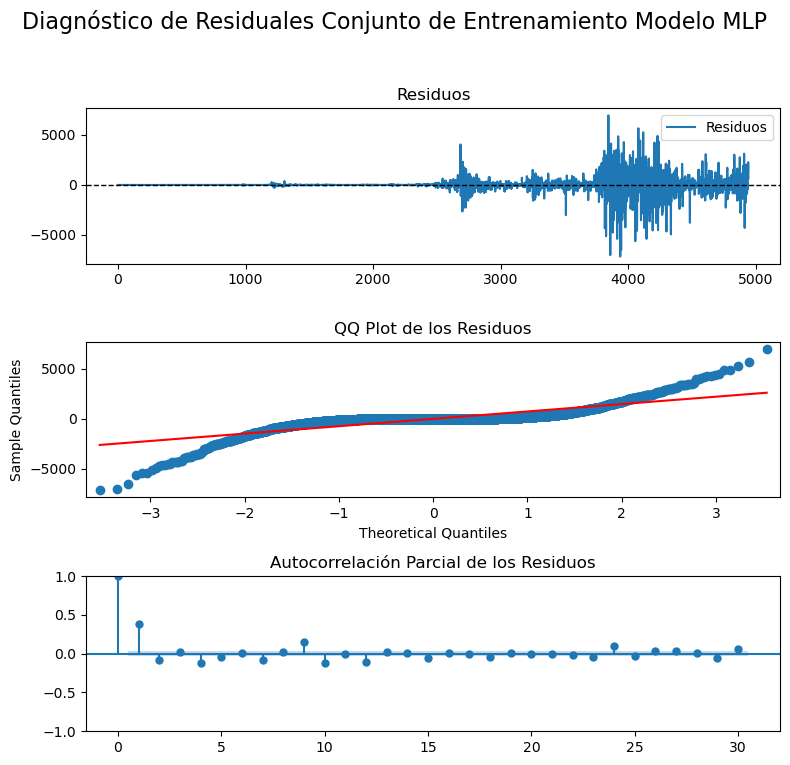

Ljung-Box LB Statistic: 717.340325
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [222]:
ljung_box_pval_MLP_train14, jarque_bera_pval_MLP_train14 = diagnostic_plots(y_train_price14, train_preds_price_MLP14)

In [223]:
#calcular las métricas 
metrica_price_MLP_train14 = metricas(y_train_price14,train_preds_price_MLP14)
metrica_price_MLP_train14.index = metrica_price_MLP_train14.index.map({0: 'MLP Entrenamiento Price τ = 14'})
metrica_price_MLP_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train14], index=metrica_price_MLP_train14.index)
metrica_price_MLP_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train14], index=metrica_price_MLP_train14.index)
metrica_price_MLP_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Price τ = 14,2.6896e+09,24.8%,302.87,544131.26,99.77%,5.0699e-158,0.0


* **Conjunto de datos de Prueba:**

In [224]:
ljung_box_pvalMLP14, jarque_bera_pvalMLP14 = evaluate_residuals(data_test_plot_price14, test_preds_price_MLP14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [225]:
metrica_MLP14_test = metricas(y_test_price14,test_preds_price_MLP14)
metrica_MLP14_test.index = metrica_MLP14_test.index.map({0: 'MLP Prueba Price τ = 14'})
metrica_MLP14_test['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP14], index=metrica_MLP14_test.index)
metrica_MLP14_test['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP14], index=metrica_MLP14_test.index)
metrica_MLP14_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Price τ = 14,1.0227e+08,3.11%,1936.37,7.3047e+06,58.69%,0.0022,0.5157


* **Curva Runs vs Error/Score :**

In [226]:
plot_best_model_validation_loss(history_price_MPL14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [227]:
errores_plots(y_train_price14, train_preds_price_MLP14, y_val_price14, val_preds_price_MLP14, y_test_price14, test_preds_price_MLP14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 21 días ($\tau=21$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [228]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(21,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [20], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_price21, y_train_price21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   5.8s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   5.9s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   6.0s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   6.2s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   6.2s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  14.3s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  14.4s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  14.5s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  13.3s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  13.3s
[CV] END ...activation=relu, epochs=100, learning_rate=0.001; total time=  21.2s
[CV] END ...activation=relu, epochs=100, learning

A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(21,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 21 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [229]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP21 = build_models_mlp(input_shape21, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_36 (InputLayer)       [(None, 21)]              0         
                                                                 
 dense_140 (Dense)           (None, 32)                704       
                                                                 
 dense_141 (Dense)           (None, 16)                528       
                                                                 
 dense_142 (Dense)           (None, 16)                272       
                                                                 
 dropout_35 (Dropout)        (None, 16)                0         
                                                                 
 dense_143 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,521


Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [230]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights_at = os.path.join('keras_models', 'PRSA_data_price_MLP21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21 = ModelCheckpoint(save_weights_at, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP21`. 

In [231]:
import os
from joblib import dump, load

history_price_MPL21 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP21):
    filename = f'history_price_MPL21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_price21, y=y_train_price21, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best21], validation_data=(X_val_price21, y_val_price21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_price_MPL21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_price_MPL21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL21_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [232]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_price_MLP21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model21 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model21 = load_model(best_model_path)  # Cargar el modelo

    if best_model21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_price_MLP21_weights.74-805.9489.keras con val_loss: 805.9489


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [233]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [234]:
# Predicciones usando el mejor modelo
if best_model21 is not None:
    train_preds_price_MLP21 = best_model21.predict(X_train_price21)
    val_preds_price_MLP21 = best_model21.predict(X_val_price21)
    test_preds_price_MLP21 = best_model21.predict(X_test_price21)

    # Aplanar las predicciones si es necesario
    train_preds_price_MLP21 = np.squeeze(train_preds_price_MLP21)
    val_preds_price_MLP21 = np.squeeze(val_preds_price_MLP21)
    test_preds_price_MLP21 = np.squeeze(test_preds_price_MLP21)

    # Imprimir las predicciones
    print('Predicciones de entrenamiento', train_preds_price_MLP21)
    print("Predicciones de validación:", val_preds_price_MLP21)
    print("Predicciones de prueba:", test_preds_price_MLP21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 11ms/step
Predicciones de entrenamiento [1.5229378e+00 1.5229378e+00 1.5229378e+00 ... 4.2924215e+04 4.2262543e+04
 4.1566129e+04]
Predicciones de validación: [41704.48  40374.72  40553.37  40431.52  40874.7   41290.66  41634.316
 42386.434 42852.22  43141.98  43072.465 42889.33  43407.887 43727.613
 43108.15  43252.324 43299.793 43985.02  44776.555 46131.29  47446.04 ]
Predicciones de prueba: [48048.016 49294.535 49790.19  50791.574 51835.637 52354.637 52377.98
 52371.832 52418.26  52376.26  52182.14  52175.594 51477.582 51876.45
 51790.66  53357.36  55565.69  59479.4   61246.395 61904.973 62264.824]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 21 días ($\tau = 21$). 

In [235]:
data_train_plot_price21, data_val_plot_price21, data_test_plot_price21 = data_plot(df_1_st['Price'], 21)

Datos de entrenamiento:
4998        0.1
4997        0.1
4996        0.1
4995        0.1
4994        0.1
         ...   
46      44339.8
45      45293.3
44      47127.5
43      47758.2
42      48277.3
Name: Price, Length: 4957, dtype: float6421

Datos de validación:
41    49941.3
40    49716.0
39    51782.4
38    51901.3
37    52134.2
36    51646.0
35    52117.5
34    51783.6
33    52263.5
32    51858.2
31    51320.4
30    50740.5
29    51571.6
28    51722.7
27    54495.1
26    57056.2
25    62467.6
24    61169.3
23    62397.7
22    61994.5
21    63135.8
Name: Price, dtype: float6421

Datos de prueba:
20    68270.1
19    63792.6
18    66080.4
17    66855.3
16    68172.0
15    68366.5
14    68964.8
13    72099.1
12    71470.2
11    73066.3
10    71387.5
9     69463.7
8     65314.2
7     68391.2
6     67594.1
5     62050.0
4     67854.0
3     65503.8
2     63785.5
1     64037.8
0     67211.9
Name: Price, dtype: float6421


In [236]:
plot_model(data_train_plot_price21[-100:], data_val_plot_price21, data_test_plot_price21, val_preds_price_MLP21, test_preds_price_MLP21, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

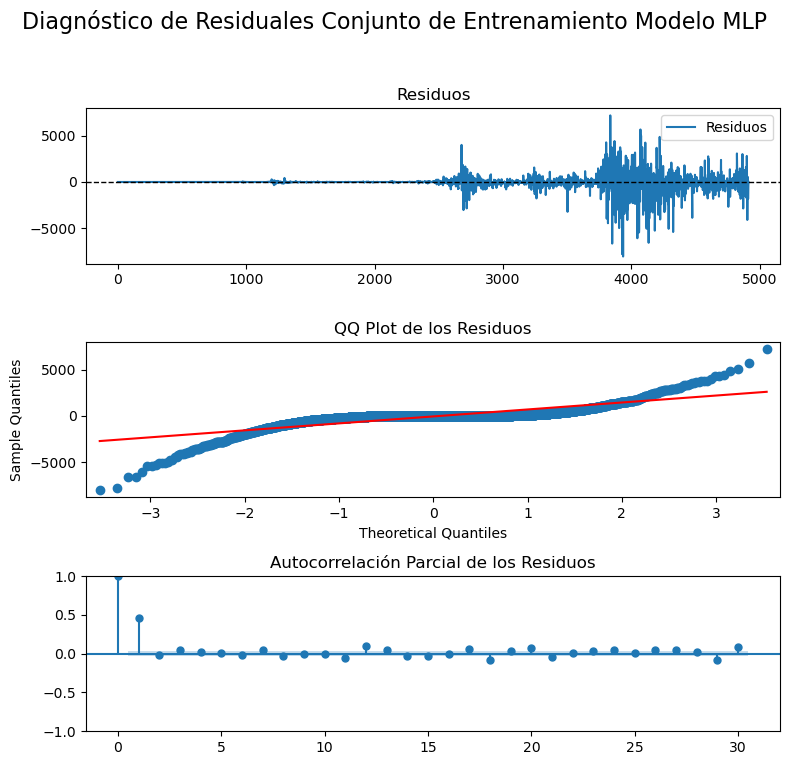

Ljung-Box LB Statistic: 1009.438215
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [237]:
ljung_box_pval_MLP_train21, jarque_bera_pval_MLP_train21 = diagnostic_plots(y_train_price21, train_preds_price_MLP21)

In [238]:
#calcular las métricas 
metrica_price_MLP_train21 = metricas(y_train_price21,train_preds_price_MLP21)
metrica_price_MLP_train21.index = metrica_price_MLP_train21.index.map({0: 'MLP Entrenamiento Price τ = 21'})
metrica_price_MLP_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train21], index=metrica_price_MLP_train21.index)
metrica_price_MLP_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train21], index=metrica_price_MLP_train21.index)
metrica_price_MLP_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Price τ = 21,2.8020e+09,40.45%,311.4,570097.46,99.75%,1.5950e-221,0.0


* **Conjunto de datos de Prueba:**

In [239]:
ljung_box_pvalMLP21, jarque_bera_pvalMLP21 = evaluate_residuals(data_test_plot_price21, test_preds_price_MLP21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [240]:
metrica_MLP21_test = metricas(y_test_price21,test_preds_price_MLP21)
metrica_MLP21_test.index = metrica_MLP21_test.index.map({0: 'MLP Prueba Price τ = 21'})
metrica_MLP21_test['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP21], index=metrica_MLP21_test.index)
metrica_MLP21_test['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP21], index=metrica_MLP21_test.index)
metrica_MLP21_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Price τ = 21,8.6674e+07,2.34%,1314.14,4.1273e+06,80.51%,0.0002,0.1965


* **Curva Runs vs Error/Score :**

In [241]:
plot_best_model_validation_loss(history_price_MPL21)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [242]:
errores_plots(y_train_price21, train_preds_price_MLP21, y_val_price21, val_preds_price_MLP21, y_test_price21, test_preds_price_MLP21)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. Sin embargo el modelo muestra un buen desempeño con la unica limitante que los residuales presentan correlación, por tanto, no es confiable.  


##### Horizonte de 28 días ($\tau=28$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [243]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(28,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [100], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_price28, y_train_price28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   5.2s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   5.3s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   5.5s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   5.5s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   5.7s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  11.9s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  12.9s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  12.6s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  12.8s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  20.9s
[CV] END ...activation=relu, epochs=100, learning_rate=0.001; total time=  21.8s
[CV] END ...activation=relu, epochs=100, learning

A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(28,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 28 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [244]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP28 = build_models_mlp(input_shape28, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_53 (InputLayer)       [(None, 28)]              0         
                                                                 
 dense_208 (Dense)           (None, 32)                928       
                                                                 
 dense_209 (Dense)           (None, 16)                528       
                                                                 
 dense_210 (Dense)           (None, 16)                272       
                                                                 
 dropout_52 (Dropout)        (None, 16)                0         
                                                                 
 dense_211 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,745


----------------------------------------
Modelo con 10 neuronas y dropout 0.4:
Model: "model_53"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_54 (InputLayer)       [(None, 28)]              0         
                                                                 
 dense_212 (Dense)           (None, 32)                928       
                                                                 
 dense_213 (Dense)           (None, 16)                528       
                                                                 
 dense_214 (Dense)           (None, 16)                272       
                                                                 
 dropout_53 (Dropout)        (None, 16)                0         
                                                                 
 dense_215 (Dense)           (None, 1)                 17        
                                             

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [245]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights_at = os.path.join('keras_models', 'PRSA_data_price_MLP28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28 = ModelCheckpoint(save_weights_at, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP28`. 

In [246]:
import os
from joblib import dump, load

history_price_MPL28 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP28):
    filename = f'history_price_MPL28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_price28, y=y_train_price28, batch_size=16, epochs=100,  #Las epocas son las estimadas en el grid search
                                  verbose=2, callbacks=[save_best28], validation_data=(X_val_price28, y_val_price28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_price_MPL28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_price_MPL28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_MPL28_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [247]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_price_MLP28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model28 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model28 = load_model(best_model_path)  # Cargar el modelo

    if best_model28 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_price_MLP28_weights.17-1019.2816.keras con val_loss: 1019.2816


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [248]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [249]:
# Predicciones usando el mejor modelo
if best_model28 is not None:
    train_preds_price_MLP28 = best_model28.predict(X_train_price28)
    val_preds_price_MLP28 = best_model28.predict(X_val_price28)
    test_preds_price_MLP28 = best_model28.predict(X_test_price28)

    # Aplanar las predicciones si es necesario
    train_preds_price_MLP28 = np.squeeze(train_preds_price_MLP28)
    val_preds_price_MLP28 = np.squeeze(val_preds_price_MLP28)
    test_preds_price_MLP28 = np.squeeze(test_preds_price_MLP28)

    # Imprimir las predicciones
    print("Predicciones de entrenamiento:", train_preds_price_MLP28)
    print("Predicciones de validación:", val_preds_price_MLP28)
    print("Predicciones de prueba:", test_preds_price_MLP28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 7ms/step
Predicciones de entrenamiento: [3.0964053e-01 3.0964053e-01 3.0964053e-01 ... 4.3267039e+04 4.2537688e+04
 4.2393188e+04]
Predicciones de validación: [42475.094 43321.85  44164.906 44205.18  43593.75  43815.117 43759.504
 43884.375 45899.92  46405.082 45573.586 45852.36  45133.43  43342.723
 42550.6   44133.246 43827.867 42810.008 42008.35  41694.617 42095.5
 41638.273 41023.477 40232.953 39788.406 40017.9   40913.023 41272.273]
Predicciones de prueba: [41749.516 41569.277 42501.797 42760.73  41647.336 42642.383 44055.54
 43399.75  43337.312 43218.637 42880.406 44375.57  45780.65  47243.31
 47328.832 48313.65  49592.38  50884.    51286.92  52384.156 51499.492
 51900.83  52274.92  52306.23  52539.137 52480.887 51751.715 52079.617]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [250]:
data_train_plot_price28, data_val_plot_price28 , data_test_plot_price28 = data_plot(df_1_st['Price'], 28)

Datos de entrenamiento:
4998        0.1
4997        0.1
4996        0.1
4995        0.1
4994        0.1
         ...   
60      40086.0
59      39935.7
58      41811.3
57      42120.9
56      42030.7
Name: Price, Length: 4943, dtype: float6428

Datos de validación:
55    43299.8
54    42946.2
53    42580.5
52    43081.4
51    43194.7
50    43005.7
49    42581.4
48    42697.2
47    43087.7
46    44339.8
45    45293.3
44    47127.5
43    47758.2
42    48277.3
41    49941.3
40    49716.0
39    51782.4
38    51901.3
37    52134.2
36    51646.0
35    52117.5
34    51783.6
33    52263.5
32    51858.2
31    51320.4
30    50740.5
29    51571.6
28    51722.7
Name: Price, dtype: float6428

Datos de prueba:
27    54495.1
26    57056.2
25    62467.6
24    61169.3
23    62397.7
22    61994.5
21    63135.8
20    68270.1
19    63792.6
18    66080.4
17    66855.3
16    68172.0
15    68366.5
14    68964.8
13    72099.1
12    71470.2
11    73066.3
10    71387.5
9     69463.7
8     65314.2
7     68391.2


In [251]:
plot_model(data_train_plot_price28[-100:], data_val_plot_price28, data_test_plot_price28, val_preds_price_MLP28, test_preds_price_MLP28, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

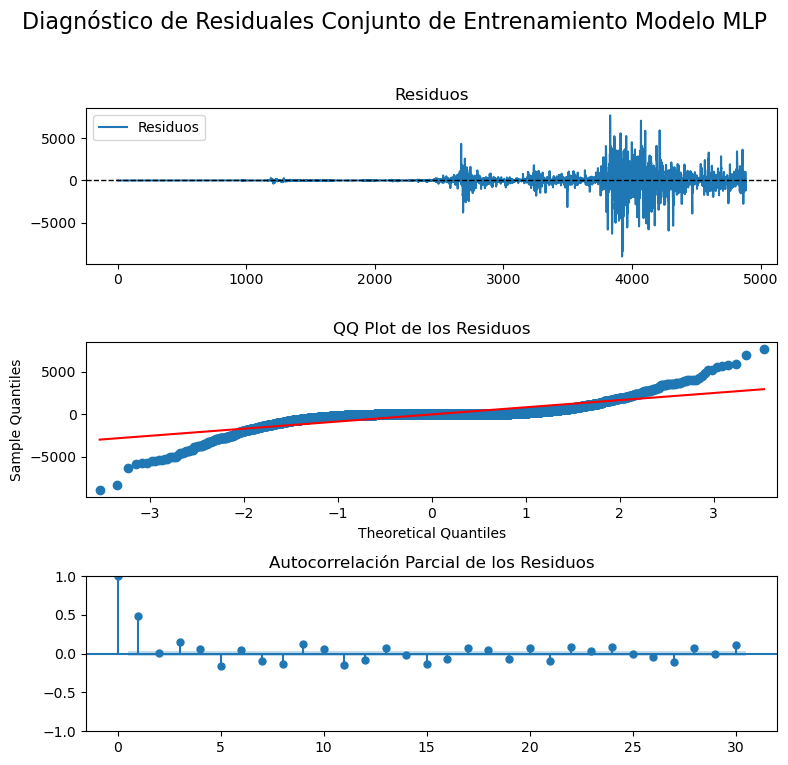

Ljung-Box LB Statistic: 1124.660608
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [252]:
ljung_box_pval_MLP_train28, jarque_bera_pval_MLP_train28 = diagnostic_plots(y_train_price28, train_preds_price_MLP28)

In [253]:
#calcular las métricas 
metrica_price_MLP_train28 = metricas(y_train_price28,train_preds_price_MLP28)
metrica_price_MLP_train28.index = metrica_price_MLP_train28.index.map({0: 'MLP Entrenamiento Price τ = 28'})
metrica_price_MLP_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train28], index=metrica_price_MLP_train28.index)
metrica_price_MLP_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train28], index=metrica_price_MLP_train28.index)
metrica_price_MLP_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Price τ = 28,3.4518e+09,8.41%,348.66,706317.16,99.69%,1.4424e-246,0.0


* **Conjunto de datos de Prueba:**

In [254]:
ljung_box_pvalMLP28, jarque_bera_pvalMLP28 = evaluate_residuals(data_test_plot_price28, test_preds_price_MLP28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [255]:
metrica_MLP28_test = metricas(y_test_price28,test_preds_price_MLP28)
metrica_MLP28_test.index = metrica_MLP28_test.index.map({0: 'MLP Prueba Price τ = 28'})
metrica_MLP28_test['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP28], index=metrica_MLP28_test.index)
metrica_MLP28_test['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP28], index=metrica_MLP28_test.index)
metrica_MLP28_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Price τ = 28,5.0452e+07,2.29%,1087.84,1.8018e+06,88.21%,5.4064e-05,0.3951


* **Curva Runs vs Error/Score :**

In [256]:
plot_best_model_validation_loss(history_price_MPL28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [257]:
errores_plots(y_train_price28, train_preds_price_MLP28, y_val_price28, val_preds_price_MLP28, y_test_price28, test_preds_price_MLP28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. Sin embargo el modelo muestra un buen desempeño con la unica limitante que los residuales presentan correlación, por tanto, no es confiable.  


#### <font color="#30143">Price: Memoria a Corto y Largo Plazo (LSTM) </font>

Ya definimos los `regresores`(`X`) y la `variable objetivo`(`y`) para el proceso de entrenamiento y validación en la selección correspondiente al modelo `Perceptrones Multicapa` a tráves de la función `create_time_series_datasets()`, sin embargo, ésta se utiliza para generar arreglos `2D` de forma (números de muestras, números de paso de tiempo). Dado que la entrada a las capas de una `RNN` debe ser de forma: número de muestras, número de paso de tiempo, número de características por paso de tiempo; procedemos con la sefinición de la función `change_dimension_lstm()` para realizar la transformación de 2D a 3D. 

In [258]:
def change_dimension_lstm(X_train, X_val, X_test): 

    X_train_lstm, X_val_lstm, X_test_lstm = X_train.reshape((X_train.shape[0], X_train.shape[1], 1)), X_val.reshape((X_val.shape[0], X_val.shape[1], 1)), X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
    print('Shape of 3D arrays X:', X_train_lstm.shape, X_val_lstm.shape,  X_test_lstm.shape)

    return X_train_lstm, X_val_lstm, X_test_lstm

##### Horizonte de 7 días ($\tau=7$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [259]:
X_train_price_lstm_7, X_val_price_lstm_7, X_test_price_lstm_7 = change_dimension_lstm(X_train_price7, X_val_price7, X_test_price7)

Shape of 3D arrays X: (4971, 7, 1) (7, 7, 1) (7, 7, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [260]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(7,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['sigmoid'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_price_lstm_7, y_train_price7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END .......activation=sigmoid, epochs=20, optimizer=SGD; total time=  18.3s
[CV] END .......activation=sigmoid, epochs=20, optimizer=SGD; total time=  18.4s
[CV] END .......activation=sigmoid, epochs=20, optimizer=SGD; total time=  18.3s
[CV] END .......activation=sigmoid, epochs=20, optimizer=SGD; total time=  18.4s
[CV] END .......activation=sigmoid, epochs=20, optimizer=SGD; total time=  18.4s
Mejor función de activación: sigmoid
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 10334.664335330024


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A continuación se define `función buil_models_lstm` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

In [261]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.models import Model

def build_models_lstm(input_shape, neurons_list, dropout_rates, optimizer):
    models = []
    for neurons in neurons_list:
        for dropout in dropout_rates:
            input_layer_lstm = Input(shape=(input_shape,1), dtype='float32')
            lstm_layer1 = LSTM(64, return_sequences=True)(input_layer_lstm)
            lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)  
            dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
            output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
            
            # Crear el modelo
            ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)

            
            # Compilar el modelo
            learning_rate = 0.001  # Ajusta este valor según tus necesidades
            optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate)
            ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer) #SGD(lr=0.001, decay=1e-5))
            ts_model_lstm.summary()
                        
            # Guardar el modelo en la lista
            models.append(ts_model_lstm)
            
            # Mostrar un resumen del modelo
            print(f'Modelo con {neurons} neuronas y dropout {dropout}:')
            ts_model_lstm.summary()
            print('-' * 40)
    
    return models

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [262]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM7 = build_models_lstm(input_shape7, neurons_list, dropout_rates ,'SGD')

Model: "model_69"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_70 (InputLayer)       [(None, 7, 1)]            0         
                                                                 
 lstm_2 (LSTM)               (None, 7, 64)             16896     
                                                                 
 lstm_3 (LSTM)               (None, 32)                12416     
                                                                 
 dropout_69 (Dropout)        (None, 32)                0         
                                                                 
 dense_273 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_69

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [263]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights_at = os.path.join('keras_models', 'PRSA_data_price_LSTM_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_lstm = ModelCheckpoint(save_weights_at, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [264]:
import os
from joblib import dump, load

history_price_LSTM7 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM7):
    filename = f'history_price_LSTM_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_price_lstm_7, y=y_train_price7, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best7_lstm], validation_data=(X_val_price_lstm_7, y_val_price7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_price_LSTM7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_price_LSTM_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM_model_9.joblib' ya existe. Se ha 

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [265]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_price_LSTM_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best7_lstm = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best7_lstm = load_model(best_model_path)  # Cargar el modelo

    if best7_lstm is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_price_LSTM_weights.20-67005.9609.keras con val_loss: 67005.9609


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [266]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [267]:
# Predicciones usando el mejor modelo
if best7_lstm is not None:
 
    train_preds_price_LSTM7 = best7_lstm.predict(X_train_price_lstm_7)
    val_preds_price_LSTM7 = best7_lstm.predict(X_val_price_lstm_7)
    test_preds_price_LSTM7 = best7_lstm.predict(X_test_price_lstm_7)

    # Aplanar las predicciones si es necesario
    train_preds_price_LSTM7 = np.squeeze(train_preds_price_LSTM7)
    val_preds_price_LSTM7 = np.squeeze(val_preds_price_LSTM7)
    test_preds_price_LSTM7 = np.squeeze(test_preds_price_LSTM7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_price_LSTM7)
    print("Predicciones de validación:", val_preds_price_LSTM7)
    print("Predicciones de prueba:", test_preds_price_LSTM7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [1.6297626e-01 1.6297626e-01 1.6297626e-01 ... 2.0855881e+02 2.0855881e+02
 2.0855881e+02]
Predicciones de validación: [208.5588 208.5588 208.5588 208.5588 208.5588 208.5588 208.5588]
Predicciones de prueba: [208.5588 208.5588 208.5588 208.5588 208.5588 208.5588 208.5588]


In [268]:
plot_model(data_train_plot_price7[-100:], data_val_plot_price7, data_test_plot_price7, val_preds_price_LSTM7, test_preds_price_LSTM7, "Predicciones usando Memoria a Corto y Largo Paso (LSTM) para un horizonte de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

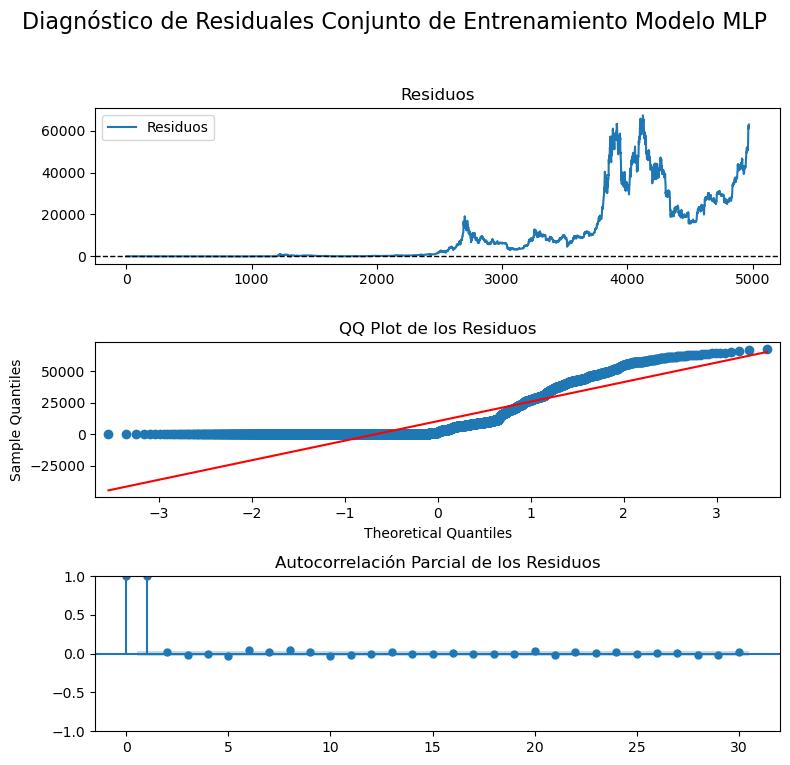

Ljung-Box LB Statistic: 4952.809205
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [269]:
ljung_box_pval_LSTM_train7, jarque_bera_pval_LSTM_train7 = diagnostic_plots(y_train_price7, train_preds_price_LSTM7)

In [270]:
#calcular las métricas 
metrica_price_LSTM_train = metricas(y_train_price7,train_preds_price_LSTM7)
metrica_price_LSTM_train.index = metrica_price_LSTM_train.index.map({0: 'LSTM Entrenamiento Price τ = 7'})
metrica_price_LSTM_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train7], index=metrica_price_LSTM_train.index)
metrica_price_LSTM_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train7], index=metrica_price_LSTM_train.index)
metrica_price_LSTM_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Price τ = 7,1.7288e+12,65.34%,10422.74,3.4777e+08,-44.87%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [271]:
ljung_box_pvalLSTM7, jarque_bera_pvalLSTM7 = evaluate_residuals(data_test_plot_price7, test_preds_price_LSTM7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [272]:
metrica_LSTM_test = metricas(y_test_price7,test_preds_price_LSTM7)
metrica_LSTM_test.index = metrica_LSTM_test.index.map({0: 'LSTM Prueba Price τ = 7'})
metrica_LSTM_test['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM7], index=metrica_LSTM_test.index)
metrica_LSTM_test['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM7], index=metrica_LSTM_test.index)
metrica_LSTM_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Price τ = 7,3.4305e+10,99.7%,69961.76,4.9007e+09,-80571.1%,0.0894,0.7343


* **Curva Runs vs Error/Score :**

In [273]:
plot_best_model_validation_loss(history_price_LSTM7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [274]:
errores_plots(y_train_price7, train_preds_price_LSTM7, y_val_price7, val_preds_price_LSTM7, y_test_price7, test_preds_price_LSTM7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 14 días ($\tau=14$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [275]:
X_train_price_lstm_14, X_val_price_lstm_14, X_test_price_lstm_14 = change_dimension_lstm(X_train_price14, X_val_price14, X_test_price14)

Shape of 3D arrays X: (4943, 14, 1) (14, 14, 1) (14, 14, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [276]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(14,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_price_lstm_14, y_train_price14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.9s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  29.1s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 10245.357991715211


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [277]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM14 = build_models_lstm(input_shape14, neurons_list, dropout_rates, 'SGD')

Model: "model_86"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_87 (InputLayer)       [(None, 14, 1)]           0         
                                                                 
 lstm_36 (LSTM)              (None, 14, 64)            16896     
                                                                 
 lstm_37 (LSTM)              (None, 32)                12416     
                                                                 
 dropout_86 (Dropout)        (None, 32)                0         
                                                                 
 dense_290 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_86

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [278]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights_at = os.path.join('keras_models', 'PRSA_data_price_LSTM14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_lstm = ModelCheckpoint(save_weights_at, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [279]:
import os
from joblib import dump, load

history_price_LSTM14 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM14):
    filename = f'history_price_LSTM14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_price_lstm_14, y=y_train_price14, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best14_lstm], validation_data=(X_val_price_lstm_14, y_val_price14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_price_LSTM14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_price_LSTM14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM14_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [280]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_price_LSTM14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best14_lstm = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best14_lstm = load_model(best_model_path)  # Cargar el modelo

    if best14_lstm is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_price_LSTM14_weights.20-51256.7266.keras con val_loss: 51256.7266


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [281]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [282]:
# Predicciones usando el mejor modelo
if best14_lstm is not None:

    train_preds_price_LSTM14 = best14_lstm.predict(X_train_price_lstm_14)
    val_preds_price_LSTM14 = best14_lstm.predict(X_val_price_lstm_14)
    test_preds_price_LSTM14 = best14_lstm.predict(X_test_price_lstm_14)

    # Aplanar las predicciones si es necesario
    train_preds_price_LSTM14 = np.squeeze(train_preds_price_LSTM14)
    val_preds_price_LSTM14 = np.squeeze(val_preds_price_LSTM14)
    test_preds_price_LSTM14 = np.squeeze(test_preds_price_LSTM14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_price_LSTM14)
    print("Predicciones de validación:", val_preds_price_LSTM14)
    print("Predicciones de prueba:", test_preds_price_LSTM14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de Entrenamiento: [-7.8990936e-02 -7.8990936e-02 -7.8990936e-02 ...  2.0750458e+02
  2.0750458e+02  2.0750458e+02]
Predicciones de validación: [207.50458 207.50458 207.50458 207.50458 207.50458 207.50458 207.50458
 207.50458 207.50458 207.50458 207.50458 207.50458 207.50458 207.50458]
Predicciones de prueba: [207.50458 207.50458 207.50458 207.50458 207.50458 207.50458 207.50458
 207.50458 207.50458 207.50458 207.50458 207.50458 207.50458 207.50458]


In [283]:
plot_model(data_train_plot_price14[-100:], data_val_plot_price14, data_test_plot_price14, val_preds_price_LSTM14, test_preds_price_LSTM14, "Predicciones usando Memoria a Corto y Largo Paso (LSTM) para un horizonte de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

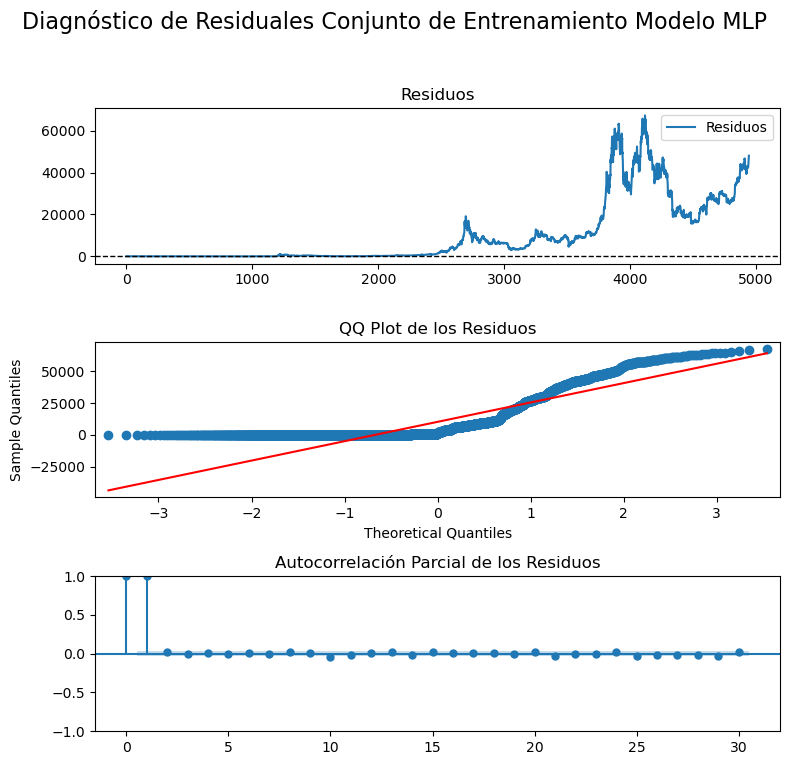

Ljung-Box LB Statistic: 4930.137123
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [284]:
ljung_box_pval_LSTM_train14, jarque_bera_pval_LSTM_train14 = diagnostic_plots(y_train_price14, train_preds_price_LSTM14)

In [285]:
#calcular las métricas 
metrica_price_LSTM_train14 = metricas(y_train_price14,train_preds_price_LSTM14)
metrica_price_LSTM_train14.index = metrica_price_LSTM_train14.index.map({0: 'LSTM Entrenamiento Price τ = 14'})
metrica_price_LSTM_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train14], index=metrica_price_LSTM_train14.index)
metrica_price_LSTM_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train14], index=metrica_price_LSTM_train14.index)
metrica_price_LSTM_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Price τ = 14,1.6667e+12,67.82%,10252.25,3.3718e+08,-44.73%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [286]:
ljung_box_pvalLSTM14, jarque_bera_pvalLSTM14 = evaluate_residuals(data_test_plot_price14, test_preds_price_LSTM14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [287]:
metrica_LSTM_test14 = metricas(y_test_price14,test_preds_price_LSTM14)
metrica_LSTM_test14.index = metrica_LSTM_test14.index.map({0: 'LSTM Prueba Price τ = 7'})
metrica_LSTM_test14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM14], index=metrica_LSTM_test14.index)
metrica_LSTM_test14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM14], index=metrica_LSTM_test14.index)
metrica_LSTM_test14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Price τ = 7,5.6866e+10,99.67%,63593.77,4.0619e+09,-22868.46%,0.0249,0.7014


* **Curva Runs vs Error/Score :**

In [288]:
plot_best_model_validation_loss(history_price_LSTM14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [289]:
errores_plots(y_train_price14, train_preds_price_LSTM14, y_val_price14, val_preds_price_LSTM14, y_test_price14, test_preds_price_LSTM14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 21 días ($\tau=21$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [290]:
X_train_price_lstm_21, X_val_price_lstm_21, X_test_price_lstm_21 = change_dimension_lstm(X_train_price21, X_val_price21, X_test_price21)

Shape of 3D arrays X: (4915, 21, 1) (21, 21, 1) (21, 21, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [291]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(21,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_price_lstm_21, y_train_price21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  37.2s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  37.3s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  37.4s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  37.7s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  38.3s
Mejor función de activación: tanh
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 10191.978701307078


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [292]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM21 = build_models_lstm(input_shape21, neurons_list, dropout_rates, 'SGD')

Model: "model_103"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_104 (InputLayer)      [(None, 21, 1)]           0         
                                                                 
 lstm_70 (LSTM)              (None, 21, 64)            16896     
                                                                 
 lstm_71 (LSTM)              (None, 32)                12416     
                                                                 
 dropout_103 (Dropout)       (None, 32)                0         
                                                                 
 dense_307 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_1

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [293]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights_at = os.path.join('keras_models', 'PRSA_data_price_LSTM21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_lstm = ModelCheckpoint(save_weights_at, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM21`. 

In [294]:
import os
from joblib import dump, load

history_price_LSTM21 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM21):
    filename = f'history_price_LSTM21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_price_lstm_21, y=y_train_price21, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best21_lstm], validation_data=(X_val_price_lstm_21, y_val_price21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_price_LSTM21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_price_LSTM21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM21_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [295]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_price_LSTM21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best21_lstm = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best21_lstm = load_model(best_model_path)  # Cargar el modelo

    if best21_lstm is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_price_LSTM21_weights.20-42874.3555.keras con val_loss: 42874.3555


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [296]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [297]:
# Predicciones usando el mejor modelo
if best21_lstm is not None:

    train_preds_price_LSTM21 = best21_lstm.predict(X_train_price_lstm_21)
    val_preds_price_LSTM21 = best21_lstm.predict(X_val_price_lstm_21)
    test_preds_price_LSTM21 = best21_lstm.predict(X_test_price_lstm_21)

    # Aplanar las predicciones si es necesario
    train_preds_price_LSTM21 = np.squeeze(train_preds_price_LSTM21)
    val_preds_price_LSTM21 = np.squeeze(val_preds_price_LSTM21)
    test_preds_price_LSTM21 = np.squeeze(test_preds_price_LSTM21)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_price_LSTM21)
    print("Predicciones de validación:", val_preds_price_LSTM21)
    print("Predicciones de prueba:", test_preds_price_LSTM21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 16ms/step
Predicciones de Entrenamiento: [6.4779758e-02 6.4779758e-02 6.4779758e-02 ... 2.0661783e+02 2.0661783e+02
 2.0661783e+02]
Predicciones de validación: [206.61783 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783
 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783
 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783]
Predicciones de prueba: [206.61783 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783
 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783
 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783 206.61783]


In [298]:
plot_model(data_train_plot_price21[-100:], data_val_plot_price21, data_test_plot_price21, val_preds_price_LSTM21, test_preds_price_LSTM21, "Predicciones usando Memoria a Corto y Largo Paso (LSTM) para un horizonte de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

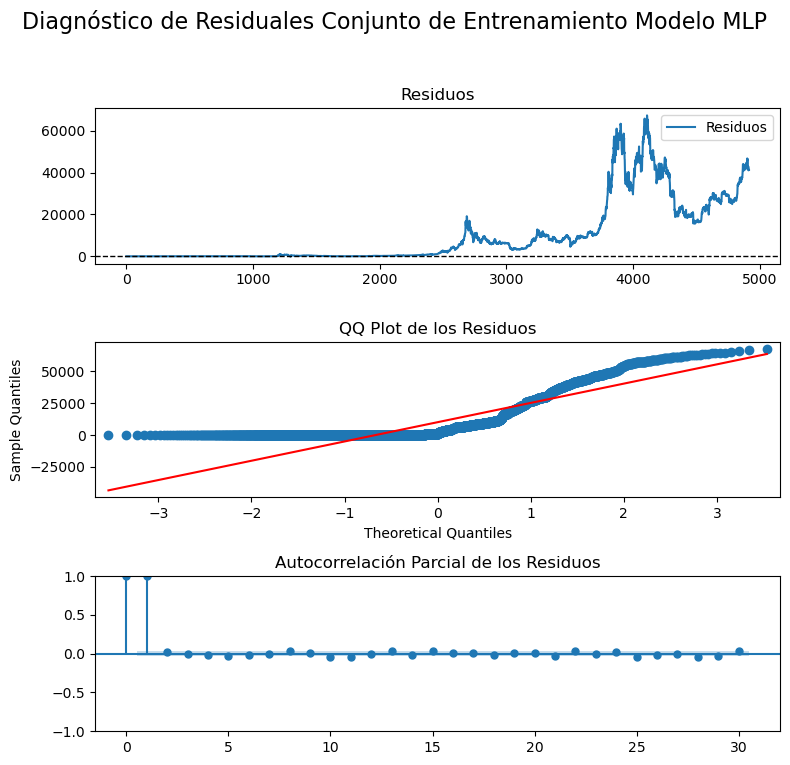

Ljung-Box LB Statistic: 4903.966909
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [299]:
ljung_box_pval_LSTM_train21, jarque_bera_pval_LSTM_train21 = diagnostic_plots(y_train_price21, train_preds_price_LSTM21)

In [300]:
#calcular las métricas 
metrica_price_LSTM_train21 = metricas(y_train_price21,train_preds_price_LSTM21)
metrica_price_LSTM_train21.index = metrica_price_LSTM_train21.index.map({0: 'LSTM Entrenamiento Price τ = 21'})
metrica_price_LSTM_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train21], index=metrica_price_LSTM_train21.index)
metrica_price_LSTM_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train21], index=metrica_price_LSTM_train21.index)
metrica_price_LSTM_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Price τ = 21,1.6280e+12,64.44%,10128.41,3.3124e+08,-44.31%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [301]:
ljung_box_pvalLSTM21, jarque_bera_pvalLSTM21 = evaluate_residuals(data_test_plot_price21, test_preds_price_LSTM21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [302]:
metrica_LSTM_test21 = metricas(y_test_price21,test_preds_price_LSTM21)
metrica_LSTM_test21.index = metrica_LSTM_test21.index.map({0: 'LSTM Prueba Price τ = 21'})
metrica_LSTM_test21['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM21], index=metrica_LSTM_test21.index)
metrica_LSTM_test21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM21], index=metrica_LSTM_test21.index)
metrica_LSTM_test21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Price τ = 21,6.2208e+10,99.62%,54232.21,2.9623e+09,-13890.3%,0.008,0.8356


* **Curva Runs vs Error/Score :**

In [303]:
plot_best_model_validation_loss(history_price_LSTM21)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [304]:
errores_plots(y_train_price21, train_preds_price_LSTM21, y_val_price21, val_preds_price_LSTM21, y_test_price21, test_preds_price_LSTM21)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 28 días ($\tau=28$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [305]:
X_train_price_lstm_28, X_val_price_lstm_28, X_test_price_lstm_28 = change_dimension_lstm(X_train_price28, X_val_price28, X_test_price28)

Shape of 3D arrays X: (4887, 28, 1) (28, 28, 1) (28, 28, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [306]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(28,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_price_lstm_28, y_train_price28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  44.6s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  44.8s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  44.9s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  45.0s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  45.2s
Mejor función de activación: tanh
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 10024.434961059937


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [307]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM28 = build_models_lstm(input_shape28, neurons_list, dropout_rates, 'SGD')

Model: "model_120"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_121 (InputLayer)      [(None, 28, 1)]           0         
                                                                 
 lstm_104 (LSTM)             (None, 28, 64)            16896     
                                                                 
 lstm_105 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_120 (Dropout)       (None, 32)                0         
                                                                 
 dense_324 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_1

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [308]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights_at = os.path.join('keras_models', 'PRSA_data_price_LSTM28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_lstm = ModelCheckpoint(save_weights_at, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM21`. 

In [309]:
import os
from joblib import dump, load

history_price_LSTM28 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM28):
    filename = f'history_price_LSTM28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_price_lstm_28, y=y_train_price28, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best28_lstm], validation_data=(X_val_price_lstm_28, y_val_price28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_price_LSTM28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_price_LSTM28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_price_LSTM28_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [310]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_price_LSTM28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best28_lstm = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best28_lstm = load_model(best_model_path)  # Cargar el modelo

    if best28_lstm is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_price_LSTM28_weights.20-42714.5508.keras con val_loss: 42714.5508


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [311]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [312]:
# Predicciones usando el mejor modelo
if best28_lstm is not None:

    train_preds_price_LSTM28 = best28_lstm.predict(X_train_price_lstm_28)
    val_preds_price_LSTM28 = best28_lstm.predict(X_val_price_lstm_28)
    test_preds_price_LSTM28 = best28_lstm.predict(X_test_price_lstm_28)

    # Aplanar las predicciones si es necesario
    train_preds_price_LSTM28 = np.squeeze(train_preds_price_LSTM28)
    val_preds_price_LSTM28 = np.squeeze(val_preds_price_LSTM28)
    test_preds_price_LSTM28 = np.squeeze(test_preds_price_LSTM28)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_price_LSTM28)
    print("Predicciones de validación:", val_preds_price_LSTM28)
    print("Predicciones de prueba:", test_preds_price_LSTM28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [-3.0216217e-02 -3.0216217e-02 -3.0216217e-02 ...  2.0502954e+02
  2.0502954e+02  2.0502954e+02]
Predicciones de validación: [205.02954 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954
 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954
 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954
 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954]
Predicciones de prueba: [205.02954 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954
 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954
 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954
 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954 205.02954]


In [313]:
plot_model(data_train_plot_price28[-100:], data_val_plot_price28, data_test_plot_price28, val_preds_price_LSTM28, test_preds_price_LSTM28, "Predicciones usando Memoria a Corto y Largo Paso (LSTM) para un horizonte de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

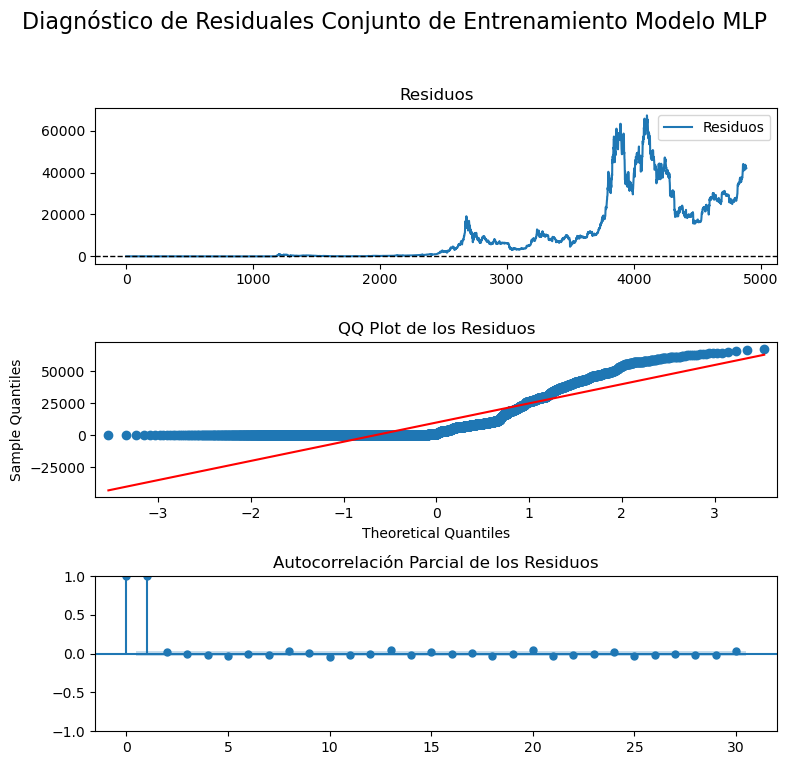

Ljung-Box LB Statistic: 4875.690989
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [314]:
ljung_box_pval_LSTM_train28, jarque_bera_pval_LSTM_train28 = diagnostic_plots(y_train_price28, train_preds_price_LSTM28)

In [315]:
#calcular las métricas 
metrica_price_LSTM_train28 = metricas(y_train_price28,train_preds_price_LSTM28)
metrica_price_LSTM_train28.index = metrica_price_LSTM_train28.index.map({0: 'LSTM Entrenamiento Price τ = 28'})
metrica_price_LSTM_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train28], index=metrica_price_LSTM_train28.index)
metrica_price_LSTM_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train28], index=metrica_price_LSTM_train28.index)
metrica_price_LSTM_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Price τ = 28,1.5885e+12,66.24%,10000.76,3.2505e+08,-43.89%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [316]:
ljung_box_pvalLSTM28, jarque_bera_pvalLSTM28 = evaluate_residuals(data_test_plot_price28, test_preds_price_LSTM28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [317]:
metrica_LSTM_test28 = metricas(y_test_price28,test_preds_price_LSTM28)
metrica_LSTM_test28.index = metrica_LSTM_test28.index.map({0: 'LSTM Prueba Price τ = 28'})
metrica_LSTM_test28['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM28], index=metrica_LSTM_test28.index)
metrica_LSTM_test28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM28], index=metrica_LSTM_test28.index)
metrica_LSTM_test28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Price τ = 28,6.3986e+10,99.57%,47643.9,2.2852e+09,-14852.49%,0.0003,0.427


* **Curva Runs vs Error/Score :**

In [318]:
plot_best_model_validation_loss(history_price_LSTM28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [319]:
errores_plots(y_train_price28, train_preds_price_LSTM28, y_val_price28, val_preds_price_LSTM28, y_test_price28, test_preds_price_LSTM28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


#### <font color="#30143">Retorno Acumulado (A_t): Perceptrones Multicapa (MLP)</font>


##### Horizonte de 7 días ($\tau=7$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [320]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(7,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['sigmoid'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [100], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_at7, y_train_at7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END activation=sigmoid, epochs=100, learning_rate=0.001; total time=  14.3s
[CV] END activation=sigmoid, epochs=100, learning_rate=0.001; total time=  14.4s
[CV] END activation=sigmoid, epochs=100, learning_rate=0.001; total time=  14.5s
[CV] END activation=sigmoid, epochs=100, learning_rate=0.001; total time=  14.6s
[CV] END activation=sigmoid, epochs=100, learning_rate=0.001; total time=  21.1s
Mejor función de activación: sigmoid
Mejor número de epocas: 100
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.5492504566907883


A idexación de parámetros función `build_models` con base a lo indicado en el númeral 3 del parcial práctico. 

In [321]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP7_at = build_models_mlp(input_shape7, neurons_list, dropout_rates, 'sigmoid')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_137"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_138 (InputLayer)      [(None, 7)]               0         
                                                                 
 dense_344 (Dense)           (None, 32)                256       
                                                                 
 dense_345 (Dense)           (None, 16)                528       
                                                                 
 dense_346 (Dense)           (None, 16)                272       
                                                                 
 dropout_137 (Dropout)       (None, 16)                0         
                                                                 
 dense_347 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,073

----------------------------------------
Modelo con 10 neuronas y dropout 0.4:
Model: "model_138"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_139 (InputLayer)      [(None, 7)]               0         
                                                                 
 dense_348 (Dense)           (None, 32)                256       
                                                                 
 dense_349 (Dense)           (None, 16)                528       
                                                                 
 dense_350 (Dense)           (None, 16)                272       
                                                                 
 dropout_138 (Dropout)       (None, 16)                0         
                                                                 
 dense_351 (Dense)           (None, 1)                 17        
                                            

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [322]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_at_MLP7_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_at = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP7`. 

In [323]:
import os
from joblib import dump, load

history_at_MPL7 = []

# Iterar sobre cada modelo en la lista models_MLP7
for i, model in enumerate(models_MLP7_at):
    filename = f'history_at_MPL7_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_at7, y=y_train_at7, batch_size=16, epochs=100, 
                                  verbose=2, callbacks=[save_best7_at], validation_data=(X_val_at7, y_val_at7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_at_MPL7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_at_MPL7_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL7_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL7_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL7_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL7_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL7_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL7_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL7_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL7_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL7_model_9.joblib' ya existe. Se ha cargado el historial del entre

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [324]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_at_MLP7_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model7_at = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model7_at = load_model(best_model_path)  # Cargar el modelo

    if best_model7_at is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_at_MLP7_weights.80-0.0780.keras con val_loss: 0.078


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [325]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [326]:
# Predicciones usando el mejor modelo
if best_model7_at is not None:

    train_preds_at_MLP7 = best_model7_at.predict(X_train_at7)
    val_preds_at_MLP7 = best_model7_at.predict(X_val_at7)
    test_preds_at_MLP7 = best_model7_at.predict(X_test_at7)

    # Aplanar las predicciones si es necesario
    train_preds_at_MLP7 = np.squeeze(train_preds_at_MLP7)
    val_preds_at_MLP7 = np.squeeze(val_preds_at_MLP7)
    test_preds_at_MLP7 = np.squeeze(test_preds_at_MLP7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_at_MLP7)
    print("Predicciones de validación:", val_preds_at_MLP7)
    print("Predicciones de prueba:", test_preds_at_MLP7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [ 1.4620519  1.4620519  1.4620519 ... 23.603428  23.603817  23.600698 ]
Predicciones de validación: [23.588745 23.62459  23.612099 23.621899 23.61894  23.619183 23.645409]
Predicciones de prueba: [23.628016 23.651365 23.654556 23.664265 23.65876  23.641209 23.62173 ]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [327]:
data_train_plot_at7, data_val_plot_at7, data_test_plot_at7 = data_plot(df_1_st['A_t'], 7)

Datos de entrenamiento:
4998     0.0000
4997     0.0000
4996     0.0000
4995     0.0000
4994     0.0000
         ...   
18      23.6804
17      23.6921
16      23.7118
15      23.7147
14      23.7234
Name: A_t, Length: 4985, dtype: float647

Datos de validación:
13    23.7689
12    23.7602
11    23.7825
10    23.7595
9     23.7326
8     23.6728
7     23.7199
Name: A_t, dtype: float647

Datos de prueba:
6    23.7083
5    23.6263
4    23.7198
3    23.6852
2    23.6589
1    23.6629
0    23.7125
Name: A_t, dtype: float647


In [328]:
plot_model(data_train_plot_at7[-100:], data_val_plot_at7, data_test_plot_at7, val_preds_at_MLP7, test_preds_at_MLP7, "Predicciones usando Perceptrón Multicapa (MLP)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

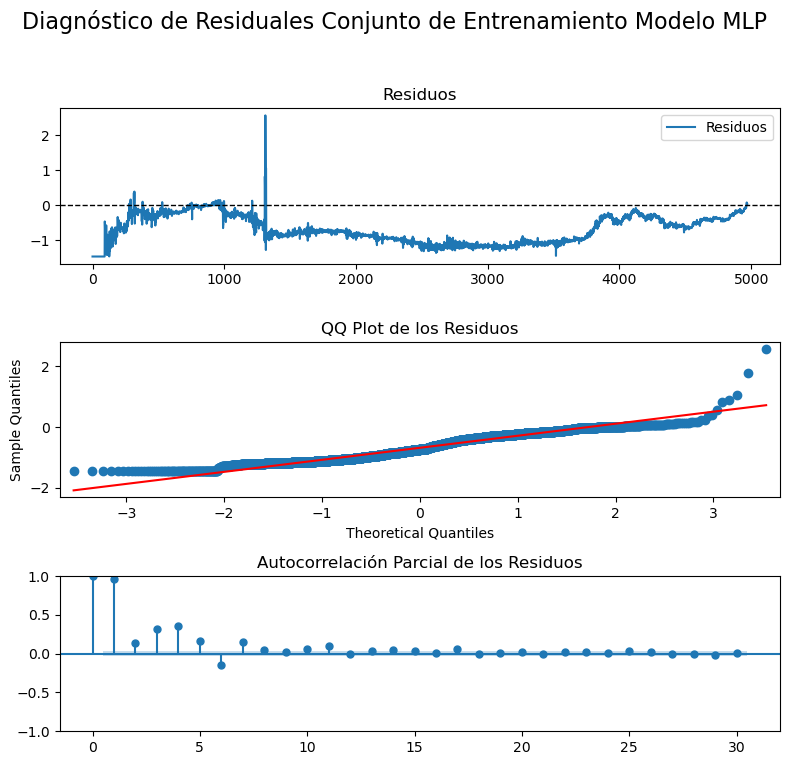

Ljung-Box LB Statistic: 4643.302678
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [329]:
ljung_box_pval_MLP_train7_at, jarque_bera_pval_MLP_train7_at = diagnostic_plots(y_train_at7, train_preds_at_MLP7)

In [330]:
#calcular las métricas 
metrica_at_MLP_train = metricas(y_train_at7,train_preds_at_MLP7)
metrica_at_MLP_train.index = metrica_at_MLP_train.index.map({0: 'MLP Entrenamiento Retorno Acumulado τ = 7'})
metrica_at_MLP_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train7_at], index=metrica_at_MLP_train.index)
metrica_at_MLP_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train7_at], index=metrica_at_MLP_train.index)
metrica_at_MLP_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Retorno Acumulado τ = 7,3105.4987,4.87%,0.69,0.62,98.32%,0.0,1.4771e-18


* **Conjunto de datos de Prueba:**

In [331]:
ljung_box_pvalMLP7_at, jarque_bera_pvalMLP7_at = evaluate_residuals(data_test_plot_at7, test_preds_at_MLP7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [332]:
metrica_MLP7_test_at = metricas(y_test_at7,test_preds_at_MLP7)
metrica_MLP7_test_at.index = metrica_MLP7_test_at.index.map({0: 'MLP Prueba Retorno Acumulado τ = 7'})
metrica_MLP7_test_at['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP7_at], index=metrica_MLP7_test_at.index)
metrica_MLP7_test_at['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP7_at], index=metrica_MLP7_test_at.index)
metrica_MLP7_test_at

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Retorno Acumulado τ = 7,0.0732,0.41%,0.1,0.01,-775.94%,0.182,0.7553


* **Curva Runs vs Error/Score :**

In [333]:
plot_best_model_validation_loss(history_at_MPL7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [334]:
errores_plots(y_train_at7, train_preds_at_MLP7, y_val_at7, val_preds_at_MLP7, y_test_at7, test_preds_at_MLP7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 14 días ($\tau=14$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [335]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(14,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_at14, y_train_at14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.9s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.9s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   9.1s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   9.2s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   9.3s
Mejor función de activación: relu
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.6532162189483642


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(14,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 14 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [336]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP14_at = build_models_mlp(input_shape14, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_154"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_155 (InputLayer)      [(None, 14)]              0         
                                                                 
 dense_412 (Dense)           (None, 32)                480       
                                                                 
 dense_413 (Dense)           (None, 16)                528       
                                                                 
 dense_414 (Dense)           (None, 16)                272       
                                                                 
 dropout_154 (Dropout)       (None, 16)                0         
                                                                 
 dense_415 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,297

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [337]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_at_MLP14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_at = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP14`. 

In [338]:
import os
from joblib import dump, load

history_at_MPL14 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP14_at):
    filename = f'history_at_MPL14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_at14, y=y_train_at14, batch_size=16, epochs=50, 
                                  verbose=2, callbacks=[save_best14_at], validation_data=(X_val_at14, y_val_at14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_at_MPL14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_at_MPL14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL14_model_9.joblib' ya existe. Se ha cargado el historial

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [339]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_at_MLP14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model14_at = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model14_at = load_model(best_model_path)  # Cargar el modelo

    if best_model14_at is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_at_MLP14_weights.29-0.0323.keras con val_loss: 0.0323


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [340]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [341]:
# Predicciones usando el mejor modelo
if best_model14_at is not None:

    train_preds_at_MLP14 = best_model14_at.predict(X_train_at14)
    val_preds_at_MLP14 = best_model14_at.predict(X_val_at14)
    test_preds_at_MLP14 = best_model14_at.predict(X_test_at14)


    # Aplanar las predicciones si es necesario
    train_preds_at_MLP14 = np.squeeze(train_preds_at_MLP14)
    val_preds_at_MLP14 = np.squeeze(val_preds_at_MLP14)
    test_preds_at_MLP14 = np.squeeze(test_preds_at_MLP14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_at_MLP14)
    print("Predicciones de validación:", val_preds_at_MLP14)
    print("Predicciones de prueba:", test_preds_at_MLP14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [ 0.18476558  0.18476558  0.18476558 ... 23.28196    23.292923
 23.314037  ]
Predicciones de validación: [23.326107 23.338116 23.352257 23.370762 23.38123  23.397968 23.409077
 23.408966 23.431313 23.428944 23.442348 23.44526  23.438065 23.446583]
Predicciones de prueba: [23.44529  23.462875 23.47807  23.515312 23.542103 23.56216  23.566898
 23.576416 23.604042 23.6175   23.640625 23.641129 23.664028 23.704872]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 14 días ($\tau = 14$). 

In [342]:
data_train_plot_at14, data_val_plot_at14, data_test_plot_at14 = data_plot(df_1_st['A_t'], 14)

Datos de entrenamiento:
4998     0.0000
4997     0.0000
4996     0.0000
4995     0.0000
4994     0.0000
         ...   
32      23.4245
31      23.4141
30      23.4028
29      23.4192
28      23.4221
Name: A_t, Length: 4971, dtype: float6414

Datos de validación:
27    23.4757
26    23.5227
25    23.6176
24    23.5968
23    23.6169
22    23.6104
21    23.6288
20    23.7101
19    23.6445
18    23.6804
17    23.6921
16    23.7118
15    23.7147
14    23.7234
Name: A_t, dtype: float6414

Datos de prueba:
13    23.7689
12    23.7602
11    23.7825
10    23.7595
9     23.7326
8     23.6728
7     23.7199
6     23.7083
5     23.6263
4     23.7198
3     23.6852
2     23.6589
1     23.6629
0     23.7125
Name: A_t, dtype: float6414


In [343]:
plot_model(data_train_plot_at14[-100:], data_val_plot_at14, data_test_plot_at14, val_preds_at_MLP14, test_preds_at_MLP14, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

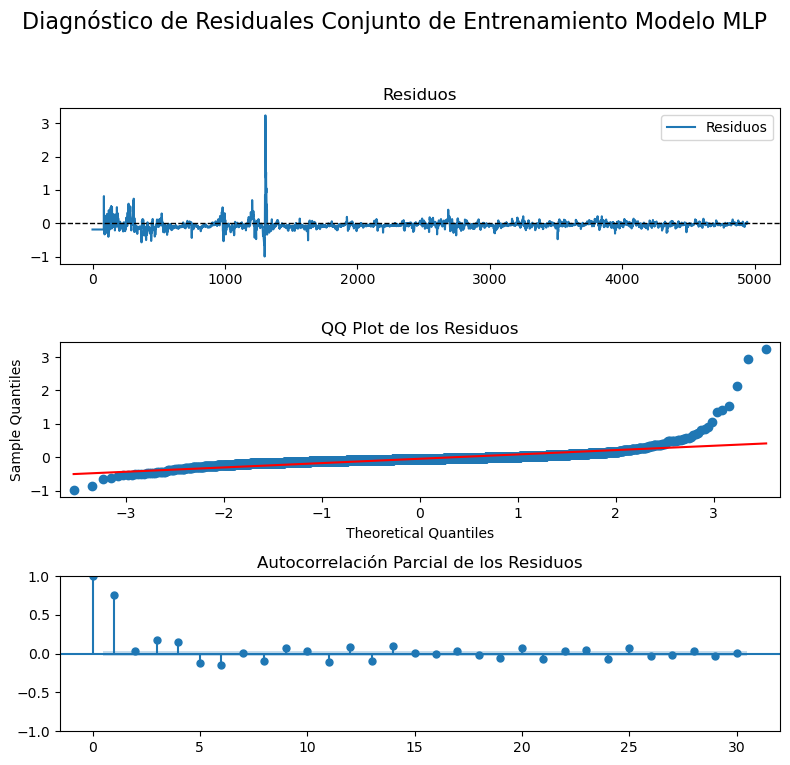

Ljung-Box LB Statistic: 2856.986047
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [344]:
ljung_box_pval_MLP_train14_at, jarque_bera_pval_MLP_train14_at = diagnostic_plots(y_train_at14, train_preds_at_MLP14)

In [345]:
#calcular las métricas 
metrica_at_MLP_train14 = metricas(y_train_at14,train_preds_at_MLP14)
metrica_at_MLP_train14.index = metrica_at_MLP_train14.index.map({0: 'MLP Entrenamiento Retorno Acumulado τ = 14'})
metrica_at_MLP_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train14_at], index=metrica_at_MLP_train14.index)
metrica_at_MLP_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train14_at], index=metrica_at_MLP_train14.index)
metrica_at_MLP_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Retorno Acumulado τ = 14,94.1028,0.79%,0.08,0.02,99.95%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [346]:
ljung_box_pvalMLP14_at, jarque_bera_pvalMLP14_at = evaluate_residuals(data_test_plot_at14, test_preds_at_MLP14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [347]:
metrica_MLP14_test_at = metricas(y_test_at14,test_preds_at_MLP14)
metrica_MLP14_test_at.index = metrica_MLP14_test_at.index.map({0: 'MLP Prueba Retorno Acumulado τ = 14'})
metrica_MLP14_test_at['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP14], index=metrica_MLP14_test_at.index)
metrica_MLP14_test_at['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP14], index=metrica_MLP14_test_at.index)
metrica_MLP14_test_at

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Retorno Acumulado τ = 14,0.0764,0.28%,0.07,0.01,-6.65%,0.0022,0.5157


* **Curva Runs vs Error/Score :**

In [348]:
plot_best_model_validation_loss(history_at_MPL14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [349]:
errores_plots(y_train_at14, train_preds_at_MLP14, y_val_at14, val_preds_at_MLP14, y_test_at14, test_preds_at_MLP14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente el error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 21 días ($\tau=21$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [350]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(21,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [20], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_at21, y_train_at21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   3.5s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   3.5s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   3.6s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   3.6s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   3.7s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.8212478518486023


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(21,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 21 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [351]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP21_at = build_models_mlp(input_shape21, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_171"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_172 (InputLayer)      [(None, 21)]              0         
                                                                 
 dense_480 (Dense)           (None, 32)                704       
                                                                 
 dense_481 (Dense)           (None, 16)                528       
                                                                 
 dense_482 (Dense)           (None, 16)                272       
                                                                 
 dropout_171 (Dropout)       (None, 16)                0         
                                                                 
 dense_483 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,521

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [352]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_at_MLP21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_at = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP21`. 

In [353]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_at_MPL21 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP21_at):
    filename = f'history_at_MPL21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_at21, y=y_train_at21, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best21_at], validation_data=(X_val_at21, y_val_at21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_at_MPL21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_at_MPL21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_MPL21_model_9.joblib' ya existe. Se ha cargado el historial

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [354]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_at_MLP21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model21_at = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model21_at = load_model(best_model_path)  # Cargar el modelo

    if best_model21_at is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_at_MLP21_weights.11-0.0326.keras con val_loss: 0.0326


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [355]:
# Predicciones usando el mejor modelo
if best_model21_at is not None:
    train_preds_at_MLP21 = best_model21_at.predict(X_train_at21)
    val_preds_at_MLP21 = best_model21_at.predict(X_val_at21)
    test_preds_at_MLP21 = best_model21_at.predict(X_test_at21)

    # Aplanar las predicciones si es necesario
    train_preds_at_MLP21 = np.squeeze(train_preds_at_MLP21)
    val_preds_at_MLP21 = np.squeeze(val_preds_at_MLP21)
    test_preds_at_MLP21 = np.squeeze(test_preds_at_MLP21)

    # Imprimir las predicciones
    print('Predicciones de entrenamiento', train_preds_at_MLP21)
    print("Predicciones de validación:", val_preds_at_MLP21)
    print("Predicciones de prueba:", test_preds_at_MLP21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de entrenamiento [ 0.8859012  0.8859012  0.8859012 ... 23.264261  23.252672  23.258429 ]
Predicciones de validación: [23.258463 23.243237 23.222586 23.229269 23.21482  23.21091  23.215971
 23.218592 23.23078  23.227217 23.23064  23.226778 23.230736 23.232473
 23.241411 23.244938 23.254019 23.252293 23.263943 23.268297 23.271044]
Predicciones de prueba: [23.279123 23.286695 23.298567 23.317417 23.336485 23.34952  23.367588
 23.384176 23.397285 23.408937 23.416931 23.422533 23.423899 23.422758
 23.425894 23.427721 23.435617 23.453411 23.464386 23.480364 23.496124]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 21 días ($\tau = 21$). 

In [356]:
data_train_plot_at21, data_val_plot_at21, data_test_plot_at21 = data_plot(df_1_st['A_t'], 21)

Datos de entrenamiento:
4998     0.0000
4997     0.0000
4996     0.0000
4995     0.0000
4994     0.0000
         ...   
46      23.2651
45      23.2866
44      23.3271
43      23.3404
42      23.3513
Name: A_t, Length: 4957, dtype: float6421

Datos de validación:
41    23.3858
40    23.3813
39    23.4228
38    23.4251
37    23.4296
36    23.4202
35    23.4294
34    23.4230
33    23.4322
32    23.4245
31    23.4141
30    23.4028
29    23.4192
28    23.4221
27    23.4757
26    23.5227
25    23.6176
24    23.5968
23    23.6169
22    23.6104
21    23.6288
Name: A_t, dtype: float6421

Datos de prueba:
20    23.7101
19    23.6445
18    23.6804
17    23.6921
16    23.7118
15    23.7147
14    23.7234
13    23.7689
12    23.7602
11    23.7825
10    23.7595
9     23.7326
8     23.6728
7     23.7199
6     23.7083
5     23.6263
4     23.7198
3     23.6852
2     23.6589
1     23.6629
0     23.7125
Name: A_t, dtype: float6421


In [357]:
plot_model(data_train_plot_at21[-100:], data_val_plot_at21, data_test_plot_at21, val_preds_at_MLP21, test_preds_at_MLP21, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

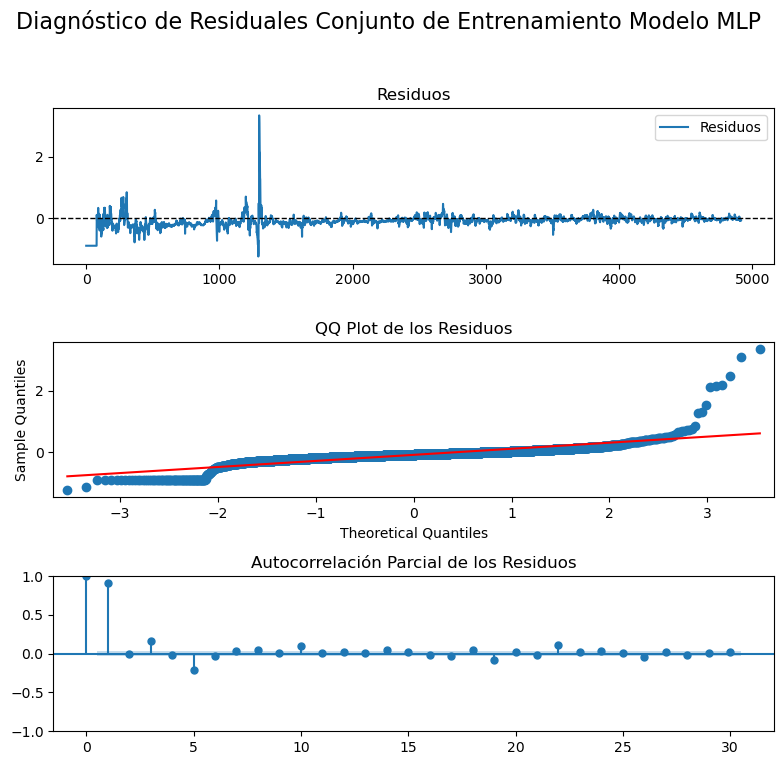

Ljung-Box LB Statistic: 4079.943991
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [358]:
ljung_box_pval_MLP_train21_at, jarque_bera_pval_MLP_train21_at = diagnostic_plots(y_train_at21, train_preds_at_MLP21)

In [359]:
#calcular las métricas 
metrica_at_MLP_train21 = metricas(y_train_at21,train_preds_at_MLP21)
metrica_at_MLP_train21.index = metrica_at_MLP_train21.index.map({0: 'MLP Entrenamiento Retorno Acumulado τ = 21'})
metrica_at_MLP_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train21_at], index=metrica_at_MLP_train21.index)
metrica_at_MLP_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train21_at], index=metrica_at_MLP_train21.index)
metrica_at_MLP_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Retorno Acumulado τ = 21,225.1957,1.16%,0.13,0.05,99.87%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [360]:
ljung_box_pvalMLP21_at, jarque_bera_pvalMLP21_at = evaluate_residuals(data_test_plot_at21, test_preds_at_MLP21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [361]:
metrica_MLP21_test_at = metricas(y_test_at21,test_preds_at_MLP21)
metrica_MLP21_test_at.index = metrica_MLP21_test_at.index.map({0: 'MLP Prueba Retorno Acumulado τ = 21'})
metrica_MLP21_test_at['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP21_at], index=metrica_MLP21_test_at.index)
metrica_MLP21_test_at['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP21_at], index=metrica_MLP21_test_at.index)
metrica_MLP21_test_at

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Retorno Acumulado τ = 21,0.1912,0.34%,0.08,0.01,-27.19%,0.0003,0.4259


* **Curva Runs vs Error/Score :**

In [362]:
plot_best_model_validation_loss(history_at_MPL21)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [363]:
errores_plots(y_train_at21, train_preds_at_MLP21, y_val_at21, val_preds_at_MLP21, y_test_at21, test_preds_at_MLP21)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 28 días ($\tau=28$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [364]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(28,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [20], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_at28, y_train_at28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   4.3s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   4.2s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   4.4s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   4.2s
[CV] END ....activation=relu, epochs=20, learning_rate=0.001; total time=   4.6s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.811628782749176


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(28,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 28 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [365]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP28_at = build_models_mlp(input_shape28, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_188"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_189 (InputLayer)      [(None, 28)]              0         
                                                                 
 dense_548 (Dense)           (None, 32)                928       
                                                                 
 dense_549 (Dense)           (None, 16)                528       
                                                                 
 dense_550 (Dense)           (None, 16)                272       
                                                                 
 dropout_188 (Dropout)       (None, 16)                0         
                                                                 
 dense_551 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,745

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [366]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_at_MLP28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_at = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP28`. 

In [367]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_at_MPL28 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP28_at):
    filename = f'history_ag_MPL28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_at28, y=y_train_at28, batch_size=16, epochs=20,  #Las epocas son las estimadas en el grid search
                                  verbose=2, callbacks=[save_best28_at], validation_data=(X_val_at28, y_val_at28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_at_MPL28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_ag_MPL28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_ag_MPL28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_ag_MPL28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_ag_MPL28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_ag_MPL28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_ag_MPL28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_ag_MPL28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_ag_MPL28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_ag_MPL28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_ag_MPL28_model_9.joblib' ya existe. Se ha cargado el historial

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [368]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_at_MLP28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model28_at = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model28_at = load_model(best_model_path)  # Cargar el modelo

    if best_model28_at is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_at_MLP28_weights.12-0.0354.keras con val_loss: 0.0354


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [369]:
# Predicciones usando el mejor modelo
if best_model28_at is not None:
    train_preds_at_MLP28 = best_model28_at.predict(X_train_at28)
    val_preds_at_MLP28 = best_model28_at.predict(X_val_at28)
    test_preds_at_MLP28 = best_model28_at.predict(X_test_at28)

    # Aplanar las predicciones si es necesario
    train_preds_at_MLP28 = np.squeeze(train_preds_at_MLP28)
    val_preds_at_MLP28 = np.squeeze(val_preds_at_MLP28)
    test_preds_at_MLP28 = np.squeeze(test_preds_at_MLP28)

    # Imprimir las predicciones
    print("Predicciones de entrenamiento:", train_preds_at_MLP28)
    print("Predicciones de validación:", val_preds_at_MLP28)
    print("Predicciones de prueba:", test_preds_at_MLP28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de entrenamiento: [ 0.2793349  0.2793349  0.2793349 ... 23.200956  23.194052  23.192263 ]
Predicciones de validación: [23.19198  23.191072 23.191805 23.204468 23.209131 23.215193 23.20632
 23.209276 23.228174 23.232864 23.230886 23.237192 23.230932 23.222807
 23.216152 23.221617 23.22116  23.220476 23.21031  23.202564 23.208431
 23.199755 23.216951 23.220448 23.217342 23.208328 23.21631  23.215166]
Predicciones de prueba: [23.21665  23.224905 23.214182 23.224089 23.215078 23.205296 23.215624
 23.217966 23.221514 23.217936 23.201454 23.193897 23.196539 23.204798
 23.214743 23.221205 23.236559 23.250154 23.264048 23.282892 23.285479
 23.281212 23.288769 23.280432 23.289543 23.293667 23.299582 23.302547]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [370]:
data_train_plot_at28, data_val_plot_at28 , data_test_plot_at28 = data_plot(df_1_st['A_t'], 28)

Datos de entrenamiento:
4998     0.0000
4997     0.0000
4996     0.0000
4995     0.0000
4994     0.0000
         ...   
60      23.1620
59      23.1582
58      23.2052
57      23.2126
56      23.2105
Name: A_t, Length: 4943, dtype: float6428

Datos de validación:
55    23.2407
54    23.2325
53    23.2240
52    23.2357
51    23.2384
50    23.2340
49    23.2241
48    23.2268
47    23.2360
46    23.2651
45    23.2866
44    23.3271
43    23.3404
42    23.3513
41    23.3858
40    23.3813
39    23.4228
38    23.4251
37    23.4296
36    23.4202
35    23.4294
34    23.4230
33    23.4322
32    23.4245
31    23.4141
30    23.4028
29    23.4192
28    23.4221
Name: A_t, dtype: float6428

Datos de prueba:
27    23.4757
26    23.5227
25    23.6176
24    23.5968
23    23.6169
22    23.6104
21    23.6288
20    23.7101
19    23.6445
18    23.6804
17    23.6921
16    23.7118
15    23.7147
14    23.7234
13    23.7689
12    23.7602
11    23.7825
10    23.7595
9     23.7326
8     23.6728
7     23.7199
6   

In [371]:
plot_model(data_train_plot_at28[-100:], data_val_plot_at28, data_test_plot_at28, val_preds_at_MLP28, test_preds_at_MLP28, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

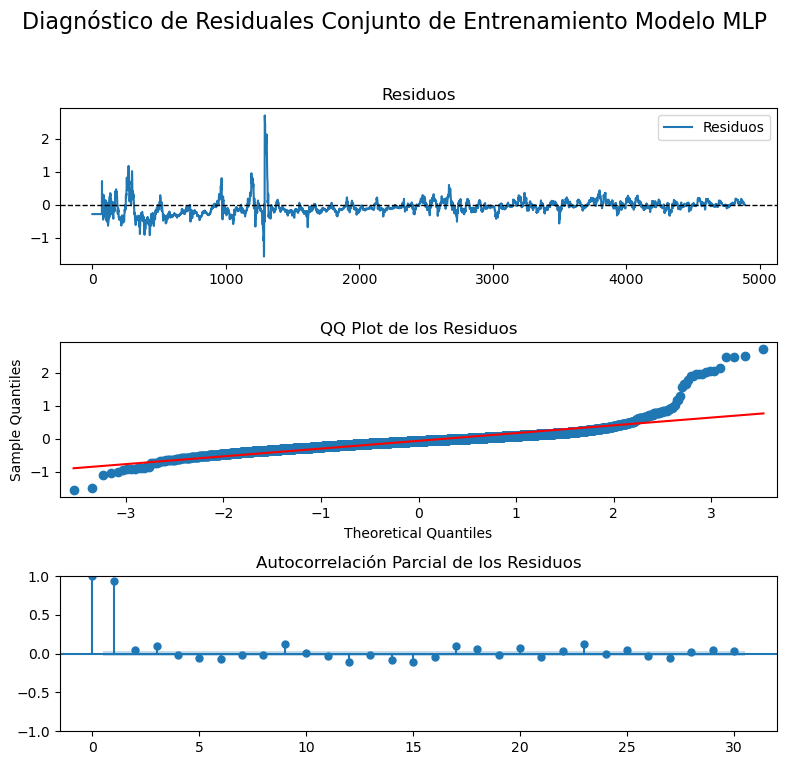

Ljung-Box LB Statistic: 4311.502935
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [372]:
ljung_box_pval_MLP_train28_at, jarque_bera_pval_MLP_train28_at = diagnostic_plots(y_train_at28, train_preds_at_MLP28)

In [373]:
#calcular las métricas 
metrica_at_MLP_train28 = metricas(y_train_at28,train_preds_at_MLP28)
metrica_at_MLP_train28.index = metrica_at_MLP_train28.index.map({0: 'MLP Entrenamiento Retorno Acumulado τ = 28'})
metrica_at_MLP_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train28_at], index=metrica_at_MLP_train28.index)
metrica_at_MLP_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train28_at], index=metrica_at_MLP_train28.index)
metrica_at_MLP_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Retorno Acumulado τ = 28,289.4953,1.57%,0.16,0.06,99.84%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [374]:
ljung_box_pvalMLP28_at, jarque_bera_pvalMLP28_at = evaluate_residuals(data_test_plot_at28, test_preds_at_MLP28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [375]:
metrica_MLP28_test_at = metricas(y_test_at28,test_preds_at_MLP28)
metrica_MLP28_test_at.index = metrica_MLP28_test_at.index.map({0: 'MLP Prueba Retorno Acumulado τ = 28'})
metrica_MLP28_test_at['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP28_at], index=metrica_MLP28_test_at.index)
metrica_MLP28_test_at['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP28_at], index=metrica_MLP28_test_at.index)
metrica_MLP28_test_at

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Retorno Acumulado τ = 28,0.3766,0.42%,0.1,0.01,-89.75%,0.0001,0.7522


* **Curva Runs vs Error/Score :**

In [376]:
plot_best_model_validation_loss(history_at_MPL28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [377]:
errores_plots(y_train_at28, train_preds_at_MLP28, y_val_at28, val_preds_at_MLP28, y_test_at28, test_preds_at_MLP28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


#### <font color="#30143">Retorno Acumulado: Memoria a Corto y Largo Plazo (LSTM) </font>

Ya definimos los `regresores`(`X`) y la `variable objetivo`(`y`) para el proceso de entrenamiento y validación en la selección correspondiente al modelo `Perceptrones Multicapa` a tráves de la función `create_time_series_datasets()`, sin embargo, ésta se utiliza para generar arreglos `2D` de forma (números de muestras, números de paso de tiempo). Dado que la entrada a las capas de una `RNN` debe ser de forma: número de muestras, número de paso de tiempo, número de características por paso de tiempo; procedemos con la sefinición de la función `change_dimension_lstm()` para realizar la transformación de 2D a 3D. 

In [378]:
def change_dimension_lstm(X_train, X_val, X_test): 

    X_train_lstm, X_val_lstm, X_test_lstm = X_train.reshape((X_train.shape[0], X_train.shape[1], 1)), X_val.reshape((X_val.shape[0], X_val.shape[1], 1)), X_test.reshape((X_test.shape[0], X_test.shape[1], 1))
    print('Shape of 3D arrays X:', X_train_lstm.shape, X_val_lstm.shape,  X_test_lstm.shape)

    return X_train_lstm, X_val_lstm, X_test_lstm

##### Horizonte de 7 días ($\tau=7$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [379]:
X_train_at_lstm_7, X_val_at_lstm_7, X_test_at_lstm_7 = change_dimension_lstm(X_train_at7, X_val_at7, X_test_at7)

Shape of 3D arrays X: (4971, 7, 1) (7, 7, 1) (7, 7, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [380]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(7,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_at_lstm_7, y_train_at7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  22.7s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  22.6s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  22.7s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  22.9s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  23.0s
Mejor función de activación: tanh
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.4683504606453311


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [381]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM7_at = build_models_lstm(input_shape7, neurons_list, dropout_rates ,'SGD')

Model: "model_205"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_206 (InputLayer)      [(None, 7, 1)]            0         
                                                                 
 lstm_138 (LSTM)             (None, 7, 64)             16896     
                                                                 
 lstm_139 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_205 (Dropout)       (None, 32)                0         
                                                                 
 dense_613 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_2

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [382]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_at_LSTM_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_lstm_at = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [383]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_at_LSTM7 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM7_at):
    filename = f'history_at_LSTM_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_at_lstm_7, y=y_train_at7, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best7_lstm_at], validation_data=(X_val_at_lstm_7, y_val_at7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_at_LSTM7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_at_LSTM_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM_model_9.joblib' ya existe. Se ha cargado el historial del entre

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [384]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_at_LSTM_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best7_lstm_at = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best7_lstm_at = load_model(best_model_path)  # Cargar el modelo

    if best7_lstm_at is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_at_LSTM_weights.19-0.2184.keras con val_loss: 0.2184


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [385]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [386]:
# Predicciones usando el mejor modelo
if best7_lstm_at is not None:
    # Asegúrate de que X_val_price7 y X_test_price7 tengan la forma correcta
    train_preds_at_LSTM7 = best7_lstm_at.predict(X_train_at_lstm_7)
    val_preds_at_LSTM7 = best7_lstm_at.predict(X_val_at_lstm_7)
    test_preds_at_LSTM7 = best7_lstm_at.predict(X_test_at_lstm_7)

    # Aplanar las predicciones si es necesario
    train_preds_at_LSTM7 = np.squeeze(train_preds_at_LSTM7)
    val_preds_at_LSTM7 = np.squeeze(val_preds_at_LSTM7)
    test_preds_at_LSTM7 = np.squeeze(test_preds_at_LSTM7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_at_LSTM7)
    print("Predicciones de validación:", val_preds_at_LSTM7)
    print("Predicciones de prueba:", test_preds_at_LSTM7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 8ms/step
Predicciones de Entrenamiento: [ 0.04042768  0.04042768  0.04042768 ... 23.44415    23.453379
 23.461021  ]
Predicciones de validación: [23.46674  23.472754 23.475786 23.478655 23.48197  23.484907 23.487526]
Predicciones de prueba: [23.489784 23.492926 23.49611  23.499208 23.501436 23.502111 23.5003  ]


In [387]:
plot_model(data_train_plot_at7[-100:], data_val_plot_at7, data_test_plot_at7, val_preds_at_LSTM7, test_preds_at_LSTM7, "Predicciones usando Memoria a Corto y Largo Paso (LSTM) para un horizonte de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

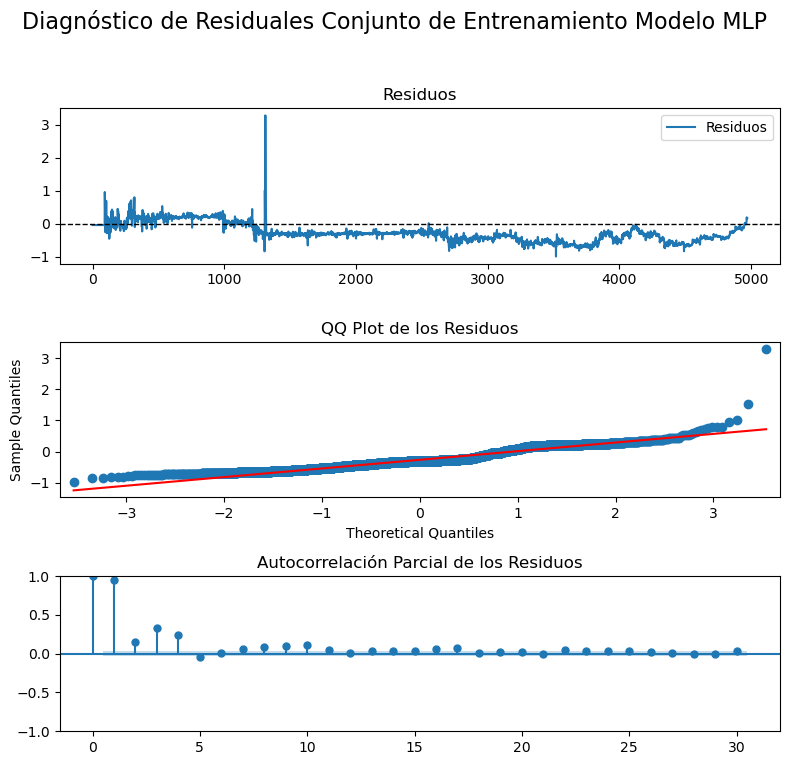

Ljung-Box LB Statistic: 4453.887754
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [388]:
ljung_box_pval_LSTM_train7_at, jarque_bera_pval_LSTM_train7_at = diagnostic_plots(y_train_at7, train_preds_at_LSTM7)

In [389]:
#calcular las métricas 
metrica_at_LSTM_train = metricas(y_train_at7,train_preds_at_LSTM7)
metrica_at_LSTM_train.index = metrica_at_LSTM_train.index.map({0: 'LSTM Entrenamiento Retorno Acumulado τ = 7'})
metrica_at_LSTM_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train7_at], index=metrica_at_LSTM_train.index)
metrica_at_LSTM_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train7_at], index=metrica_at_LSTM_train.index)
metrica_at_LSTM_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Retorno Acumulado τ = 7,733.882,2.18%,0.34,0.15,99.6%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [390]:
ljung_box_pvalLSTM7_at, jarque_bera_pvalLSTM7_at = evaluate_residuals(data_test_plot_at7, test_preds_at_LSTM7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [391]:
metrica_LSTM_test_at = metricas(y_test_at7,test_preds_at_LSTM7)
metrica_LSTM_test_at.index = metrica_LSTM_test_at.index.map({0: 'LSTM Prueba Retorno Acumulado τ = 7'})
metrica_LSTM_test_at['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM7_at], index=metrica_LSTM_test_at.index)
metrica_LSTM_test_at['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM7_at], index=metrica_LSTM_test_at.index)
metrica_LSTM_test_at

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Retorno Acumulado τ = 7,0.4299,1.03%,0.24,0.06,-5043.45%,0.1001,0.7179


* **Curva Runs vs Error/Score :**

In [392]:
plot_best_model_validation_loss(history_at_LSTM7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [393]:
errores_plots(y_train_at7, train_preds_at_LSTM7, y_val_at7, val_preds_at_LSTM7, y_test_at7, test_preds_at_LSTM7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra cerca del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra relativamente cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 14 días ($\tau=14$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [394]:
X_train_at_lstm_14, X_val_at_lstm_14, X_test_at_lstm_14 = change_dimension_lstm(X_train_at14, X_val_at14, X_test_at14)

Shape of 3D arrays X: (4943, 14, 1) (14, 14, 1) (14, 14, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [395]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(14,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_at_lstm_14, y_train_at14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  27.1s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  27.5s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  27.8s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  27.7s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  27.9s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 1.0656000763271671


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [396]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM14_at = build_models_lstm(input_shape14, neurons_list, dropout_rates, 'SGD')

Model: "model_222"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_223 (InputLayer)      [(None, 14, 1)]           0         
                                                                 
 lstm_172 (LSTM)             (None, 14, 64)            16896     
                                                                 
 lstm_173 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_222 (Dropout)       (None, 32)                0         
                                                                 
 dense_630 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_2

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [397]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_at_LSTM14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_lstm_at = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [398]:
import os
from joblib import dump, load


history_at_LSTM14 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM14_at):
    filename = f'history_at_LSTM14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_at_lstm_14, y=y_train_at14, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best14_lstm_at], validation_data=(X_val_at_lstm_14, y_val_at14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_at_LSTM14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_at_LSTM14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_at_LSTM14_model_9.joblib' ya existe. Se ha cargado el

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [399]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_at_LSTM14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best14_lstm_at = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best14_lstm_at = load_model(best_model_path)  # Cargar el modelo

    if best14_lstm_at is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_at_LSTM14_weights.15-0.2154.keras con val_loss: 0.2154


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [400]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [401]:
# Predicciones usando el mejor modelo
if best14_lstm_at is not None:

    train_preds_at_LSTM14 = best14_lstm_at.predict(X_train_at_lstm_14)
    val_preds_at_LSTM14 = best14_lstm_at.predict(X_val_at_lstm_14)
    test_preds_at_LSTM14 = best14_lstm_at.predict(X_test_at_lstm_14)

    # Aplanar las predicciones si es necesario
    train_preds_at_LSTM14 = np.squeeze(train_preds_at_LSTM14)
    val_preds_at_LSTM14 = np.squeeze(val_preds_at_LSTM14)
    test_preds_at_LSTM14 = np.squeeze(test_preds_price_LSTM14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_at_LSTM14)
    print("Predicciones de validación:", val_preds_at_LSTM14)
    print("Predicciones de prueba:", test_preds_at_LSTM14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de Entrenamiento: [-0.1271441 -0.1271441 -0.1271441 ... 23.18849   23.18949   23.190905 ]
Predicciones de validación: [23.192411 23.19396  23.195671 23.197266 23.199038 23.200684 23.202112
 23.203215 23.204134 23.20481  23.205378 23.205723 23.205833 23.20576 ]
Predicciones de prueba: [207.50458 207.50458 207.50458 207.50458 207.50458 207.50458 207.50458
 207.50458 207.50458 207.50458 207.50458 207.50458 207.50458 207.50458]


In [402]:
plot_model(data_train_plot_at14[-100:], data_val_plot_at14, data_test_plot_at14, val_preds_at_LSTM14, test_preds_at_LSTM14, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

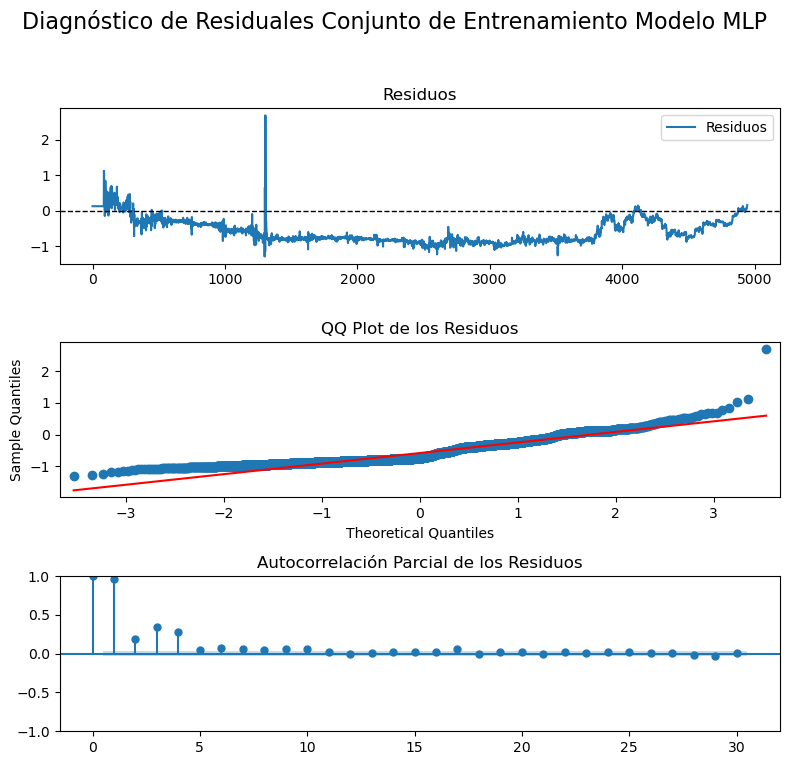

Ljung-Box LB Statistic: 4532.895900
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [403]:
ljung_box_pval_LSTM_train14_at, jarque_bera_pval_LSTM_train14_at = diagnostic_plots(y_train_at14, train_preds_at_LSTM14)

In [404]:
#calcular las métricas 
metrica_at_LSTM_train14 = metricas(y_train_at14,train_preds_at_LSTM14)
metrica_at_LSTM_train14.index = metrica_at_LSTM_train14.index.map({0: 'LSTM Entrenamiento Retorno Acumulado τ = 14'})
metrica_at_LSTM_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train14_at], index=metrica_at_LSTM_train14.index)
metrica_at_LSTM_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train14_at], index=metrica_at_LSTM_train14.index)
metrica_at_LSTM_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Retorno Acumulado τ = 14,2209.2663,3.94%,0.6,0.45,98.78%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [405]:
ljung_box_pvalLSTM14_at, jarque_bera_pvalLSTM14_at = evaluate_residuals(data_test_plot_at14, test_preds_at_LSTM14)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [406]:
metrica_LSTM_test_at14 = metricas(y_test_at14,test_preds_at_LSTM14)
metrica_LSTM_test_at14.index = metrica_LSTM_test_at14.index.map({0: 'LSTM Prueba Retorno Acumulado τ = 14'})
metrica_LSTM_test_at14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM14_at], index=metrica_LSTM_test_at14.index)
metrica_LSTM_test_at14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM14_at], index=metrica_LSTM_test_at14.index)
metrica_LSTM_test_at14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Retorno Acumulado τ = 14,473291.7791,777.81%,183.87,33806.56,-660795871.98%,0.0599,0.7427


* **Curva Runs vs Error/Score :**

In [407]:
plot_best_model_validation_loss(history_at_LSTM14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [408]:
errores_plots(y_train_at14, train_preds_at_LSTM14, y_val_at14, val_preds_at_LSTM14, y_test_at14, test_preds_at_LSTM14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 21 días ($\tau=21$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [409]:
X_train_at_lstm_21, X_val_at_lstm_21, X_test_at_lstm_21 = change_dimension_lstm(X_train_at21, X_val_at21, X_test_at21)

Shape of 3D arrays X: (4915, 21, 1) (21, 21, 1) (21, 21, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [410]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(21,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_at_lstm_21, y_train_at21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  37.5s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  37.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  38.1s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  38.3s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  38.5s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.31983605218670463


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [411]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM21_at = build_models_lstm(input_shape21, neurons_list, dropout_rates, 'SGD')

Model: "model_239"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_240 (InputLayer)      [(None, 21, 1)]           0         
                                                                 
 lstm_206 (LSTM)             (None, 21, 64)            16896     
                                                                 
 lstm_207 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_239 (Dropout)       (None, 32)                0         
                                                                 
 dense_647 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_2

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [412]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_at_LSTM21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_lstm_at = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM21`. 

In [413]:
import os
from joblib import dump, load

history_at_LSTM21 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM21):
    filename = f'history_at_LSTM21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_at_lstm_21, y=y_train_at21, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best21_lstm_at], validation_data=(X_val_at_lstm_21, y_val_at21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_at_LSTM21.append(model_history if isinstance(model_history, dict) else model_history.history)

Epoch 1/20

Epoch 1: val_loss improved from inf to 5.94519, saving model to keras_models/PRSA_data_at_LSTM21_weights.01-5.9452.keras
308/308 - 3s - loss: 6.0419 - val_loss: 5.9452 - 3s/epoch - 9ms/step
Epoch 2/20

Epoch 2: val_loss improved from 5.94519 to 2.00830, saving model to keras_models/PRSA_data_at_LSTM21_weights.02-2.0083.keras
308/308 - 2s - loss: 1.7869 - val_loss: 2.0083 - 2s/epoch - 5ms/step
Epoch 3/20

Epoch 3: val_loss improved from 2.00830 to 1.03234, saving model to keras_models/PRSA_data_at_LSTM21_weights.03-1.0323.keras
308/308 - 2s - loss: 1.2657 - val_loss: 1.0323 - 2s/epoch - 5ms/step
Epoch 4/20

Epoch 4: val_loss improved from 1.03234 to 0.80834, saving model to keras_models/PRSA_data_at_LSTM21_weights.04-0.8083.keras
308/308 - 2s - loss: 1.2769 - val_loss: 0.8083 - 2s/epoch - 5ms/step
Epoch 5/20

Epoch 5: val_loss improved from 0.80834 to 0.75127, saving model to keras_models/PRSA_data_at_LSTM21_weights.05-0.7513.keras
308/308 - 2s - loss: 1.2180 - val_loss: 0.7

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [414]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_at_LSTM21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best21_lstm_at = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best21_lstm_at = load_model(best_model_path)  # Cargar el modelo

    if best21_lstm_at is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_at_LSTM21_weights.20-0.0855.keras con val_loss: 0.0855


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [415]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.keras', 'PRSA_data_price_LSTM14_weights.13-51325.85

In [416]:
# Predicciones usando el mejor modelo
if best21_lstm_at is not None:

    train_preds_at_LSTM21 = best21_lstm_at.predict(X_train_at_lstm_21)
    val_preds_at_LSTM21 = best21_lstm_at.predict(X_val_at_lstm_21)
    test_preds_at_LSTM21 = best21_lstm_at.predict(X_test_at_lstm_21)

    # Aplanar las predicciones si es necesario
    train_preds_at_LSTM21 = np.squeeze(train_preds_at_LSTM21)
    val_preds_at_LSTM21 = np.squeeze(val_preds_at_LSTM21)
    test_preds_at_LSTM21 = np.squeeze(test_preds_at_LSTM21)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_at_LSTM21)
    print("Predicciones de validación:", val_preds_at_LSTM21)
    print("Predicciones de prueba:", test_preds_at_LSTM21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [-0.14549696 -0.14549696 -0.14549696 ... 23.151617   23.151577
 23.151493  ]
Predicciones de validación: [23.15135  23.150986 23.150597 23.15023  23.149775 23.149418 23.149054
 23.14864  23.148277 23.147985 23.147743 23.147642 23.147684 23.147736
 23.147783 23.147837 23.147953 23.148233 23.148668 23.149273 23.149973]
Predicciones de prueba: [23.150743 23.151648 23.1525   23.153406 23.15428  23.15509  23.155857
 23.156622 23.15735  23.1581   23.15883  23.159513 23.16015  23.160795
 23.161413 23.16208  23.162794 23.163641 23.164438 23.16522  23.16596 ]


In [417]:
plot_model(data_train_plot_at21[-100:], data_val_plot_at21, data_test_plot_at21, val_preds_at_LSTM21, test_preds_at_LSTM21, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

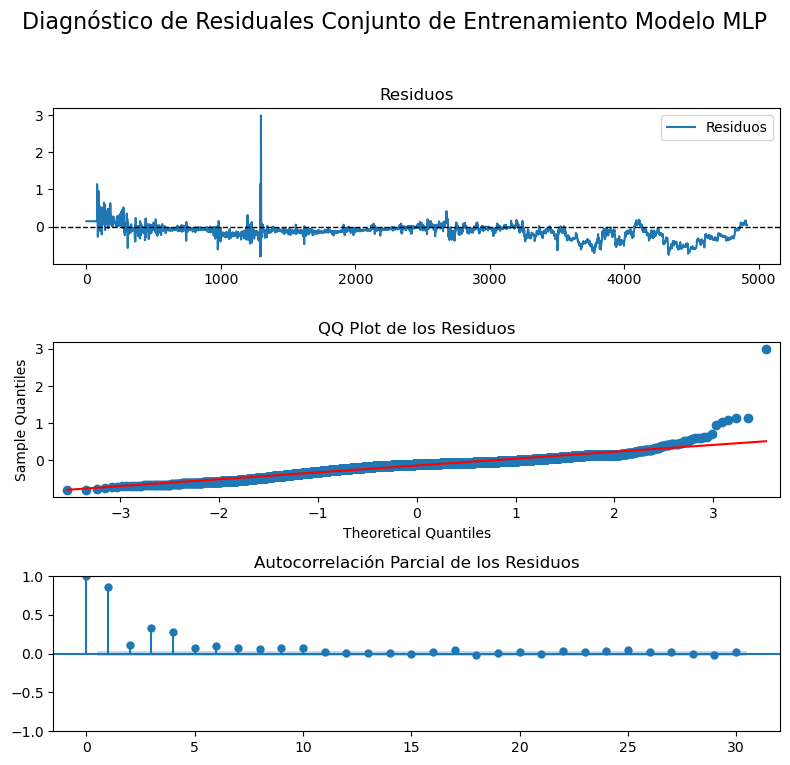

Ljung-Box LB Statistic: 3668.581655
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [418]:
ljung_box_pval_LSTM_train21_at, jarque_bera_pval_LSTM_train21_at = diagnostic_plots(y_train_at21, train_preds_at_LSTM21)

In [419]:
#calcular las métricas 
metrica_at_LSTM_train21 = metricas(y_train_at21,train_preds_at_LSTM21)
metrica_at_LSTM_train21.index = metrica_at_LSTM_train21.index.map({0: 'LSTM Entrenamiento Retorno Acumulado τ = 21'})
metrica_at_LSTM_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train21_at], index=metrica_at_LSTM_train21.index)
metrica_at_LSTM_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train21_at], index=metrica_at_LSTM_train21.index)
metrica_at_LSTM_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Retorno Acumulado τ = 21,258.0266,1.25%,0.17,0.05,99.86%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [420]:
ljung_box_pvalLSTM21_at, jarque_bera_pvalLSTM21_at = evaluate_residuals(data_test_plot_at21, test_preds_at_LSTM21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [421]:
metrica_LSTM_test21_at = metricas(y_test_at21,test_preds_at_LSTM21)
metrica_LSTM_test21_at.index = metrica_LSTM_test21_at.index.map({0: 'LSTM Prueba Retorno Acumulado τ = 21'})
metrica_LSTM_test21_at['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM21_at], index=metrica_LSTM_test21_at.index)
metrica_LSTM_test21_at['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM21_at], index=metrica_LSTM_test21_at.index)
metrica_LSTM_test21_at

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Retorno Acumulado τ = 21,2.1934,1.33%,0.31,0.1,-1359.33%,0.0162,0.8636


* **Curva Runs vs Error/Score :**

In [422]:
plot_best_model_validation_loss(history_at_LSTM21)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [423]:
errores_plots(y_train_at21, train_preds_at_LSTM21, y_val_at21, val_preds_at_LSTM21, y_test_at21, test_preds_at_LSTM21)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 28 días ($\tau=28$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [424]:
X_train_at_lstm_28, X_val_at_lstm_28, X_test_at_lstm_28 = change_dimension_lstm(X_train_at28, X_val_at28, X_test_at28)

Shape of 3D arrays X: (4887, 28, 1) (28, 28, 1) (28, 28, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [425]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(28,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_at_lstm_28, y_train_at28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  44.2s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  44.3s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  44.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  44.5s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  44.6s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.6302218685093333


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [426]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM28_at = build_models_lstm(input_shape28, neurons_list, dropout_rates, 'SGD')

Model: "model_256"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_257 (InputLayer)      [(None, 28, 1)]           0         
                                                                 
 lstm_240 (LSTM)             (None, 28, 64)            16896     
                                                                 
 lstm_241 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_256 (Dropout)       (None, 32)                0         
                                                                 
 dense_664 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_2

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [427]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_at_LSTM28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_lstm_at = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM28_at`. 

In [428]:
import os
from joblib import dump, load

history_at_LSTM28 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM28_at):
    filename = f'history_at_LSTM28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_at_lstm_28, y=y_train_at28, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best28_lstm_at], validation_data=(X_val_at_lstm_28, y_val_at28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_at_LSTM28.append(model_history if isinstance(model_history, dict) else model_history.history)

Epoch 1/20

Epoch 1: val_loss improved from inf to 6.07694, saving model to keras_models/PRSA_data_at_LSTM28_weights.01-6.0769.keras
306/306 - 3s - loss: 6.2694 - val_loss: 6.0769 - 3s/epoch - 11ms/step
Epoch 2/20

Epoch 2: val_loss improved from 6.07694 to 2.07816, saving model to keras_models/PRSA_data_at_LSTM28_weights.02-2.0782.keras
306/306 - 2s - loss: 1.7232 - val_loss: 2.0782 - 2s/epoch - 6ms/step
Epoch 3/20

Epoch 3: val_loss improved from 2.07816 to 1.31482, saving model to keras_models/PRSA_data_at_LSTM28_weights.03-1.3148.keras
306/306 - 2s - loss: 1.3172 - val_loss: 1.3148 - 2s/epoch - 7ms/step
Epoch 4/20

Epoch 4: val_loss improved from 1.31482 to 0.78508, saving model to keras_models/PRSA_data_at_LSTM28_weights.04-0.7851.keras
306/306 - 2s - loss: 1.2475 - val_loss: 0.7851 - 2s/epoch - 7ms/step
Epoch 5/20

Epoch 5: val_loss improved from 0.78508 to 0.54073, saving model to keras_models/PRSA_data_at_LSTM28_weights.05-0.5407.keras
306/306 - 2s - loss: 1.1983 - val_loss: 0.

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [429]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_at_LSTM28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best28_lstm_at = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best28_lstm_at = load_model(best_model_path)  # Cargar el modelo

    if best28_lstm_at is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_at_LSTM28_weights.19-0.0651.keras con val_loss: 0.0651


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [430]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_at_LSTM28_weights.19-0.0651.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.kera

In [431]:
# Predicciones usando el mejor modelo
if best28_lstm_at is not None:

    train_preds_at_LSTM28 = best28_lstm_at.predict(X_train_at_lstm_28)
    val_preds_at_LSTM28 = best28_lstm_at.predict(X_val_at_lstm_28)
    test_preds_at_LSTM28 = best28_lstm_at.predict(X_test_at_lstm_28)

    # Aplanar las predicciones si es necesario
    train_preds_at_LSTM28 = np.squeeze(train_preds_at_LSTM28)
    val_preds_at_LSTM28 = np.squeeze(val_preds_at_LSTM28)
    test_preds_at_LSTM28 = np.squeeze(test_preds_at_LSTM28)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_at_LSTM28)
    print("Predicciones de validación:", val_preds_at_LSTM28)
    print("Predicciones de prueba:", test_preds_at_LSTM28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [-0.16464579 -0.16464579 -0.16464579 ... 23.157084   23.155376
 23.153486  ]
Predicciones de validación: [23.152178 23.154238 23.1588   23.160543 23.162085 23.163881 23.165194
 23.165972 23.170765 23.176058 23.18073  23.184172 23.182032 23.177324
 23.171373 23.166952 23.165258 23.164436 23.16165  23.158604 23.156282
 23.154453 23.14985  23.144815 23.141035 23.138159 23.139002 23.14208 ]
Predicciones de prueba: [23.145075 23.149141 23.152662 23.154593 23.156164 23.157711 23.158747
 23.15876  23.158428 23.158815 23.161383 23.16601  23.173231 23.181253
 23.188791 23.196873 23.203922 23.211584 23.218903 23.22509  23.229498
 23.233057 23.235762 23.238268 23.240198 23.241152 23.24106  23.241545]


In [432]:
plot_model(data_train_plot_at28[-100:], data_val_plot_at28, data_test_plot_at28, val_preds_at_LSTM28, test_preds_at_LSTM28, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

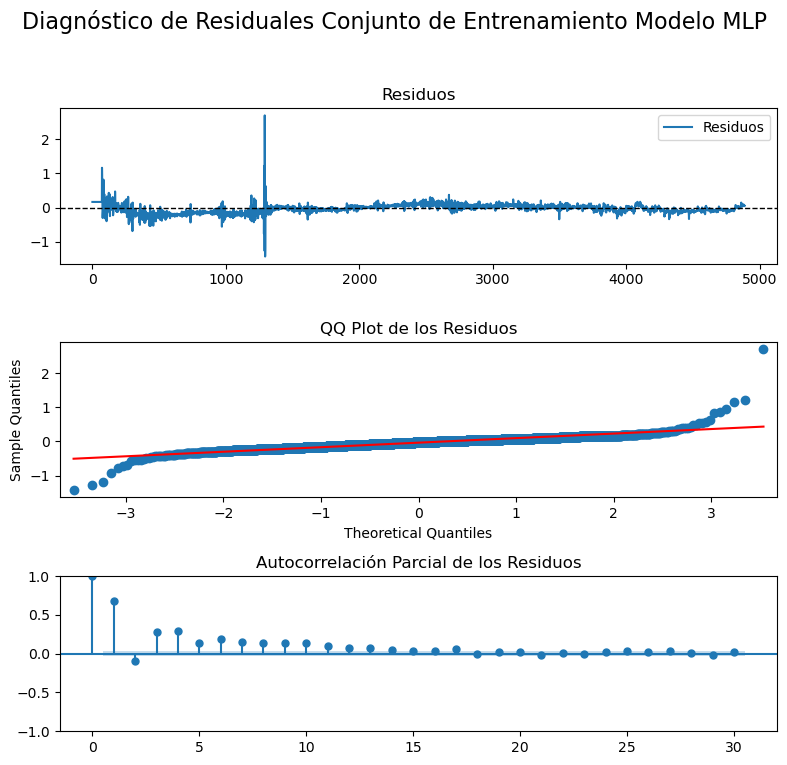

Ljung-Box LB Statistic: 2276.618134
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [433]:
ljung_box_pval_LSTM_train28_at, jarque_bera_pval_LSTM_train28_at = diagnostic_plots(y_train_at28, train_preds_at_LSTM28)

In [434]:
#calcular las métricas 
metrica_at_LSTM_train28 = metricas(y_train_at28,train_preds_at_LSTM28)
metrica_at_LSTM_train28.index = metrica_at_LSTM_train28.index.map({0: 'LSTM Entrenamiento Retorno Acumulado τ = 28'})
metrica_at_LSTM_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train28_at], index=metrica_at_LSTM_train28.index)
metrica_at_LSTM_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train28_at], index=metrica_at_LSTM_train28.index)
metrica_at_LSTM_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Retorno Acumulado τ = 28,93.0869,0.97%,0.1,0.02,99.95%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [435]:
ljung_box_pvalLSTM28_at, jarque_bera_pvalLSTM28_at = evaluate_residuals(data_test_plot_at28, test_preds_at_LSTM28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [436]:
metrica_LSTM_test28_at = metricas(y_test_at28,test_preds_at_LSTM28)
metrica_LSTM_test28_at.index = metrica_LSTM_test28_at.index.map({0: 'LSTM Prueba Retorno Acumulado τ = 28'})
metrica_LSTM_test28_at['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM28_at], index=metrica_LSTM_test28_at.index)
metrica_LSTM_test28_at['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM28_at], index=metrica_LSTM_test28_at.index)
metrica_LSTM_test28_at

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Retorno Acumulado τ = 28,0.6838,0.63%,0.15,0.02,-244.58%,0.0004,0.6241


* **Curva Runs vs Error/Score :**

In [437]:
plot_best_model_validation_loss(history_at_LSTM28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [438]:
errores_plots(y_train_at28, train_preds_at_LSTM28, y_val_at28, val_preds_at_LSTM28, y_test_at28, test_preds_at_LSTM28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



#### <font color="#30143">Volatilidad ω = 7  (Volatilidad_7): Perceptrones Multicapa (MLP)</font>


##### Horizonte de 7 días ($\tau=7$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [439]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(7,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola7, y_train_vola7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   6.6s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   6.7s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   6.8s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   7.0s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=  10.6s
Mejor función de activación: relu
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.00720440624281764


A idexación de parámetros función `build_models` con base a lo indicado en el númeral 3 del parcial práctico. 

In [440]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP7_vola7 = build_models_mlp(input_shape7, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_273"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_274 (InputLayer)      [(None, 7)]               0         
                                                                 
 dense_684 (Dense)           (None, 32)                256       
                                                                 
 dense_685 (Dense)           (None, 16)                528       
                                                                 
 dense_686 (Dense)           (None, 16)                272       
                                                                 
 dropout_273 (Dropout)       (None, 16)                0         
                                                                 
 dense_687 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,073

----------------------------------------
Modelo con 10 neuronas y dropout 0.4:
Model: "model_274"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_275 (InputLayer)      [(None, 7)]               0         
                                                                 
 dense_688 (Dense)           (None, 32)                256       
                                                                 
 dense_689 (Dense)           (None, 16)                528       
                                                                 
 dense_690 (Dense)           (None, 16)                272       
                                                                 
 dropout_274 (Dropout)       (None, 16)                0         
                                                                 
 dense_691 (Dense)           (None, 1)                 17        
                                            

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [441]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola7_MLP7_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_vola7 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP7`. 

In [442]:
import os
from joblib import dump, load

history_vola7_MPL7 = []

# Iterar sobre cada modelo en la lista models_MLP7
for i, model in enumerate(models_MLP7_vola7):
    filename = f'history_vola7_MPL7_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola7, y=y_train_vola7, batch_size=16, epochs=50, 
                                  verbose=2, callbacks=[save_best7_vola7], validation_data=(X_val_vola7, y_val_vola7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola7_MPL7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola7_MPL7_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL7_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL7_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL7_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL7_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL7_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL7_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL7_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL7_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL7_model_9.joblib' ya existe. Se ha 

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [443]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola7_MLP7_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model7_vola7 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model7_vola7 = load_model(best_model_path)  # Cargar el modelo

    if best_model7_vola7 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola7_MLP7_weights.23-0.0033.keras con val_loss: 0.0033


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [444]:
# Predicciones usando el mejor modelo
if best_model7_vola7 is not None:

    train_preds_vola7_MLP7 = best_model7_vola7.predict(X_train_vola7)
    val_preds_vola7_MLP7 = best_model7_vola7.predict(X_val_vola7)
    test_preds_vola7_MLP7 = best_model7_vola7.predict(X_test_vola7)

    # Aplanar las predicciones si es necesario
    train_preds_vola7_MLP7 = np.squeeze(train_preds_vola7_MLP7)
    val_preds_vola7_MLP7 = np.squeeze(val_preds_vola7_MLP7)
    test_preds_vola7_MLP7 = np.squeeze(test_preds_vola7_MLP7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola7_MLP7)
    print("Predicciones de validación:", val_preds_vola7_MLP7)
    print("Predicciones de prueba:", test_preds_vola7_MLP7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 8ms/step
Predicciones de Entrenamiento: [0.00423898 0.00423898 0.00423898 ... 0.04334676 0.04111054 0.0431885 ]
Predicciones de validación: [0.04139544 0.04364643 0.05262981 0.04575547 0.04430497 0.04464185
 0.04381208]
Predicciones de prueba: [0.04323046 0.03411325 0.01797005 0.01620544 0.02108258 0.02420781
 0.03208127]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [445]:
data_train_plot_vola7, data_val_plot_vola7, data_test_plot_vola7 = data_plot(df_1_st['Volatilidad_7'], 7)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
18      0.0463
17      0.0444
16      0.0444
15      0.0438
14      0.0438
Name: Volatilidad_7, Length: 4985, dtype: float647

Datos de validación:
13    0.0360
12    0.0188
11    0.0171
10    0.0223
9     0.0256
8     0.0349
7     0.0402
Name: Volatilidad_7, dtype: float647

Datos de prueba:
6    0.0347
5    0.0444
4    0.0607
3    0.0613
2    0.0613
1    0.0573
0    0.0577
Name: Volatilidad_7, dtype: float647


In [446]:
plot_model(data_train_plot_vola7[-100:], data_val_plot_vola7, data_test_plot_vola7, val_preds_vola7_MLP7, test_preds_vola7_MLP7, "Predicciones usando Perceptrón Multicapa (MLP)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

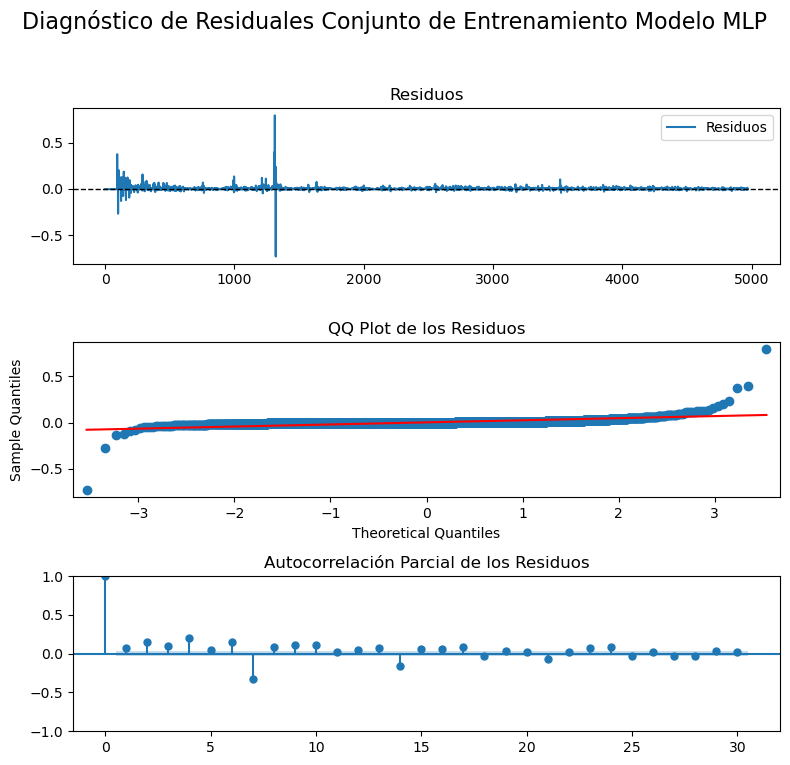

Ljung-Box LB Statistic: 29.815827
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [447]:
ljung_box_pval_MLP_train7_vola7, jarque_bera_pval_MLP_train7_vola7 = diagnostic_plots(y_train_vola7, train_preds_vola7_MLP7)

In [448]:
#calcular las métricas 
metrica_vola7_MLP_train = metricas(y_train_vola7,train_preds_vola7_MLP7)
metrica_vola7_MLP_train.index = metrica_vola7_MLP_train.index.map({0: 'MLP Entrenamiento Volatilidad ω = 7 y τ = 7'})
metrica_vola7_MLP_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train7_vola7], index=metrica_vola7_MLP_train.index)
metrica_vola7_MLP_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train7_vola7], index=metrica_vola7_MLP_train.index)
metrica_vola7_MLP_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 7 y τ = 7,2.5823,17.98%,0.01,0.0,87.67%,4.7510e-08,0.0


* **Conjunto de datos de Prueba:**

In [449]:
ljung_box_pvalMLP7_vola7, jarque_bera_pvalMLP7_vola7 = evaluate_residuals(data_test_plot_vola7, test_preds_vola7_MLP7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [450]:
metrica_MLP7_test_vola7 = metricas(y_test_vola7,test_preds_vola7_MLP7)
metrica_MLP7_test_vola7.index = metrica_MLP7_test_vola7.index.map({0: 'MLP Prueba Volatilidad ω = 7 y τ = 7'})
metrica_MLP7_test_vola7['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP7_vola7], index=metrica_MLP7_test_vola7.index)
metrica_MLP7_test_vola7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP7_vola7], index=metrica_MLP7_test_vola7.index)
metrica_MLP7_test_vola7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 7 y τ = 7,0.0005,28.82%,0.01,0.0,-4.83%,0.1964,0.6142


* **Curva Runs vs Error/Score :**

In [451]:
plot_best_model_validation_loss(history_vola7_MPL7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [452]:
errores_plots(y_train_vola7, train_preds_vola7_MLP7, y_val_at7, val_preds_vola7_MLP7, y_test_vola7, test_preds_vola7_MLP7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 14 días ($\tau=14$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [453]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(14,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola14, y_train_vola14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.4s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.8s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.1s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.1s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.2s
Mejor función de activación: tanh
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.007385299261659384


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(14,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 14 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [454]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP14_vola7 = build_models_mlp(input_shape14, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_290"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_291 (InputLayer)      [(None, 14)]              0         
                                                                 
 dense_752 (Dense)           (None, 32)                480       
                                                                 
 dense_753 (Dense)           (None, 16)                528       
                                                                 
 dense_754 (Dense)           (None, 16)                272       
                                                                 
 dropout_290 (Dropout)       (None, 16)                0         
                                                                 
 dense_755 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,297

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [455]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola7_MLP14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_vola7 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP14`. 

In [456]:
import os
from joblib import dump, load

history_vola7_MPL14 = []

# Iterar sobre cada modelo en la lista models
for i, model in enumerate(models_MLP14_vola7):
    filename = f'history_vola7_MPL14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola14, y=y_train_vola14, batch_size=16, epochs=50, 
                                  verbose=2, callbacks=[save_best14_vola7], validation_data=(X_val_vola14, y_val_vola14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola7_MPL14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola7_MPL14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL14_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [457]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola7_MLP14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model14_vola7 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model14_vola7 = load_model(best_model_path)  # Cargar el modelo

    if best_model14_vola7 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola7_MLP14_weights.05-0.0018.keras con val_loss: 0.0018


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [458]:
# Predicciones usando el mejor modelo
if best_model14_vola7 is not None:

    train_preds_vola7_MLP14 = best_model14_vola7.predict(X_train_vola14)
    val_preds_vola7_MLP14 = best_model14_vola7.predict(X_val_vola14)
    test_preds_vola7_MLP14 = best_model14_vola7.predict(X_test_vola14)


    # Aplanar las predicciones si es necesario
    train_preds_vola7_MLP14 = np.squeeze(train_preds_vola7_MLP14)
    val_preds_vola7_MLP14 = np.squeeze(val_preds_vola7_MLP14)
    test_preds_vola7_MLP14 = np.squeeze(test_preds_vola7_MLP14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola7_MLP14)
    print("Predicciones de validación:", val_preds_vola7_MLP14)
    print("Predicciones de prueba:", test_preds_vola7_MLP14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 8ms/step
Predicciones de Entrenamiento: [0.00164254 0.00164254 0.00164254 ... 0.01641651 0.01922221 0.01797052]
Predicciones de validación: [0.01557103 0.01413742 0.01610323 0.01725768 0.01788708 0.0173529
 0.01973658 0.01954738 0.01691689 0.01641493 0.00893137 0.00980659
 0.00912014 0.0113398 ]
Predicciones de prueba: [0.01107316 0.02227576 0.02853836 0.03826828 0.04053598 0.03758059
 0.03970905 0.03625864 0.03945739 0.04863076 0.04210615 0.04040461
 0.04034238 0.04068169]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 14 días ($\tau = 14$). 

In [459]:
data_train_plot_vola7_14, data_val_plot_vola7_14, data_test_plot_vola7_14 = data_plot(df_1_st['Volatilidad_7'], 14)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
32      0.0080
31      0.0088
30      0.0090
29      0.0114
28      0.0107
Name: Volatilidad_7, Length: 4971, dtype: float6414

Datos de validación:
27    0.0229
26    0.0273
25    0.0393
24    0.0411
23    0.0380
22    0.0403
21    0.0391
20    0.0432
19    0.0563
18    0.0463
17    0.0444
16    0.0444
15    0.0438
14    0.0438
Name: Volatilidad_7, dtype: float6414

Datos de prueba:
13    0.0360
12    0.0188
11    0.0171
10    0.0223
9     0.0256
8     0.0349
7     0.0402
6     0.0347
5     0.0444
4     0.0607
3     0.0613
2     0.0613
1     0.0573
0     0.0577
Name: Volatilidad_7, dtype: float6414


In [460]:
plot_model(data_train_plot_vola7_14[-100:], data_val_plot_vola7_14, data_test_plot_vola7_14, val_preds_vola7_MLP14, test_preds_vola7_MLP14, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

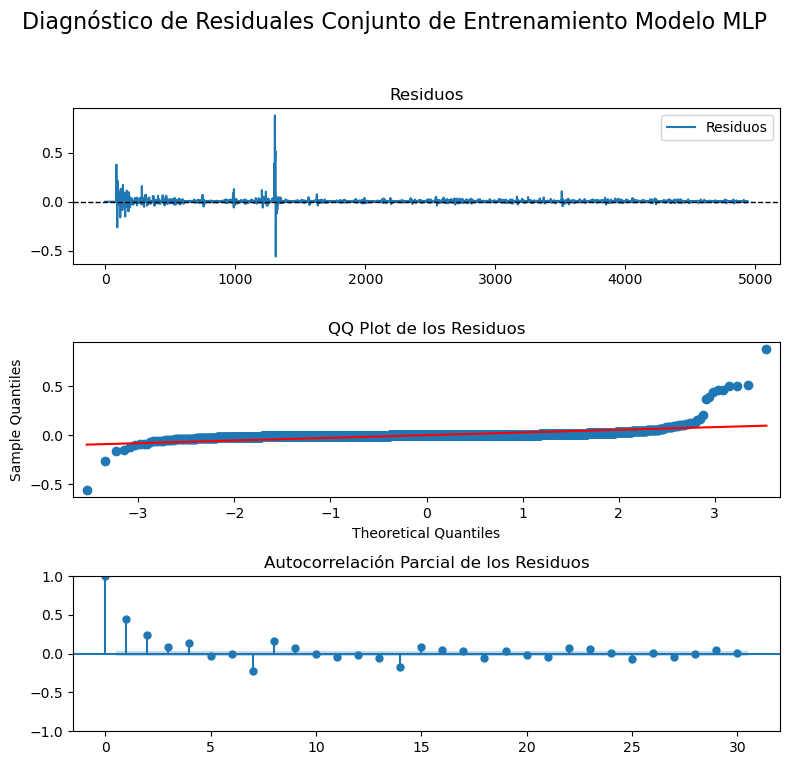

Ljung-Box LB Statistic: 979.284539
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [461]:
ljung_box_pval_MLP_train14_vola7, jarque_bera_pval_MLP_train14_vola7 = diagnostic_plots(y_train_vola14, train_preds_vola7_MLP14)

In [462]:
#calcular las métricas 
metrica_vola7_MLP_train14 = metricas(y_train_vola14,train_preds_vola7_MLP14)
metrica_vola7_MLP_train14.index = metrica_vola7_MLP_train14.index.map({0: 'MLP Entrenamiento Volatilidad ω = 7  y τ = 14'})
metrica_vola7_MLP_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train14_vola7], index=metrica_vola7_MLP_train14.index)
metrica_vola7_MLP_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train14_vola7], index=metrica_vola7_MLP_train14.index)
metrica_vola7_MLP_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 7 y τ = 14,3.7256,17.22%,0.01,0.0,82.18%,5.7162e-215,0.0


* **Conjunto de datos de Prueba:**

In [463]:
ljung_box_pvalMLP14_vola7, jarque_bera_pvalMLP14_vola7 = evaluate_residuals(data_test_plot_vola7_14, test_preds_vola7_MLP14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [464]:
metrica_MLP14_test_vola7 = metricas(y_test_vola14,test_preds_vola7_MLP14)
metrica_MLP14_test_vola7.index = metrica_MLP14_test_vola7.index.map({0: 'MLP Prueba Volatilidad ω = 7  τ = 14'})
metrica_MLP14_test_vola7['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP14_vola7], index=metrica_MLP14_test_vola7.index)
metrica_MLP14_test_vola7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP14_vola7], index=metrica_MLP14_test_vola7.index)
metrica_MLP14_test_vola7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 7 τ = 14,0.0007,14.26%,0.01,0.0,18.43%,0.0075,0.5912


* **Curva Runs vs Error/Score :**

In [465]:
plot_best_model_validation_loss(history_vola7_MPL14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [466]:
errores_plots(y_train_vola14, train_preds_vola7_MLP14, y_val_vola14, val_preds_vola7_MLP14, y_test_vola14, test_preds_vola7_MLP14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana  del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana error/score correspondiente al val_loss de la epoca del mejor modelo.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. Sin embargo, a pesar de esto, se evidencia que existe autocorrelación en los residuales, lo que hace que nuestro modelo no sea confiable.


##### Horizonte de 21 días ($\tau=21$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [467]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(21,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [100], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola21, y_train_vola21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  17.3s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  17.3s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  17.3s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  17.4s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  21.0s
Mejor función de activación: tanh
Mejor número de epocas: 100
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.006836974434554577


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(21,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 21 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [468]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP21_vola7 = build_models_mlp(input_shape21, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_307"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_308 (InputLayer)      [(None, 21)]              0         
                                                                 
 dense_820 (Dense)           (None, 32)                704       
                                                                 
 dense_821 (Dense)           (None, 16)                528       
                                                                 
 dense_822 (Dense)           (None, 16)                272       
                                                                 
 dropout_307 (Dropout)       (None, 16)                0         
                                                                 
 dense_823 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,521

_________________________________________________________________
----------------------------------------
Modelo con 10 neuronas y dropout 0.4:
Model: "model_308"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_309 (InputLayer)      [(None, 21)]              0         
                                                                 
 dense_824 (Dense)           (None, 32)                704       
                                                                 
 dense_825 (Dense)           (None, 16)                528       
                                                                 
 dense_826 (Dense)           (None, 16)                272       
                                                                 
 dropout_308 (Dropout)       (None, 16)                0         
                                                                 
 dense_827 (Dense)           (None, 1)      

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [469]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola7_MLP21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_vola7 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP21`. 

In [470]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola7_MPL21 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP21_vola7):
    filename = f'history_vola7_MPL21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola21, y=y_train_vola21, batch_size=16, epochs=100, 
                                  verbose=2, callbacks=[save_best21_vola7], validation_data=(X_val_vola21, y_val_vola21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola7_MPL21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola7_MPL21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL21_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [471]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola7_MLP21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model21_vola7 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model21_vola7 = load_model(best_model_path)  # Cargar el modelo

    if best_model21_vola7 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola7_MLP21_weights.94-0.0024.keras con val_loss: 0.0024


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [472]:
# Predicciones usando el mejor modelo
if best_model21_vola7 is not None:
    train_preds_vola7_MLP21 = best_model21_vola7.predict(X_train_vola21)
    val_preds_vola7_MLP21 = best_model21_vola7.predict(X_val_vola21)
    test_preds_vola7_MLP21 = best_model21_vola7.predict(X_test_vola21)

    # Aplanar las predicciones si es necesario
    train_preds_vola7_MLP21 = np.squeeze(train_preds_vola7_MLP21)
    val_preds_vola7_MLP21 = np.squeeze(val_preds_vola7_MLP21)
    test_preds_vola7_MLP21 = np.squeeze(test_preds_vola7_MLP21)

    # Imprimir las predicciones
    print('Predicciones de entrenamiento', train_preds_vola7_MLP21)
    print("Predicciones de validación:", val_preds_vola7_MLP21)
    print("Predicciones de prueba:", test_preds_vola7_MLP21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de entrenamiento [0.00211542 0.00211542 0.00211542 ... 0.02692614 0.01982317 0.01988152]
Predicciones de validación: [0.02118946 0.02202928 0.02317089 0.02266917 0.02384281 0.02764382
 0.02818159 0.02680754 0.01963386 0.02043094 0.02249693 0.01887584
 0.01419025 0.01518366 0.01802568 0.00811394 0.00916726 0.01432351
 0.01656792 0.01876501 0.01725021]
Predicciones de prueba: [0.01680177 0.01328124 0.01506495 0.01746774 0.01830186 0.01813584
 0.02132928 0.02057712 0.01646137 0.01675731 0.00849648 0.00976775
 0.00945496 0.01249724 0.01248461 0.02341114 0.03005834 0.03801074
 0.04037543 0.03617397 0.03958373]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 21 días ($\tau = 21$). 

In [473]:
data_train_plot_vola21, data_val_plot_vola21, data_test_plot_vola21 = data_plot(df_1_st['Volatilidad_7'], 21)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
46      0.0126
45      0.0139
44      0.0184
43      0.0168
42      0.0131
Name: Volatilidad_7, Length: 4957, dtype: float6421

Datos de validación:
41    0.0123
40    0.0155
39    0.0172
38    0.0189
37    0.0171
36    0.0194
35    0.0194
34    0.0173
33    0.0167
32    0.0080
31    0.0088
30    0.0090
29    0.0114
28    0.0107
27    0.0229
26    0.0273
25    0.0393
24    0.0411
23    0.0380
22    0.0403
21    0.0391
Name: Volatilidad_7, dtype: float6421

Datos de prueba:
20    0.0432
19    0.0563
18    0.0463
17    0.0444
16    0.0444
15    0.0438
14    0.0438
13    0.0360
12    0.0188
11    0.0171
10    0.0223
9     0.0256
8     0.0349
7     0.0402
6     0.0347
5     0.0444
4     0.0607
3     0.0613
2     0.0613
1     0.0573
0     0.0577
Name: Volatilidad_7, dtype: float6421


In [474]:
plot_model(data_train_plot_vola21[-100:], data_val_plot_vola21, data_test_plot_vola21, val_preds_vola7_MLP21, test_preds_vola7_MLP21, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

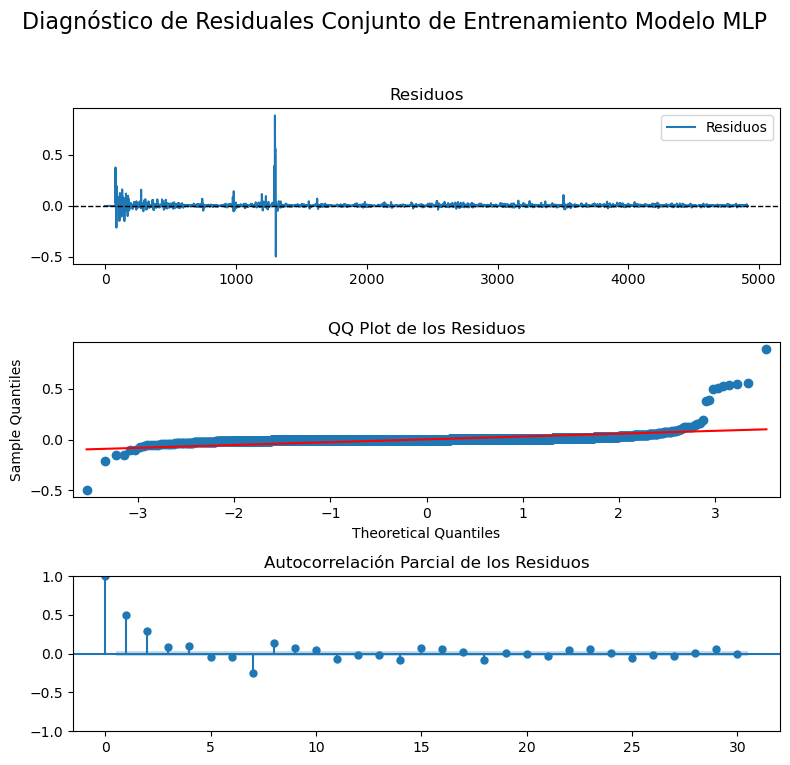

Ljung-Box LB Statistic: 1224.797069
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [475]:
ljung_box_pval_MLP_train21_vola7, jarque_bera_pval_MLP_train21_vola7 = diagnostic_plots(y_train_vola21, train_preds_vola7_MLP21)

In [476]:
#calcular las métricas 
metrica_vola7_MLP_train21 = metricas(y_train_vola21,train_preds_vola7_MLP21)
metrica_vola7_MLP_train21.index = metrica_vola7_MLP_train21.index.map({0: 'MLP Entrenamiento Volatilidad ω = 7 y τ = 21'})
metrica_vola7_MLP_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train21_vola7], index=metrica_vola7_MLP_train21.index)
metrica_vola7_MLP_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train21_vola7], index=metrica_vola7_MLP_train21.index)
metrica_vola7_MLP_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 7 y τ = 21,3.8423,16.05%,0.01,0.0,81.61%,2.4903e-268,0.0


* **Conjunto de datos de Prueba:**

In [477]:
ljung_box_pvalMLP21_vola7, jarque_bera_pvalMLP21_vola7 = evaluate_residuals(data_test_plot_vola21, test_preds_vola7_MLP21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [478]:
metrica_MLP21_test_vola7 = metricas(y_test_vola21,test_preds_vola7_MLP21)
metrica_MLP21_test_vola7.index = metrica_MLP21_test_vola7.index.map({0: 'MLP Prueba Volatilidad ω = 7 y τ = 21'})
metrica_MLP21_test_vola7['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP21_vola7], index=metrica_MLP21_test_vola7.index)
metrica_MLP21_test_vola7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP21_vola7], index=metrica_MLP21_test_vola7.index)
metrica_MLP21_test_vola7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 7 y τ = 21,0.0004,18.01%,0.0,0.0,85.62%,0.0012,0.4394


* **Curva Runs vs Error/Score :**

In [479]:
plot_best_model_validation_loss(history_vola7_MPL21)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [480]:
errores_plots(y_train_vola21, train_preds_vola7_MLP21, y_val_vola21, val_preds_vola7_MLP21, y_test_vola21, test_preds_vola7_MLP21)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 28 días ($\tau=28$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [481]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(28,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola28, y_train_vola28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   7.7s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   7.9s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   7.9s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.1s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.1s
Mejor función de activación: tanh
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.007541426550596952


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(28,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 28 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [482]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP28_vola7 = build_models_mlp(input_shape28, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_324"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_325 (InputLayer)      [(None, 28)]              0         
                                                                 
 dense_888 (Dense)           (None, 32)                928       
                                                                 
 dense_889 (Dense)           (None, 16)                528       
                                                                 
 dense_890 (Dense)           (None, 16)                272       
                                                                 
 dropout_324 (Dropout)       (None, 16)                0         
                                                                 
 dense_891 (Dense)           (None, 1)                 17        
                                                                 
Total params: 1,745

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [483]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola7_MLP28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_vola7 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP28`. 

In [484]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola7_MPL28 = []

# Iterar sobre cada modelo en la lista models
for i, model in enumerate(models_MLP28_vola7):
    filename = f'history_vola7_MPL28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola28, y=y_train_vola28, batch_size=16, epochs=50,  #Las epocas son las estimadas en el grid search
                                  verbose=2, callbacks=[save_best28_vola7], validation_data=(X_val_vola28, y_val_vola28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola7_MPL28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola7_MPL28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_MPL28_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [485]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola7_MLP28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model28_vola7 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model28_vola7 = load_model(best_model_path)  # Cargar el modelo

    if best_model28_vola7 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola7_MLP28_weights.32-0.0029.keras con val_loss: 0.0029


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [486]:
# Predicciones usando el mejor modelo
if best_model28_vola7 is not None:
    train_preds_vola7_MLP28 = best_model28_vola7.predict(X_train_vola28)
    val_preds_vola7_MLP28 = best_model28_vola7.predict(X_val_vola28)
    test_preds_vola7_MLP28 = best_model28_vola7.predict(X_test_vola28)

    # Aplanar las predicciones si es necesario
    train_preds_vola7_MLP28 = np.squeeze(train_preds_vola7_MLP28)
    val_preds_vola7_MLP28 = np.squeeze(val_preds_vola7_MLP28)
    test_preds_vola7_MLP28 = np.squeeze(test_preds_vola7_MLP28)

    # Imprimir las predicciones
    print("Predicciones de entrenamiento:", train_preds_vola7_MLP28)
    print("Predicciones de validación:", val_preds_vola7_MLP28)
    print("Predicciones de prueba:", test_preds_vola7_MLP28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de entrenamiento: [0.00122369 0.00122369 0.00122369 ... 0.01869361 0.01823867 0.01843898]
Predicciones de validación: [0.01965564 0.0249837  0.02388054 0.02899083 0.03142117 0.02996834
 0.03053402 0.02946956 0.03632463 0.03558132 0.02950555 0.02993879
 0.04244857 0.04243865 0.04043846 0.03176515 0.03419735 0.03157211
 0.02830457 0.02012498 0.02029579 0.02066696 0.02256245 0.02292681
 0.0232622  0.02247726 0.02822454 0.02822946]
Predicciones de prueba: [0.02763509 0.01964802 0.02206122 0.02294054 0.02038712 0.01496809
 0.01742661 0.01965767 0.01100218 0.01027017 0.01635244 0.0178361
 0.02058693 0.01810741 0.01714929 0.01356719 0.01558089 0.01748828
 0.01895088 0.01874853 0.02220165 0.02236787 0.01828931 0.01700567
 0.009808   0.01106531 0.01060213 0.01302596]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [487]:
data_train_plot_vola28, data_val_plot_vola28 , data_test_plot_vola28 = data_plot(df_1_st['Volatilidad_7'], 28)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
60      0.0230
59      0.0201
58      0.0280
57      0.0281
56      0.0281
Name: Volatilidad_7, Length: 4943, dtype: float6428

Datos de validación:
55    0.0186
54    0.0203
53    0.0215
52    0.0208
51    0.0135
50    0.0139
49    0.0146
48    0.0080
47    0.0084
46    0.0126
45    0.0139
44    0.0184
43    0.0168
42    0.0131
41    0.0123
40    0.0155
39    0.0172
38    0.0189
37    0.0171
36    0.0194
35    0.0194
34    0.0173
33    0.0167
32    0.0080
31    0.0088
30    0.0090
29    0.0114
28    0.0107
Name: Volatilidad_7, dtype: float6428

Datos de prueba:
27    0.0229
26    0.0273
25    0.0393
24    0.0411
23    0.0380
22    0.0403
21    0.0391
20    0.0432
19    0.0563
18    0.0463
17    0.0444
16    0.0444
15    0.0438
14    0.0438
13    0.0360
12    0.0188
11    0.0171
10    0.0223
9     0.0256
8     0.0349
7     0.0402
6     0.0347
5     0.0444
4     0.0607
3    

In [488]:
plot_model(data_train_plot_at28[-100:], data_val_plot_at28, data_test_plot_at28, val_preds_at_MLP28, test_preds_at_MLP28, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

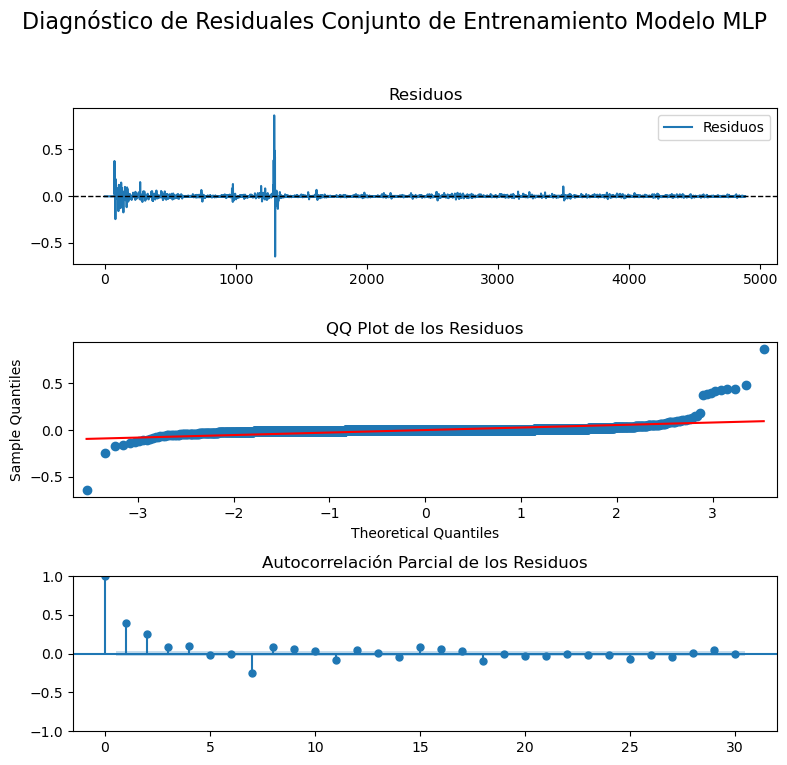

Ljung-Box LB Statistic: 784.151303
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [489]:
ljung_box_pval_MLP_train28_vola7, jarque_bera_pval_MLP_train28_vola7 = diagnostic_plots(y_train_vola28, train_preds_vola7_MLP28)

In [490]:
#calcular las métricas 
metrica_vola7_MLP_train28 = metricas(y_train_vola28,train_preds_vola7_MLP28)
metrica_vola7_MLP_train28.index = metrica_vola7_MLP_train28.index.map({0: 'MLP Entrenamiento Volatilidad ω = 7 y τ = 28'})
metrica_vola7_MLP_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train28_vola7], index=metrica_vola7_MLP_train28.index)
metrica_vola7_MLP_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train28_vola7], index=metrica_vola7_MLP_train28.index)
metrica_vola7_MLP_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 7 y τ = 28,3.5159,19.21%,0.01,0.0,83.16%,1.5062e-172,0.0


* **Conjunto de datos de Prueba:**

In [491]:
ljung_box_pvalMLP28_vola7, jarque_bera_pvalMLP28_vola7 = evaluate_residuals(data_test_plot_vola28, test_preds_vola7_MLP28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [492]:
metrica_MLP28_test_vola7 = metricas(y_test_vola28,test_preds_vola7_MLP28)
metrica_MLP28_test_vola7.index = metrica_MLP28_test_vola7.index.map({0: 'MLP Prueba Volatilidad ω = 7 y τ = 28'})
metrica_MLP28_test_vola7['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP28_vola7], index=metrica_MLP28_test_vola7.index)
metrica_MLP28_test_vola7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP28_vola7], index=metrica_MLP28_test_vola7.index)
metrica_MLP28_test_vola7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 7 y τ = 28,0.0005,26.09%,0.0,0.0,-6.44%,2.7413e-05,0.6066


* **Curva Runs vs Error/Score :**

In [493]:
plot_best_model_validation_loss(history_vola7_MPL28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [494]:
errores_plots(y_train_vola28, train_preds_vola7_MLP28, y_val_vola28, val_preds_vola7_MLP28, y_test_vola28, test_preds_vola7_MLP28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


#### <font color="#30143">Volatilidad ω = 7  (Volatilidad_7): Memoria a Corto y Largo Plazo (LSTM) </font>

Ya definimos los `regresores`(`X`) y la `variable objetivo`(`y`) para el proceso de entrenamiento y validación en la selección correspondiente al modelo `Perceptrones Multicapa` a tráves de la función `create_time_series_datasets()`, sin embargo, ésta se utiliza para generar arreglos `2D` de forma (números de muestras, números de paso de tiempo). Dado que la entrada a las capas de una `RNN` debe ser de forma: número de muestras, número de paso de tiempo, número de características por paso de tiempo; procedemos con la sefinición de la función `change_dimension_lstm()` para realizar la transformación de 2D a 3D. 

##### Horizonte de 7 días ($\tau=7$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [495]:
X_train_vola7_lstm_7, X_val_vola7_lstm_7, X_test_vola7_lstm_7 = change_dimension_lstm(X_train_vola7, X_val_vola7, X_test_vola7)

Shape of 3D arrays X: (4971, 7, 1) (7, 7, 1) (7, 7, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [496]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(7,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=20, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola7_lstm_7, y_train_vola7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  16.3s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  16.3s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  16.4s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  16.4s
[CV] END ..........activation=tanh, epochs=20, optimizer=SGD; total time=  16.6s
Mejor función de activación: tanh
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.02579855326376012


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [497]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM7_vola7 = build_models_lstm(input_shape7, neurons_list, dropout_rates ,'SGD')

Model: "model_341"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_342 (InputLayer)      [(None, 7, 1)]            0         
                                                                 
 lstm_274 (LSTM)             (None, 7, 64)             16896     
                                                                 
 lstm_275 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_341 (Dropout)       (None, 32)                0         
                                                                 
 dense_953 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_3

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [498]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola7_LSTM_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_lstm_vola7 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [499]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola7_LSTM7 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM7_vola7):
    filename = f'history_vola7_LSTM_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola7_lstm_7, y=y_train_vola7, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best7_lstm_vola7], validation_data=(X_val_vola7_lstm_7, y_val_vola7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola7_LSTM7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola7_LSTM_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM_model_9.joblib' ya existe. Se ha 

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [500]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola7_LSTM_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best7_lstm_vola7 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best7_lstm_vola7 = load_model(best_model_path)  # Cargar el modelo

    if best7_lstm_vola7 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola7_LSTM_weights.02-0.0038.keras con val_loss: 0.0038


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [501]:
# Predicciones usando el mejor modelo
if best7_lstm_vola7 is not None:
    # Asegúrate de que X_val_price7 y X_test_price7 tengan la forma correcta
    train_preds_vola7_LSTM7 = best7_lstm_vola7.predict(X_train_vola7_lstm_7)
    val_preds_vola7_LSTM7 = best7_lstm_vola7.predict(X_val_vola7_lstm_7)
    test_preds_vola7_LSTM7 = best7_lstm_vola7.predict(X_test_vola7_lstm_7)

    # Aplanar las predicciones si es necesario
    train_preds_vola7_LSTM7 = np.squeeze(train_preds_vola7_LSTM7)
    val_preds_vola7_LSTM7 = np.squeeze(val_preds_vola7_LSTM7)
    test_preds_vola7_LSTM7 = np.squeeze(test_preds_vola7_LSTM7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola7_LSTM7)
    print("Predicciones de validación:", val_preds_vola7_LSTM7)
    print("Predicciones de prueba:", test_preds_vola7_LSTM7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 8ms/step
Predicciones de Entrenamiento: [0.0060063  0.0060063  0.0060063  ... 0.04061764 0.04177225 0.04151653]
Predicciones de validación: [0.04008937 0.04065327 0.04671964 0.04801904 0.04625323 0.04403771
 0.04243068]
Predicciones de prueba: [0.04162169 0.0383867  0.02928428 0.02127487 0.01943525 0.02195254
 0.02877884]


In [502]:
plot_model(data_train_plot_vola7[-100:], data_val_plot_vola7, data_test_plot_vola7, val_preds_vola7_LSTM7, test_preds_vola7_LSTM7, "Predicciones usando Memoria a Corto y Largo Paso (LSTM) para un horizonte de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

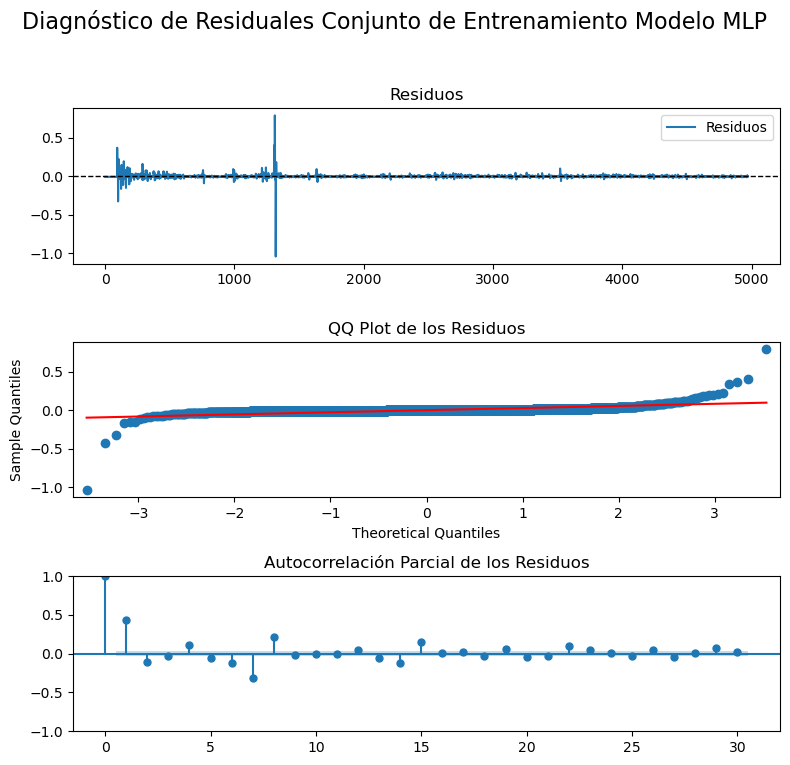

Ljung-Box LB Statistic: 927.516572
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [503]:
ljung_box_pval_LSTM_train7_vola7, jarque_bera_pval_LSTM_train7_vola7 = diagnostic_plots(y_train_vola7, train_preds_vola7_LSTM7)

In [504]:
#calcular las métricas 
metrica_vola7_LSTM_train = metricas(y_train_vola7,train_preds_vola7_LSTM7)
metrica_vola7_LSTM_train.index = metrica_vola7_LSTM_train.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 7  y τ = 7'})
metrica_vola7_LSTM_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train7_vola7], index=metrica_vola7_LSTM_train.index)
metrica_vola7_LSTM_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train7_vola7], index=metrica_vola7_LSTM_train.index)
metrica_vola7_LSTM_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 7 y τ = 7,3.7767,25.3%,0.01,0.0,81.96%,1.0236e-203,0.0


* **Conjunto de datos de Prueba:**

In [505]:
ljung_box_pvalLSTM7_vola7, jarque_bera_pvalLSTM7_vola7 = evaluate_residuals(data_test_plot_vola7, test_preds_vola7_LSTM7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [506]:
metrica_LSTM_test_vola7 = metricas(y_test_vola7,test_preds_vola7_LSTM7)
metrica_LSTM_test_vola7.index = metrica_LSTM_test_vola7.index.map({0: 'LSTM Prueba Volatilidad ω = 7 y τ = 7'})
metrica_LSTM_test_vola7['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM7_vola7], index=metrica_LSTM_test_vola7.index)
metrica_LSTM_test_vola7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM7_vola7], index=metrica_LSTM_test_vola7.index)
metrica_LSTM_test_vola7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 7 y τ = 7,0.0009,40.63%,0.01,0.0,-79.71%,0.1,0.5787


* **Curva Runs vs Error/Score :**

In [507]:
plot_best_model_validation_loss(history_vola7_LSTM7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [508]:
errores_plots(y_train_vola7, train_preds_vola7_LSTM7, y_val_vola7, val_preds_vola7_LSTM7, y_test_vola7, test_preds_vola7_LSTM7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada  del error/score correspondiente al val_loss de la epoca del mejor modelo.
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 14 días ($\tau=14$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [509]:
X_train_vola7_lstm_14, X_val_vola7_lstm_14, X_test_vola7_lstm_14 = change_dimension_lstm(X_train_vola14, X_val_vola14, X_test_vola14)

Shape of 3D arrays X: (4943, 14, 1) (14, 14, 1) (14, 14, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [510]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(14,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola7_lstm_14, y_train_vola14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  33.7s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  33.8s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  34.3s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  34.3s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  34.4s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.02838744101120887


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [511]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM14_vola7 = build_models_lstm(input_shape14, neurons_list, dropout_rates, 'SGD')

Model: "model_358"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_359 (InputLayer)      [(None, 14, 1)]           0         
                                                                 
 lstm_308 (LSTM)             (None, 14, 64)            16896     
                                                                 
 lstm_309 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_358 (Dropout)       (None, 32)                0         
                                                                 
 dense_970 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_3

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [512]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola7_LSTM14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_lstm_vola7 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [513]:
import os
from joblib import dump, load


history_vola7_LSTM14 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM14_vola7):
    filename = f'history_vola7_LSTM14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola7_lstm_14, y=y_train_vola14, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best14_lstm_vola7], validation_data=(X_val_vola7_lstm_14, y_val_vola14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola7_LSTM14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola7_LSTM14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM14_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [514]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola7_LSTM14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best14_lstm_vola7 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best14_lstm_vola7 = load_model(best_model_path)  # Cargar el modelo

    if best14_lstm_vola7 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola7_LSTM14_weights.14-0.0036.keras con val_loss: 0.0036


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [515]:
# Predicciones usando el mejor modelo
if best14_lstm_vola7 is not None:

    train_preds_vola7_LSTM14 = best14_lstm_vola7.predict(X_train_vola7_lstm_14)
    val_preds_vola7_LSTM14 = best14_lstm_vola7.predict(X_val_vola7_lstm_14)
    test_preds_vola7_LSTM14 = best14_lstm_vola7.predict(X_test_vola7_lstm_14)

    # Aplanar las predicciones si es necesario
    train_preds_vola7_LSTM14 = np.squeeze(train_preds_vola7_LSTM14)
    val_preds_vola7_LSTM14 = np.squeeze(val_preds_vola7_LSTM14)
    test_preds_vola7_LSTM14 = np.squeeze(test_preds_vola7_LSTM14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola7_LSTM14)
    print("Predicciones de validación:", val_preds_vola7_LSTM14)
    print("Predicciones de prueba:", test_preds_vola7_LSTM14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 8ms/step
Predicciones de Entrenamiento: [-0.00274402 -0.00274402 -0.00274402 ...  0.00425673  0.00398743
  0.00379878]
Predicciones de validación: [0.00347924 0.00337976 0.00298566 0.0025208  0.00217265 0.00227922
 0.00226325 0.0023182  0.00274348 0.00308675 0.00319052 0.00285405
 0.00234187 0.0020296 ]
Predicciones de prueba: [0.00218773 0.00248724 0.00311935 0.00375837 0.00466251 0.00545257
 0.0056805  0.0056572  0.00546575 0.00549883 0.00661653 0.00749391
 0.00847918 0.00949615]


In [516]:
plot_model(data_train_plot_vola7_14[-100:], data_val_plot_vola7_14, data_test_plot_vola7_14, val_preds_vola7_LSTM14, test_preds_vola7_LSTM14, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

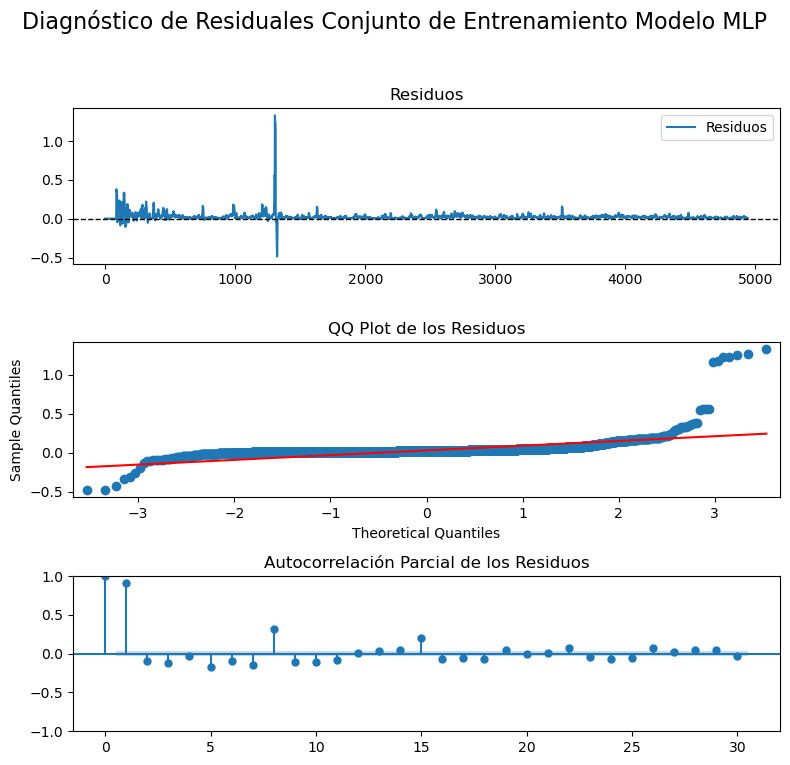

Ljung-Box LB Statistic: 4077.494627
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [517]:
ljung_box_pval_LSTM_train14_vola7, jarque_bera_pval_LSTM_train14_vola7 = diagnostic_plots(y_train_vola14, train_preds_vola7_LSTM14)

In [518]:
#calcular las métricas 
metrica_vola7_LSTM_train14 = metricas(y_train_vola14,train_preds_vola7_LSTM14)
metrica_vola7_LSTM_train14.index = metrica_vola7_LSTM_train14.index.map({0: 'LSTM Entrenamiento Volatilidada ω = 7 y τ = 14'})
metrica_vola7_LSTM_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train14_vola7], index=metrica_vola7_LSTM_train14.index)
metrica_vola7_LSTM_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train14_vola7], index=metrica_vola7_LSTM_train14.index)
metrica_vola7_LSTM_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidada ω = 7 y τ = 14,22.5767,70.72%,0.03,0.0,-7.96%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [519]:
ljung_box_pvalLSTM14_vola7, jarque_bera_pvalLSTM14_vola7 = evaluate_residuals(data_test_plot_vola7_14, test_preds_vola7_LSTM14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [520]:
metrica_LSTM_test14_vola7 = metricas(y_test_vola14,test_preds_vola7_LSTM14)
metrica_LSTM_test14_vola7.index = metrica_LSTM_test14_vola7.index.map({0: 'LSTM Prueba Volatilidada ω = 7 y τ = 14'})
metrica_LSTM_test14_vola7['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM14_vola7], index=metrica_LSTM_test14_vola7.index)
metrica_LSTM_test14_vola7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM14_vola7], index=metrica_LSTM_test14_vola7.index)
metrica_LSTM_test14_vola7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidada ω = 7 y τ = 14,0.0181,86.89%,0.04,0.0,-2059.9%,0.0006,0.5676


* **Curva Runs vs Error/Score :**

In [521]:
plot_best_model_validation_loss(history_vola7_LSTM14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [522]:
errores_plots(y_train_vola14, train_preds_vola7_LSTM14, y_val_vola14, val_preds_vola7_LSTM14, y_test_vola14, test_preds_vola7_LSTM14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 21 días ($\tau=21$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [523]:
X_train_vola7_lstm_21, X_val_vola7_lstm_21, X_test_vola7_lstm_21 = change_dimension_lstm(X_train_vola21, X_val_vola21, X_test_vola21)

Shape of 3D arrays X: (4915, 21, 1) (21, 21, 1) (21, 21, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [524]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(21,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola7_lstm_21, y_train_vola21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  33.7s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  34.1s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  34.2s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  34.2s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  34.3s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.019228006469962713


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [525]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM21_vola7 = build_models_lstm(input_shape21, neurons_list, dropout_rates, 'SGD')

Model: "model_375"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_376 (InputLayer)      [(None, 21, 1)]           0         
                                                                 
 lstm_342 (LSTM)             (None, 21, 64)            16896     
                                                                 
 lstm_343 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_375 (Dropout)       (None, 32)                0         
                                                                 
 dense_987 (Dense)           (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_3

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [526]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola7_LSTM21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_lstm_vola7 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM21`. 

In [527]:
import os
from joblib import dump, load

history_vola7_LSTM21 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM21_vola7):
    filename = f'history_vola7_LSTM21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola7_lstm_21, y=y_train_vola21, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best21_lstm_vola7], validation_data=(X_val_vola7_lstm_21, y_val_vola21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola7_LSTM21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola7_LSTM21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM21_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [528]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola7_LSTM21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best21_lstm_vola7 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best21_lstm_vola7 = load_model(best_model_path)  # Cargar el modelo

    if best21_lstm_vola7 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola7_LSTM21_weights.18-0.0029.keras con val_loss: 0.0029


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [529]:
print("Archivos en el directorio 'keras_models':", files)

Archivos en el directorio 'keras_models': ['PRSA_data_vola14_MLP7_weights.04-0.0018.keras', 'PRSA_data_price_MLP21_weights.01-3579.4128.keras', 'PRSA_data_price_LSTM21_weights.01-43062.3047.keras', 'PRSA_data_price_LSTM28_weights.02-42892.2305.keras', 'PRSA_data_price_LSTM_weights.19-67016.3047.keras', 'PRSA_data_at_LSTM28_weights.19-0.0651.keras', 'PRSA_data_vola14_MLP21_weights.20-0.0011.keras', 'PRSA_data_price_LSTM14_weights.06-51394.8750.keras', 'PRSA_data_vola21_LSTM7_weights.04-0.0012.keras', 'PRSA_data_vola7_MLP28_weights.07-0.0033.keras', 'PRSA_data_price_LSTM21_weights.02-43052.0469.keras', 'PRSA_data_at_MLP7_weights.80-0.0780.keras', 'PRSA_data_vola21_LSTM28_weights.02-0.0022.keras', 'PRSA_data_vola21_LSTM14_weights.04-0.0011.keras', 'PRSA_data_vola7_LSTM21_weights.18-0.0029.keras', 'PRSA_data_vola21_LSTM7_weights.08-0.0013.keras', 'PRSA_data_vola28_MLP14_weights.04-0.0013.keras', 'PRSA_data_price_MLP14_weights.52-626.2623.keras', 'PRSA_data_vola7_MLP7_weights.15-0.0041.kera

In [530]:
# Predicciones usando el mejor modelo
if best21_lstm_vola7 is not None:

    train_preds_vola7_LSTM21 = best21_lstm_vola7.predict(X_train_vola7_lstm_21)
    val_preds_vola7_LSTM21 = best21_lstm_vola7.predict(X_val_vola7_lstm_21)
    test_preds_vola7_LSTM21 = best21_lstm_vola7.predict(X_test_vola7_lstm_21)

    # Aplanar las predicciones si es necesario
    train_preds_vola7_LSTM21 = np.squeeze(train_preds_vola7_LSTM21)
    val_preds_vola7_LSTM21 = np.squeeze(val_preds_vola7_LSTM21)
    test_preds_vola7_LSTM21 = np.squeeze(test_preds_vola7_LSTM21)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola7_LSTM21)
    print("Predicciones de validación:", val_preds_vola7_LSTM21)
    print("Predicciones de prueba:", test_preds_vola7_LSTM21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 11ms/step
Predicciones de Entrenamiento: [0.00212656 0.00212656 0.00212656 ... 0.03160746 0.02004464 0.02042018]
Predicciones de validación: [0.01799716 0.02328799 0.02221119 0.02308705 0.02022305 0.02754546
 0.02737788 0.02746651 0.01859613 0.02032319 0.02131993 0.0208174
 0.01417792 0.01465186 0.01526489 0.00920259 0.00979322 0.01358811
 0.01472801 0.01896005 0.01731177]
Predicciones de prueba: [0.01386316 0.01310514 0.01601098 0.01761301 0.01918736 0.01751395
 0.0196478  0.01954441 0.01759475 0.01712902 0.00904147 0.01006424
 0.0101563  0.01246948 0.01188461 0.02315512 0.02695226 0.03802651
 0.03924298 0.036187   0.03816754]


In [531]:
plot_model(data_train_plot_vola21[-100:], data_val_plot_vola21, data_test_plot_vola21, val_preds_vola7_LSTM21, test_preds_vola7_LSTM21, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

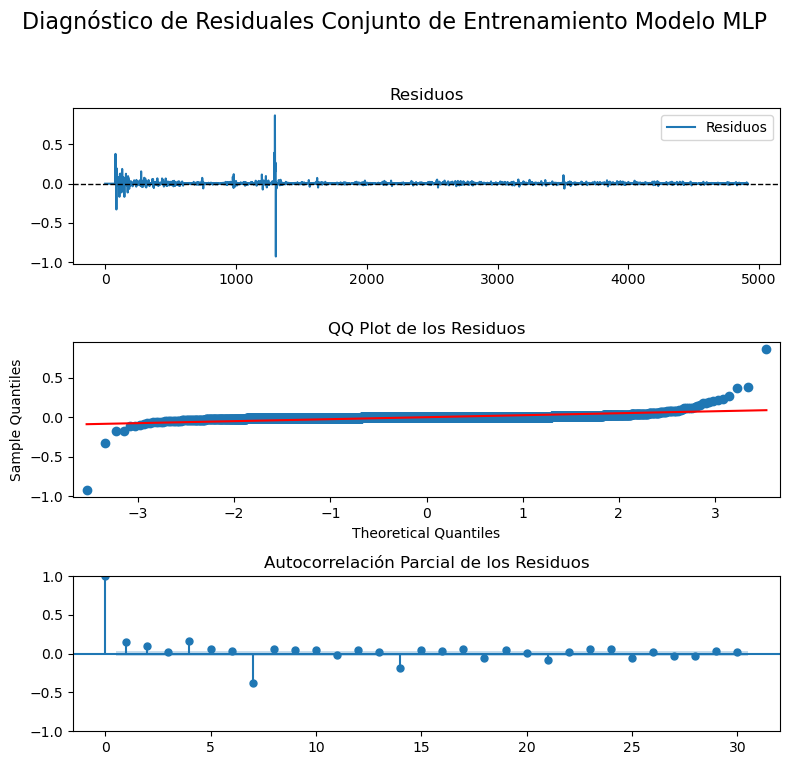

Ljung-Box LB Statistic: 102.227037
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [532]:
ljung_box_pval_LSTM_train21_vola7, jarque_bera_pval_LSTM_train21_vola7 = diagnostic_plots(y_train_vola21, train_preds_vola7_LSTM21)

In [533]:
#calcular las métricas 
metrica_vola7_LSTM_train21 = metricas(y_train_vola21,train_preds_vola7_LSTM21)
metrica_vola7_LSTM_train21.index = metrica_vola7_LSTM_train21.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 7 y τ = 21'})
metrica_vola7_LSTM_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train21_vola7], index=metrica_vola7_LSTM_train21.index)
metrica_vola7_LSTM_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train21_vola7], index=metrica_vola7_LSTM_train21.index)
metrica_vola7_LSTM_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 7 y τ = 21,3.1251,16.51%,0.01,0.0,85.04%,4.9510e-24,0.0


* **Conjunto de datos de Prueba:**

In [534]:
ljung_box_pvalLSTM21_vola7, jarque_bera_pvalLSTM21_vola7 = evaluate_residuals(data_test_plot_vola21, test_preds_vola7_LSTM21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [535]:
metrica_LSTM_test21_vola7 = metricas(y_test_vola21,test_preds_vola7_LSTM21)
metrica_LSTM_test21_vola7.index = metrica_LSTM_test21_vola7.index.map({0: 'LSTM Prueba Volatilidad ω = 7 y τ = 21'})
metrica_LSTM_test21_vola7['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM21_vola7], index=metrica_LSTM_test21_vola7.index)
metrica_LSTM_test21_vola7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM21_vola7], index=metrica_LSTM_test21_vola7.index)
metrica_LSTM_test21_vola7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 7 y τ = 21,0.0004,16.96%,0.0,0.0,83.37%,0.0013,0.3839


##### Horizonte de 28 días ($\tau=28$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [536]:
X_train_vola7_lstm_28, X_val_vola7_lstm_28, X_test_vola7_lstm_28 = change_dimension_lstm(X_train_vola28, X_val_vola28, X_test_vola28)

Shape of 3D arrays X: (4887, 28, 1) (28, 28, 1) (28, 28, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [537]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(28,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola7_lstm_28, y_train_vola28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  45.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  46.0s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  46.0s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  46.1s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  46.6s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.02121390635641183


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [538]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM28_vola7 = build_models_lstm(input_shape28, neurons_list, dropout_rates, 'SGD')

Model: "model_392"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_393 (InputLayer)      [(None, 28, 1)]           0         
                                                                 
 lstm_376 (LSTM)             (None, 28, 64)            16896     
                                                                 
 lstm_377 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_392 (Dropout)       (None, 32)                0         
                                                                 
 dense_1004 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_3

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [539]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola7_LSTM28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_lstm_vola7 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM28_at`. 

In [540]:
import os
from joblib import dump, load

history_vola7_LSTM28 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM28_vola7):
    filename = f'history_vola7_LSTM28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola7_lstm_28, y=y_train_vola28, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best28_lstm_vola7], validation_data=(X_val_vola7_lstm_28, y_val_vola28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola7_LSTM28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola7_LSTM28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola7_LSTM28_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [541]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola7_LSTM28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best28_lstm_vola7 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best28_lstm_vola7 = load_model(best_model_path)  # Cargar el modelo

    if best28_lstm_vola7 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola7_LSTM28_weights.16-0.0035.keras con val_loss: 0.0035


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [542]:
# Predicciones usando el mejor modelo
if best28_lstm_vola7 is not None:

    train_preds_vola7_LSTM28 = best28_lstm_at.predict(X_train_vola7_lstm_28)
    val_preds_vola7_LSTM28 = best28_lstm_at.predict(X_val_vola7_lstm_28)
    test_preds_vola7_LSTM28 = best28_lstm_at.predict(X_test_vola7_lstm_28)

    # Aplanar las predicciones si es necesario
    train_preds_vola7_LSTM28 = np.squeeze(train_preds_vola7_LSTM28)
    val_preds_vola7_LSTM28 = np.squeeze(val_preds_vola7_LSTM28)
    test_preds_vola7_LSTM28 = np.squeeze(test_preds_vola7_LSTM28)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola7_LSTM28)
    print("Predicciones de validación:", val_preds_vola7_LSTM28)
    print("Predicciones de prueba:", test_preds_vola7_LSTM28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 26ms/step
Predicciones de Entrenamiento: [-0.16464579 -0.16464579 -0.16464579 ... -0.15521419 -0.15435004
 -0.15323317]
Predicciones de validación: [-0.15223265 -0.14996803 -0.14731658 -0.14387465 -0.1399244  -0.13663316
 -0.13436258 -0.13323438 -0.13197696 -0.13088    -0.13150823 -0.13393974
 -0.13469899 -0.13367212 -0.13190413 -0.13233006 -0.13432562 -0.13689518
 -0.13935173 -0.14361513 -0.14895964 -0.15434349 -0.15805078 -0.15969312
 -0.15963662 -0.15856397 -0.1554302  -0.15066576]
Predicciones de prueba: [-0.14557588 -0.14251196 -0.1415869  -0.1415354  -0.14236629 -0.14519548
 -0.14926851 -0.15327644 -0.15760005 -0.16170609 -0.16421509 -0.16462171
 -0.16225874 -0.15851378 -0.15507829 -0.15285218 -0.1508125  -0.14873588
 -0.14664638 -0.14565146 -0.14520538 -0.14526379 -0.14600646 -0.14747202
 -0.15073383 -0.15503848 -0.15885818 -0.16147268]


In [543]:
plot_model(data_train_plot_vola28[-100:], data_val_plot_vola28, data_test_plot_vola28, val_preds_vola7_LSTM28, test_preds_vola7_LSTM28, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

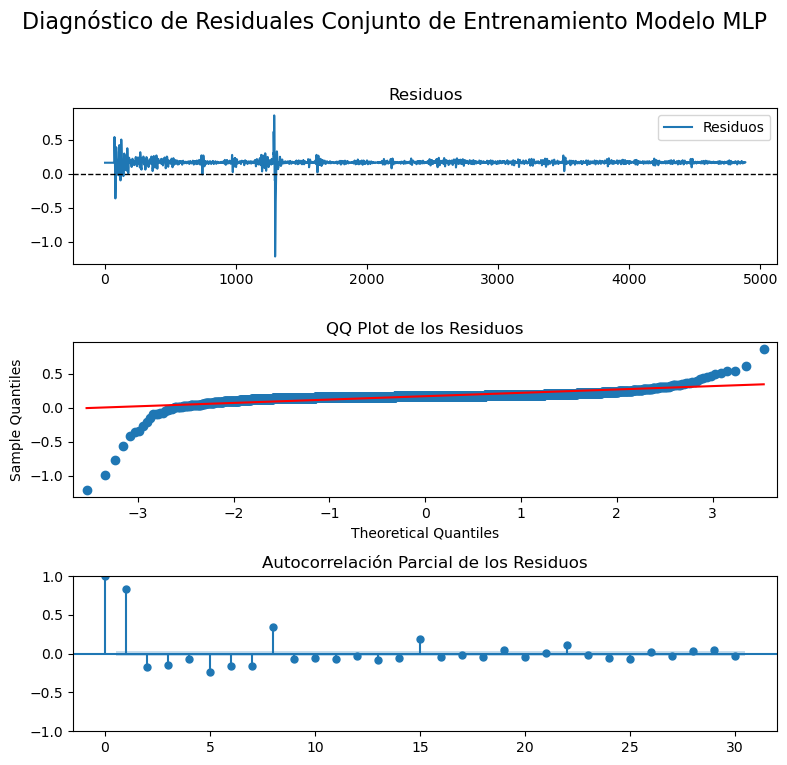

Ljung-Box LB Statistic: 3355.381660
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [544]:
ljung_box_pval_LSTM_train28_vola7, jarque_bera_pval_LSTM_train28_vola7 = diagnostic_plots(y_train_vola28, train_preds_vola7_LSTM28)

In [545]:
#calcular las métricas 
metrica_vola7_LSTM_train28 = metricas(y_train_vola28,train_preds_vola7_LSTM28)
metrica_vola7_LSTM_train28.index = metrica_vola7_LSTM_train28.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 7 y τ = 28'})
metrica_vola7_LSTM_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train28_vola7], index=metrica_vola7_LSTM_train28.index)
metrica_vola7_LSTM_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train28_vola7], index=metrica_vola7_LSTM_train28.index)
metrica_vola7_LSTM_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 7 y τ = 28,153.8155,722.37%,0.17,0.03,-636.93%,0.0,0.0


* **Conjunto de datos de Prueba:**

In [546]:
ljung_box_pvalLSTM28_vola7, jarque_bera_pvalLSTM28_vola7 = evaluate_residuals(data_test_plot_vola28, test_preds_vola7_LSTM28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [547]:
metrica_LSTM_test28_vola7 = metricas(y_test_vola28,test_preds_vola7_LSTM28)
metrica_LSTM_test28_vola7.index = metrica_LSTM_test28_vola7.index.map({0: 'LSTM Prueba Volatilidad ω = 7 y τ = 28'})
metrica_LSTM_test28_vola7['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM28_vola7], index=metrica_LSTM_test28_vola7.index)
metrica_LSTM_test28_vola7['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM28_vola7], index=metrica_LSTM_test28_vola7.index)
metrica_LSTM_test28_vola7

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 7 y τ = 28,0.7755,1222.52%,0.17,0.03,-164359.56%,6.6758e-06,0.3047


* **Curva Runs vs Error/Score :**

In [548]:
plot_best_model_validation_loss(history_vola7_LSTM28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [549]:
errores_plots(y_train_vola28, train_preds_vola7_LSTM28, y_val_vola28, val_preds_vola7_LSTM28, y_test_vola28, test_preds_vola7_LSTM28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



#### <font color="#30143">Volatilidad ω = 14  (Volatilidad_14): Perceptrones Multicapa (MLP)</font>


##### Horizonte de 7 días ($\tau=7$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [550]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(7,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': [ 'tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [20], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola14_7, y_train_vola14_7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   3.7s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   3.6s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   3.7s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   3.8s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   4.0s
Mejor función de activación: tanh
Mejor número de epocas: 20
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.004182608053088188


A idexación de parámetros función `build_models` con base a lo indicado en el númeral 3 del parcial práctico. 

In [551]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP7_vola14 = build_models_mlp(input_shape7, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_409"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_410 (InputLayer)      [(None, 7)]               0         
                                                                 
 dense_1024 (Dense)          (None, 32)                256       
                                                                 
 dense_1025 (Dense)          (None, 16)                528       
                                                                 
 dense_1026 (Dense)          (None, 16)                272       
                                                                 
 dropout_409 (Dropout)       (None, 16)                0         
                                                                 
 dense_1027 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,073

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [552]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola14_MLP7_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_vola14 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP7`. 

In [553]:
import os
from joblib import dump, load

history_vola14_MPL7 = []

# Iterar sobre cada modelo en la lista models_MLP7
for i, model in enumerate(models_MLP7_vola14):
    filename = f'history_vola14_MPL7_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola14_7, y=y_train_vola14_7, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best7_vola14], validation_data=(X_val_vola14_7, y_val_vola14_7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola14_MPL7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola14_MPL7_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL7_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL7_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL7_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL7_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL7_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL7_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL7_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL7_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL7_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [554]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola14_MLP7_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model7_vola14 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model7_vola14 = load_model(best_model_path)  # Cargar el modelo

    if best_model7_vola14 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola14_MLP7_weights.18-0.0015.keras con val_loss: 0.0015


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [555]:
# Predicciones usando el mejor modelo
if best_model7_vola14 is not None:

    train_preds_vola14_MLP7 = best_model7_vola14.predict(X_train_vola14_7)
    val_preds_vola14_MLP7 = best_model7_vola14.predict(X_val_vola14_7)
    test_preds_vola14_MLP7 = best_model7_vola14.predict(X_test_vola14_7)

    # Aplanar las predicciones si es necesario
    train_preds_vola14_MLP7 = np.squeeze(train_preds_vola14_MLP7)
    val_preds_vola14_MLP7 = np.squeeze(val_preds_vola14_MLP7)
    test_preds_vola14_MLP7 = np.squeeze(test_preds_vola14_MLP7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola14_MLP7)
    print("Predicciones de validación:", val_preds_vola14_MLP7)
    print("Predicciones de prueba:", test_preds_vola14_MLP7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 12ms/step
Predicciones de Entrenamiento: [0.00764726 0.00764726 0.00764726 ... 0.03479    0.03484715 0.03467152]
Predicciones de validación: [0.03446774 0.03602793 0.04187463 0.04201755 0.0411687  0.04030391
 0.04022796]
Predicciones de prueba: [0.03987313 0.0395385  0.03954877 0.03516226 0.0350638  0.03558356
 0.03882359]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [556]:
data_train_plot_vola14_7, data_val_plot_vola14_7, data_test_plot_vola14_7 = data_plot(df_1_st['Volatilidad_14'], 7)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
18      0.0424
17      0.0416
16      0.0406
15      0.0409
14      0.0408
Name: Volatilidad_14, Length: 4985, dtype: float647

Datos de validación:
13    0.0403
12    0.0403
11    0.0337
10    0.0338
9     0.0352
8     0.0395
7     0.0410
Name: Volatilidad_14, dtype: float647

Datos de prueba:
6    0.0351
5    0.0376
4    0.0445
3    0.0455
2    0.0456
1    0.0456
0    0.0478
Name: Volatilidad_14, dtype: float647


In [557]:
plot_model(data_train_plot_vola14_7[-100:], data_val_plot_vola14_7, data_test_plot_vola14_7, val_preds_vola14_MLP7, test_preds_vola14_MLP7, "Predicciones usando Perceptrón Multicapa (MLP)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

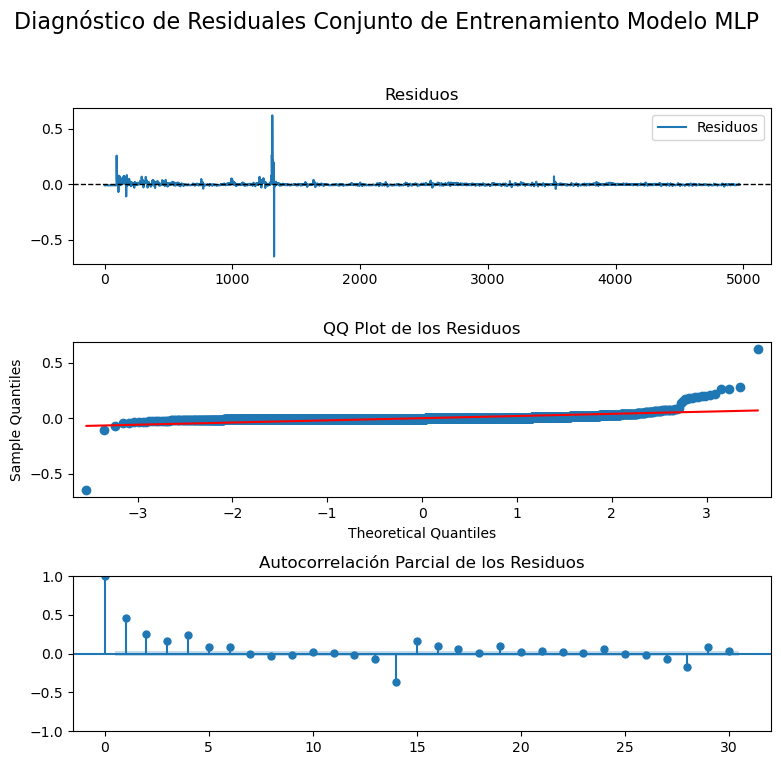

Ljung-Box LB Statistic: 1033.132088
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [558]:
ljung_box_pval_MLP_train7_vola14, jarque_bera_pval_MLP_train7_vola14 = diagnostic_plots(y_train_vola14_7, train_preds_vola14_MLP7)

In [559]:
#calcular las métricas 
metrica_vola14_MLP_train = metricas(y_train_vola14_7,train_preds_vola14_MLP7)
metrica_vola14_MLP_train.index = metrica_vola14_MLP_train.index.map({0: 'MLP Entrenamiento Volatilidad ω = 14 y τ = 7'})
metrica_vola14_MLP_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train7_vola14], index=metrica_vola14_MLP_train.index)
metrica_vola14_MLP_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train7_vola14], index=metrica_vola14_MLP_train.index)
metrica_vola14_MLP_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 14 y τ = 7,1.9199,16.54%,0.01,0.0,90.16%,1.1289e-226,0.0


* **Conjunto de datos de Prueba:**

In [560]:
ljung_box_pvalMLP7_vola14, jarque_bera_pvalMLP7_vola14 = evaluate_residuals(data_test_plot_vola14_7, test_preds_vola14_MLP7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [561]:
metrica_MLP7_test_vola14 = metricas(y_test_vola14_7,test_preds_vola14_MLP7)
metrica_MLP7_test_vola14.index = metrica_MLP7_test_vola14.index.map({0: 'MLP Prueba Volatilidad ω = 14 y τ = 7'})
metrica_MLP7_test_vola14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP7_vola14], index=metrica_MLP7_test_vola14.index)
metrica_MLP7_test_vola14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP7_vola14], index=metrica_MLP7_test_vola14.index)
metrica_MLP7_test_vola14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 14 y τ = 7,5.8058e-05,5.78%,0.0,0.0,12.02%,0.0597,0.5949


* **Curva Runs vs Error/Score :**

In [562]:
plot_best_model_validation_loss(history_vola14_MPL7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [563]:
errores_plots(y_train_vola14_7, train_preds_vola14_MLP7, y_val_vola14_7, val_preds_vola14_MLP7, y_test_vola14_7, test_preds_vola14_MLP7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 14 días ($\tau=14$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [564]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(14,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola14_14, y_train_vola14_14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.7s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.9s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   8.9s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   9.1s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   9.2s
Mejor función de activación: tanh
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.004547589644789696


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(14,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 14 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [565]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP14_vola14 = build_models_mlp(input_shape14, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_426"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_427 (InputLayer)      [(None, 14)]              0         
                                                                 
 dense_1092 (Dense)          (None, 32)                480       
                                                                 
 dense_1093 (Dense)          (None, 16)                528       
                                                                 
 dense_1094 (Dense)          (None, 16)                272       
                                                                 
 dropout_426 (Dropout)       (None, 16)                0         
                                                                 
 dense_1095 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,297

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [566]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola14_MLP14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_vola14 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP14`. 

In [567]:
import os
from joblib import dump, load

history_vola14_MPL14 = []

# Iterar sobre cada modelo en la lista models
for i, model in enumerate(models_MLP14_vola14):
    filename = f'history_vola14_MPL14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola14_14, y=y_train_vola14_14, batch_size=16, epochs=50, 
                                  verbose=2, callbacks=[save_best14_vola14], validation_data=(X_val_vola14_14, y_val_vola14_14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola14_MPL14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola14_MPL14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL14_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [568]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola14_MLP14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model14_vola14 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model14_vola14 = load_model(best_model_path)  # Cargar el modelo

    if best_model14_vola14 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola14_MLP14_weights.29-0.0005.keras con val_loss: 0.0005


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [569]:
# Predicciones usando el mejor modelo
if best_model14_vola14 is not None:

    train_preds_vola14_MLP14 = best_model14_vola14.predict(X_train_vola14_14)
    val_preds_vola14_MLP14 = best_model14_vola14.predict(X_val_vola14_14)
    test_preds_vola14_MLP14 = best_model14_vola14.predict(X_test_vola14_14)


    # Aplanar las predicciones si es necesario
    train_preds_vola14_MLP14 = np.squeeze(train_preds_vola14_MLP14)
    val_preds_vola14_MLP14 = np.squeeze(val_preds_vola14_MLP14)
    test_preds_vola14_MLP14 = np.squeeze(test_preds_vola14_MLP14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola14_MLP14)
    print("Predicciones de validación:", val_preds_vola14_MLP14)
    print("Predicciones de prueba:", test_preds_vola14_MLP14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 12ms/step
Predicciones de Entrenamiento: [0.00022482 0.00022482 0.00022482 ... 0.01751764 0.01638739 0.01642246]
Predicciones de validación: [0.01591108 0.01651501 0.01639629 0.01728163 0.01726819 0.01710023
 0.01765272 0.01653662 0.01709314 0.01711379 0.01744539 0.01801313
 0.0163977  0.01645755]
Predicciones de prueba: [0.01653196 0.01963498 0.02204968 0.03054131 0.03172324 0.03166819
 0.03142552 0.03172671 0.03547365 0.04214239 0.04164523 0.0406197
 0.03986698 0.04073464]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 14 días ($\tau = 14$). 

In [570]:
data_train_plot_vola14_14, data_val_plot_vola14_14, data_test_plot_vola14_14 = data_plot(df_1_st['Volatilidad_14'], 14)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
32      0.0173
31      0.0180
30      0.0163
29      0.0164
28      0.0163
Name: Volatilidad_14, Length: 4971, dtype: float6414

Datos de validación:
27    0.0195
26    0.0220
25    0.0307
24    0.0320
23    0.0320
22    0.0318
21    0.0318
20    0.0358
19    0.0426
18    0.0424
17    0.0416
16    0.0406
15    0.0409
14    0.0408
Name: Volatilidad_14, dtype: float6414

Datos de prueba:
13    0.0403
12    0.0403
11    0.0337
10    0.0338
9     0.0352
8     0.0395
7     0.0410
6     0.0351
5     0.0376
4     0.0445
3     0.0455
2     0.0456
1     0.0456
0     0.0478
Name: Volatilidad_14, dtype: float6414


In [571]:
plot_model(data_train_plot_vola14_14[-100:], data_val_plot_vola14_14, data_test_plot_vola14_14, val_preds_vola14_MLP14, test_preds_vola14_MLP14, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

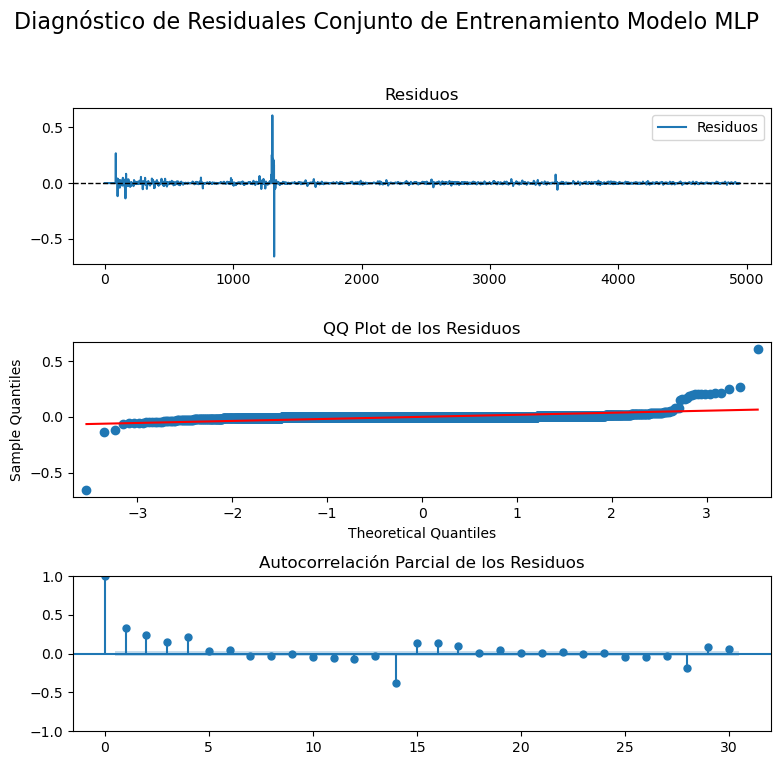

Ljung-Box LB Statistic: 552.860958
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [572]:
ljung_box_pval_MLP_train14_vola14, jarque_bera_pval_MLP_train14_vola14 = diagnostic_plots(y_train_vola14_14, train_preds_vola14_MLP14)

In [573]:
#calcular las métricas 
metrica_vola14_MLP_train14 = metricas(y_train_vola14_14,train_preds_vola14_MLP14)
metrica_vola14_MLP_train14.index = metrica_vola14_MLP_train14.index.map({0: 'MLP Entrenamiento Volatilidad ω = 14  y τ = 14'})
metrica_vola14_MLP_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train14_vola14], index=metrica_vola14_MLP_train14.index)
metrica_vola14_MLP_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train14_vola14], index=metrica_vola14_MLP_train14.index)
metrica_vola14_MLP_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 14 y τ = 14,1.666,7.83%,0.0,0.0,91.45%,3.0034e-122,0.0


* **Conjunto de datos de Prueba:**

In [574]:
ljung_box_pvalMLP14_vola14, jarque_bera_pvalMLP14_vola14 = evaluate_residuals(data_test_plot_vola14_14, test_preds_vola14_MLP14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [575]:
metrica_MLP14_test_vola14= metricas(y_test_vola14_14,test_preds_vola14_MLP14)
metrica_MLP14_test_vola14.index = metrica_MLP14_test_vola14.index.map({0: 'MLP Prueba Volatilidad ω = 14  τ = 14'})
metrica_MLP14_test_vola14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP14_vola14], index=metrica_MLP14_test_vola14.index)
metrica_MLP14_test_vola14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP14_vola14], index=metrica_MLP14_test_vola14.index)
metrica_MLP14_test_vola14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 14 τ = 14,0.0002,6.6%,0.0,0.0,77.85%,0.0148,0.0687


* **Curva Runs vs Error/Score :**

In [576]:
plot_best_model_validation_loss(history_vola14_MPL14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [577]:
errores_plots(y_train_vola14_14, train_preds_vola14_MLP14, y_val_vola14_14, val_preds_vola14_MLP14, y_test_vola14_14, test_preds_vola14_MLP14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra cercana  del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada error/score correspondiente al val_loss de la epoca del mejor modelo.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. Sin embargo, a pesar de esto, se evidencia que existe autocorrelación en los residuales, lo que hace que nuestro modelo no sea confiable.


##### Horizonte de 21 días ($\tau=21$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [578]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(21,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [100], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola14_21, y_train_vola14_21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.3s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.4s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.6s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.6s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.7s
Mejor función de activación: tanh
Mejor número de epocas: 100
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.005027637165039778


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(21,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 21 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [579]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP21_vola14 = build_models_mlp(input_shape21, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_443"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_444 (InputLayer)      [(None, 21)]              0         
                                                                 
 dense_1160 (Dense)          (None, 32)                704       
                                                                 
 dense_1161 (Dense)          (None, 16)                528       
                                                                 
 dense_1162 (Dense)          (None, 16)                272       
                                                                 
 dropout_443 (Dropout)       (None, 16)                0         
                                                                 
 dense_1163 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,521

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [580]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola14_MLP21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_vola14 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP21`. 

In [581]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola14_MPL21 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP21_vola14):
    filename = f'history_vola14_MPL21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola14_21, y=y_train_vola14_21, batch_size=16, epochs=100, 
                                  verbose=2, callbacks=[save_best21_vola14], validation_data=(X_val_vola14_21, y_val_vola14_21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola14_MPL21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola14_MPL21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL21_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [582]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola14_MLP21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model21_vola14 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model21_vola14 = load_model(best_model_path)  # Cargar el modelo

    if best_model21_vola14 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola14_MLP21_weights.78-0.0010.keras con val_loss: 0.001


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [583]:
# Predicciones usando el mejor modelo
if best_model21_vola14 is not None:
    train_preds_vola14_MLP21 = best_model21_vola14.predict(X_train_vola14_21)
    val_preds_vola14_MLP21 = best_model21_vola14.predict(X_val_vola14_21)
    test_preds_vola14_MLP21 = best_model21_vola14.predict(X_test_vola14_21)

    # Aplanar las predicciones si es necesario
    train_preds_vola14_MLP21 = np.squeeze(train_preds_vola14_MLP21)
    val_preds_vola14_MLP21 = np.squeeze(val_preds_vola14_MLP21)
    test_preds_vola14_MLP21 = np.squeeze(test_preds_vola14_MLP21)

    # Imprimir las predicciones
    print('Predicciones de entrenamiento', train_preds_vola14_MLP21)
    print("Predicciones de validación:", val_preds_vola14_MLP21)
    print("Predicciones de prueba:", test_preds_vola14_MLP21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 7ms/step
Predicciones de entrenamiento [0.00170384 0.00170384 0.00170384 ... 0.03128495 0.03137413 0.03155865]
Predicciones de validación: [0.02987536 0.02663189 0.02687607 0.02677922 0.02439515 0.02333529
 0.02329596 0.02307745 0.02326437 0.02363529 0.02297621 0.02091753
 0.02092136 0.02098885 0.02263275 0.01579397 0.01604423 0.01688812
 0.01790908 0.01618985 0.01664273]
Predicciones de prueba: [0.01572575 0.01651403 0.01619201 0.01759873 0.01729779 0.0172427
 0.01761704 0.01805063 0.01718391 0.0168886  0.01736357 0.01842539
 0.01668458 0.01685067 0.01660944 0.01970051 0.02169567 0.03005343
 0.03147137 0.03141434 0.03174061]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 21 días ($\tau = 21$). 

In [584]:
data_train_plot_vola14_21, data_val_plot_vola14_21, data_test_plot_vola14_21 = data_plot(df_1_st['Volatilidad_14'], 21)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
46      0.0170
45      0.0171
44      0.0161
43      0.0161
42      0.0158
Name: Volatilidad_14, Length: 4957, dtype: float6421

Datos de validación:
41    0.0162
40    0.0159
39    0.0169
38    0.0172
37    0.0171
36    0.0175
35    0.0163
34    0.0170
33    0.0170
32    0.0173
31    0.0180
30    0.0163
29    0.0164
28    0.0163
27    0.0195
26    0.0220
25    0.0307
24    0.0320
23    0.0320
22    0.0318
21    0.0318
Name: Volatilidad_14, dtype: float6421

Datos de prueba:
20    0.0358
19    0.0426
18    0.0424
17    0.0416
16    0.0406
15    0.0409
14    0.0408
13    0.0403
12    0.0403
11    0.0337
10    0.0338
9     0.0352
8     0.0395
7     0.0410
6     0.0351
5     0.0376
4     0.0445
3     0.0455
2     0.0456
1     0.0456
0     0.0478
Name: Volatilidad_14, dtype: float6421


In [585]:
plot_model(data_train_plot_vola14_21[-100:], data_val_plot_vola14_21, data_test_plot_vola14_21, val_preds_vola14_MLP21, test_preds_vola14_MLP21, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

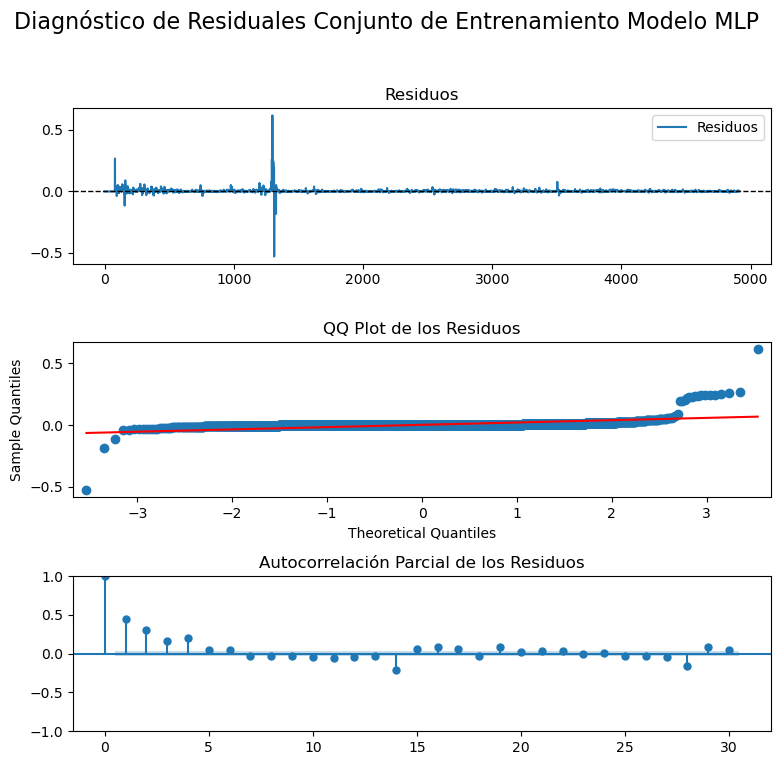

Ljung-Box LB Statistic: 1007.350768
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [586]:
ljung_box_pval_MLP_train21_vola14, jarque_bera_pval_MLP_train21_vola14 = diagnostic_plots(y_train_vola14_21, train_preds_vola14_MLP21)

In [587]:
#calcular las métricas 
metrica_vola14_MLP_train21 = metricas(y_train_vola14_21,train_preds_vola14_MLP21)
metrica_vola14_MLP_train21.index = metrica_vola14_MLP_train21.index.map({0: 'MLP Entrenamiento Volatilidad ω = 14 y τ = 21'})
metrica_vola14_MLP_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train21_vola14], index=metrica_vola14_MLP_train21.index)
metrica_vola14_MLP_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train21_vola14], index=metrica_vola14_MLP_train21.index)
metrica_vola14_MLP_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 14 y τ = 21,1.7507,8.31%,0.0,0.0,91.0%,4.5340e-221,0.0


* **Conjunto de datos de Prueba:**

In [588]:
ljung_box_pvalMLP21_vola14, jarque_bera_pvalMLP21_vola14 = evaluate_residuals(data_test_plot_vola14_21, test_preds_vola14_MLP21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [589]:
metrica_MLP21_test_vola14 = metricas(y_test_vola14_21,test_preds_vola14_MLP21)
metrica_MLP21_test_vola14.index = metrica_MLP21_test_vola14.index.map({0: 'MLP Prueba Volatilidad ω = 14 y τ = 21'})
metrica_MLP21_test_vola14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP21_vola14], index=metrica_MLP21_test_vola14.index)
metrica_MLP21_test_vola14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP21_vola14], index=metrica_MLP21_test_vola14.index)
metrica_MLP21_test_vola14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 14 y τ = 21,0.0001,5.67%,0.0,0.0,86.73%,0.0036,0.3858


* **Curva Runs vs Error/Score :**

In [590]:
plot_best_model_validation_loss(history_vola14_MPL21)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [591]:
errores_plots(y_train_vola14_21, train_preds_vola14_MLP21, y_val_vola14_21, val_preds_vola14_MLP21, y_test_vola14_21, test_preds_vola14_MLP21)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 28 días ($\tau=28$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [592]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(28,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola14_28, y_train_vola14_28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.8s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.8s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.8s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.8s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.9s
Mejor función de activación: relu
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.004603199660778046


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(28,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 28 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [593]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP28_vola14 = build_models_mlp(input_shape28, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_460"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_461 (InputLayer)      [(None, 28)]              0         
                                                                 
 dense_1228 (Dense)          (None, 32)                928       
                                                                 
 dense_1229 (Dense)          (None, 16)                528       
                                                                 
 dense_1230 (Dense)          (None, 16)                272       
                                                                 
 dropout_460 (Dropout)       (None, 16)                0         
                                                                 
 dense_1231 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,745

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [594]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola14_MLP28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_vola14 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP28`. 

In [595]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola14_MPL28 = []

# Iterar sobre cada modelo en la lista models
for i, model in enumerate(models_MLP28_vola14):
    filename = f'history_vola14_MPL28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola14_28, y=y_train_vola14_28, batch_size=16, epochs=50,  #Las epocas son las estimadas en el grid search
                                  verbose=2, callbacks=[save_best28_vola14], validation_data=(X_val_vola14_28, y_val_vola14_28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola14_MPL28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola14_MPL28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_MPL28_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [596]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola14_MLP28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model28_vola14 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model28_vola14 = load_model(best_model_path)  # Cargar el modelo

    if best_model28_vola14 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola14_MLP28_weights.31-0.0011.keras con val_loss: 0.0011


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [597]:
# Predicciones usando el mejor modelo
if best_model28_vola14 is not None:
    train_preds_vola14_MLP28 = best_model28_vola14.predict(X_train_vola14_28)
    val_preds_vola14_MLP28 = best_model28_vola14.predict(X_val_vola14_28)
    test_preds_vola14_MLP28 = best_model28_vola14.predict(X_test_vola14_28)

    # Aplanar las predicciones si es necesario
    train_preds_vola14_MLP28 = np.squeeze(train_preds_vola14_MLP28)
    val_preds_vola14_MLP28 = np.squeeze(val_preds_vola14_MLP28)
    test_preds_vola14_MLP28 = np.squeeze(test_preds_vola14_MLP28)

    # Imprimir las predicciones
    print("Predicciones de entrenamiento:", train_preds_vola14_MLP28)
    print("Predicciones de validación:", val_preds_vola14_MLP28)
    print("Predicciones de prueba:", test_preds_vola14_MLP28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de entrenamiento: [0.00596403 0.00596403 0.00596403 ... 0.02038304 0.02024306 0.01999932]
Predicciones de validación: [0.01989005 0.02129651 0.02071984 0.02234683 0.02395498 0.02456236
 0.02435488 0.02554766 0.02928887 0.03004147 0.0294     0.02937974
 0.03471796 0.03623903 0.03580884 0.03472243 0.03353471 0.03160591
 0.0319986  0.03224634 0.03198493 0.03060053 0.02734821 0.02674336
 0.02669819 0.02469058 0.02361169 0.02332568]
Predicciones de prueba: [0.02341563 0.02329951 0.0239257  0.0232718  0.02181141 0.02139834
 0.02170686 0.02298849 0.0185006  0.01725134 0.01746814 0.01890099
 0.01789921 0.01819181 0.01704365 0.01761634 0.01743313 0.01868746
 0.01865299 0.01883747 0.0188517  0.01915296 0.01872328 0.01836095
 0.01840936 0.01957742 0.01822976 0.01814106]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [598]:
data_train_plot_vola14_28, data_val_plot_vola14_28 , data_test_plot_vola14_28 = data_plot(df_1_st['Volatilidad_14'], 28)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
60      0.0268
59      0.0268
58      0.0236
57      0.0237
56      0.0226
Name: Volatilidad_14, Length: 4943, dtype: float6428

Datos de validación:
55    0.0235
54    0.0233
53    0.0233
52    0.0213
51    0.0212
50    0.0213
49    0.0215
48    0.0158
47    0.0158
46    0.0170
45    0.0171
44    0.0161
43    0.0161
42    0.0158
41    0.0162
40    0.0159
39    0.0169
38    0.0172
37    0.0171
36    0.0175
35    0.0163
34    0.0170
33    0.0170
32    0.0173
31    0.0180
30    0.0163
29    0.0164
28    0.0163
Name: Volatilidad_14, dtype: float6428

Datos de prueba:
27    0.0195
26    0.0220
25    0.0307
24    0.0320
23    0.0320
22    0.0318
21    0.0318
20    0.0358
19    0.0426
18    0.0424
17    0.0416
16    0.0406
15    0.0409
14    0.0408
13    0.0403
12    0.0403
11    0.0337
10    0.0338
9     0.0352
8     0.0395
7     0.0410
6     0.0351
5     0.0376
4     0.0445
3  

In [599]:
plot_model(data_train_plot_vola14_28[-100:], data_val_plot_vola14_28, data_test_plot_vola14_28, val_preds_vola14_MLP28, test_preds_vola14_MLP28, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

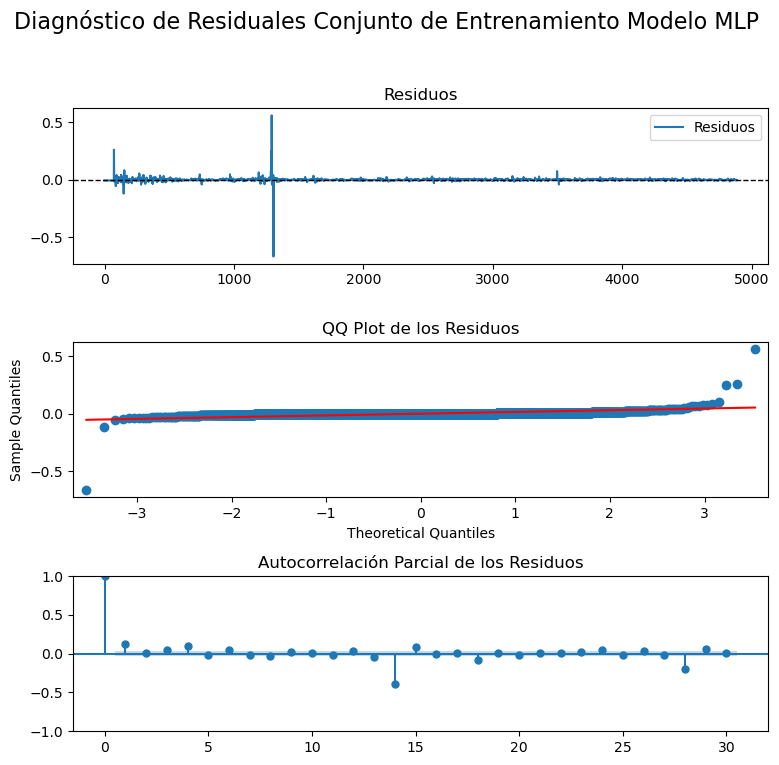

Ljung-Box LB Statistic: 70.143822
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [600]:
ljung_box_pval_MLP_train28_vola14, jarque_bera_pval_MLP_train28_vola14 = diagnostic_plots(y_train_vola14_28, train_preds_vola14_MLP28)

In [601]:
#calcular las métricas 
metrica_vola14_MLP_train28 = metricas(y_train_vola14_28,train_preds_vola14_MLP28)
metrica_vola14_MLP_train28.index = metrica_vola14_MLP_train28.index.map({0: 'MLP Entrenamiento Volatilidad ω = 14 y τ = 28'})
metrica_vola14_MLP_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train28_vola14], index=metrica_vola14_MLP_train28.index)
metrica_vola14_MLP_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train28_vola14], index=metrica_vola14_MLP_train28.index)
metrica_vola14_MLP_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 14 y τ = 28,1.1029,10.11%,0.0,0.0,94.33%,5.5134e-17,0.0


* **Conjunto de datos de Prueba:**

In [602]:
ljung_box_pvalMLP28_vola14, jarque_bera_pvalMLP28_vola14 = evaluate_residuals(data_test_plot_vola14_28, test_preds_vola14_MLP28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [603]:
metrica_MLP28_test_vola14 = metricas(y_test_vola14_28,test_preds_vola7_MLP28)
metrica_MLP28_test_vola14.index = metrica_MLP28_test_vola14.index.map({0: 'MLP Prueba Volatilidad ω = 14 y τ = 28'})
metrica_MLP28_test_vola14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP28_vola14], index=metrica_MLP28_test_vola14.index)
metrica_MLP28_test_vola14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP28_vola14], index=metrica_MLP28_test_vola14.index)
metrica_MLP28_test_vola14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 14 y τ = 28,0.0004,18.21%,0.0,0.0,-135.94%,3.1530e-05,0.1321


* **Curva Runs vs Error/Score :**

In [604]:
plot_best_model_validation_loss(history_vola14_MPL28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [605]:
errores_plots(y_train_vola14_28, train_preds_vola14_MLP28, y_val_vola14_28, val_preds_vola14_MLP28, y_test_vola14_28, test_preds_vola14_MLP28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


#### <font color="#30143">Volatilidad ω = 14  (Volatilidad_14): Memoria a Corto y Largo Plazo (LSTM) </font>

Ya definimos los `regresores`(`X`) y la `variable objetivo`(`y`) para el proceso de entrenamiento y validación en la selección correspondiente al modelo `Perceptrones Multicapa` a tráves de la función `create_time_series_datasets()`, sin embargo, ésta se utiliza para generar arreglos `2D` de forma (números de muestras, números de paso de tiempo). Dado que la entrada a las capas de una `RNN` debe ser de forma: número de muestras, número de paso de tiempo, número de características por paso de tiempo; procedemos con la sefinición de la función `change_dimension_lstm()` para realizar la transformación de 2D a 3D. 

##### Horizonte de 7 días ($\tau=7$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [606]:
X_train_vola14_lstm_7, X_val_vola14_lstm_7, X_test_vola14_lstm_7 = change_dimension_lstm(X_train_vola14_7, X_val_vola14_7, X_test_vola14_7)

Shape of 3D arrays X: (4971, 7, 1) (7, 7, 1) (7, 7, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [607]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(7,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=20, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola14_lstm_7, y_train_vola14_7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  21.0s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  21.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  21.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  21.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  21.7s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.016871558798797655


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [608]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM7_vola14 = build_models_lstm(input_shape7, neurons_list, dropout_rates ,'SGD')

Model: "model_477"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_478 (InputLayer)      [(None, 7, 1)]            0         
                                                                 
 lstm_410 (LSTM)             (None, 7, 64)             16896     
                                                                 
 lstm_411 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_477 (Dropout)       (None, 32)                0         
                                                                 
 dense_1293 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_4

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [609]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola14_LSTM_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_lstm_vola14 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [610]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola14_LSTM7 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM7_vola14):
    filename = f'history_vola14_LSTM_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola14_lstm_7, y=y_train_vola14_7, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best7_lstm_vola14], validation_data=(X_val_vola14_lstm_7, y_val_vola14_7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola14_LSTM7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola14_LSTM_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [611]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola14_LSTM_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best7_lstm_vola14 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best7_lstm_vola14 = load_model(best_model_path)  # Cargar el modelo

    if best7_lstm_vola14 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola14_LSTM_weights.16-0.0017.keras con val_loss: 0.0017


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [612]:
# Predicciones usando el mejor modelo
if best7_lstm_vola14 is not None:
    # Asegúrate de que X_val_price7 y X_test_price7 tengan la forma correcta
    train_preds_vola14_LSTM7 = best7_lstm_vola14.predict(X_train_vola14_lstm_7)
    val_preds_vola14_LSTM7 = best7_lstm_vola14.predict(X_val_vola14_lstm_7)
    test_preds_vola14_LSTM7 = best7_lstm_vola14.predict(X_test_vola14_lstm_7)

    # Aplanar las predicciones si es necesario
    train_preds_vola14_LSTM7 = np.squeeze(train_preds_vola14_LSTM7)
    val_preds_vola14_LSTM7 = np.squeeze(val_preds_vola14_LSTM7)
    test_preds_vola14_LSTM7 = np.squeeze(test_preds_vola14_LSTM7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola14_LSTM7)
    print("Predicciones de validación:", val_preds_vola14_LSTM7)
    print("Predicciones de prueba:", test_preds_vola14_LSTM7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [0.00203688 0.00203688 0.00203688 ... 0.03236723 0.03250549 0.03231812]
Predicciones de validación: [0.03228017 0.0362203  0.04266954 0.042154   0.04160269 0.04062048
 0.0409362 ]
Predicciones de prueba: [0.04069978 0.04028278 0.04028784 0.03367012 0.0342448  0.03542686
 0.03968877]


In [613]:
plot_model(data_train_plot_vola7[-100:], data_val_plot_vola7, data_test_plot_vola7, val_preds_vola7_LSTM7, test_preds_vola7_LSTM7, "Predicciones usando Memoria a Corto y Largo Paso (LSTM) para un horizonte de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

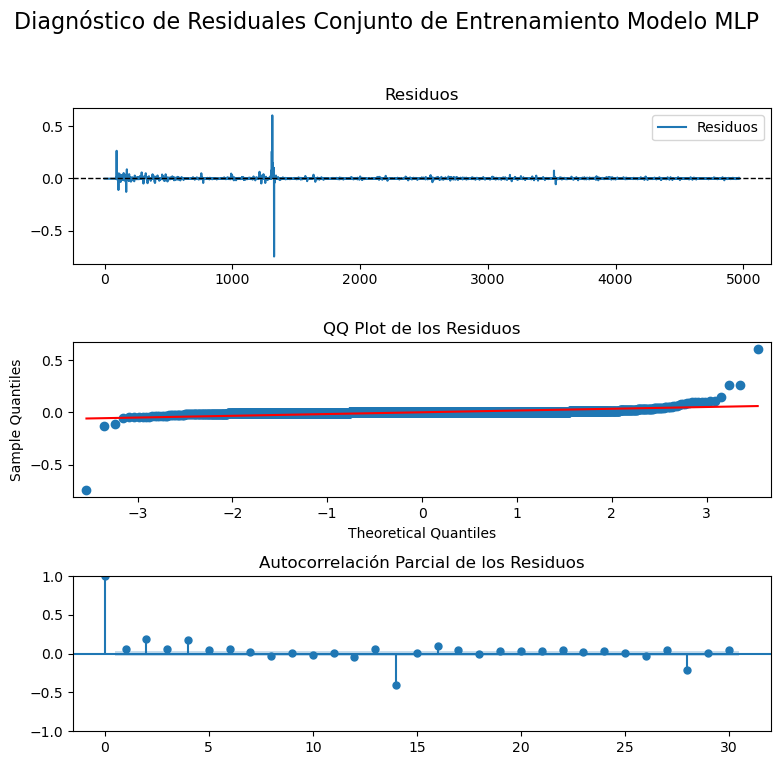

Ljung-Box LB Statistic: 14.957703
Ljung-Box p-value: 0.000110
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [614]:
ljung_box_pval_LSTM_train7_vola14, jarque_bera_pval_LSTM_train7_vola14 = diagnostic_plots(y_train_vola14_7, train_preds_vola14_LSTM7)

In [615]:
#calcular las métricas 
metrica_vola14_LSTM_train = metricas(y_train_vola14_7,train_preds_vola14_LSTM7)
metrica_vola14_LSTM_train.index = metrica_vola14_LSTM_train.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 14  y τ = 7'})
metrica_vola14_LSTM_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train7_vola14], index=metrica_vola14_LSTM_train.index)
metrica_vola14_LSTM_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train7_vola14], index=metrica_vola14_LSTM_train.index)
metrica_vola14_LSTM_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 14 y τ = 7,1.4121,8.87%,0.0,0.0,92.76%,0.0001,0.0


* **Conjunto de datos de Prueba:**

In [616]:
ljung_box_pvalLSTM7_vola14, jarque_bera_pvalLSTM7_vola14 = evaluate_residuals(data_test_plot_vola14_7, test_preds_vola14_LSTM7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [617]:
metrica_LSTM_test_vola14 = metricas(y_test_vola14_7,test_preds_vola14_LSTM7)
metrica_LSTM_test_vola14.index = metrica_LSTM_test_vola14.index.map({0: 'LSTM Prueba Volatilidad ω = 14 y τ = 7'})
metrica_LSTM_test_vola14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM7_vola14], index=metrica_LSTM_test_vola14.index)
metrica_LSTM_test_vola14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM7_vola14], index=metrica_LSTM_test_vola14.index)
metrica_LSTM_test_vola14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 14 y τ = 7,6.3947e-05,5.38%,0.0,0.0,3.1%,0.0604,0.6416


* **Curva Runs vs Error/Score :**

In [618]:
plot_best_model_validation_loss(history_vola14_LSTM7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [619]:
errores_plots(y_train_vola14_7, train_preds_vola14_LSTM7, y_val_vola14_7, val_preds_vola14_LSTM7, y_test_vola14_7, test_preds_vola14_LSTM7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada  del error/score correspondiente al val_loss de la epoca del mejor modelo.
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 14 días ($\tau=14$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [620]:
X_train_vola14_lstm_14, X_val_vola14_lstm_14, X_test_vola14_lstm_14 = change_dimension_lstm(X_train_vola14_14, X_val_vola14_14, X_test_vola14_14)

Shape of 3D arrays X: (4943, 14, 1) (14, 14, 1) (14, 14, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [621]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(14,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola14_lstm_14, y_train_vola14_14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.7s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.7s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.8s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  29.3s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.018342773872898954


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [622]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM14_vola14 = build_models_lstm(input_shape14, neurons_list, dropout_rates, 'SGD')

Model: "model_494"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_495 (InputLayer)      [(None, 14, 1)]           0         
                                                                 
 lstm_444 (LSTM)             (None, 14, 64)            16896     
                                                                 
 lstm_445 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_494 (Dropout)       (None, 32)                0         
                                                                 
 dense_1310 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_4

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [623]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola14_LSTM14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_lstm_vola14 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [624]:
import os
from joblib import dump, load


history_vola14_LSTM14 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM14_vola14):
    filename = f'history_vola14_LSTM14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola14_lstm_14, y=y_train_vola14_14, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best14_lstm_vola14], validation_data=(X_val_vola14_lstm_14, y_val_vola14_14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola14_LSTM14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola14_LSTM14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM14_mod

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [625]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola14_LSTM14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best14_lstm_vola14 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best14_lstm_vola14 = load_model(best_model_path)  # Cargar el modelo

    if best14_lstm_vola14 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola14_LSTM14_weights.08-0.0005.keras con val_loss: 0.0005


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [626]:
# Predicciones usando el mejor modelo
if best14_lstm_vola7 is not None:

    train_preds_vola14_LSTM14 = best14_lstm_vola14.predict(X_train_vola14_lstm_14)
    val_preds_vola14_LSTM14 = best14_lstm_vola14.predict(X_val_vola14_lstm_14)
    test_preds_vola14_LSTM14 = best14_lstm_vola14.predict(X_test_vola14_lstm_14)

    # Aplanar las predicciones si es necesario
    train_preds_vola14_LSTM14 = np.squeeze(train_preds_vola14_LSTM14)
    val_preds_vola14_LSTM14 = np.squeeze(val_preds_vola14_LSTM14)
    test_preds_vola14_LSTM14 = np.squeeze(test_preds_vola14_LSTM14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola14_LSTM14)
    print("Predicciones de validación:", val_preds_vola14_LSTM14)
    print("Predicciones de prueba:", test_preds_vola14_LSTM14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [0.00191182 0.00191182 0.00191182 ... 0.01740972 0.01652261 0.01648168]
Predicciones de validación: [0.01622669 0.016594   0.01639079 0.01718482 0.01751529 0.01746545
 0.01784063 0.016834   0.01730842 0.01736791 0.01764694 0.01822048
 0.01682736 0.01679847]
Predicciones de prueba: [0.01677203 0.01942332 0.02176849 0.02935366 0.03108606 0.03110084
 0.03096829 0.03095849 0.03435418 0.04038827 0.04064307 0.03991327
 0.03902464 0.03921417]


In [627]:
plot_model(data_train_plot_vola14_14[-100:], data_val_plot_vola14_14, data_test_plot_vola14_14, val_preds_vola14_LSTM14, test_preds_vola14_LSTM14, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

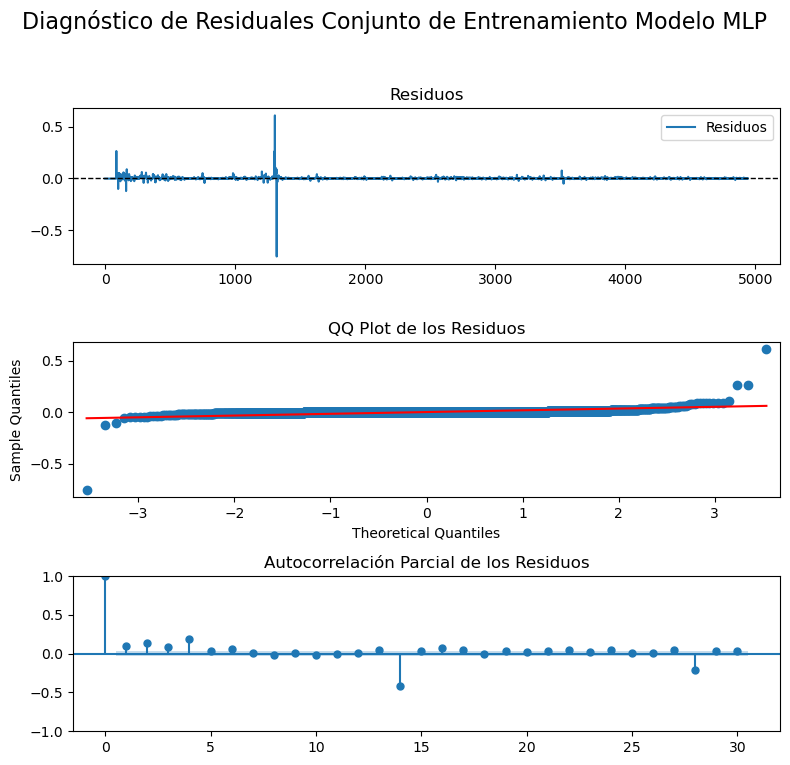

Ljung-Box LB Statistic: 48.574844
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [628]:
ljung_box_pval_LSTM_train14_vola14, jarque_bera_pval_LSTM_train14_vola14 = diagnostic_plots(y_train_vola14_14, train_preds_vola14_LSTM14)

In [629]:
#calcular las métricas 
metrica_vola14_LSTM_train14 = metricas(y_train_vola14_14,train_preds_vola14_LSTM14)
metrica_vola14_LSTM_train14.index = metrica_vola14_LSTM_train14.index.map({0: 'LSTM Entrenamiento Volatilidada ω = 14 y τ = 14'})
metrica_vola14_LSTM_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train14_vola14], index=metrica_vola14_LSTM_train14.index)
metrica_vola14_LSTM_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train14_vola14], index=metrica_vola14_LSTM_train14.index)
metrica_vola14_LSTM_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidada ω = 14 y τ = 14,1.4431,8.83%,0.0,0.0,92.6%,3.1792e-12,0.0


* **Conjunto de datos de Prueba:**

In [630]:
ljung_box_pvalLSTM14_vola14, jarque_bera_pvalLSTM14_vola14 = evaluate_residuals(data_test_plot_vola14_14, test_preds_vola7_LSTM14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [631]:
metrica_LSTM_test14_vola14 = metricas(y_test_vola14_14,test_preds_vola14_LSTM14)
metrica_LSTM_test14_vola14.index = metrica_LSTM_test14_vola14.index.map({0: 'LSTM Prueba Volatilidada ω = 14 y τ = 14'})
metrica_LSTM_test14_vola14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM14_vola14], index=metrica_LSTM_test14_vola14.index)
metrica_LSTM_test14_vola14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM14_vola14], index=metrica_LSTM_test14_vola14.index)
metrica_LSTM_test14_vola14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidada ω = 14 y τ = 14,0.0002,8.62%,0.0,0.0,71.54%,0.0408,0.4244


* **Curva Runs vs Error/Score :**

In [632]:
plot_best_model_validation_loss(history_vola14_LSTM14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [633]:
errores_plots(y_train_vola14_14, train_preds_vola14_LSTM14, y_val_vola14_14, val_preds_vola14_LSTM14, y_test_vola14_14, test_preds_vola14_LSTM14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 21 días ($\tau=21$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [634]:
X_train_vola14_lstm_21, X_val_vola14_lstm_21, X_test_vola14_lstm_21 = change_dimension_lstm(X_train_vola14_21, X_val_vola14_21, X_test_vola14_21)

Shape of 3D arrays X: (4915, 21, 1) (21, 21, 1) (21, 21, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [635]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(21,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola14_lstm_21, y_train_vola14_21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  36.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  36.5s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  36.5s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  37.3s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  37.6s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.016279017224494513


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [636]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM21_vola14 = build_models_lstm(input_shape21, neurons_list, dropout_rates, 'SGD')

Model: "model_511"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_512 (InputLayer)      [(None, 21, 1)]           0         
                                                                 
 lstm_478 (LSTM)             (None, 21, 64)            16896     
                                                                 
 lstm_479 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_511 (Dropout)       (None, 32)                0         
                                                                 
 dense_1327 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_5

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [637]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola14_LSTM21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_lstm_vola14 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM21`. 

In [638]:
import os
from joblib import dump, load

history_vola14_LSTM21 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM21_vola14):
    filename = f'history_vola14_LSTM21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola14_lstm_21, y=y_train_vola14_21, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best21_lstm_vola14], validation_data=(X_val_vola14_lstm_21, y_val_vola14_21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola14_LSTM21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola14_LSTM21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM21_mod

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [639]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola14_LSTM21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best21_lstm_vola14 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best21_lstm_vola14 = load_model(best_model_path)  # Cargar el modelo

    if best21_lstm_vola14 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola14_LSTM21_weights.11-0.0011.keras con val_loss: 0.0011


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [640]:
# Predicciones usando el mejor modelo
if best21_lstm_vola14 is not None:

    train_preds_vola14_LSTM21 = best21_lstm_vola14.predict(X_train_vola14_lstm_21)
    val_preds_vola14_LSTM21 = best21_lstm_vola14.predict(X_val_vola14_lstm_21)
    test_preds_vola14_LSTM21 = best21_lstm_vola14.predict(X_test_vola14_lstm_21)

    # Aplanar las predicciones si es necesario
    train_preds_vola14_LSTM21 = np.squeeze(train_preds_vola14_LSTM21)
    val_preds_vola14_LSTM21 = np.squeeze(val_preds_vola14_LSTM21)
    test_preds_vola14_LSTM21 = np.squeeze(test_preds_vola14_LSTM21)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola14_LSTM21)
    print("Predicciones de validación:", val_preds_vola14_LSTM21)
    print("Predicciones de prueba:", test_preds_vola14_LSTM21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [0.00079217 0.00079217 0.00079217 ... 0.03132449 0.03146943 0.03153235]
Predicciones de validación: [0.03155167 0.02620051 0.02651863 0.02620691 0.02633044 0.02326353
 0.02333171 0.02228436 0.02321499 0.02308543 0.02312818 0.02112993
 0.02102985 0.02110556 0.02135816 0.01587905 0.01573933 0.01685816
 0.01705712 0.01611753 0.01615214]
Predicciones de prueba: [0.01584165 0.01629933 0.0160421  0.01698925 0.01730338 0.01724389
 0.01766933 0.01646668 0.0170863  0.01708292 0.01742684 0.01806495
 0.01642688 0.01650076 0.01642139 0.01949279 0.02200836 0.03063027
 0.03207866 0.03207545 0.03174646]


In [641]:
plot_model(data_train_plot_vola21[-100:], data_val_plot_vola21, data_test_plot_vola21, val_preds_vola7_LSTM21, test_preds_vola7_LSTM21, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

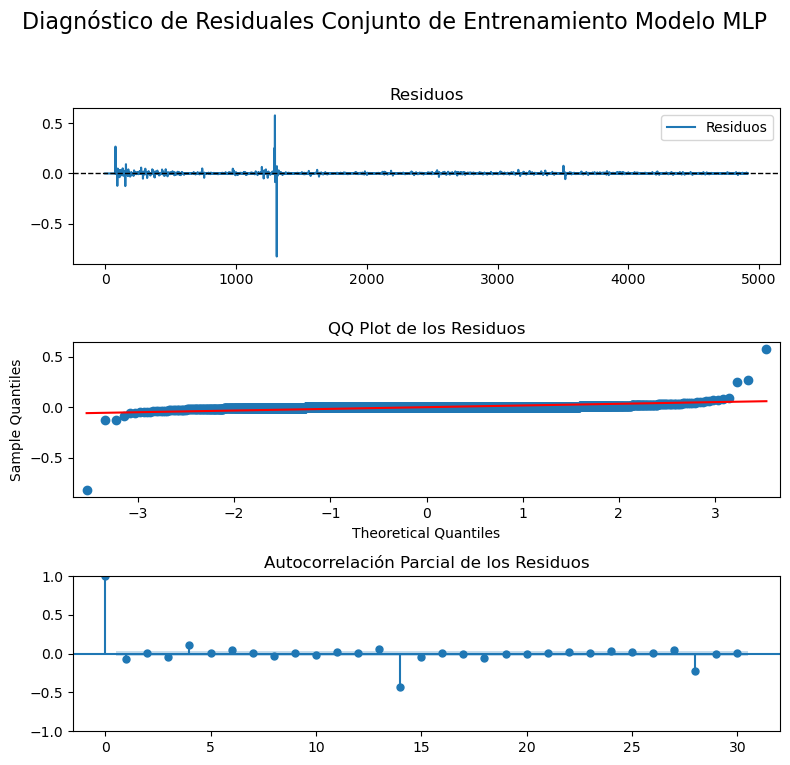

Ljung-Box LB Statistic: 24.029641
Ljung-Box p-value: 0.000001
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [642]:
ljung_box_pval_LSTM_train21_vola14, jarque_bera_pval_LSTM_train21_vola14 = diagnostic_plots(y_train_vola14_21, train_preds_vola14_LSTM21)

In [643]:
#calcular las métricas 
metrica_vola14_LSTM_train21 = metricas(y_train_vola14_21,train_preds_vola14_LSTM21)
metrica_vola14_LSTM_train21.index = metrica_vola14_LSTM_train21.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 14 y τ = 21'})
metrica_vola14_LSTM_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train21_vola14], index=metrica_vola14_LSTM_train21.index)
metrica_vola14_LSTM_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train21_vola14], index=metrica_vola14_LSTM_train21.index)
metrica_vola14_LSTM_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 14 y τ = 21,1.3849,7.52%,0.0,0.0,92.88%,9.4864e-07,0.0


* **Conjunto de datos de Prueba:**

In [644]:
ljung_box_pvalLSTM21_vola14, jarque_bera_pvalLSTM21_vola14 = evaluate_residuals(data_test_plot_vola14_21, test_preds_vola14_LSTM21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [645]:
metrica_LSTM_test21_vola14 = metricas(y_test_vola14_21,test_preds_vola14_LSTM21)
metrica_LSTM_test21_vola14.index = metrica_LSTM_test21_vola14.index.map({0: 'LSTM Prueba Volatilidad ω = 14 y τ = 21'})
metrica_LSTM_test21_vola14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM21_vola7], index=metrica_LSTM_test21_vola14.index)
metrica_LSTM_test21_vola14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM21_vola7], index=metrica_LSTM_test21_vola14.index)
metrica_LSTM_test21_vola14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 14 y τ = 21,0.0001,4.92%,0.0,0.0,87.77%,0.0013,0.3839


##### Horizonte de 28 días ($\tau=28$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [646]:
X_train_vola14_lstm_28, X_val_vola14_lstm_28, X_test_vola14_lstm_28 = change_dimension_lstm(X_train_vola14_28, X_val_vola14_28, X_test_vola14_28)

Shape of 3D arrays X: (4887, 28, 1) (28, 28, 1) (28, 28, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [647]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(28,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola14_lstm_28, y_train_vola14_28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  48.2s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  48.3s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  48.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  48.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  48.7s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.018750487748698468


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [648]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM28_vola14 = build_models_lstm(input_shape28, neurons_list, dropout_rates, 'SGD')

Model: "model_528"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_529 (InputLayer)      [(None, 28, 1)]           0         
                                                                 
 lstm_512 (LSTM)             (None, 28, 64)            16896     
                                                                 
 lstm_513 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_528 (Dropout)       (None, 32)                0         
                                                                 
 dense_1344 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_5

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [649]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola14_LSTM28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_lstm_vola14 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM28_at`. 

In [650]:
import os
from joblib import dump, load

history_vola14_LSTM28 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM28_vola14):
    filename = f'history_vola14_LSTM28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola14_lstm_28, y=y_train_vola14_28, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best28_lstm_vola14], validation_data=(X_val_vola14_lstm_28, y_val_vola14_28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola14_LSTM28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola14_LSTM28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola14_LSTM28_mod

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [651]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola14_LSTM28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best28_lstm_vola14 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best28_lstm_vola14 = load_model(best_model_path)  # Cargar el modelo

    if best28_lstm_vola14 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola14_LSTM28_weights.17-0.0014.keras con val_loss: 0.0014


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [652]:
# Predicciones usando el mejor modelo
if best28_lstm_vola14 is not None:

    train_preds_vola14_LSTM28 = best28_lstm_vola14.predict(X_train_vola14_lstm_28)
    val_preds_vola14_LSTM28 = best28_lstm_vola14.predict(X_val_vola14_lstm_28)
    test_preds_vola14_LSTM28 = best28_lstm_vola14.predict(X_test_vola14_lstm_28)

    # Aplanar las predicciones si es necesario
    train_preds_vola14_LSTM28 = np.squeeze(train_preds_vola14_LSTM28)
    val_preds_vola14_LSTM28 = np.squeeze(val_preds_vola14_LSTM28)
    test_preds_vola14_LSTM28 = np.squeeze(test_preds_vola7_LSTM28)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola14_LSTM28)
    print("Predicciones de validación:", val_preds_vola14_LSTM28)
    print("Predicciones de prueba:", test_preds_vola14_LSTM28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de Entrenamiento: [0.00225073 0.00225073 0.00225073 ... 0.02083081 0.01993592 0.01982495]
Predicciones de validación: [0.01889527 0.02082047 0.02087486 0.02319621 0.0246575  0.02462127
 0.02455017 0.02404073 0.02971042 0.02927777 0.0288966  0.0281828
 0.03517121 0.03519313 0.03579495 0.03390856 0.03376661 0.0315105
 0.03148054 0.03167482 0.03171791 0.03172253 0.0265177  0.02694819
 0.02673871 0.02680921 0.02379988 0.02391718]
Predicciones de prueba: [-0.14557588 -0.14251196 -0.1415869  -0.1415354  -0.14236629 -0.14519548
 -0.14926851 -0.15327644 -0.15760005 -0.16170609 -0.16421509 -0.16462171
 -0.16225874 -0.15851378 -0.15507829 -0.15285218 -0.1508125  -0.14873588
 -0.14664638 -0.14565146 -0.14520538 -0.14526379 -0.14600646 -0.14747202
 -0.15073383 -0.15503848 -0.15885818 -0.16147268]


In [653]:
plot_model(data_train_plot_vola14_28[-100:], data_val_plot_vola14_28, data_test_plot_vola14_28, val_preds_vola14_LSTM28, test_preds_vola14_LSTM28, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

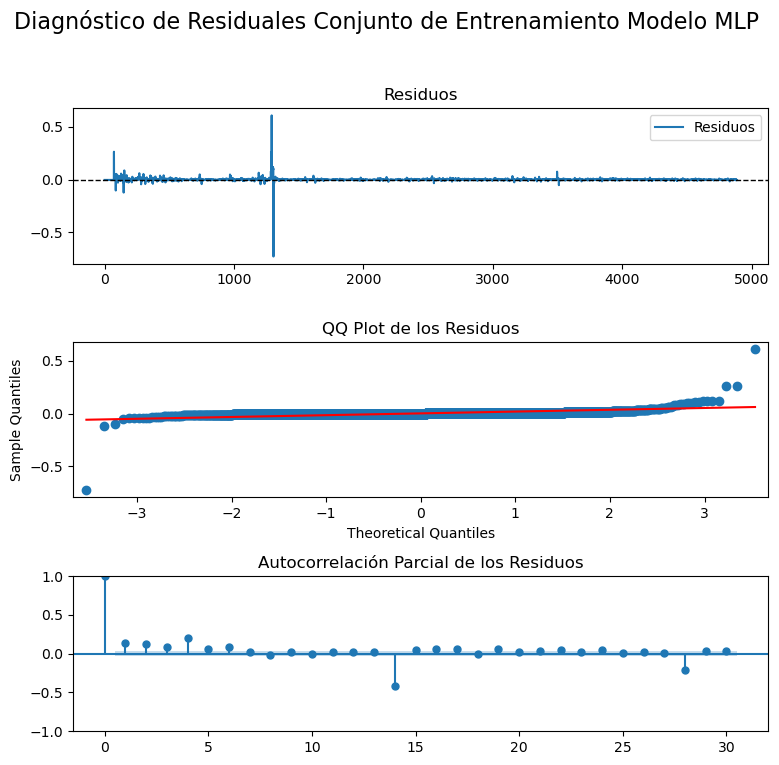

Ljung-Box LB Statistic: 86.370329
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [654]:
ljung_box_pval_LSTM_train28_vola14, jarque_bera_pval_LSTM_train28_vola14 = diagnostic_plots(y_train_vola14_28, train_preds_vola14_LSTM28)

In [655]:
#calcular las métricas 
metrica_vola14_LSTM_train28 = metricas(y_train_vola14_28,train_preds_vola14_LSTM28)
metrica_vola14_LSTM_train28.index = metrica_vola14_LSTM_train28.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 14 y τ = 28'})
metrica_vola14_LSTM_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train28_vola14], index=metrica_vola14_LSTM_train28.index)
metrica_vola14_LSTM_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train28_vola14], index=metrica_vola14_LSTM_train28.index)
metrica_vola14_LSTM_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 14 y τ = 28,1.4339,8.84%,0.0,0.0,92.63%,1.4921e-20,0.0


* **Conjunto de datos de Prueba:**

In [656]:
ljung_box_pvalLSTM28_vola14, jarque_bera_pvalLSTM28_vola14 = evaluate_residuals(data_test_plot_vola14_28, test_preds_vola14_LSTM28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [657]:
metrica_LSTM_test28_vola14 = metricas(y_test_vola14_28,test_preds_vola14_LSTM28)
metrica_LSTM_test28_vola14.index = metrica_LSTM_test28_vola14.index.map({0: 'LSTM Prueba Volatilidad ω = 14 y τ = 28'})
metrica_LSTM_test28_vola14['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM28_vola14], index=metrica_LSTM_test28_vola14.index)
metrica_LSTM_test28_vola14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM28_vola14], index=metrica_LSTM_test28_vola14.index)
metrica_LSTM_test28_vola14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 14 y τ = 28,0.805,958.13%,0.17,0.03,-449719.48%,4.6261e-06,0.51


* **Curva Runs vs Error/Score :**

In [658]:
plot_best_model_validation_loss(history_vola14_LSTM28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [659]:
errores_plots(y_train_vola14_28, train_preds_vola14_LSTM28, y_val_vola14_28, val_preds_vola14_LSTM28, y_test_vola14_28, test_preds_vola14_LSTM28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra cerca considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



#### <font color="#30143">Volatilidad ω = 21  (Volatilidad_21): Perceptrones Multicapa (MLP)</font>


##### Horizonte de 7 días ($\tau=7$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [660]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(7,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': [ 'tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [20], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola21_7, y_train_vola21_7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   4.8s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   4.8s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   4.9s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   5.2s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   5.5s
Mejor función de activación: tanh
Mejor número de epocas: 20
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.0030908660031855107


A idexación de parámetros función `build_models` con base a lo indicado en el númeral 3 del parcial práctico. 

In [661]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP7_vola21 = build_models_mlp(input_shape7, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_545"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_546 (InputLayer)      [(None, 7)]               0         
                                                                 
 dense_1364 (Dense)          (None, 32)                256       
                                                                 
 dense_1365 (Dense)          (None, 16)                528       
                                                                 
 dense_1366 (Dense)          (None, 16)                272       
                                                                 
 dropout_545 (Dropout)       (None, 16)                0         
                                                                 
 dense_1367 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,073

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [662]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola21_MLP7_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_vola21 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP7`. 

In [663]:
import os
from joblib import dump, load

history_vola21_MPL7 = []

# Iterar sobre cada modelo en la lista models_MLP7
for i, model in enumerate(models_MLP7_vola21):
    filename = f'history_vola21_MPL7_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola21_7, y=y_train_vola21_7, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best7_vola21], validation_data=(X_val_vola21_7, y_val_vola21_7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola21_MPL7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola21_MPL7_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL7_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL7_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL7_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL7_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL7_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL7_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL7_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL7_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL7_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [664]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_MLP7_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model7_vola21 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model7_vola21 = load_model(best_model_path)  # Cargar el modelo

    if best_model7_vola21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_MLP7_weights.20-0.0011.keras con val_loss: 0.0011


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [665]:
# Predicciones usando el mejor modelo
if best_model7_vola21 is not None:

    train_preds_vola21_MLP7 = best_model7_vola21.predict(X_train_vola21_7)
    val_preds_vola21_MLP7 = best_model7_vola21.predict(X_val_vola21_7)
    test_preds_vola21_MLP7 = best_model7_vola21.predict(X_test_vola21_7)

    # Aplanar las predicciones si es necesario
    train_preds_vola21_MLP7 = np.squeeze(train_preds_vola21_MLP7)
    val_preds_vola21_MLP7 = np.squeeze(val_preds_vola21_MLP7)
    test_preds_vola21_MLP7 = np.squeeze(test_preds_vola21_MLP7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola21_MLP7)
    print("Predicciones de validación:", val_preds_vola21_MLP7)
    print("Predicciones de prueba:", test_preds_vola21_MLP7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 15ms/step
Predicciones de Entrenamiento: [0.0037861  0.0037861  0.0037861  ... 0.02936227 0.02886306 0.02919588]
Predicciones de validación: [0.02913963 0.03200969 0.03589875 0.03575275 0.03570248 0.03577608
 0.03539895]
Predicciones de prueba: [0.03501672 0.03509945 0.0354888  0.03513949 0.03569656 0.03644694
 0.03973022]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [666]:
data_train_plot_vola21_7, data_val_plot_vola21_7, data_test_plot_vola21_7 = data_plot(df_1_st['Volatilidad_21'], 7)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
18      0.0355
17      0.0354
16      0.0354
15      0.0351
14      0.0351
Name: Volatilidad_21, Length: 4985, dtype: float647

Datos de validación:
13    0.0354
12    0.0358
11    0.0355
10    0.0361
9     0.0368
8     0.0403
7     0.0410
Name: Volatilidad_21, dtype: float647

Datos de prueba:
6    0.0403
5    0.0442
4    0.0441
3    0.0446
2    0.0449
1    0.0448
0    0.0459
Name: Volatilidad_21, dtype: float647


In [667]:
plot_model(data_train_plot_vola21_7[-100:], data_val_plot_vola21_7, data_test_plot_vola21_7, val_preds_vola21_MLP7, test_preds_vola21_MLP7, "Predicciones usando Perceptrón Multicapa (MLP)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

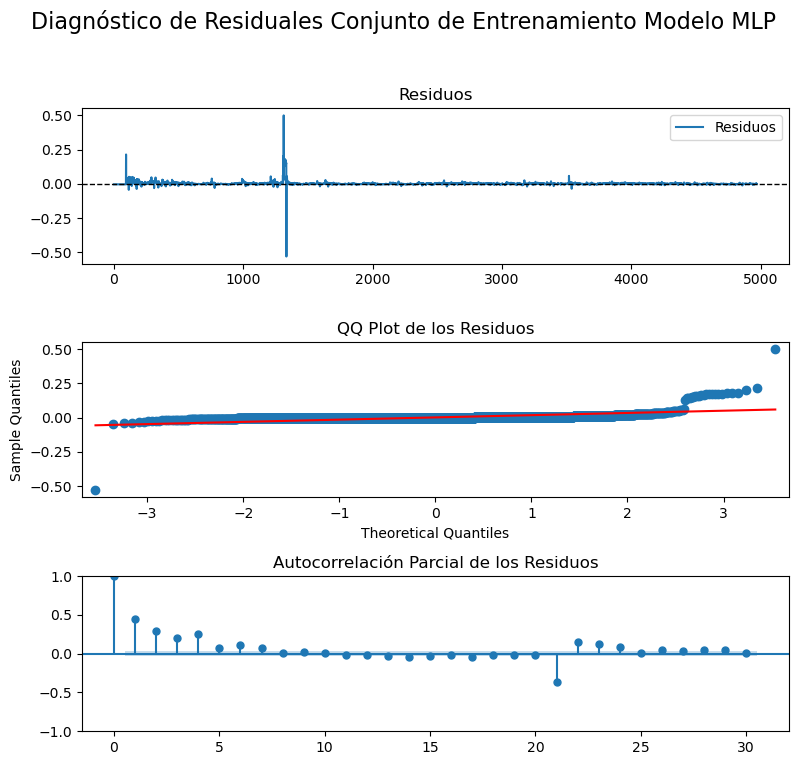

Ljung-Box LB Statistic: 997.042310
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [668]:
ljung_box_pval_MLP_train7_vola21, jarque_bera_pval_MLP_train7_vola21 = diagnostic_plots(y_train_vola21_7, train_preds_vola21_MLP7)

In [669]:
#calcular las métricas 
metrica_vola21_MLP_train = metricas(y_train_vola21_7,train_preds_vola21_MLP7)
metrica_vola21_MLP_train.index = metrica_vola21_MLP_train.index.map({0: 'MLP Entrenamiento Volatilidad ω = 21 y τ = 7'})
metrica_vola21_MLP_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train7_vola21], index=metrica_vola21_MLP_train.index)
metrica_vola21_MLP_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train7_vola21], index=metrica_vola21_MLP_train.index)
metrica_vola21_MLP_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 21 y τ = 7,1.3412,8.34%,0.0,0.0,92.87%,7.8915e-219,0.0


* **Conjunto de datos de Prueba:**

In [670]:
ljung_box_pvalMLP7_vola21, jarque_bera_pvalMLP7_vola21 = evaluate_residuals(data_test_plot_vola21_7, test_preds_vola21_MLP7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [671]:
metrica_MLP7_test_vola21 = metricas(y_test_vola21_7,test_preds_vola21_MLP7)
metrica_MLP7_test_vola21.index = metrica_MLP7_test_vola21.index.map({0: 'MLP Prueba Volatilidad ω = 21 y τ = 7'})
metrica_MLP7_test_vola21['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP7_vola21], index=metrica_MLP7_test_vola21.index)
metrica_MLP7_test_vola21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP7_vola21], index=metrica_MLP7_test_vola21.index)
metrica_MLP7_test_vola21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 21 y τ = 7,1.9325e-05,3.08%,0.0,0.0,41.9%,0.9708,0.5649


* **Curva Runs vs Error/Score :**

In [672]:
plot_best_model_validation_loss(history_vola21_MPL7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [673]:
errores_plots(y_train_vola21_7, train_preds_vola21_MLP7, y_val_vola21_7, val_preds_vola21_MLP7, y_test_vola21_7, test_preds_vola21_MLP7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 14 días ($\tau=14$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [674]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(14,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola21_14, y_train_vola21_14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   9.4s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   9.8s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=   9.8s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=  10.0s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=  10.0s
Mejor función de activación: tanh
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.004616295639425516


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(14,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 14 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [675]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP14_vola21 = build_models_mlp(input_shape14, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_562"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_563 (InputLayer)      [(None, 14)]              0         
                                                                 
 dense_1432 (Dense)          (None, 32)                480       
                                                                 
 dense_1433 (Dense)          (None, 16)                528       
                                                                 
 dense_1434 (Dense)          (None, 16)                272       
                                                                 
 dropout_562 (Dropout)       (None, 16)                0         
                                                                 
 dense_1435 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,297

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [676]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola21_MLP14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_vola21 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP14`. 

In [677]:
import os
from joblib import dump, load

history_vola21_MPL14 = []

# Iterar sobre cada modelo en la lista models
for i, model in enumerate(models_MLP14_vola21):
    filename = f'history_vola21_MPL14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola21_14, y=y_train_vola21_14, batch_size=16, epochs=50, 
                                  verbose=2, callbacks=[save_best14_vola21], validation_data=(X_val_vola21_14, y_val_vola21_14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola21_MPL14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola21_MPL14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL14_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [678]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_MLP14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model14_vola21 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model14_vola21 = load_model(best_model_path)  # Cargar el modelo

    if best_model14_vola21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_MLP14_weights.31-0.0007.keras con val_loss: 0.0007


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [679]:
# Predicciones usando el mejor modelo
if best_model14_vola21 is not None:

    train_preds_vola21_MLP14 = best_model14_vola21.predict(X_train_vola21_14)
    val_preds_vola21_MLP14 = best_model14_vola21.predict(X_val_vola21_14)
    test_preds_vola21_MLP14 = best_model14_vola21.predict(X_test_vola21_14)


    # Aplanar las predicciones si es necesario
    train_preds_vola21_MLP14 = np.squeeze(train_preds_vola21_MLP14)
    val_preds_vola21_MLP14 = np.squeeze(val_preds_vola21_MLP14)
    test_preds_vola21_MLP14 = np.squeeze(test_preds_vola21_MLP14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola21_MLP14)
    print("Predicciones de validación:", val_preds_vola21_MLP14)
    print("Predicciones de prueba:", test_preds_vola21_MLP14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 8ms/step
Predicciones de Entrenamiento: [0.00096389 0.00096389 0.00096389 ... 0.01847525 0.02015683 0.02022596]
Predicciones de validación: [0.02016557 0.01642422 0.01684735 0.0180444  0.01770096 0.01594362
 0.01656384 0.01637932 0.01616096 0.01568308 0.01571247 0.01633131
 0.01690862 0.01673477]
Predicciones de prueba: [0.01619704 0.01876767 0.02032613 0.02681474 0.02800784 0.02734597
 0.02763236 0.02751197 0.03080346 0.03511794 0.03477101 0.03459641
 0.03437426 0.03399778]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 14 días ($\tau = 14$). 

In [680]:
data_train_plot_vola21_14, data_val_plot_vola21_14, data_test_plot_vola21_14 = data_plot(df_1_st['Volatilidad_21'], 14)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
32      0.0158
31      0.0164
30      0.0169
29      0.0168
28      0.0163
Name: Volatilidad_21, Length: 4971, dtype: float6414

Datos de validación:
27    0.0188
26    0.0203
25    0.0268
24    0.0280
23    0.0274
22    0.0278
21    0.0278
20    0.0313
19    0.0357
18    0.0355
17    0.0354
16    0.0354
15    0.0351
14    0.0351
Name: Volatilidad_21, dtype: float6414

Datos de prueba:
13    0.0354
12    0.0358
11    0.0355
10    0.0361
9     0.0368
8     0.0403
7     0.0410
6     0.0403
5     0.0442
4     0.0441
3     0.0446
2     0.0449
1     0.0448
0     0.0459
Name: Volatilidad_21, dtype: float6414


In [681]:
plot_model(data_train_plot_vola21_14[-100:], data_val_plot_vola21_14, data_test_plot_vola21_14, val_preds_vola21_MLP14, test_preds_vola21_MLP14, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

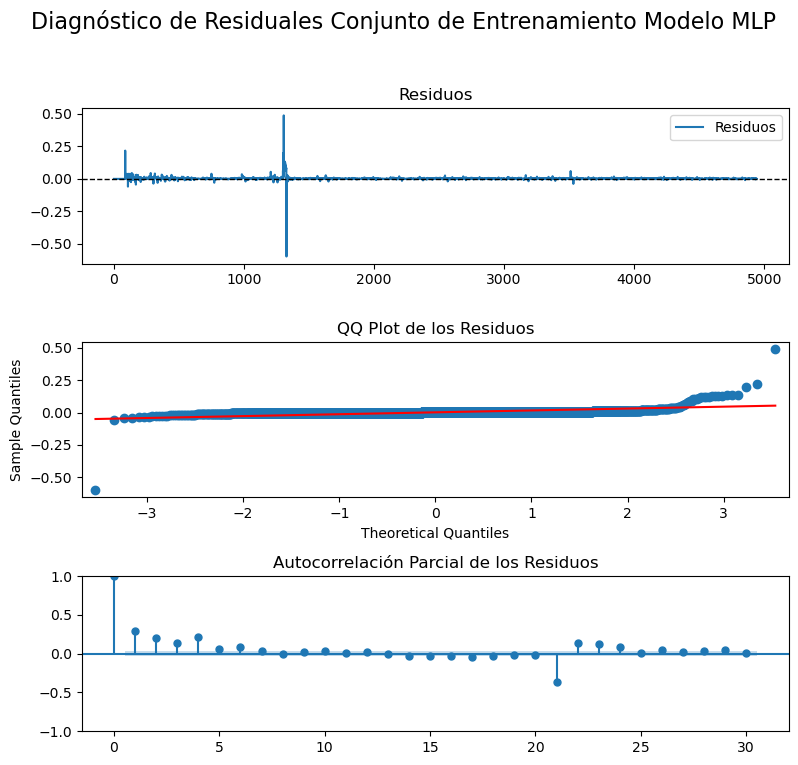

Ljung-Box LB Statistic: 406.850691
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [682]:
ljung_box_pval_MLP_train14_vola21, jarque_bera_pval_MLP_train14_vola21 = diagnostic_plots(y_train_vola21_14, train_preds_vola21_MLP14)

In [683]:
#calcular las métricas 
metrica_vola21_MLP_train14 = metricas(y_train_vola21_14,train_preds_vola21_MLP14)
metrica_vola21_MLP_train14.index = metrica_vola21_MLP_train14.index.map({0: 'MLP Entrenamiento Volatilidad ω = 21  y τ = 14'})
metrica_vola21_MLP_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train14_vola21], index=metrica_vola21_MLP_train14.index)
metrica_vola21_MLP_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train14_vola21], index=metrica_vola21_MLP_train14.index)
metrica_vola21_MLP_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 21 y τ = 14,1.0729,6.34%,0.0,0.0,94.29%,1.7769e-90,0.0


* **Conjunto de datos de Prueba:**

In [684]:
ljung_box_pvalMLP14_vola21, jarque_bera_pvalMLP14_vola21 = evaluate_residuals(data_test_plot_vola21_14, test_preds_vola21_MLP14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [685]:
metrica_MLP14_test_vola21= metricas(y_test_vola21_14,test_preds_vola21_MLP14)
metrica_MLP14_test_vola21.index = metrica_MLP14_test_vola21.index.map({0: 'MLP Prueba Volatilidad ω = 21  τ = 14'})
metrica_MLP14_test_vola21['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP14_vola21], index=metrica_MLP14_test_vola21.index)
metrica_MLP14_test_vola21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP14_vola21], index=metrica_MLP14_test_vola21.index)
metrica_MLP14_test_vola21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 21 τ = 14,9.4877e-05,6.48%,0.0,0.0,77.73%,0.0428,0.4961


* **Curva Runs vs Error/Score :**

In [686]:
plot_best_model_validation_loss(history_vola21_MPL14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [687]:
errores_plots(y_train_vola21_14, train_preds_vola21_MLP14, y_val_vola21_14, val_preds_vola21_MLP14, y_test_vola21_14, test_preds_vola21_MLP14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada  del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada error/score correspondiente al val_loss de la epoca del mejor modelo.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. Sin embargo, a pesar de esto, se evidencia que existe autocorrelación en los residuales, lo que hace que nuestro modelo no sea confiable.


##### Horizonte de 21 días ($\tau=21$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [688]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(21,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [100], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola21_21, y_train_vola21_21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.4s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  20.1s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  20.1s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  20.3s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  20.4s
Mejor función de activación: tanh
Mejor número de epocas: 100
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.004021136136725545


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(21,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 21 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [689]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP21_vola21 = build_models_mlp(input_shape21, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_579"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_580 (InputLayer)      [(None, 21)]              0         
                                                                 
 dense_1500 (Dense)          (None, 32)                704       
                                                                 
 dense_1501 (Dense)          (None, 16)                528       
                                                                 
 dense_1502 (Dense)          (None, 16)                272       
                                                                 
 dropout_579 (Dropout)       (None, 16)                0         
                                                                 
 dense_1503 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,521

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [690]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola21_MLP21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_vola21 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP21`. 

In [691]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola21_MPL21 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP21_vola21):
    filename = f'history_vola21_MPL21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola21_21, y=y_train_vola21_21, batch_size=16, epochs=100, 
                                  verbose=2, callbacks=[save_best21_vola21], validation_data=(X_val_vola21_21, y_val_vola21_21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola21_MPL21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola21_MPL21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL21_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [692]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_MLP21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model21_vola21 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model21_vola21 = load_model(best_model_path)  # Cargar el modelo

    if best_model21_vola21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_MLP21_weights.33-0.0009.keras con val_loss: 0.0009


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [693]:
# Predicciones usando el mejor modelo
if best_model21_vola21 is not None:
    train_preds_vola21_MLP21 = best_model21_vola21.predict(X_train_vola21_21)
    val_preds_vola21_MLP21 = best_model21_vola21.predict(X_val_vola21_21)
    test_preds_vola21_MLP21 = best_model21_vola21.predict(X_test_vola21_21)

    # Aplanar las predicciones si es necesario
    train_preds_vola21_MLP21 = np.squeeze(train_preds_vola21_MLP21)
    val_preds_vola21_MLP21 = np.squeeze(val_preds_vola21_MLP21)
    test_preds_vola21_MLP21 = np.squeeze(test_preds_vola21_MLP21)

    # Imprimir las predicciones
    print('Predicciones de entrenamiento', train_preds_vola21_MLP21)
    print("Predicciones de validación:", val_preds_vola21_MLP21)
    print("Predicciones de prueba:", test_preds_vola21_MLP21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de entrenamiento [0.00090695 0.00090695 0.00090695 ... 0.03070456 0.03062424 0.03070573]
Predicciones de validación: [0.0308798  0.03066699 0.03026728 0.02884573 0.02775048 0.0297657
 0.03009115 0.0300177  0.02637498 0.02595604 0.02599108 0.02605651
 0.02037753 0.01999774 0.01952229 0.0191514  0.01901711 0.01976177
 0.01881058 0.02030978 0.02031429]
Predicciones de prueba: [0.02008242 0.01652398 0.01668522 0.01795449 0.01781894 0.01621883
 0.01652392 0.01663592 0.01646791 0.01594731 0.01566346 0.01654514
 0.01716333 0.01691436 0.01634654 0.01892112 0.02054337 0.02705515
 0.02855585 0.0279751  0.0280706 ]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 21 días ($\tau = 21$). 

In [694]:
data_train_plot_vola21_21, data_val_plot_vola21_21, data_test_plot_vola21_21 = data_plot(df_1_st['Volatilidad_21'], 21)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
46      0.0202
45      0.0188
44      0.0204
43      0.0204
42      0.0203
Name: Volatilidad_21, Length: 4957, dtype: float6421

Datos de validación:
41    0.0166
40    0.0170
39    0.0182
38    0.0180
37    0.0162
36    0.0168
35    0.0166
34    0.0163
33    0.0159
32    0.0158
31    0.0164
30    0.0169
29    0.0168
28    0.0163
27    0.0188
26    0.0203
25    0.0268
24    0.0280
23    0.0274
22    0.0278
21    0.0278
Name: Volatilidad_21, dtype: float6421

Datos de prueba:
20    0.0313
19    0.0357
18    0.0355
17    0.0354
16    0.0354
15    0.0351
14    0.0351
13    0.0354
12    0.0358
11    0.0355
10    0.0361
9     0.0368
8     0.0403
7     0.0410
6     0.0403
5     0.0442
4     0.0441
3     0.0446
2     0.0449
1     0.0448
0     0.0459
Name: Volatilidad_21, dtype: float6421


In [695]:
plot_model(data_train_plot_vola21_21[-100:], data_val_plot_vola21_21, data_test_plot_vola21_21, val_preds_vola21_MLP21, test_preds_vola21_MLP21, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

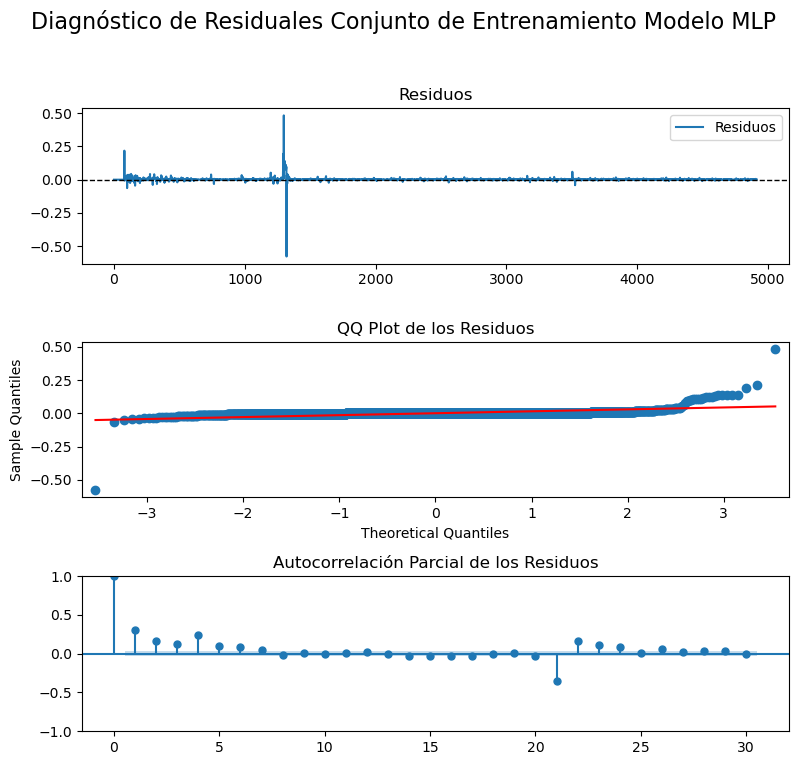

Ljung-Box LB Statistic: 466.515492
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [696]:
ljung_box_pval_MLP_train21_vola21, jarque_bera_pval_MLP_train21_vola21 = diagnostic_plots(y_train_vola21_21, train_preds_vola21_MLP21)

In [697]:
#calcular las métricas 
metrica_vola21_MLP_train21 = metricas(y_train_vola21_21,train_preds_vola21_MLP21)
metrica_vola21_MLP_train21.index = metrica_vola21_MLP_train21.index.map({0: 'MLP Entrenamiento Volatilidad ω = 21 y τ = 21'})
metrica_vola21_MLP_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train21_vola21], index=metrica_vola21_MLP_train21.index)
metrica_vola21_MLP_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train21_vola21], index=metrica_vola21_MLP_train21.index)
metrica_vola21_MLP_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 21 y τ = 21,1.0415,5.61%,0.0,0.0,94.45%,1.8367e-103,0.0


* **Conjunto de datos de Prueba:**

In [698]:
ljung_box_pvalMLP21_vola21, jarque_bera_pvalMLP21_vola21 = evaluate_residuals(data_test_plot_vola21_21, test_preds_vola21_MLP21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [699]:
metrica_MLP21_test_vola21 = metricas(y_test_vola21_21,test_preds_vola21_MLP21)
metrica_MLP21_test_vola21.index = metrica_MLP21_test_vola21.index.map({0: 'MLP Prueba Volatilidad ω = 21 y τ = 21'})
metrica_MLP21_test_vola21['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP21_vola21], index=metrica_MLP21_test_vola21.index)
metrica_MLP21_test_vola21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP21_vola21], index=metrica_MLP21_test_vola21.index)
metrica_MLP21_test_vola21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 21 y τ = 21,6.8749e-05,5.6%,0.0,0.0,84.5%,0.0087,0.792


* **Curva Runs vs Error/Score :**

In [700]:
plot_best_model_validation_loss(history_vola21_MPL21)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [701]:
errores_plots(y_train_vola21_21, train_preds_vola21_MLP21, y_val_vola21_21, val_preds_vola21_MLP21, y_test_vola21_21, test_preds_vola21_MLP21)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejado del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 28 días ($\tau=28$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [702]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(28,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola21_28, y_train_vola21_28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.6s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.7s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.7s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.7s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   9.0s
Mejor función de activación: relu
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.004218885255977511


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(28,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 28 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [703]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP28_vola21 = build_models_mlp(input_shape28, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_596"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_597 (InputLayer)      [(None, 28)]              0         
                                                                 
 dense_1568 (Dense)          (None, 32)                928       
                                                                 
 dense_1569 (Dense)          (None, 16)                528       
                                                                 
 dense_1570 (Dense)          (None, 16)                272       
                                                                 
 dropout_596 (Dropout)       (None, 16)                0         
                                                                 
 dense_1571 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,745

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [704]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola21_MLP28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_vola21 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP28`. 

In [705]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola21_MPL28 = []

# Iterar sobre cada modelo en la lista models
for i, model in enumerate(models_MLP28_vola21):
    filename = f'history_vola21_MPL28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola21_28, y=y_train_vola21_28, batch_size=16, epochs=50,  #Las epocas son las estimadas en el grid search
                                  verbose=2, callbacks=[save_best28_vola21], validation_data=(X_val_vola21_28, y_val_vola21_28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola21_MPL28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola21_MPL28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_MPL28_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [706]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_MLP28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model28_vola21 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model28_vola21 = load_model(best_model_path)  # Cargar el modelo

    if best_model28_vola21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_MLP28_weights.47-0.0008.keras con val_loss: 0.0008


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [707]:
# Predicciones usando el mejor modelo
if best_model28_vola21 is not None:
    train_preds_vola21_MLP28 = best_model28_vola21.predict(X_train_vola21_28)
    val_preds_vola21_MLP28 = best_model28_vola21.predict(X_val_vola21_28)
    test_preds_vola21_MLP28 = best_model28_vola21.predict(X_test_vola21_28)

    # Aplanar las predicciones si es necesario
    train_preds_vola21_MLP28 = np.squeeze(train_preds_vola21_MLP28)
    val_preds_vola21_MLP28 = np.squeeze(val_preds_vola21_MLP28)
    test_preds_vola21_MLP28 = np.squeeze(test_preds_vola14_MLP28)

    # Imprimir las predicciones
    print("Predicciones de entrenamiento:", train_preds_vola21_MLP28)
    print("Predicciones de validación:", val_preds_vola21_MLP28)
    print("Predicciones de prueba:", test_preds_vola21_MLP28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 76ms/step
Predicciones de entrenamiento: [0.00618984 0.00618984 0.00618984 ... 0.02314616 0.02246777 0.02216766]
Predicciones de validación: [0.02194713 0.02160701 0.02167887 0.02268315 0.02324307 0.02273287
 0.02262795 0.02239757 0.02500234 0.02553649 0.02544373 0.02526701
 0.02988758 0.03026226 0.03128419 0.03118323 0.0307458  0.02994825
 0.03047525 0.0306689  0.03068856 0.03085267 0.03064897 0.03013232
 0.02906432 0.02873153 0.03001262 0.03004884]
Predicciones de prueba: [0.02341563 0.02329951 0.0239257  0.0232718  0.02181141 0.02139834
 0.02170686 0.02298849 0.0185006  0.01725134 0.01746814 0.01890099
 0.01789921 0.01819181 0.01704365 0.01761634 0.01743313 0.01868746
 0.01865299 0.01883747 0.0188517  0.01915296 0.01872328 0.01836095
 0.01840936 0.01957742 0.01822976 0.01814106]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [708]:
data_train_plot_vola21_28, data_val_plot_vola21_28 , data_test_plot_vola21_28 = data_plot(df_1_st['Volatilidad_21'], 28)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
60      0.0290
59      0.0280
58      0.0301
57      0.0302
56      0.0302
Name: Volatilidad_21, Length: 4943, dtype: float6428

Datos de validación:
55    0.0266
54    0.0265
53    0.0263
52    0.0265
51    0.0206
50    0.0207
49    0.0199
48    0.0195
47    0.0194
46    0.0202
45    0.0188
44    0.0204
43    0.0204
42    0.0203
41    0.0166
40    0.0170
39    0.0182
38    0.0180
37    0.0162
36    0.0168
35    0.0166
34    0.0163
33    0.0159
32    0.0158
31    0.0164
30    0.0169
29    0.0168
28    0.0163
Name: Volatilidad_21, dtype: float6428

Datos de prueba:
27    0.0188
26    0.0203
25    0.0268
24    0.0280
23    0.0274
22    0.0278
21    0.0278
20    0.0313
19    0.0357
18    0.0355
17    0.0354
16    0.0354
15    0.0351
14    0.0351
13    0.0354
12    0.0358
11    0.0355
10    0.0361
9     0.0368
8     0.0403
7     0.0410
6     0.0403
5     0.0442
4     0.0441
3  

In [709]:
plot_model(data_train_plot_vola21_28[-100:], data_val_plot_vola21_28, data_test_plot_vola21_28, val_preds_vola21_MLP28, test_preds_vola21_MLP28, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

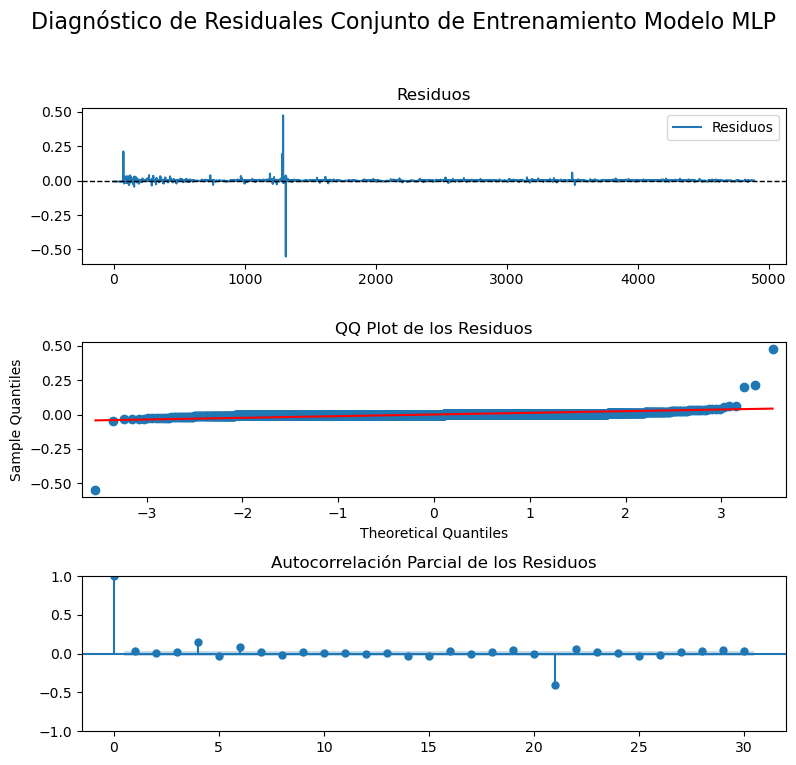

Ljung-Box LB Statistic: 7.843928
Ljung-Box p-value: 0.005099
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [710]:
ljung_box_pval_MLP_train28_vola21, jarque_bera_pval_MLP_train28_vola21 = diagnostic_plots(y_train_vola21_28, train_preds_vola21_MLP28)

In [711]:
#calcular las métricas 
metrica_vola21_MLP_train28 = metricas(y_train_vola21_28,train_preds_vola21_MLP28)
metrica_vola21_MLP_train28.index = metrica_vola21_MLP_train28.index.map({0: 'MLP Entrenamiento Volatilidad ω = 21 y τ = 28'})
metrica_vola21_MLP_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train28_vola21], index=metrica_vola21_MLP_train28.index)
metrica_vola21_MLP_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train28_vola21], index=metrica_vola21_MLP_train28.index)
metrica_vola21_MLP_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 21 y τ = 28,0.7178,7.63%,0.0,0.0,96.17%,0.0051,0.0


* **Conjunto de datos de Prueba:**

In [712]:
ljung_box_pvalMLP28_vola21, jarque_bera_pvalMLP28_vola21 = evaluate_residuals(data_test_plot_vola21_28, test_preds_vola21_MLP28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [713]:
metrica_MLP28_test_vola21 = metricas(y_test_vola21_28,test_preds_vola21_MLP28)
metrica_MLP28_test_vola21.index = metrica_MLP28_test_vola21.index.map({0: 'MLP Prueba Volatilidad ω = 21 y τ = 28'})
metrica_MLP28_test_vola21['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP28_vola21], index=metrica_MLP28_test_vola21.index)
metrica_MLP28_test_vola21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP28_vola21], index=metrica_MLP28_test_vola21.index)
metrica_MLP28_test_vola21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 21 y τ = 28,0.0001,10.46%,0.0,0.0,57.38%,3.2944e-06,0.2533


* **Curva Runs vs Error/Score :**

In [714]:
plot_best_model_validation_loss(history_vola21_MPL28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [715]:
errores_plots(y_train_vola21_28, train_preds_vola21_MLP28, y_val_vola21_28, val_preds_vola21_MLP28, y_test_vola21_28, test_preds_vola21_MLP28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


#### <font color="#30143">Volatilidad ω = 21  (Volatilidad_21): Memoria a Corto y Largo Plazo (LSTM) </font>

Ya definimos los `regresores`(`X`) y la `variable objetivo`(`y`) para el proceso de entrenamiento y validación en la selección correspondiente al modelo `Perceptrones Multicapa` a tráves de la función `create_time_series_datasets()`, sin embargo, ésta se utiliza para generar arreglos `2D` de forma (números de muestras, números de paso de tiempo). Dado que la entrada a las capas de una `RNN` debe ser de forma: número de muestras, número de paso de tiempo, número de características por paso de tiempo; procedemos con la sefinición de la función `change_dimension_lstm()` para realizar la transformación de 2D a 3D. 

##### Horizonte de 7 días ($\tau=7$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [716]:
X_train_vola21_lstm_7, X_val_vola21_lstm_7, X_test_vola21_lstm_7 = change_dimension_lstm(X_train_vola21_7, X_val_vola21_7, X_test_vola21_7)

Shape of 3D arrays X: (4971, 7, 1) (7, 7, 1) (7, 7, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [717]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(7,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=20, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola21_lstm_7, y_train_vola21_7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  21.7s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  22.2s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  22.2s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  22.3s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  22.5s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.021119742557332934


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [718]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM7_vola21_7 = build_models_lstm(input_shape7, neurons_list, dropout_rates ,'SGD')

Model: "model_613"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_614 (InputLayer)      [(None, 7, 1)]            0         
                                                                 
 lstm_546 (LSTM)             (None, 7, 64)             16896     
                                                                 
 lstm_547 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_613 (Dropout)       (None, 32)                0         
                                                                 
 dense_1633 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_6

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [719]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola21_LSTM7_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_lstm_vola21 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [720]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola21_LSTM7 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM7_vola21_7):
    filename = f'history_vola21_LSTM7_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola21_lstm_7, y=y_train_vola21_7, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best7_lstm_vola21], validation_data=(X_val_vola21_lstm_7, y_val_vola21_7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola21_LSTM7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola21_LSTM7_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM7_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM7_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM7_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM7_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM7_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM7_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM7_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM7_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM7_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [721]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_LSTM7_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best7_lstm_vola21 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best7_lstm_vola21 = load_model(best_model_path)  # Cargar el modelo

    if best7_lstm_vola21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_LSTM7_weights.02-0.0010.keras con val_loss: 0.001


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [722]:
# Predicciones usando el mejor modelo
if best7_lstm_vola21 is not None:
    # Asegúrate de que X_val_price7 y X_test_price7 tengan la forma correcta
    train_preds_vola21_LSTM7 = best7_lstm_vola21.predict(X_train_vola21_lstm_7)
    val_preds_vola21_LSTM7 = best7_lstm_vola21.predict(X_val_vola21_lstm_7)
    test_preds_vola21_LSTM7 = best7_lstm_vola21.predict(X_test_vola21_lstm_7)

    # Aplanar las predicciones si es necesario
    train_preds_vola21_LSTM7 = np.squeeze(train_preds_vola21_LSTM7)
    val_preds_vola21_LSTM7 = np.squeeze(val_preds_vola21_LSTM7)
    test_preds_vola21_LSTM7 = np.squeeze(test_preds_vola21_LSTM7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola21_LSTM7)
    print("Predicciones de validación:", val_preds_vola21_LSTM7)
    print("Predicciones de prueba:", test_preds_vola21_LSTM7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [0.00585764 0.00585764 0.00585764 ... 0.02948757 0.02868776 0.02892264]
Predicciones de validación: [0.02886204 0.03208293 0.0360367  0.03546178 0.03526539 0.03516462
 0.03485497]
Predicciones de prueba: [0.03486354 0.03516125 0.0355188  0.0351285  0.03569671 0.03636714
 0.03960679]


In [723]:
plot_model(data_train_plot_vola21[-100:], data_val_plot_vola21, data_test_plot_vola21, val_preds_vola21_LSTM7, test_preds_vola21_LSTM7, "Predicciones usando Memoria a Corto y Largo Paso (LSTM) para un horizonte de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

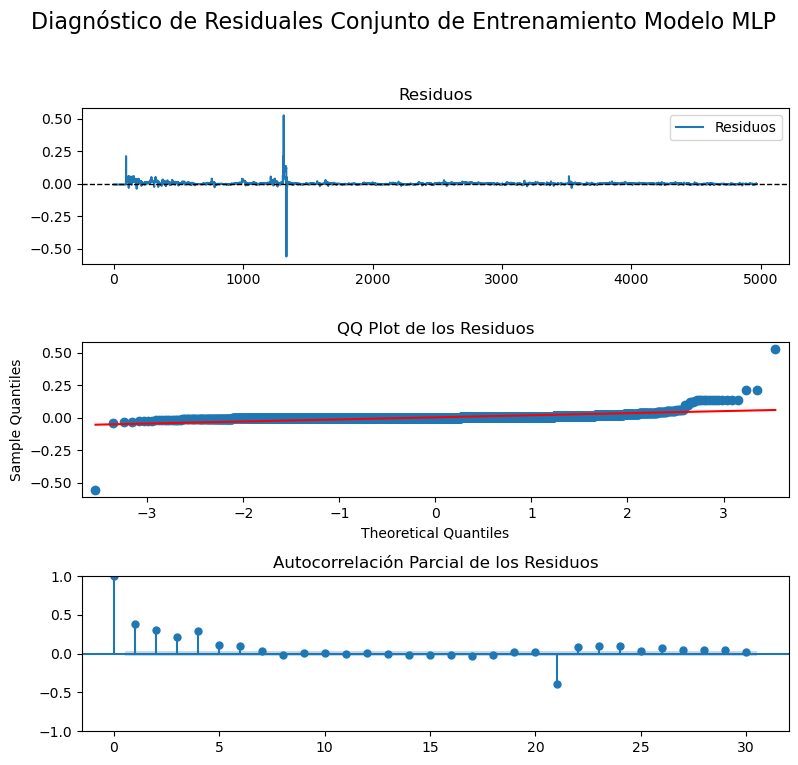

Ljung-Box LB Statistic: 710.344928
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [724]:
ljung_box_pval_LSTM_train7_vola21, jarque_bera_pval_LSTM_train7_vola21 = diagnostic_plots(y_train_vola21_7, train_preds_vola21_LSTM7)

In [725]:
#calcular las métricas 
metrica_vola21_LSTM_train = metricas(y_train_vola21_7,train_preds_vola21_LSTM7)
metrica_vola21_LSTM_train.index = metrica_vola21_LSTM_train.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 21  y τ = 7'})
metrica_vola21_LSTM_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train7_vola21], index=metrica_vola21_LSTM_train.index)
metrica_vola21_LSTM_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train7_vola21], index=metrica_vola21_LSTM_train.index)
metrica_vola21_LSTM_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 21 y τ = 7,1.2912,11.0%,0.01,0.0,93.14%,1.6833e-156,0.0


* **Conjunto de datos de Prueba:**

In [726]:
ljung_box_pvalLSTM7_vola21, jarque_bera_pvalLSTM7_vola21 = evaluate_residuals(data_test_plot_vola21_7, test_preds_vola21_LSTM7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [727]:
metrica_LSTM_test_vola21 = metricas(y_test_vola21_7,test_preds_vola21_LSTM7)
metrica_LSTM_test_vola21.index = metrica_LSTM_test_vola21.index.map({0: 'LSTM Prueba Volatilidad ω = 21 y τ = 7'})
metrica_LSTM_test_vola21['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM7_vola21], index=metrica_LSTM_test_vola21.index)
metrica_LSTM_test_vola21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM7_vola21], index=metrica_LSTM_test_vola21.index)
metrica_LSTM_test_vola21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 21 y τ = 7,2.0359e-05,3.2%,0.0,0.0,38.79%,0.9782,0.5669


* **Curva Runs vs Error/Score :**

In [728]:
plot_best_model_validation_loss(history_vola21_LSTM7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [729]:
errores_plots(y_train_vola21_7, train_preds_vola21_LSTM7, y_val_vola21_7, val_preds_vola21_LSTM7, y_test_vola21_7, test_preds_vola21_LSTM7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada  del error/score correspondiente al val_loss de la epoca del mejor modelo.
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 14 días ($\tau=14$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [730]:
X_train_vola21_lstm_14, X_val_vola21_lstm_14, X_test_vola21_lstm_14 = change_dimension_lstm(X_train_vola21_14, X_val_vola21_14, X_test_vola21_14)

Shape of 3D arrays X: (4943, 14, 1) (14, 14, 1) (14, 14, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [731]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(14,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola21_lstm_14, y_train_vola21_14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.1s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.6s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  28.7s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.018596852649264046


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [732]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM14_vola21 = build_models_lstm(input_shape14, neurons_list, dropout_rates, 'SGD')

Model: "model_630"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_631 (InputLayer)      [(None, 14, 1)]           0         
                                                                 
 lstm_580 (LSTM)             (None, 14, 64)            16896     
                                                                 
 lstm_581 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_630 (Dropout)       (None, 32)                0         
                                                                 
 dense_1650 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_6

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [733]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola21_LSTM14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_lstm_vola21 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [734]:
import os
from joblib import dump, load


history_vola21_LSTM14 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM14_vola21):
    filename = f'history_vola21_LSTM14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola21_lstm_14, y=y_train_vola21_14, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best14_lstm_vola21], validation_data=(X_val_vola21_lstm_14, y_val_vola21_14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola21_LSTM14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola21_LSTM14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM14_mod

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [735]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_LSTM14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best14_lstm_vola21 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best14_lstm_vola21 = load_model(best_model_path)  # Cargar el modelo

    if best14_lstm_vola21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_LSTM14_weights.12-0.0007.keras con val_loss: 0.0007


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [736]:
# Predicciones usando el mejor modelo
if best14_lstm_vola21 is not None:

    train_preds_vola21_LSTM14 = best14_lstm_vola21.predict(X_train_vola21_lstm_14)
    val_preds_vola21_LSTM14 = best14_lstm_vola21.predict(X_val_vola21_lstm_14)
    test_preds_vola21_LSTM14 = best14_lstm_vola21.predict(X_test_vola21_lstm_14)

    # Aplanar las predicciones si es necesario
    train_preds_vola21_LSTM14 = np.squeeze(train_preds_vola21_LSTM14)
    val_preds_vola21_LSTM14 = np.squeeze(val_preds_vola21_LSTM14)
    test_preds_vola21_LSTM14 = np.squeeze(test_preds_vola21_LSTM14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola21_LSTM14)
    print("Predicciones de validación:", val_preds_vola21_LSTM14)
    print("Predicciones de prueba:", test_preds_vola21_LSTM14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de Entrenamiento: [0.00137068 0.00137068 0.00137068 ... 0.01859684 0.01999646 0.02006643]
Predicciones de validación: [0.02001688 0.01669182 0.01688053 0.01792961 0.01778759 0.01625076
 0.01671558 0.01651578 0.01629533 0.01587795 0.01582943 0.01634271
 0.01683865 0.0167429 ]
Predicciones de prueba: [0.0163111  0.01857354 0.01997992 0.02594029 0.02722446 0.02680098
 0.02706948 0.02702812 0.03009801 0.03419576 0.03414332 0.03409775
 0.03402049 0.03370049]


In [737]:
plot_model(data_train_plot_vola21_14[-100:], data_val_plot_vola21_14, data_test_plot_vola21_14, val_preds_vola21_LSTM14, test_preds_vola21_LSTM14, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

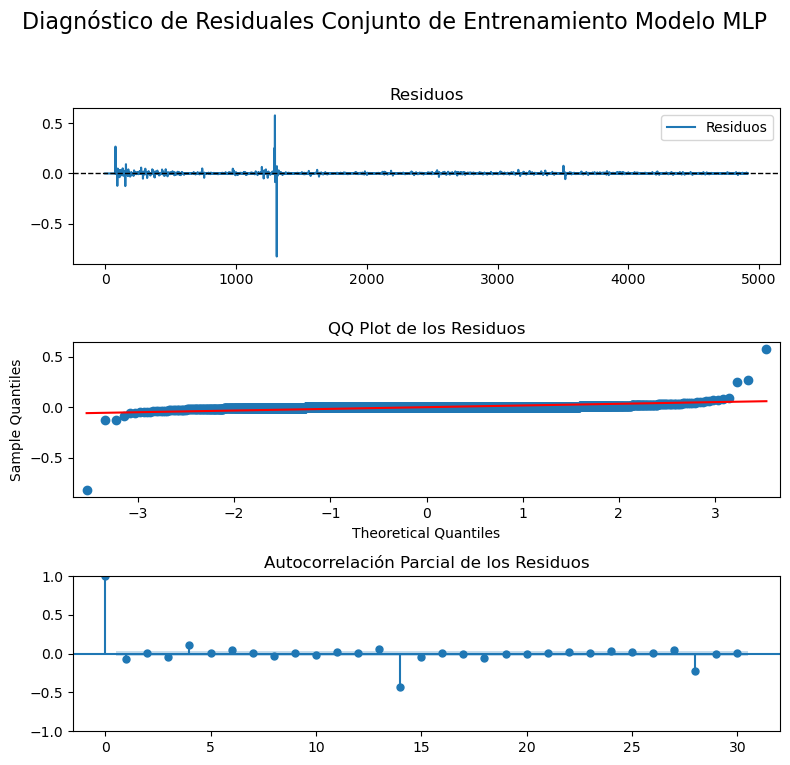

Ljung-Box LB Statistic: 24.029641
Ljung-Box p-value: 0.000001
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [738]:
ljung_box_pval_LSTM_train14_vola21, jarque_bera_pval_LSTM_train14_vola21 = diagnostic_plots(y_train_vola14_21, train_preds_vola14_LSTM21)

In [739]:
#calcular las métricas 
metrica_vola21_LSTM_train14 = metricas(y_train_vola21_14,train_preds_vola21_LSTM14)
metrica_vola21_LSTM_train14.index = metrica_vola21_LSTM_train14.index.map({0: 'LSTM Entrenamiento Volatilidada ω = 21 y τ = 14'})
metrica_vola21_LSTM_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train14_vola21], index=metrica_vola21_LSTM_train14.index)
metrica_vola21_LSTM_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train14_vola21], index=metrica_vola21_LSTM_train14.index)
metrica_vola21_LSTM_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidada ω = 21 y τ = 14,0.9414,6.88%,0.0,0.0,94.99%,9.4864e-07,0.0


* **Conjunto de datos de Prueba:**

In [740]:
ljung_box_pvalLSTM14_vola21, jarque_bera_pvalLSTM14_vola21 = evaluate_residuals(data_test_plot_vola21_14, test_preds_vola21_LSTM14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [741]:
metrica_LSTM_test14_vola21 = metricas(y_test_vola21_14,test_preds_vola21_LSTM14)
metrica_LSTM_test14_vola21.index = metrica_LSTM_test14_vola21.index.map({0: 'LSTM Prueba Volatilidada ω = 21 y τ = 14'})
metrica_LSTM_test14_vola21['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM14_vola21], index=metrica_LSTM_test14_vola21.index)
metrica_LSTM_test14_vola21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM14_vola21], index=metrica_LSTM_test14_vola21.index)
metrica_LSTM_test14_vola21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidada ω = 21 y τ = 14,0.0001,7.81%,0.0,0.0,71.83%,0.0401,0.507


* **Curva Runs vs Error/Score :**

In [742]:
plot_best_model_validation_loss(history_vola21_LSTM14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [743]:
errores_plots(y_train_vola21_14, train_preds_vola21_LSTM14, y_val_vola21_14, val_preds_vola21_LSTM14, y_test_vola21_14, test_preds_vola21_LSTM14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 21 días ($\tau=21$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [744]:
X_train_vola21_lstm_21, X_val_vola21_lstm_21, X_test_vola21_lstm_21 = change_dimension_lstm(X_train_vola21_21, X_val_vola21_21, X_test_vola21_21)

Shape of 3D arrays X: (4915, 21, 1) (21, 21, 1) (21, 21, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [745]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(21,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola21_lstm_21, y_train_vola21_21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  42.9s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  43.0s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  43.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  43.7s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  43.8s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.01861223444617785


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [746]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM21_vola21 = build_models_lstm(input_shape21, neurons_list, dropout_rates, 'SGD')

Model: "model_647"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_648 (InputLayer)      [(None, 21, 1)]           0         
                                                                 
 lstm_614 (LSTM)             (None, 21, 64)            16896     
                                                                 
 lstm_615 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_647 (Dropout)       (None, 32)                0         
                                                                 
 dense_1667 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_6

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [747]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola21_LSTM21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_lstm_vola21 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM21`. 

In [748]:
import os
from joblib import dump, load

history_vola21_LSTM21 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM21_vola21):
    filename = f'history_vola21_LSTM21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola21_lstm_21, y=y_train_vola21_21, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best21_lstm_vola21], validation_data=(X_val_vola21_lstm_21, y_val_vola21_21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola21_LSTM21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola21_LSTM21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.


El archivo 'history_vola21_LSTM21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_model_9.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_model_10.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM21_m

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [749]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_LSTM21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best21_lstm_vola21 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best21_lstm_vola21 = load_model(best_model_path)  # Cargar el modelo

    if best21_lstm_vola21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_LSTM21_weights.16-0.0009.keras con val_loss: 0.0009


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [750]:
# Predicciones usando el mejor modelo
if best21_lstm_vola21 is not None:

    train_preds_vola21_LSTM21 = best21_lstm_vola21.predict(X_train_vola21_lstm_21)
    val_preds_vola21_LSTM21 = best21_lstm_vola21.predict(X_val_vola21_lstm_21)
    test_preds_vola21_LSTM21 = best21_lstm_vola21.predict(X_test_vola21_lstm_21)

    # Aplanar las predicciones si es necesario
    train_preds_vola21_LSTM21 = np.squeeze(train_preds_vola21_LSTM21)
    val_preds_vola21_LSTM21 = np.squeeze(val_preds_vola21_LSTM21)
    test_preds_vola21_LSTM21 = np.squeeze(test_preds_vola21_LSTM21)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola21_LSTM21)
    print("Predicciones de validación:", val_preds_vola21_LSTM21)
    print("Predicciones de prueba:", test_preds_vola21_LSTM21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de Entrenamiento: [0.00065348 0.00065348 0.00065348 ... 0.03063774 0.03060195 0.03058668]
Predicciones de validación: [0.03057549 0.03045306 0.03019798 0.02876581 0.02770138 0.02972274
 0.02989157 0.02991899 0.02651528 0.02618231 0.02599606 0.0262001
 0.02062528 0.0203962  0.01971085 0.01934091 0.01921374 0.02009562
 0.01885409 0.02031451 0.02043748]
Predicciones de prueba: [0.02036349 0.01683692 0.01697856 0.01814366 0.01800072 0.01635892
 0.01683744 0.01665791 0.01641026 0.01597091 0.01591787 0.01646969
 0.01700701 0.01690847 0.01644375 0.01884063 0.0203766  0.02669264
 0.02813905 0.02761963 0.02787962]


In [751]:
plot_model(data_train_plot_vola21[-100:], data_val_plot_vola21, data_test_plot_vola21, val_preds_vola21_LSTM21, test_preds_vola21_LSTM21, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

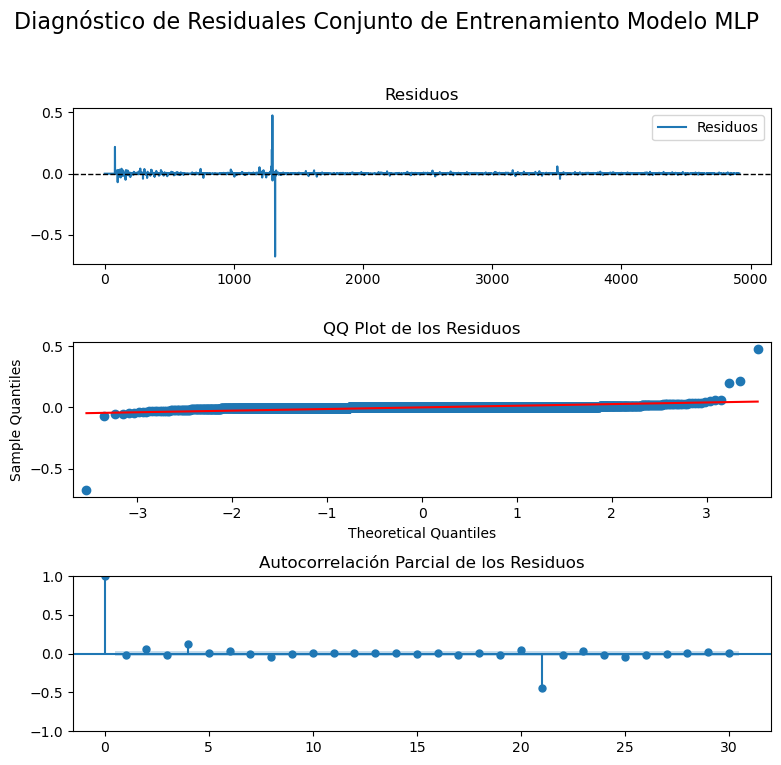

Ljung-Box LB Statistic: 0.656326
Ljung-Box p-value: 0.417860
No se rechaza H0: los residuales son independientes (no correlacionados).
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [752]:
ljung_box_pval_LSTM_train21_vola21, jarque_bera_pval_LSTM_train21_vola21 = diagnostic_plots(y_train_vola21_21, train_preds_vola21_LSTM21)

In [753]:
#calcular las métricas 
metrica_vola21_LSTM_train21 = metricas(y_train_vola21_21,train_preds_vola21_LSTM21)
metrica_vola21_LSTM_train21.index = metrica_vola21_LSTM_train21.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 21 y τ = 21'})
metrica_vola21_LSTM_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train21_vola21], index=metrica_vola21_LSTM_train21.index)
metrica_vola21_LSTM_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train21_vola21], index=metrica_vola21_LSTM_train21.index)
metrica_vola21_LSTM_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 21 y τ = 21,0.8763,5.2%,0.0,0.0,95.33%,0.4179,0.0


* **Conjunto de datos de Prueba:**

In [754]:
ljung_box_pvalLSTM21_vola21, jarque_bera_pvalLSTM21_vola21 = evaluate_residuals(data_test_plot_vola21_21, test_preds_vola21_LSTM21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [755]:
metrica_LSTM_test21_vola21 = metricas(y_test_vola21_21,test_preds_vola21_LSTM21)
metrica_LSTM_test21_vola21.index = metrica_LSTM_test21_vola21.index.map({0: 'LSTM Prueba Volatilidad ω = 21 y τ = 21'})
metrica_LSTM_test21_vola21['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM21_vola21], index=metrica_LSTM_test21_vola21.index)
metrica_LSTM_test21_vola21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM21_vola21], index=metrica_LSTM_test21_vola21.index)
metrica_LSTM_test21_vola21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 21 y τ = 21,7.1796e-05,5.49%,0.0,0.0,83.82%,0.0079,0.6907


##### Horizonte de 28 días ($\tau=28$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [756]:
X_train_vola21_lstm_28, X_val_vola21_lstm_28, X_test_vola21_lstm_28 = change_dimension_lstm(X_train_vola21_28, X_val_vola21_28, X_test_vola21_28)

Shape of 3D arrays X: (4887, 28, 1) (28, 28, 1) (28, 28, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [757]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(28,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola21_lstm_28, y_train_vola21_28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  45.9s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  46.0s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  46.7s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  46.8s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  46.9s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.017083894606823153


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [758]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM28_vola21 = build_models_lstm(input_shape28, neurons_list, dropout_rates, 'SGD')

Model: "model_664"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_665 (InputLayer)      [(None, 28, 1)]           0         
                                                                 
 lstm_648 (LSTM)             (None, 28, 64)            16896     
                                                                 
 lstm_649 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_664 (Dropout)       (None, 32)                0         
                                                                 
 dense_1684 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_6

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [759]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola21_LSTM28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_lstm_vola21 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM28_at`. 

In [760]:
import os
from joblib import dump, load

history_vola21_LSTM28 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM28_vola21):
    filename = f'history_vola21_LSTM28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola21_lstm_28, y=y_train_vola21_28, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best28_lstm_vola21], validation_data=(X_val_vola21_lstm_28, y_val_vola21_28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola21_LSTM28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola21_LSTM28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola21_LSTM28_mod

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [761]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_LSTM28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best28_lstm_vola21 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best28_lstm_vola21 = load_model(best_model_path)  # Cargar el modelo

    if best28_lstm_vola21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_LSTM28_weights.18-0.0008.keras con val_loss: 0.0008


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [762]:
# Predicciones usando el mejor modelo
if best28_lstm_vola21 is not None:

    train_preds_vola21_LSTM28 = best28_lstm_vola21.predict(X_train_vola21_lstm_28)
    val_preds_vola21_LSTM28 = best28_lstm_vola21.predict(X_val_vola21_lstm_28)
    test_preds_vola21_LSTM28 = best28_lstm_vola21.predict(X_test_vola21_lstm_28)

    # Aplanar las predicciones si es necesario
    train_preds_vola21_LSTM28 = np.squeeze(train_preds_vola21_LSTM28)
    val_preds_vola21_LSTM28 = np.squeeze(val_preds_vola21_LSTM28)
    test_preds_vola21_LSTM28 = np.squeeze(test_preds_vola21_LSTM28)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola21_LSTM28)
    print("Predicciones de validación:", val_preds_vola21_LSTM28)
    print("Predicciones de prueba:", test_preds_vola21_LSTM28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 11ms/step
Predicciones de Entrenamiento: [0.0009957  0.0009957  0.0009957  ... 0.02293545 0.02256175 0.0224879 ]
Predicciones de validación: [0.02251082 0.02081096 0.02097826 0.02258164 0.02357003 0.02277881
 0.02275437 0.02215185 0.02568892 0.02607032 0.02526024 0.02530244
 0.03043149 0.03052609 0.03073953 0.03084078 0.03051634 0.03019146
 0.03079004 0.03076506 0.03075091 0.03074311 0.03062394 0.03037234
 0.02893647 0.02790142 0.02999138 0.03012735]
Predicciones de prueba: [0.03010623 0.02664904 0.02639517 0.02627532 0.02649558 0.0208377
 0.02072348 0.02011058 0.01974697 0.01959611 0.02045862 0.01914769
 0.02061931 0.02070809 0.02060062 0.01702055 0.01726113 0.01850034
 0.01832521 0.01662601 0.01713833 0.01696429 0.01670713 0.01625929
 0.01621382 0.01677578 0.01730042 0.01717015]


In [763]:
plot_model(data_train_plot_vola21_28[-100:], data_val_plot_vola21_28, data_test_plot_vola21_28, val_preds_vola21_LSTM28, test_preds_vola21_LSTM28, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

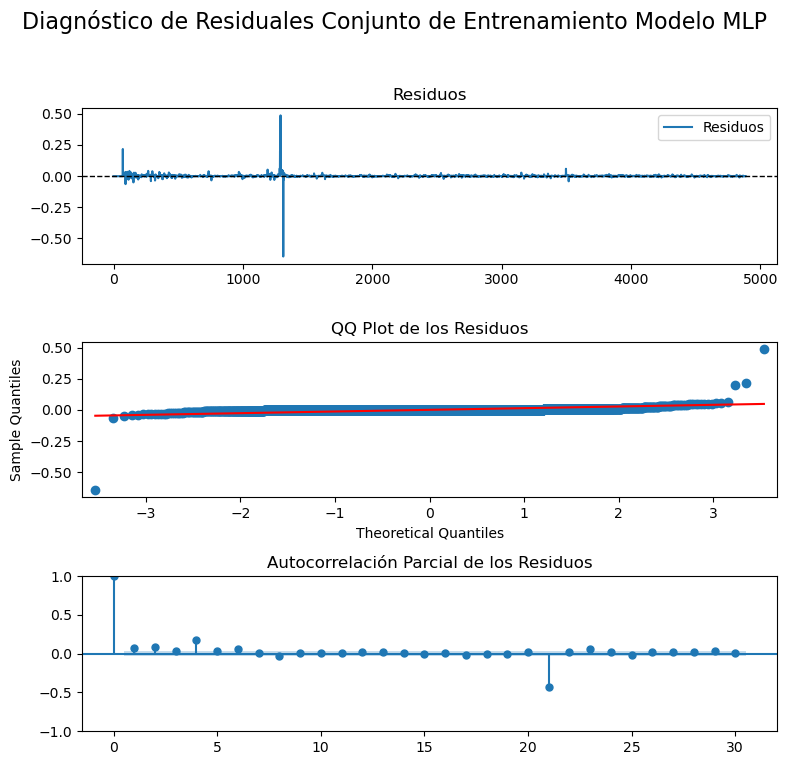

Ljung-Box LB Statistic: 25.459878
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [764]:
ljung_box_pval_LSTM_train28_vola21, jarque_bera_pval_LSTM_train28_vola21 = diagnostic_plots(y_train_vola21_28, train_preds_vola21_LSTM28)

In [765]:
#calcular las métricas 
metrica_vola21_LSTM_train28 = metricas(y_train_vola21_28,train_preds_vola21_LSTM28)
metrica_vola21_LSTM_train28.index = metrica_vola21_LSTM_train28.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 21 y τ = 28'})
metrica_vola21_LSTM_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train28_vola21], index=metrica_vola21_LSTM_train28.index)
metrica_vola21_LSTM_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train28_vola21], index=metrica_vola21_LSTM_train28.index)
metrica_vola21_LSTM_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 21 y τ = 28,0.8814,5.44%,0.0,0.0,95.3%,4.5168e-07,0.0


* **Conjunto de datos de Prueba:**

In [766]:
ljung_box_pvalLSTM28_vola21, jarque_bera_pvalLSTM28_vola21 = evaluate_residuals(data_test_plot_vola21_28, test_preds_vola21_LSTM28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [767]:
metrica_LSTM_test28_vola21 = metricas(y_test_vola21_28,test_preds_vola21_LSTM28)
metrica_LSTM_test28_vola21.index = metrica_LSTM_test28_vola21.index.map({0: 'LSTM Prueba Volatilidad ω = 21 y τ = 28'})
metrica_LSTM_test28_vola21['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM28_vola21], index=metrica_LSTM_test28_vola21.index)
metrica_LSTM_test28_vola21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM28_vola21], index=metrica_LSTM_test28_vola21.index)
metrica_LSTM_test28_vola21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 21 y τ = 28,7.6550e-05,5.21%,0.0,0.0,75.75%,4.2251e-06,0.2692


* **Curva Runs vs Error/Score :**

In [768]:
plot_best_model_validation_loss(history_vola21_LSTM28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [769]:
errores_plots(y_train_vola21_28, train_preds_vola21_LSTM28, y_val_vola21_28, val_preds_vola21_LSTM28, y_test_vola21_28, test_preds_vola21_LSTM28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada  del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana  del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



#### <font color="#30143">Volatilidad ω = 28  (Volatilidad_28): Perceptrones Multicapa (MLP)</font>


##### Horizonte de 7 días ($\tau=7$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [770]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(7,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': [ 'tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [20], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola28_7, y_train_vola28_7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   5.2s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   5.5s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   5.7s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   5.7s
[CV] END ....activation=tanh, epochs=20, learning_rate=0.001; total time=   6.6s
Mejor función de activación: tanh
Mejor número de epocas: 20
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.0026480191387236117


A idexación de parámetros función `build_models` con base a lo indicado en el númeral 3 del parcial práctico. 

In [771]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP7_vola28 = build_models_mlp(input_shape7, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_681"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_682 (InputLayer)      [(None, 7)]               0         
                                                                 
 dense_1704 (Dense)          (None, 32)                256       
                                                                 
 dense_1705 (Dense)          (None, 16)                528       
                                                                 
 dense_1706 (Dense)          (None, 16)                272       
                                                                 
 dropout_681 (Dropout)       (None, 16)                0         
                                                                 
 dense_1707 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,073

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [772]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola28_MLP7_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_vola28 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP7`. 

In [773]:
import os
from joblib import dump, load

history_vola28_MPL7 = []

# Iterar sobre cada modelo en la lista models_MLP7
for i, model in enumerate(models_MLP7_vola28):
    filename = f'history_vola28_MPL7_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola28_7, y=y_train_vola28_7, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best7_vola28], validation_data=(X_val_vola28_7, y_val_vola28_7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola28_MPL7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola28_MPL7_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL7_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL7_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL7_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL7_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL7_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL7_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL7_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL7_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL7_model_9.joblib' ya exis

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [774]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola28_MLP7_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model7_vola28 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model7_vola28 = load_model(best_model_path)  # Cargar el modelo

    if best_model7_vola28 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola28_MLP7_weights.07-0.0010.keras con val_loss: 0.001


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [775]:
# Predicciones usando el mejor modelo
if best_model7_vola28 is not None:

    train_preds_vola28_MLP7 = best_model7_vola28.predict(X_train_vola28_7)
    val_preds_vola28_MLP7 = best_model7_vola28.predict(X_val_vola28_7)
    test_preds_vola28_MLP7 = best_model7_vola28.predict(X_test_vola28_7)

    # Aplanar las predicciones si es necesario
    train_preds_vola28_MLP7 = np.squeeze(train_preds_vola28_MLP7)
    val_preds_vola28_MLP7 = np.squeeze(val_preds_vola28_MLP7)
    test_preds_vola28_MLP7 = np.squeeze(test_preds_vola28_MLP7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola28_MLP7)
    print("Predicciones de validación:", val_preds_vola28_MLP7)
    print("Predicciones de prueba:", test_preds_vola28_MLP7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de Entrenamiento: [0.00255071 0.00255071 0.00255071 ... 0.02623877 0.02583994 0.02579919]
Predicciones de validación: [0.02548368 0.02780309 0.03172392 0.03231183 0.0319136  0.03159869
 0.03161928]
Predicciones de prueba: [0.03159535 0.03178523 0.03192443 0.03155926 0.03203966 0.03288624
 0.03500837]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [776]:
data_train_plot_vola28_7, data_val_plot_vola28_7, data_test_plot_vola28_7 = data_plot(df_1_st['Volatilidad_28'], 7)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
18      0.0320
17      0.0319
16      0.0315
15      0.0316
14      0.0316
Name: Volatilidad_28, Length: 4985, dtype: float647

Datos de validación:
13    0.0320
12    0.0321
11    0.0316
10    0.0323
9     0.0331
8     0.0355
7     0.0362
Name: Volatilidad_28, dtype: float647

Datos de prueba:
6    0.0363
5    0.0403
4    0.0434
3    0.0440
2    0.0444
1    0.0444
0    0.0450
Name: Volatilidad_28, dtype: float647


In [777]:
plot_model(data_train_plot_vola28_7[-100:], data_val_plot_vola28_7, data_test_plot_vola28_7, val_preds_vola28_MLP7, test_preds_vola28_MLP7, "Predicciones usando Perceptrón Multicapa (MLP)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

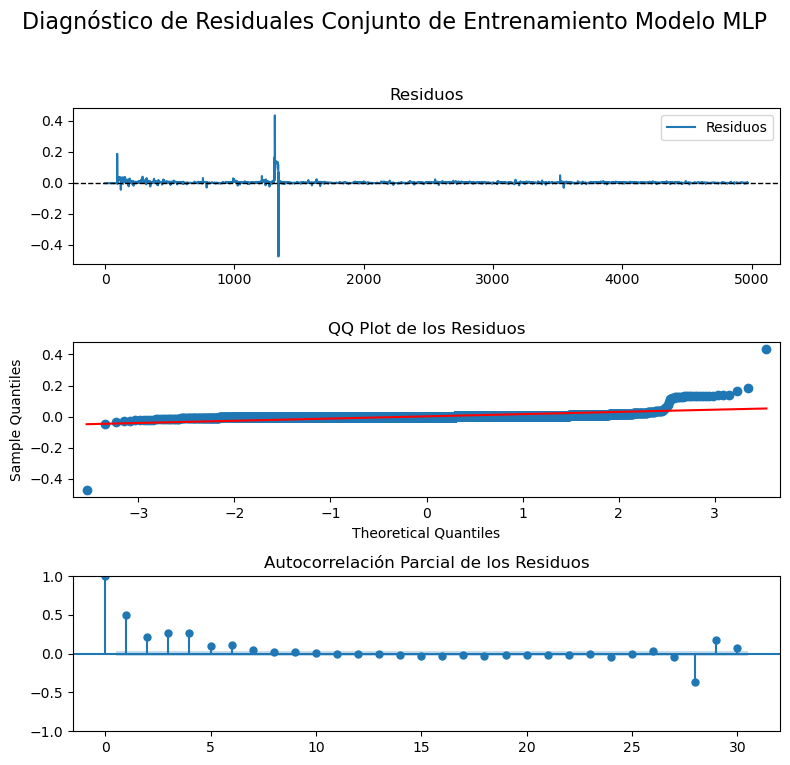

Ljung-Box LB Statistic: 1238.240659
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [778]:
ljung_box_pval_MLP_train7_vola28, jarque_bera_pval_MLP_train7_vola28 = diagnostic_plots(y_train_vola28_7, train_preds_vola28_MLP7)

In [779]:
#calcular las métricas 
metrica_vola28_MLP_train = metricas(y_train_vola28_7,train_preds_vola28_MLP7)
metrica_vola28_MLP_train.index = metrica_vola28_MLP_train.index.map({0: 'MLP Entrenamiento Volatilidad ω = 28 y τ = 7'})
metrica_vola28_MLP_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train7_vola28], index=metrica_vola28_MLP_train.index)
metrica_vola28_MLP_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train7_vola28], index=metrica_vola28_MLP_train.index)
metrica_vola28_MLP_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 28 y τ = 7,1.0324,5.97%,0.0,0.0,94.36%,2.9829e-271,0.0


* **Conjunto de datos de Prueba:**

In [780]:
ljung_box_pvalMLP7_vola28, jarque_bera_pvalMLP7_vola28 = evaluate_residuals(data_test_plot_vola28_7, test_preds_vola28_MLP7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [781]:
metrica_MLP7_test_vola28 = metricas(y_test_vola28_7,test_preds_vola28_MLP7)
metrica_MLP7_test_vola28.index = metrica_MLP7_test_vola28.index.map({0: 'MLP Prueba Volatilidad ω = 28 y τ = 7'})
metrica_MLP7_test_vola28['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP7_vola28], index=metrica_MLP7_test_vola28.index)
metrica_MLP7_test_vola28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP7_vola28], index=metrica_MLP7_test_vola28.index)
metrica_MLP7_test_vola28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 28 y τ = 7,1.0452e-05,2.75%,0.0,0.0,49.69%,0.2109,0.4604


* **Curva Runs vs Error/Score :**

In [782]:
plot_best_model_validation_loss(history_vola28_MPL7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [783]:
errores_plots(y_train_vola28_7, train_preds_vola28_MLP7, y_val_vola28_7, val_preds_vola28_MLP7, y_test_vola28_7, test_preds_vola28_MLP7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra muy cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 14 días ($\tau=14$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [784]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(14,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola28_14, y_train_vola28_14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=  11.4s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=  11.3s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=  11.4s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=  11.4s
[CV] END ....activation=tanh, epochs=50, learning_rate=0.001; total time=  11.5s
Mejor función de activación: tanh
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.003689728630706668


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(14,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 14 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [785]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP14_vola28 = build_models_mlp(input_shape14, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_698"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_699 (InputLayer)      [(None, 14)]              0         
                                                                 
 dense_1772 (Dense)          (None, 32)                480       
                                                                 
 dense_1773 (Dense)          (None, 16)                528       
                                                                 
 dense_1774 (Dense)          (None, 16)                272       
                                                                 
 dropout_698 (Dropout)       (None, 16)                0         
                                                                 
 dense_1775 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,297

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [786]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola28_MLP14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_vola28 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP14`. 

In [787]:
import os
from joblib import dump, load

history_vola28_MPL14 = []

# Iterar sobre cada modelo en la lista models
for i, model in enumerate(models_MLP14_vola28):
    filename = f'history_vola28_MPL14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola28_14, y=y_train_vola28_14, batch_size=16, epochs=50, 
                                  verbose=2, callbacks=[save_best14_vola28], validation_data=(X_val_vola28_14, y_val_vola28_14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola28_MPL14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola28_MPL14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL14_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [788]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_MLP14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model14_vola28 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model14_vola28 = load_model(best_model_path)  # Cargar el modelo

    if best_model14_vola28 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_MLP14_weights.31-0.0007.keras con val_loss: 0.0007


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [789]:
# Predicciones usando el mejor modelo
if best_model14_vola28 is not None:

    train_preds_vola28_MLP14 = best_model14_vola28.predict(X_train_vola28_14)
    val_preds_vola28_MLP14 = best_model14_vola28.predict(X_val_vola28_14)
    test_preds_vola28_MLP14 = best_model14_vola28.predict(X_test_vola28_14)


    # Aplanar las predicciones si es necesario
    train_preds_vola28_MLP14 = np.squeeze(train_preds_vola28_MLP14)
    val_preds_vola28_MLP14 = np.squeeze(val_preds_vola28_MLP14)
    test_preds_vola28_MLP14 = np.squeeze(test_preds_vola21_MLP14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola28_MLP14)
    print("Predicciones de validación:", val_preds_vola28_MLP14)
    print("Predicciones de prueba:", test_preds_vola28_MLP14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 9ms/step
Predicciones de Entrenamiento: [0.00096389 0.00096389 0.00096389 ... 0.02344747 0.01979331 0.01988902]
Predicciones de validación: [0.01919066 0.01982177 0.01985291 0.02086421 0.01934887 0.01943096
 0.01967336 0.01954099 0.01636165 0.01642716 0.01673802 0.01693009
 0.01565346 0.01581212]
Predicciones de prueba: [0.01619704 0.01876767 0.02032613 0.02681474 0.02800784 0.02734597
 0.02763236 0.02751197 0.03080346 0.03511794 0.03477101 0.03459641
 0.03437426 0.03399778]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 14 días ($\tau = 14$). 

In [790]:
data_train_plot_vola28_14, data_val_plot_vola28_14, data_test_plot_vola28_14 = data_plot(df_1_st['Volatilidad_28'], 14)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
32      0.0170
31      0.0172
30      0.0159
29      0.0160
28      0.0160
Name: Volatilidad_28, Length: 4971, dtype: float6414

Datos de validación:
27    0.0177
26    0.0188
25    0.0243
24    0.0252
23    0.0252
22    0.0252
21    0.0248
20    0.0277
19    0.0318
18    0.0320
17    0.0319
16    0.0315
15    0.0316
14    0.0316
Name: Volatilidad_28, dtype: float6414

Datos de prueba:
13    0.0320
12    0.0321
11    0.0316
10    0.0323
9     0.0331
8     0.0355
7     0.0362
6     0.0363
5     0.0403
4     0.0434
3     0.0440
2     0.0444
1     0.0444
0     0.0450
Name: Volatilidad_28, dtype: float6414


In [791]:
plot_model(data_train_plot_vola28_14[-100:], data_val_plot_vola28_14, data_test_plot_vola28_14, val_preds_vola28_MLP14, test_preds_vola28_MLP14, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 14 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

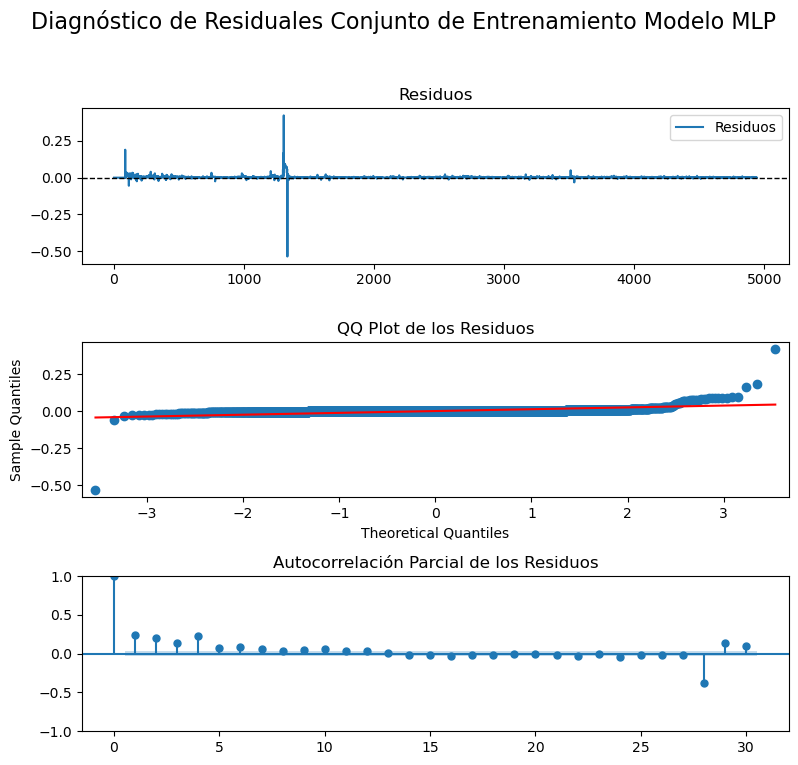

Ljung-Box LB Statistic: 300.047176
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [792]:
ljung_box_pval_MLP_train14_vola28, jarque_bera_pval_MLP_train14_vola28 = diagnostic_plots(y_train_vola28_14, train_preds_vola28_MLP14)

In [793]:
#calcular las métricas 
metrica_vola28_MLP_train14 = metricas(y_train_vola28_14,train_preds_vola28_MLP14)
metrica_vola28_MLP_train14.index = metrica_vola28_MLP_train14.index.map({0: 'MLP Entrenamiento Volatilidad ω = 28  y τ = 14'})
metrica_vola28_MLP_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train14_vola28], index=metrica_vola28_MLP_train14.index)
metrica_vola28_MLP_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train14_vola28], index=metrica_vola28_MLP_train14.index)
metrica_vola28_MLP_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 28 y τ = 14,0.7766,5.47%,0.0,0.0,95.75%,3.2173e-67,0.0


* **Conjunto de datos de Prueba:**

In [794]:
ljung_box_pvalMLP14_vola28, jarque_bera_pvalMLP14_vola28 = evaluate_residuals(data_test_plot_vola28_14, test_preds_vola28_MLP14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [795]:
metrica_MLP14_test_vola28= metricas(y_test_vola28_14,test_preds_vola28_MLP14)
metrica_MLP14_test_vola28.index = metrica_MLP14_test_vola28.index.map({0: 'MLP Prueba Volatilidad ω = 28  τ = 14'})
metrica_MLP14_test_vola28['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP14_vola28], index=metrica_MLP14_test_vola28.index)
metrica_MLP14_test_vola28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP14_vola28], index=metrica_MLP14_test_vola28.index)
metrica_MLP14_test_vola28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 28 τ = 14,8.3423e-05,7.97%,0.0,0.0,73.12%,0.0356,0.7552


* **Curva Runs vs Error/Score :**

In [796]:
plot_best_model_validation_loss(history_vola28_MPL14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [797]:
errores_plots(y_train_vola28_14, train_preds_vola28_MLP14, y_val_vola28_14, val_preds_vola28_MLP14, y_test_vola28_14, test_preds_vola28_MLP14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada  del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada error/score correspondiente al val_loss de la epoca del mejor modelo.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. Sin embargo, a pesar de esto, se evidencia que existe autocorrelación en los residuales, lo que hace que nuestro modelo no sea confiable.


##### Horizonte de 21 días ($\tau=21$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [798]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(21,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['tanh'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [100], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola28_21, y_train_vola28_21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  18.9s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.2s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.4s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.5s
[CV] END ...activation=tanh, epochs=100, learning_rate=0.001; total time=  19.4s
Mejor función de activación: tanh
Mejor número de epocas: 100
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.0034608248621225356


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(21,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 21 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [799]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP21_vola28 = build_models_mlp(input_shape21, neurons_list, dropout_rates, 'tanh')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_715"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_716 (InputLayer)      [(None, 21)]              0         
                                                                 
 dense_1840 (Dense)          (None, 32)                704       
                                                                 
 dense_1841 (Dense)          (None, 16)                528       
                                                                 
 dense_1842 (Dense)          (None, 16)                272       
                                                                 
 dropout_715 (Dropout)       (None, 16)                0         
                                                                 
 dense_1843 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,521

----------------------------------------
Modelo con 10 neuronas y dropout 0.4:
Model: "model_716"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_717 (InputLayer)      [(None, 21)]              0         
                                                                 
 dense_1844 (Dense)          (None, 32)                704       
                                                                 
 dense_1845 (Dense)          (None, 16)                528       
                                                                 
 dense_1846 (Dense)          (None, 16)                272       
                                                                 
 dropout_716 (Dropout)       (None, 16)                0         
                                                                 
 dense_1847 (Dense)          (None, 1)                 17        
                                            

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [800]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola28_MLP21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_vola28 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP21`. 

In [801]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola28_MPL21 = []

# Iterar sobre cada modelo en la lista models_MLP14
for i, model in enumerate(models_MLP21_vola28):
    filename = f'history_vola28_MPL21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola28_21, y=y_train_vola28_21, batch_size=16, epochs=100, 
                                  verbose=2, callbacks=[save_best21_vola28], validation_data=(X_val_vola28_21, y_val_vola28_21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola28_MPL21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola28_MPL21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL21_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [802]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola21_MLP21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model21_vola28 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model21_vola28 = load_model(best_model_path)  # Cargar el modelo

    if best_model21_vola28 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola21_MLP21_weights.33-0.0009.keras con val_loss: 0.0009


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [803]:
# Predicciones usando el mejor modelo
if best_model21_vola28 is not None:
    train_preds_vola28_MLP21 = best_model21_vola28.predict(X_train_vola28_21)
    val_preds_vola28_MLP21 = best_model21_vola28.predict(X_val_vola28_21)
    test_preds_vola28_MLP21 = best_model21_vola28.predict(X_test_vola28_21)

    # Aplanar las predicciones si es necesario
    train_preds_vola28_MLP21 = np.squeeze(train_preds_vola28_MLP21)
    val_preds_vola28_MLP21 = np.squeeze(val_preds_vola28_MLP21)
    test_preds_vola28_MLP21 = np.squeeze(test_preds_vola21_MLP21)

    # Imprimir las predicciones
    print('Predicciones de entrenamiento', train_preds_vola28_MLP21)
    print("Predicciones de validación:", val_preds_vola28_MLP21)
    print("Predicciones de prueba:", test_preds_vola28_MLP21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de entrenamiento [0.00090695 0.00090695 0.00090695 ... 0.02768848 0.0277948  0.02782575]
Predicciones de validación: [0.02773869 0.0289297  0.02870962 0.02838853 0.0281683  0.02947461
 0.02961299 0.02954107 0.02873065 0.0285065  0.02731386 0.02653163
 0.02650014 0.0265651  0.02674493 0.02304945 0.02275787 0.02339505
 0.02389429 0.02034396 0.02012679]
Predicciones de prueba: [0.02008242 0.01652398 0.01668522 0.01795449 0.01781894 0.01621883
 0.01652392 0.01663592 0.01646791 0.01594731 0.01566346 0.01654514
 0.01716333 0.01691436 0.01634654 0.01892112 0.02054337 0.02705515
 0.02855585 0.0279751  0.0280706 ]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 21 días ($\tau = 21$). 

In [804]:
data_train_plot_vola28_21, data_val_plot_vola28_21, data_test_plot_vola28_21 = data_plot(df_1_st['Volatilidad_28'], 21)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
46      0.0238
45      0.0242
44      0.0205
43      0.0205
42      0.0197
Name: Volatilidad_28, Length: 4957, dtype: float6421

Datos de validación:
41    0.0203
40    0.0203
39    0.0213
38    0.0197
37    0.0197
36    0.0199
35    0.0198
34    0.0167
33    0.0167
32    0.0170
31    0.0172
30    0.0159
29    0.0160
28    0.0160
27    0.0177
26    0.0188
25    0.0243
24    0.0252
23    0.0252
22    0.0252
21    0.0248
Name: Volatilidad_28, dtype: float6421

Datos de prueba:
20    0.0277
19    0.0318
18    0.0320
17    0.0319
16    0.0315
15    0.0316
14    0.0316
13    0.0320
12    0.0321
11    0.0316
10    0.0323
9     0.0331
8     0.0355
7     0.0362
6     0.0363
5     0.0403
4     0.0434
3     0.0440
2     0.0444
1     0.0444
0     0.0450
Name: Volatilidad_28, dtype: float6421


In [805]:
plot_model(data_train_plot_vola28_21[-100:], data_val_plot_vola28_21, data_test_plot_vola28_21, val_preds_vola28_MLP21, test_preds_vola28_MLP21, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 21 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

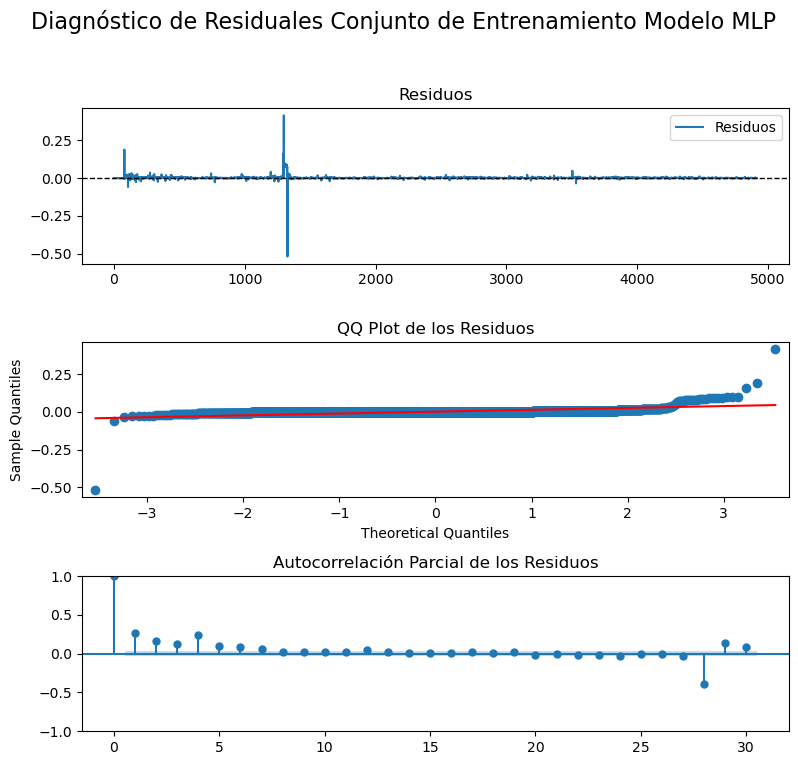

Ljung-Box LB Statistic: 351.172296
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [806]:
ljung_box_pval_MLP_train21_vola28, jarque_bera_pval_MLP_train21_vola28 = diagnostic_plots(y_train_vola28_21, train_preds_vola28_MLP21)

In [807]:
#calcular las métricas 
metrica_vola28_MLP_train21 = metricas(y_train_vola28_21,train_preds_vola28_MLP21)
metrica_vola28_MLP_train21.index = metrica_vola28_MLP_train21.index.map({0: 'MLP Entrenamiento Volatilidad ω = 28 y τ = 21'})
metrica_vola28_MLP_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train21_vola28], index=metrica_vola28_MLP_train21.index)
metrica_vola28_MLP_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train21_vola28], index=metrica_vola28_MLP_train21.index)
metrica_vola28_MLP_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 28 y τ = 21,0.7573,4.54%,0.0,0.0,95.85%,2.3543e-78,0.0


* **Conjunto de datos de Prueba:**

In [808]:
ljung_box_pvalMLP21_vola28, jarque_bera_pvalMLP21_vola28 = evaluate_residuals(data_test_plot_vola28_21, test_preds_vola28_MLP21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [809]:
metrica_MLP21_test_vola28 = metricas(y_test_vola28_21,test_preds_vola28_MLP21)
metrica_MLP21_test_vola28.index = metrica_MLP21_test_vola28.index.map({0: 'MLP Prueba Volatilidad ω = 28 y τ = 21'})
metrica_MLP21_test_vola28['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP21_vola28], index=metrica_MLP21_test_vola28.index)
metrica_MLP21_test_vola28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP21_vola28], index=metrica_MLP21_test_vola28.index)
metrica_MLP21_test_vola28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 28 y τ = 21,0.0001,9.38%,0.0,0.0,43.97%,0.0121,0.1292


* **Curva Runs vs Error/Score :**

In [810]:
plot_best_model_validation_loss(history_vola28_MPL21)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [811]:
errores_plots(y_train_vola28_21, train_preds_vola28_MLP21, y_val_vola28_21, val_preds_vola28_MLP21, y_test_vola28_21, test_preds_vola28_MLP21)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


##### Horizonte de 28 días ($\tau=28$)

A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [812]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'   # Esto ignorará todos los logs de info y warnings.

def create_mlp_model(activation='tanh',learning_rate=0.001):
    input_layer = Input(shape=(28,), dtype='float32')  # Capa de entrada
    dense1 = Dense(32, activation=activation)(input_layer) 
    dense2 = Dense(16, activation=activation)(dense1)
    dense3 = Dense(16, activation=activation)(dense2)
    dropout_layer = Dropout(0.2)(dense3)  # Capa Dropout para regularización 
    output_layer = Dense(1, activation='linear')(dropout_layer)  # Capa de salida

    model = Model(inputs=input_layer, outputs=output_layer)  # Crear el modelo
    model.compile(loss='mean_absolute_error', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate = learning_rate))  # Compilar el modelo
    return model

# Configuración el Grid Search
model = KerasRegressor(build_fn=create_mlp_model, epochs=20, batch_size=16, verbose=0) 

param_grid = {
    'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
    'epochs' : [50], # epocas a probar [20, 50, 100, 200, 300]
    'learning_rate' : [0.001] # learning rate a probar [0.001, 0.01, 0.1, 0.2, 0.3]
}

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=KFold(n_splits=5, shuffle=True), verbose =2)

#Entrenar el modelo con Grid Search
grid_result = grid.fit(X_train_vola28_28, y_train_vola28_28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (Learning Rate): {grid_result.best_params_['learning_rate']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.2s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.4s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.4s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.6s
[CV] END ....activation=relu, epochs=50, learning_rate=0.001; total time=   8.8s
Mejor función de activación: relu
Mejor número de epocas: 50
Mejor Longitud de paso μ (Learning Rate): 0.001
Mejor Puntuación: -0.0037463522050529717


A continuación, configuramos la red `MLP` empleando la `API` funcional de `Keras`. Con este método, una capa puede ser designada como la entrada para la siguiente capa en el momento de su definición.

En este contexto, `Input` es una función utilizada para establecer una capa de entrada en un modelo de `red neuronal`. La propiedad `shape=(28,)` define la `estructura` de los `datos de entrada`, lo que indica que estos tendrán 28 dimensiones. Por otro lado, `dtype='float32'` especifica que los elementos de esta capa serán números de punto `flotante de 32 bits`.

A continuación se define `función buil_models` para generación de modelos de acuerdo a los parámetros indexados a tráves de la lista. 

A idexación de parámetros función `build_models_mlp` con base a lo indicado en el númeral 3 del parcial práctico. 

In [813]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_MLP28_vola28 = build_models_mlp(input_shape28, neurons_list, dropout_rates, 'relu')

Modelo con 10 neuronas y dropout 0.2:
Model: "model_732"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_733 (InputLayer)      [(None, 28)]              0         
                                                                 
 dense_1908 (Dense)          (None, 32)                928       
                                                                 
 dense_1909 (Dense)          (None, 16)                528       
                                                                 
 dense_1910 (Dense)          (None, 16)                272       
                                                                 
 dropout_732 (Dropout)       (None, 16)                0         
                                                                 
 dense_1911 (Dense)          (None, 1)                 17        
                                                                 
Total params: 1,745

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [814]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola28_MLP28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_vola28 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_MLP28`. 

In [815]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola28_MPL28 = []

# Iterar sobre cada modelo en la lista models
for i, model in enumerate(models_MLP28_vola28):
    filename = f'history_vola28_MPL28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola28_28, y=y_train_vola28_28, batch_size=16, epochs=50,  #Las epocas son las estimadas en el grid search
                                  verbose=2, callbacks=[save_best28_vola28], validation_data=(X_val_vola28_28, y_val_vola28_28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola28_MPL28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola28_MPL28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_MPL28_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados.  Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [816]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola28_MLP28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best_model28_vola28 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best_model28_vola28 = load_model(best_model_path)  # Cargar el modelo

    if best_model28_vola28 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola28_MLP28_weights.34-0.0006.keras con val_loss: 0.0006


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [817]:
# Predicciones usando el mejor modelo
if best_model28_vola28 is not None:
    train_preds_vola28_MLP28 = best_model28_vola28.predict(X_train_vola28_28)
    val_preds_vola28_MLP28 = best_model28_vola28.predict(X_val_vola28_28)
    test_preds_vola28_MLP28 = best_model28_vola28.predict(X_test_vola28_28)

    # Aplanar las predicciones si es necesario
    train_preds_vola28_MLP28 = np.squeeze(train_preds_vola28_MLP28)
    val_preds_vola28_MLP28 = np.squeeze(val_preds_vola28_MLP28)
    test_preds_vola28_MLP28 = np.squeeze(test_preds_vola28_MLP28)

    # Imprimir las predicciones
    print("Predicciones de entrenamiento:", train_preds_vola28_MLP28)
    print("Predicciones de validación:", val_preds_vola28_MLP28)
    print("Predicciones de prueba:", test_preds_vola28_MLP28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de entrenamiento: [0.00336624 0.00336624 0.00336624 ... 0.02475141 0.02464514 0.02441207]
Predicciones de validación: [0.02440551 0.02431989 0.02286901 0.0238506  0.02442062 0.02440939
 0.02444185 0.0244737  0.02491317 0.02518687 0.02484467 0.02462438
 0.02736116 0.02804216 0.02846966 0.02799868 0.02791543 0.02764187
 0.02774693 0.02795559 0.02827209 0.0280161  0.02869812 0.0290857
 0.02864251 0.02835    0.02959434 0.02971701]
Predicciones de prueba: [0.02979818 0.02937397 0.02874593 0.02782186 0.02697697 0.02690599
 0.02686115 0.02723288 0.02437188 0.023582   0.02368518 0.02436904
 0.02181569 0.02108483 0.02043468 0.02075481 0.0208072  0.02133963
 0.02079738 0.02033143 0.02040918 0.02048375 0.01838858 0.01759318
 0.01770653 0.0179197  0.01733317 0.01711683]


A continuación se indexan los parámetros sobre la función `data_plot()` para un horionte de 28 días ($\tau = 28$). 

In [818]:
data_train_plot_vola28_28, data_val_plot_vola28_28 , data_test_plot_vola28_28 = data_plot(df_1_st['Volatilidad_28'], 28)

Datos de entrenamiento:
4998    0.0000
4997    0.0000
4996    0.0000
4995    0.0000
4994    0.0000
         ...  
60      0.0285
59      0.0283
58      0.0297
57      0.0297
56      0.0297
Name: Volatilidad_28, Length: 4943, dtype: float6428

Datos de validación:
55    0.0290
54    0.0288
53    0.0274
52    0.0269
51    0.0269
50    0.0269
49    0.0269
48    0.0232
47    0.0232
46    0.0238
45    0.0242
44    0.0205
43    0.0205
42    0.0197
41    0.0203
40    0.0203
39    0.0213
38    0.0197
37    0.0197
36    0.0199
35    0.0198
34    0.0167
33    0.0167
32    0.0170
31    0.0172
30    0.0159
29    0.0160
28    0.0160
Name: Volatilidad_28, dtype: float6428

Datos de prueba:
27    0.0177
26    0.0188
25    0.0243
24    0.0252
23    0.0252
22    0.0252
21    0.0248
20    0.0277
19    0.0318
18    0.0320
17    0.0319
16    0.0315
15    0.0316
14    0.0316
13    0.0320
12    0.0321
11    0.0316
10    0.0323
9     0.0331
8     0.0355
7     0.0362
6     0.0363
5     0.0403
4     0.0434
3  

In [819]:
plot_model(data_train_plot_vola28_28[-100:], data_val_plot_vola28_28, data_test_plot_vola28_28, val_preds_vola28_MLP28, test_preds_vola28_MLP28, "Predicciones usando Perceptrón Multicapa (MLP) para un horizonte de 28 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `validación`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

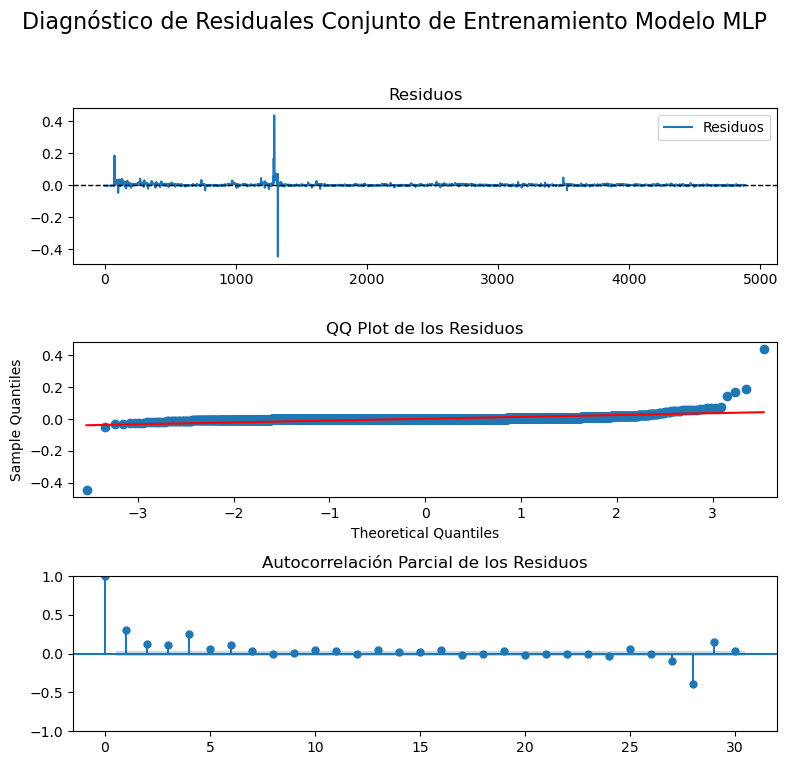

Ljung-Box LB Statistic: 450.056271
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [820]:
ljung_box_pval_MLP_train28_vola28, jarque_bera_pval_MLP_train28_vola28 = diagnostic_plots(y_train_vola28_28, train_preds_vola28_MLP28)

In [821]:
#calcular las métricas 
metrica_vola28_MLP_train28 = metricas(y_train_vola28_28,train_preds_vola28_MLP28)
metrica_vola28_MLP_train28.index = metrica_vola28_MLP_train28.index.map({0: 'MLP Entrenamiento Volatilidad ω = 28 y τ = 28'})
metrica_vola28_MLP_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_MLP_train28_vola28], index=metrica_vola28_MLP_train28.index)
metrica_vola28_MLP_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_MLP_train28_vola28], index=metrica_vola28_MLP_train28.index)
metrica_vola28_MLP_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Volatilidad ω = 28 y τ = 28,0.6679,6.35%,0.0,0.0,96.34%,7.0124e-100,0.0


* **Conjunto de datos de Prueba:**

In [822]:
ljung_box_pvalMLP28_vola28, jarque_bera_pvalMLP28_vola28 = evaluate_residuals(data_test_plot_vola28_28, test_preds_vola28_MLP28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [823]:
metrica_MLP28_test_vola28 = metricas(y_test_vola28_28,test_preds_vola28_MLP28)
metrica_MLP28_test_vola28.index = metrica_MLP28_test_vola28.index.map({0: 'MLP Prueba Volatilidad ω = 21 y τ = 28'})
metrica_MLP28_test_vola28['Ljung-Box p-value'] = pd.Series([ljung_box_pvalMLP28_vola28], index=metrica_MLP28_test_vola28.index)
metrica_MLP28_test_vola28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalMLP28_vola28], index=metrica_MLP28_test_vola28.index)
metrica_MLP28_test_vola28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Volatilidad ω = 21 y τ = 28,6.9863e-05,5.79%,0.0,0.0,85.32%,1.6950e-06,0.7195


* **Curva Runs vs Error/Score :**

In [824]:
plot_best_model_validation_loss(history_vola28_MPL28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [825]:
errores_plots(y_train_vola28_28, train_preds_vola28_MLP28, y_val_vola28_28, val_preds_vola28_MLP28, y_test_vola28_28, test_preds_vola28_MLP28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. De igual forma se observa una alta variabilidad en los residuales.

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 


#### <font color="#30143">Volatilidad ω = 28  (Volatilidad_28): Memoria a Corto y Largo Plazo (LSTM) </font>

Ya definimos los `regresores`(`X`) y la `variable objetivo`(`y`) para el proceso de entrenamiento y validación en la selección correspondiente al modelo `Perceptrones Multicapa` a tráves de la función `create_time_series_datasets()`, sin embargo, ésta se utiliza para generar arreglos `2D` de forma (números de muestras, números de paso de tiempo). Dado que la entrada a las capas de una `RNN` debe ser de forma: número de muestras, número de paso de tiempo, número de características por paso de tiempo; procedemos con la sefinición de la función `change_dimension_lstm()` para realizar la transformación de 2D a 3D. 

##### Horizonte de 7 días ($\tau=7$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [826]:
X_train_vola28_lstm_7, X_val_vola28_lstm_7, X_test_vola28_lstm_7 = change_dimension_lstm(X_train_vola28_7, X_val_vola28_7, X_test_vola28_7)

Shape of 3D arrays X: (4971, 7, 1) (7, 7, 1) (7, 7, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [827]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(7,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=20, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola28_lstm_7, y_train_vola28_7)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  23.7s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  24.1s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  24.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  24.5s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  24.6s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.017751403726695182


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [828]:
input_shape7 = 7
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM7_vola28_7 = build_models_lstm(input_shape7, neurons_list, dropout_rates ,'SGD')

Model: "model_749"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_750 (InputLayer)      [(None, 7, 1)]            0         
                                                                 
 lstm_682 (LSTM)             (None, 7, 64)             16896     
                                                                 
 lstm_683 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_749 (Dropout)       (None, 32)                0         
                                                                 
 dense_1973 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_7

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [829]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola28_LSTM7_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best7_lstm_vola28 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [830]:
import os
from joblib import dump, load

# Suponiendo que ts_model es una lista de modelos
history_vola28_LSTM7 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM7_vola28_7):
    filename = f'history_vola28_LSTM7_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola28_lstm_7, y=y_train_vola28_7, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best7_lstm_vola28], validation_data=(X_val_vola28_lstm_7, y_val_vola28_7),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola28_LSTM7.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola28_LSTM7_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM7_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM7_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM7_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM7_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM7_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM7_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM7_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM7_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM7_model_9.jobli

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [831]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola28_LSTM7_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best7_lstm_vola28 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best7_lstm_vola28 = load_model(best_model_path)  # Cargar el modelo

    if best7_lstm_vola21 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola28_LSTM7_weights.20-0.0010.keras con val_loss: 0.001


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [832]:
# Predicciones usando el mejor modelo
if best7_lstm_vola28 is not None:
    # Asegúrate de que X_val_price7 y X_test_price7 tengan la forma correcta
    train_preds_vola28_LSTM7 = best7_lstm_vola28.predict(X_train_vola28_lstm_7)
    val_preds_vola28_LSTM7 = best7_lstm_vola28.predict(X_val_vola28_lstm_7)
    test_preds_vola28_LSTM7 = best7_lstm_vola28.predict(X_test_vola28_lstm_7)

    # Aplanar las predicciones si es necesario
    train_preds_vola28_LSTM7 = np.squeeze(train_preds_vola28_LSTM7)
    val_preds_vola28_LSTM7 = np.squeeze(val_preds_vola28_LSTM7)
    test_preds_vola28_LSTM7 = np.squeeze(test_preds_vola28_LSTM7)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola28_LSTM7)
    print("Predicciones de validación:", val_preds_vola28_LSTM7)
    print("Predicciones de prueba:", test_preds_vola28_LSTM7)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 10ms/step
Predicciones de Entrenamiento: [0.00181503 0.00181503 0.00181503 ... 0.02586541 0.02572749 0.02568164]
Predicciones de validación: [0.02524202 0.0279711  0.03196964 0.03217679 0.03205559 0.03161073
 0.03162515]
Predicciones de prueba: [0.03162203 0.03194185 0.0320471  0.03164462 0.03226221 0.03305304
 0.03537688]


In [833]:
plot_model(data_train_plot_vola28[-100:], data_val_plot_vola28, data_test_plot_vola28, val_preds_vola28_LSTM7, test_preds_vola28_LSTM7, "Predicciones usando Memoria a Corto y Largo Paso (LSTM) para un horizonte de 7 días")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

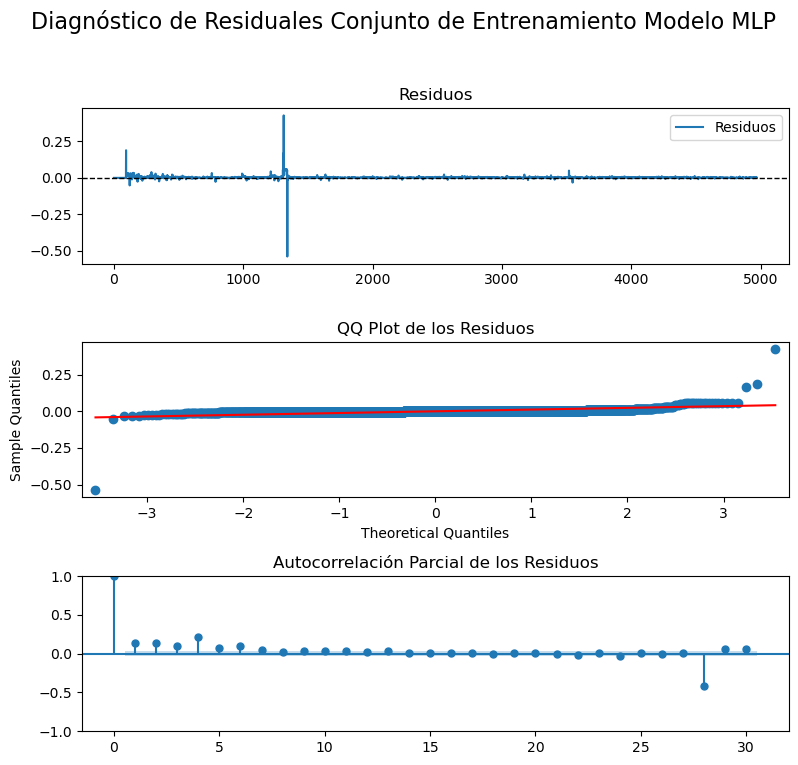

Ljung-Box LB Statistic: 99.385388
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [834]:
ljung_box_pval_LSTM_train7_vola28, jarque_bera_pval_LSTM_train7_vola28 = diagnostic_plots(y_train_vola28_7, train_preds_vola28_LSTM7)

In [835]:
#calcular las métricas 
metrica_vola28_LSTM_train = metricas(y_train_vola28_7,train_preds_vola28_LSTM7)
metrica_vola28_LSTM_train.index = metrica_vola28_LSTM_train.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 28  y τ = 7'})
metrica_vola28_LSTM_train['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train7_vola28], index=metrica_vola28_LSTM_train.index)
metrica_vola28_LSTM_train['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train7_vola28], index=metrica_vola28_LSTM_train.index)
metrica_vola28_LSTM_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 28 y τ = 7,0.6949,5.1%,0.0,0.0,96.2%,2.0785e-23,0.0


* **Conjunto de datos de Prueba:**

In [836]:
ljung_box_pvalLSTM7_vola28, jarque_bera_pvalLSTM7_vola28 = evaluate_residuals(data_test_plot_vola28_7, test_preds_vola28_LSTM7)

No se rechaza H0: los residuales son independientes (no correlacionados).
No se rechaza H0: los residuales siguen una distribución normal.


In [837]:
metrica_LSTM_test_vola28 = metricas(y_test_vola28_7,test_preds_vola28_LSTM7)
metrica_LSTM_test_vola28.index = metrica_LSTM_test_vola28.index.map({0: 'LSTM Prueba Volatilidad ω = 28 y τ = 7'})
metrica_LSTM_test_vola28['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM7_vola28], index=metrica_LSTM_test_vola28.index)
metrica_LSTM_test_vola28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM7_vola28], index=metrica_LSTM_test_vola28.index)
metrica_LSTM_test_vola28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 28 y τ = 7,8.2883e-06,2.37%,0.0,0.0,60.11%,0.2107,0.5019


* **Curva Runs vs Error/Score :**

In [838]:
plot_best_model_validation_loss(history_vola28_LSTM7)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [839]:
errores_plots(y_train_vola28_7, train_preds_vola28_LSTM7, y_val_vola28_7, val_preds_vola28_LSTM7, y_test_vola28_7, test_preds_vola28_LSTM7)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada  del error/score correspondiente al val_loss de la epoca del mejor modelo.
* **Conjunto de Validación**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra cercana del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 14 días ($\tau=14$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [840]:
X_train_vola28_lstm_14, X_val_vola28_lstm_14, X_test_vola28_lstm_14 = change_dimension_lstm(X_train_vola28_14, X_val_vola28_14, X_test_vola28_14)

Shape of 3D arrays X: (4943, 14, 1) (14, 14, 1) (14, 14, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [841]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(14,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola28_lstm_14, y_train_vola28_14)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  29.2s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  29.3s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  29.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  29.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  29.7s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.019221560638020996


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [842]:
input_shape14 = 14
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM14_vola28 = build_models_lstm(input_shape14, neurons_list, dropout_rates, 'SGD')

Model: "model_766"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_767 (InputLayer)      [(None, 14, 1)]           0         
                                                                 
 lstm_716 (LSTM)             (None, 14, 64)            16896     
                                                                 
 lstm_717 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_766 (Dropout)       (None, 32)                0         
                                                                 
 dense_1990 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_7

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [843]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola28_LSTM14_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best14_lstm_vola28 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM7`. 

In [844]:
import os
from joblib import dump, load


history_vola28_LSTM14 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM14_vola28):
    filename = f'history_vola28_LSTM14_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola28_lstm_14, y=y_train_vola28_14, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best14_lstm_vola28], validation_data=(X_val_vola28_lstm_14, y_val_vola28_14),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola28_LSTM14.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola28_LSTM14_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM14_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM14_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM14_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM14_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM14_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM14_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM14_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM14_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM14_mod

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [845]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola28_LSTM14_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best14_lstm_vola28 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best14_lstm_vola28 = load_model(best_model_path)  # Cargar el modelo

    if best14_lstm_vola28 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola28_LSTM14_weights.19-0.0006.keras con val_loss: 0.0006


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [846]:
# Predicciones usando el mejor modelo
if best14_lstm_vola28 is not None:

    train_preds_vola28_LSTM14 = best14_lstm_vola28.predict(X_train_vola28_lstm_14)
    val_preds_vola28_LSTM14 = best14_lstm_vola28.predict(X_val_vola28_lstm_14)
    test_preds_vola28_LSTM14 = best14_lstm_vola28.predict(X_test_vola28_lstm_14)

    # Aplanar las predicciones si es necesario
    train_preds_vola28_LSTM14 = np.squeeze(train_preds_vola28_LSTM14)
    val_preds_vola28_LSTM14 = np.squeeze(val_preds_vola28_LSTM14)
    test_preds_vola28_LSTM14 = np.squeeze(test_preds_vola28_LSTM14)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola28_LSTM14)
    print("Predicciones de validación:", val_preds_vola28_LSTM14)
    print("Predicciones de prueba:", test_preds_vola28_LSTM14)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 17ms/step
Predicciones de Entrenamiento: [0.00024528 0.00024528 0.00024528 ... 0.02415646 0.0205919  0.02047076]
Predicciones de validación: [0.01977194 0.02030483 0.02037859 0.02126595 0.01980017 0.01971755
 0.01999369 0.01989475 0.01684524 0.01667417 0.01703978 0.01726488
 0.01605442 0.01608873]
Predicciones de prueba: [0.01605329 0.0177317  0.0189216  0.02426764 0.02540562 0.02530106
 0.02536478 0.02496376 0.02771563 0.03183048 0.03209726 0.0320066
 0.03164429 0.0316681 ]


In [847]:
plot_model(data_train_plot_vola28_14[-100:], data_val_plot_vola28_14, data_test_plot_vola28_14, val_preds_vola28_LSTM14, test_preds_vola28_LSTM14, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

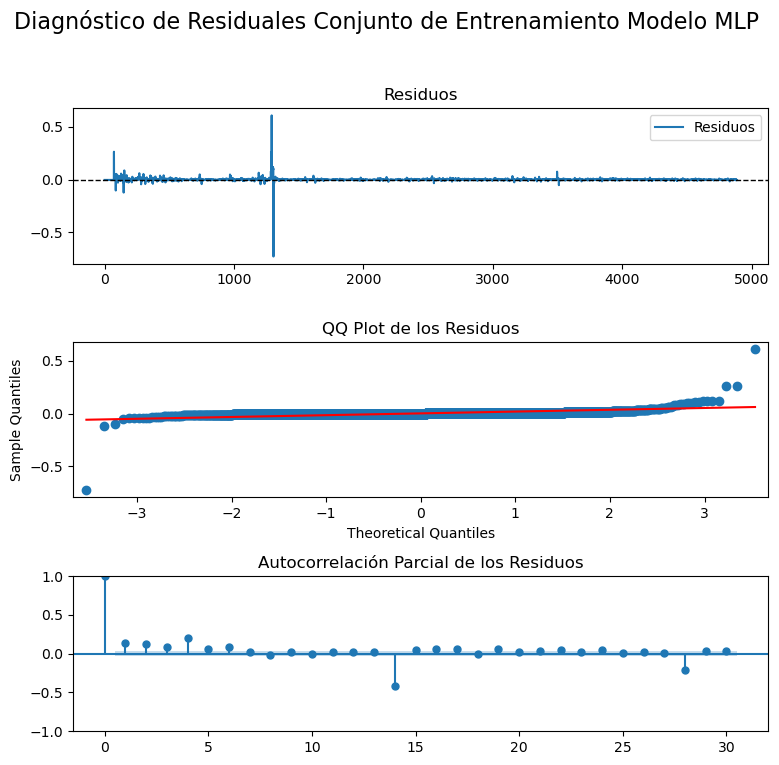

Ljung-Box LB Statistic: 86.370329
Ljung-Box p-value: 0.000000
Se rechaza H0: hay autocorrelación en los residuales.
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [848]:
ljung_box_pval_LSTM_train14_vola28, jarque_bera_pval_LSTM_train14_vola28 = diagnostic_plots(y_train_vola14_28, train_preds_vola14_LSTM28)

In [849]:
#calcular las métricas 
metrica_vola28_LSTM_train14 = metricas(y_train_vola28_14,train_preds_vola28_LSTM14)
metrica_vola28_LSTM_train14.index = metrica_vola28_LSTM_train14.index.map({0: 'LSTM Entrenamiento Volatilidada ω = 28 y τ = 14'})
metrica_vola28_LSTM_train14['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train14_vola28], index=metrica_vola28_LSTM_train14.index)
metrica_vola28_LSTM_train14['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train14_vola28], index=metrica_vola28_LSTM_train14.index)
metrica_vola28_LSTM_train14

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidada ω = 28 y τ = 14,0.6415,3.75%,0.0,0.0,96.49%,1.4921e-20,0.0


* **Conjunto de datos de Prueba:**

In [850]:
ljung_box_pvalLSTM14_vola28, jarque_bera_pvalLSTM14_vola28 = evaluate_residuals(data_test_plot_vola28_14, test_preds_vola28_LSTM14)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [851]:
metrica_LSTM_test14_vola28 = metricas(y_test_vola28_14,test_preds_vola28_LSTM14)
metrica_LSTM_test14_vola28.index = metrica_LSTM_test14_vola28.index.map({0: 'LSTM Prueba Volatilidada ω = 28 y τ = 14'})
metrica_LSTM_test14_vola28['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM14_vola28], index=metrica_LSTM_test14_vola28.index)
metrica_LSTM_test14_vola28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM14_vola28], index=metrica_LSTM_test14_vola28.index)
metrica_LSTM_test14_vola28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidada ω = 28 y τ = 14,5.8923e-05,5.01%,0.0,0.0,81.02%,0.0221,0.8832


* **Curva Runs vs Error/Score :**

In [852]:
plot_best_model_validation_loss(history_vola28_LSTM14)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [853]:
errores_plots(y_train_vola28_14, train_preds_vola28_LSTM14, y_val_vola28_14, val_preds_vola28_LSTM14, y_test_vola28_14, test_preds_vola28_LSTM14)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo, ademas muestra un sesgo considerable a la derecha y una alta variabilidad. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



##### Horizonte de 21 días ($\tau=21$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [854]:
X_train_vola28_lstm_21, X_val_vola28_lstm_21, X_test_vola28_lstm_21 = change_dimension_lstm(X_train_vola28_21, X_val_vola28_21, X_test_vola28_21)

Shape of 3D arrays X: (4915, 21, 1) (21, 21, 1) (21, 21, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [855]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(21,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola28_lstm_21, y_train_vola28_21)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  41.9s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  42.1s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  42.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  42.4s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  42.5s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.015903937048416174


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [856]:
input_shape21 = 21
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM21_vola28 = build_models_lstm(input_shape21, neurons_list, dropout_rates, 'SGD')

Model: "model_783"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_784 (InputLayer)      [(None, 21, 1)]           0         
                                                                 
 lstm_750 (LSTM)             (None, 21, 64)            16896     
                                                                 
 lstm_751 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_783 (Dropout)       (None, 32)                0         
                                                                 
 dense_2007 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_7

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [857]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola28_LSTM21_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best21_lstm_vola28 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM21`. 

In [858]:
import os
from joblib import dump, load

history_vola28_LSTM21 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM21_vola28):
    filename = f'history_vola28_LSTM21_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola28_lstm_21, y=y_train_vola28_21, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best21_lstm_vola28], validation_data=(X_val_vola28_lstm_21, y_val_vola28_21),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola28_LSTM21.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola28_LSTM21_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM21_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM21_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM21_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM21_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM21_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM21_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM21_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM21_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM21_mod

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [859]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola28_LSTM21_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best21_lstm_vola28 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best21_lstm_vola28 = load_model(best_model_path)  # Cargar el modelo

    if best21_lstm_vola28 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola28_LSTM21_weights.18-0.0008.keras con val_loss: 0.0008


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [860]:
# Predicciones usando el mejor modelo
if best21_lstm_vola28 is not None:

    train_preds_vola28_LSTM21 = best21_lstm_vola28.predict(X_train_vola28_lstm_21)
    val_preds_vola28_LSTM21 = best21_lstm_vola28.predict(X_val_vola28_lstm_21)
    test_preds_vola28_LSTM21 = best21_lstm_vola28.predict(X_test_vola28_lstm_21)

    # Aplanar las predicciones si es necesario
    train_preds_vola28_LSTM21 = np.squeeze(train_preds_vola28_LSTM21)
    val_preds_vola28_LSTM21 = np.squeeze(val_preds_vola28_LSTM21)
    test_preds_vola28_LSTM21 = np.squeeze(test_preds_vola28_LSTM21)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola21_LSTM21)
    print("Predicciones de validación:", val_preds_vola28_LSTM21)
    print("Predicciones de prueba:", test_preds_vola28_LSTM21)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 15ms/step
Predicciones de Entrenamiento: [0.00065348 0.00065348 0.00065348 ... 0.03063774 0.03060195 0.03058668]
Predicciones de validación: [0.02774444 0.02896487 0.02881305 0.02845261 0.02822987 0.0295639
 0.0296765  0.0296645  0.02896145 0.02874506 0.02739654 0.02676729
 0.02675047 0.02676198 0.02682831 0.0232301  0.02293766 0.02357914
 0.02399966 0.02043307 0.02028001]
Predicciones de prueba: [0.01952437 0.02009363 0.02017197 0.02107996 0.01960839 0.01952406
 0.01977411 0.01969218 0.01663092 0.01643156 0.01675948 0.01702081
 0.01581642 0.01583938 0.01578473 0.01748742 0.01870063 0.02411165
 0.02530042 0.02525723 0.0252745 ]


In [861]:
plot_model(data_train_plot_vola28[-100:], data_val_plot_vola28, data_test_plot_vola28, val_preds_vola21_LSTM28, test_preds_vola21_LSTM28, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

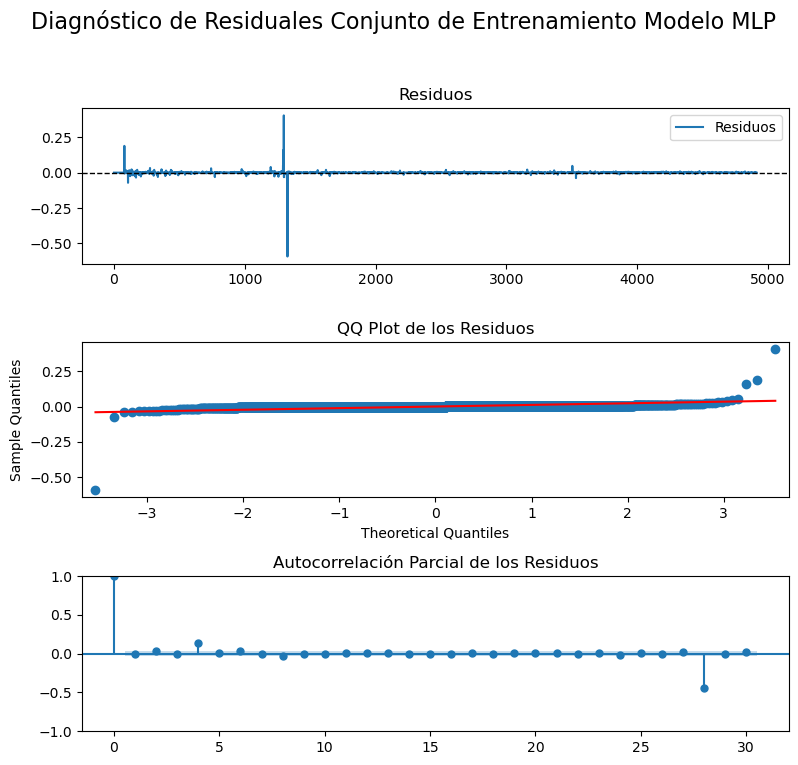

Ljung-Box LB Statistic: 0.079913
Ljung-Box p-value: 0.777415
No se rechaza H0: los residuales son independientes (no correlacionados).
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [862]:
ljung_box_pval_LSTM_train21_vola28, jarque_bera_pval_LSTM_train21_vola28 = diagnostic_plots(y_train_vola28_21, train_preds_vola28_LSTM21)

In [863]:
#calcular las métricas 
metrica_vola28_LSTM_train21 = metricas(y_train_vola28_21,train_preds_vola28_LSTM21)
metrica_vola28_LSTM_train21.index = metrica_vola28_LSTM_train21.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 28 y τ = 21'})
metrica_vola28_LSTM_train21['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train21_vola28], index=metrica_vola28_LSTM_train21.index)
metrica_vola28_LSTM_train21['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train21_vola28], index=metrica_vola28_LSTM_train21.index)
metrica_vola28_LSTM_train21

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 28 y τ = 21,0.6406,3.8%,0.0,0.0,96.49%,0.7774,0.0


* **Conjunto de datos de Prueba:**

In [864]:
ljung_box_pvalLSTM21_vola28, jarque_bera_pvalLSTM21_vola28 = evaluate_residuals(data_test_plot_vola28_21, test_preds_vola28_LSTM21)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [865]:
metrica_LSTM_test21_vola28 = metricas(y_test_vola28_21,test_preds_vola28_LSTM21)
metrica_LSTM_test21_vola28.index = metrica_LSTM_test21_vola28.index.map({0: 'LSTM Prueba Volatilidad ω = 28 y τ = 21'})
metrica_LSTM_test21_vola28['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM21_vola28], index=metrica_LSTM_test21_vola28.index)
metrica_LSTM_test21_vola28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM21_vola28], index=metrica_LSTM_test21_vola28.index)
metrica_LSTM_test21_vola28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 28 y τ = 21,5.3424e-05,4.83%,0.0,0.0,75.52%,5.4375e-05,0.5799


##### Horizonte de 28 días ($\tau=28$)

Indexación de parámetros para cambio de dimensión de `X` de 2D a 3D. 

In [866]:
X_train_vola28_lstm_28, X_val_vola28_lstm_28, X_test_vola28_lstm_28 = change_dimension_lstm(X_train_vola28_28, X_val_vola28_28, X_test_vola28_28)

Shape of 3D arrays X: (4887, 28, 1) (28, 28, 1) (28, 28, 1)


A continuación, se lleva a cabo la búsqueda los hiperparámetros que optimizan nuestro modelo utilizando `Keras`y `GridSearch`.

In [867]:
from sklearn.metrics import make_scorer, mean_absolute_error

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Esto ignorará todos los logs de info y warnings.

# Define the LSTM network architecture
def create_lstm_model(optimizer, activation):
    input_layer_lstm = Input(shape=(28,1), dtype='float32')
    lstm_layer1= LSTM(64, return_sequences=True)(input_layer_lstm)
    lstm_layer2 = LSTM(32, return_sequences=False)(lstm_layer1)
    dropout_layer_lstm = Dropout(0.2)(lstm_layer2)
    output_layer_lstm = Dense(1, activation='linear')(dropout_layer_lstm)
    ts_model_lstm = Model(inputs=input_layer_lstm, outputs=output_layer_lstm)
    ts_model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)
   
    return ts_model_lstm

# definición de parametros
param_grid = {'activation': ['relu'],  # Funciones de activación a probar 'activation': ['relu', 'tanh', 'sigmoid']
              'epochs' : [20],  #[20, 50, 100, 150]
              'optimizer': ['SGD'] #['SGD', 'RMSprop', 'Adam']
}

# Configuración el Grid Search
scoring = make_scorer(mean_absolute_error)

model = KerasRegressor(build_fn=create_lstm_model, epochs=10, batch_size=16, verbose=0)

grid = GridSearchCV(estimator=model, param_grid=param_grid,cv=KFold(n_splits=5, shuffle=True), scoring=scoring, n_jobs = -1,verbose =2)
grid_result = grid.fit(X_train_vola28_lstm_28, y_train_vola28_28)

# Resultados del Grid Search
print(f"Mejor función de activación: {grid_result.best_params_['activation']}")
print(f"Mejor número de epocas: {grid_result.best_params_['epochs']}")
print(f"Mejor Longitud de paso μ (optimizer): {grid_result.best_params_['optimizer']}")
print(f"Mejor Puntuación: {grid_result.best_score_}")

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  50.0s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  50.2s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  50.5s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  50.8s
[CV] END ..........activation=relu, epochs=20, optimizer=SGD; total time=  51.2s
Mejor función de activación: relu
Mejor número de epocas: 20
Mejor Longitud de paso μ (optimizer): SGD
Mejor Puntuación: 0.016788452156996835


El modelo de predicción de series temporales se basa en una `red neuronal recurrente` que incluye una `capa de entrada` que se conecta a una capa `LSTM`. Esta capa LSTM considera `7 pasos temporales`, equivalentes al número de `datos históricos`. La salida de la `LSTM` se `genera únicamente a partir del último paso temporal`. Cada uno de los `n pasos temporales` definidos en el `shape (n,)` cuenta con `32 neuronas ocultas`.

La cantidad de pasos temporales (`timesteps`) y 1 indica el número de características (`features`) por cada paso temporal. Se utiliza `return_sequences=True` cuando es necesario enviar la `secuencia completa de salidas a la capa siguiente`, que puede ser otra capa recurrente, para este caso otra capa LSTM.

La salida de LSTM pasa a una capa de exclusión que elimina aleatoriamente el 20%, 40%, 60% y 80% de la entrada antes de pasar a la capa de salida, que tiene una única neurona oculta con una función de activación lineal

A idexación de parámetros función `build_models_lstm` con base a lo indicado en el númeral 3 del parcial práctico. 

In [868]:
input_shape28 = 28
neurons_list = [10, 100, 1000, 10000]
dropout_rates = [0.2, 0.4, 0.6, 0.8]

models_LSTM28_vola28 = build_models_lstm(input_shape28, neurons_list, dropout_rates, 'SGD')

Model: "model_800"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_801 (InputLayer)      [(None, 28, 1)]           0         
                                                                 
 lstm_784 (LSTM)             (None, 28, 64)            16896     
                                                                 
 lstm_785 (LSTM)             (None, 32)                12416     
                                                                 
 dropout_800 (Dropout)       (None, 32)                0         
                                                                 
 dense_2024 (Dense)          (None, 1)                 33        
                                                                 
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________
Modelo con 10 neuronas y dropout 0.2:
Model: "model_8

Para entrenar el modelo, se utiliza la función `fit()` en el objeto del modelo, proporcionándole como argumentos X_train y y_train. El proceso de entrenamiento se lleva a cabo a lo largo de un `número específico de épocas`. Además, el parámetro `batch_size` especifica cuántas muestras del conjunto de entrenamiento se usarán en cada iteración de retropropagación (`backpropagation`).

El conjunto de datos de `validación` se utiliza para `evaluar` el rendimiento del modelo al finalizar cada época. Se emplea un objeto `ModelCheckpoint` que monitorea la `función de pérdida` en el conjunto de validación y `almacena` el modelo correspondiente a la `época` en la que esta función alcanza su `valor más bajo`.

Se define `val_loss` como  el valor de la `función de coste` para los datos de `validación cruzada` y `loss` como el valor de la `función de coste` para los datos de `entrenamiento`. `period=1` indica que el `modelo` se `evaluará` y potencialmente se `guardará` después de cada `época`.

In [869]:
from tensorflow.keras.callbacks import ModelCheckpoint

save_weights = os.path.join('keras_models', 'PRSA_data_vola28_LSTM28_weights.{epoch:02d}-{val_loss:.4f}.keras')
save_best28_lstm_vola28 = ModelCheckpoint(save_weights, monitor='val_loss', verbose=2,
                            save_best_only=True, save_weights_only=False, mode='min', save_freq='epoch');

A continuación se itera sobre cada uno de los modelos del objeto `models_LSTM28_at`. 

In [870]:
import os
from joblib import dump, load

history_vola28_LSTM28 = []

# Iterar sobre cada modelo en la lista models_LSTM
for i, model in enumerate(models_LSTM28_vola28):
    filename = f'history_vola28_LSTM28_model_{i}.joblib'

    if os.path.exists(filename):
        model_history = load(filename)
        print(f"El archivo '{filename}' ya existe. Se ha cargado el historial del entrenamiento.")
    else:
        model_history = model.fit(x=X_train_vola28_lstm_28, y=y_train_vola28_28, batch_size=16, epochs=20, 
                                  verbose=2, callbacks=[save_best28_lstm_vola28], validation_data=(X_val_vola28_lstm_28, y_val_vola28_28),
                                  shuffle=True)
        dump(model_history.history, filename)
        print(f"El entrenamiento del modelo {i + 1} se ha completado y el historial ha sido guardado en '{filename}'.")

    # Almacenar el historial del modelo
    history_vola28_LSTM28.append(model_history if isinstance(model_history, dict) else model_history.history)

El archivo 'history_vola28_LSTM28_model_0.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM28_model_1.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM28_model_2.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM28_model_3.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM28_model_4.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM28_model_5.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM28_model_6.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM28_model_7.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM28_model_8.joblib' ya existe. Se ha cargado el historial del entrenamiento.
El archivo 'history_vola28_LSTM28_mod

En este caso, el parámetro `verbose=2` indica que se `mostrará` una línea por cada época durante el `entrenamiento`. Los valores posibles son: 0 para no mostrar información, 1 para visualizar una barra de progreso y 2 para ver un registro por época. 

Además, las `muestras` se `mezclan` de manera aleatoria `antes de cada época`, gracias a la opción `shuffle=True`.

Una vez completado el entrenamiento, se realizan `predicciones` sobre la concentración de `Precio` del Bitcoin utilizando los `mejor modelos` guardados. Las predicciones generadas, que corresponden al `Precio del Bitcoin escalado`, son transformadas inversamente para recuperar los `valores originales`. Asimismo, se evalúa la calidad del ajuste mediante el uso de métricas de medición como `SEE`, `MAPE`, `MAD`, `MSD` Y `R2`.

In [871]:
import os
import re
from tensorflow.keras.models import load_model
import numpy as np

# Directorio de modelos
model_dir = 'keras_models'
files = os.listdir(model_dir)
pattern =  r"PRSA_data_vola28_LSTM28_weights\.(\d+)-([\d\.]+)\.keras"

best_val_loss = float('inf')
best_model_file = None
best28_lstm_vola28 = None

# Iterar sobre los archivos en el directorio
for file in files:
    match = re.match(pattern, file)
    if match:
        epoch = int(match.group(1))  # Extraer la época
        val_loss = float(match.group(2))  # Extraer el val_loss
        # Verificar si el val_loss actual es mejor que el mejor encontrado
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_file = file  # Actualizar el mejor archivo de modelo

# Cargar el mejor modelo si se encontró uno
if best_model_file:
    best_model_path = os.path.join(model_dir, best_model_file)
    print(f"Cargando el mejor modelo: {best_model_file} con val_loss: {best_val_loss}")
    best28_lstm_vola28 = load_model(best_model_path)  # Cargar el modelo

    if best28_lstm_vola28 is None:
        print("Error: No se pudo cargar el mejor modelo.")
else:
    print("No se encontraron archivos de modelos que coincidan con el patrón.")

Cargando el mejor modelo: PRSA_data_vola28_LSTM28_weights.12-0.0006.keras con val_loss: 0.0006


A continuación estimamos las `predicciones` del modelo MLP para la `epoca` en donde la `función de perdida` alcanza su `valor más bajo`. 

In [872]:
# Predicciones usando el mejor modelo
if best28_lstm_vola28 is not None:

    train_preds_vola28_LSTM28 = best28_lstm_vola28.predict(X_train_vola28_lstm_28)
    val_preds_vola28_LSTM28 = best28_lstm_vola28.predict(X_val_vola28_lstm_28)
    test_preds_vola28_LSTM28 = best28_lstm_vola28.predict(X_test_vola28_lstm_28)

    # Aplanar las predicciones si es necesario
    train_preds_vola28_LSTM28 = np.squeeze(train_preds_vola28_LSTM28)
    val_preds_vola28_LSTM28 = np.squeeze(val_preds_vola28_LSTM28)
    test_preds_vola28_LSTM28 = np.squeeze(test_preds_vola28_LSTM28)

    # Imprimir las predicciones
    print("Predicciones de Entrenamiento:", train_preds_vola28_LSTM28)
    print("Predicciones de validación:", val_preds_vola28_LSTM28)
    print("Predicciones de prueba:", test_preds_vola28_LSTM28)
else:
    print("No se puede realizar predicciones porque el mejor modelo no se ha cargado.")


1/1 [==============================] - 0s 11ms/step
Predicciones de Entrenamiento: [0.00069685 0.00069685 0.00069685 ... 0.0246336  0.02452765 0.02430882]
Predicciones de validación: [0.02420108 0.02385474 0.02230763 0.02366592 0.02443529 0.02425671
 0.02415307 0.02413859 0.02464491 0.02504216 0.02451654 0.02449027
 0.0278269  0.02824472 0.02836224 0.02797896 0.02796812 0.02736126
 0.02792033 0.02805061 0.02804621 0.02789402 0.02899709 0.02893455
 0.02859725 0.02836395 0.02956758 0.02975667]
Predicciones de prueba: [0.02975679 0.02910678 0.02886033 0.02760977 0.02694902 0.02689082
 0.02690426 0.02696997 0.02368624 0.02318505 0.02374233 0.02418448
 0.02096416 0.02059118 0.0198798  0.02036564 0.0204818  0.02132544
 0.02004402 0.01987434 0.02009164 0.02004114 0.01724802 0.01686302
 0.01714042 0.01741496 0.0163423  0.01628453]


In [873]:
plot_model(data_train_plot_vola28_28[-100:], data_val_plot_vola28_28, data_test_plot_vola28_28, val_preds_vola28_LSTM28, test_preds_vola28_LSTM28, "Predicciones usando Memoria a Corto y Largo Paso (LSTM)")

A continuación realizamos un análisis sobre los residuales y rendimiento de nuestro modelo con relación a  nuestro conjunto de `Entrenamiento`(rendimiento) y `test` (rendimiento y residuales). 

* **Conjunto de datos de Entrenamiento**

A continuación se realiza el análisis de los residuales para el conjunto de `entrenamiento`. 

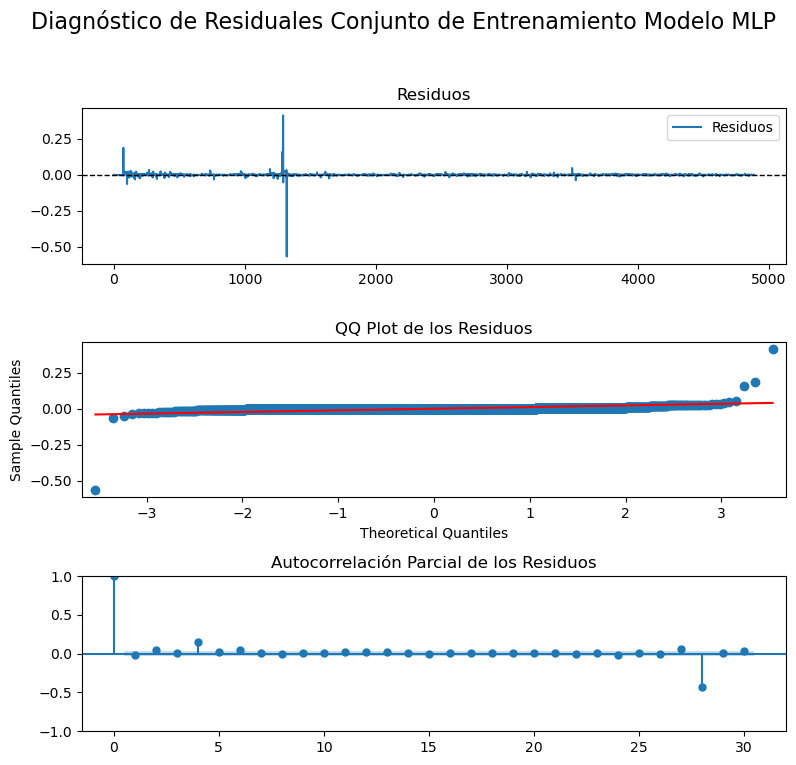

Ljung-Box LB Statistic: 0.627563
Ljung-Box p-value: 0.428251
No se rechaza H0: los residuales son independientes (no correlacionados).
Jarque-Bera p-value: 0.000000
Se rechaza H0: los residuales no siguen una distribución normal.


In [874]:
ljung_box_pval_LSTM_train28_vola28, jarque_bera_pval_LSTM_train28_vola28 = diagnostic_plots(y_train_vola28_28, train_preds_vola28_LSTM28)

In [875]:
#calcular las métricas 
metrica_vola28_LSTM_train28 = metricas(y_train_vola28_28,train_preds_vola28_LSTM28)
metrica_vola28_LSTM_train28.index = metrica_vola28_LSTM_train28.index.map({0: 'LSTM Entrenamiento Volatilidad ω = 28 y τ = 28'})
metrica_vola28_LSTM_train28['Ljung-Box p-value'] = pd.Series([ljung_box_pval_LSTM_train28_vola28], index=metrica_vola28_LSTM_train28.index)
metrica_vola28_LSTM_train28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pval_LSTM_train28_vola28], index=metrica_vola28_LSTM_train28.index)
metrica_vola28_LSTM_train28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Entrenamiento Volatilidad ω = 28 y τ = 28,0.6377,4.16%,0.0,0.0,96.5%,0.4283,0.0


* **Conjunto de datos de Prueba:**

In [876]:
ljung_box_pvalLSTM28_vola28, jarque_bera_pvalLSTM28_vola28 = evaluate_residuals(data_test_plot_vola28_28, test_preds_vola28_LSTM28)

Se rechaza H0: hay autocorrelación en los residuales.
No se rechaza H0: los residuales siguen una distribución normal.


In [877]:
metrica_LSTM_test28_vola28 = metricas(y_test_vola28_28,test_preds_vola28_LSTM28)
metrica_LSTM_test28_vola28.index = metrica_LSTM_test28_vola28.index.map({0: 'LSTM Prueba Volatilidad ω = 21 y τ = 28'})
metrica_LSTM_test28_vola28['Ljung-Box p-value'] = pd.Series([ljung_box_pvalLSTM28_vola28], index=metrica_LSTM_test28_vola28.index)
metrica_LSTM_test28_vola28['Jarque-Bera p-value'] = pd.Series([jarque_bera_pvalLSTM28_vola28], index=metrica_LSTM_test28_vola28.index)
metrica_LSTM_test28_vola28

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
LSTM Prueba Volatilidad ω = 21 y τ = 28,5.0535e-05,4.11%,0.0,0.0,89.38%,1.7241e-06,0.7083


* **Curva Runs vs Error/Score :**

In [878]:
plot_best_model_validation_loss(history_vola28_LSTM28)

* **Boxplot Errores Conjunto de Entrenamiento, Validación y Prueba :**

In [879]:
errores_plots(y_train_vola28_28, train_preds_vola28_LSTM28, y_val_vola28_28, val_preds_vola28_LSTM28, y_test_vola28_28, test_preds_vola28_LSTM28)

De acuerdo a los resultados obtendios del gráfico de `Run vs Error/Score` y al compararlo con el gráfico `boxplot` de los residuales se observa lo siguiente: 

* **Conjunto de Entrenamiento**: La medía de los residuales se encuentra cerca considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Validación**: La medía de los residuales se encuentra alejada del error/score correspondiente al val_loss de la epoca del mejor modelo. 
* **Conjunto de Prueba**: La medía de los residuales se encuentra alejada considerablemente del error/score correspondiente al val_loss de la epoca del mejor modelo. 

Lo anterior es coherente con las métricas obtenidas para el modelo implementado. 



## Resumen de métricas

En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `entrenamiento` para la variable `Price`. 

In [880]:
metricas_df_train = pd.concat([metrica_price_MLP_train, metrica_price_MLP_train14, metrica_price_MLP_train21, metrica_price_MLP_train28,
                                        metrica_price_LSTM_train, metrica_price_LSTM_train14, metrica_price_LSTM_train21, metrica_price_LSTM_train28,
                                        metrica_at_MLP_train, metrica_at_MLP_train14, metrica_at_MLP_train21, metrica_at_MLP_train28,
                                        metrica_at_LSTM_train, metrica_at_LSTM_train14, metrica_at_LSTM_train21, metrica_at_LSTM_train28,
                                        metrica_vola7_MLP_train, metrica_vola7_MLP_train14, metrica_vola7_MLP_train21, metrica_vola7_MLP_train28,
                                        metrica_vola7_LSTM_train, metrica_vola7_LSTM_train14, metrica_vola7_LSTM_train21, metrica_vola7_LSTM_train28,
                                        metrica_vola14_MLP_train, metrica_vola14_MLP_train14, metrica_vola14_MLP_train21, metrica_vola14_MLP_train28,
                                        metrica_vola14_LSTM_train, metrica_vola14_LSTM_train14, metrica_vola14_LSTM_train21, metrica_vola14_LSTM_train28,
                                        metrica_vola21_MLP_train, metrica_vola21_MLP_train14, metrica_vola21_MLP_train21, metrica_vola21_MLP_train28,
                                        metrica_vola21_LSTM_train, metrica_vola21_LSTM_train14, metrica_vola21_LSTM_train21, metrica_vola21_LSTM_train28,
                                        metrica_vola28_MLP_train, metrica_vola28_MLP_train14, metrica_vola28_MLP_train21, metrica_vola28_MLP_train28,
                                        metrica_vola28_LSTM_train, metrica_vola28_LSTM_train14, metrica_vola28_LSTM_train21, metrica_vola28_LSTM_train28], ignore_index=False)

metricas_df_train

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Entrenamiento Price τ = 7,4.5824e+09,9.01%,416.59,9.2183e+05,99.62%,0.0000e+00,0.0000e+00
MLP Entrenamiento Price τ = 14,2.6896e+09,24.8%,302.87,5.4413e+05,99.77%,5.0699e-158,0.0000e+00
MLP Entrenamiento Price τ = 21,2.8020e+09,40.45%,311.40,5.7010e+05,99.75%,1.5950e-221,0.0000e+00
MLP Entrenamiento Price τ = 28,3.4518e+09,8.41%,348.66,7.0632e+05,99.69%,1.4424e-246,0.0000e+00
LSTM Entrenamiento Price τ = 7,1.7288e+12,65.34%,10422.74,3.4777e+08,-44.87%,0.0000e+00,0.0000e+00
LSTM Entrenamiento Price τ = 14,1.6667e+12,67.82%,10252.25,3.3718e+08,-44.73%,0.0000e+00,0.0000e+00
LSTM Entrenamiento Price τ = 21,1.6280e+12,64.44%,10128.41,3.3124e+08,-44.31%,0.0000e+00,0.0000e+00
LSTM Entrenamiento Price τ = 28,1.5885e+12,66.24%,10000.76,3.2505e+08,-43.89%,0.0000e+00,0.0000e+00
MLP Entrenamiento Retorno Acumulado τ = 7,3.1055e+03,4.87%,0.69,6.2000e-01,98.32%,0.0000e+00,1.4771e-18
MLP Entrenamiento Retorno Acumulado τ = 14,9.4103e+01,0.79%,0.08,2.0000e-02,99.95%,0.0000e+00,0.0000e+00


El análisis de los modelos de predicción revela un rendimiento variado entre las configuraciones de MLP (Perceptrón Multicapa) y LSTM (Memoria a Largo Plazo) en diferentes métricas. En general, los modelos de MLP exhiben un desempeño superior en las métricas de error (SSE, MAPE, MAD y MSD) en comparación con LSTM, especialmente en el caso del "Entrenamiento Volatilidad" con τ = 28, donde el MLP muestra el menor SSE (6.6786e-01) y el MAPE más bajo (6.35%). Sin embargo, el R² más alto se observa en MLP para "Volatilidad ω = 28 y τ = 28", alcanzando un 96.5%. En contraste, los LSTM tienden a tener mayores SSE y MAPE, con valores que superan en varias instancias los 1.5e+12 y 65%, respectivamente, lo que indica un ajuste menos eficaz a los datos. Adicionalmente, los valores de p-value de Ljung-Box y Jarque-Bera sugieren que muchos modelos presentan problemas de autocorrelación y no normalidad en los residuos, especialmente en los modelos LSTM. En conclusión, el modelo MLP Entrenamiento Volatilidad ω = 28 y τ = 28 se destaca como el mejor, ofreciendo los errores más bajos y el mejor ajuste a los datos.

Mejor modelo: MLP Entrenamiento Volatilidad ω = 28 y τ = 28.
* SSE mínimo: 6.6786e-01.
* MAPE más bajo: 6.35%.
* R² más alto: 96.5%.

En la tabla a continuación se encuentran registradas las `métricas` obtenidas para el conjunto de datos de `prueba` para la variable `Retorno Acumulado`. 

In [881]:
metricas_df_test = pd.concat([metrica_MLP7_test, metrica_MLP14_test, metrica_MLP21_test, metrica_MLP28_test,
                                        metrica_LSTM_test, metrica_LSTM_test14, metrica_LSTM_test21, metrica_LSTM_test28,
                                        metrica_MLP7_test_at, metrica_MLP14_test_at, metrica_MLP21_test_at, metrica_MLP28_test_at,
                                        metrica_LSTM_test_at, metrica_LSTM_test_at14, metrica_LSTM_test21_at, metrica_LSTM_test28_at,
                                        metrica_MLP7_test_vola7, metrica_MLP14_test_vola7, metrica_MLP21_test_vola7, metrica_MLP28_test_vola7,
                                        metrica_LSTM_test_vola7, metrica_LSTM_test14_vola7, metrica_LSTM_test21_vola7, metrica_LSTM_test28_vola7,
                                        metrica_MLP7_test_vola14, metrica_MLP14_test_vola14, metrica_MLP21_test_vola14, metrica_MLP28_test_vola14,
                                        metrica_LSTM_test_vola14, metrica_LSTM_test14_vola14, metrica_LSTM_test21_vola14, metrica_LSTM_test28_vola14,
                                        metrica_MLP7_test_vola21, metrica_MLP14_test_vola21, metrica_MLP21_test_vola21, metrica_MLP28_test_vola21,
                                        metrica_LSTM_test_vola21, metrica_LSTM_test14_vola21, metrica_LSTM_test21_vola21, metrica_LSTM_test28_vola21,
                                        metrica_MLP7_test_vola28, metrica_MLP14_test_vola28, metrica_MLP21_test_vola28, metrica_MLP28_test_vola28,
                                        metrica_LSTM_test_vola28, metrica_LSTM_test14_vola28, metrica_LSTM_test21_vola28, metrica_LSTM_test28_vola28], ignore_index=False)

metricas_df_test

,SSE,MAPE,MAD,MSD,R2,Ljung-Box p-value,Jarque-Bera p-value
MLP Prueba Price τ = 7,9.6041e+07,4.17%,2851.11,1.3720e+07,-125.85%,3.1399e-01,0.6674
MLP Prueba Price τ = 14,1.0227e+08,3.11%,1936.37,7.3047e+06,58.69%,2.1899e-03,0.5157
MLP Prueba Price τ = 21,8.6674e+07,2.34%,1314.14,4.1273e+06,80.51%,1.8809e-04,0.1965
MLP Prueba Price τ = 28,5.0452e+07,2.29%,1087.84,1.8018e+06,88.21%,5.4064e-05,0.3951
LSTM Prueba Price τ = 7,3.4305e+10,99.7%,69961.76,4.9007e+09,-80571.1%,8.9358e-02,0.7343
LSTM Prueba Price τ = 7,5.6866e+10,99.67%,63593.77,4.0619e+09,-22868.46%,2.4861e-02,0.7014
LSTM Prueba Price τ = 21,6.2208e+10,99.62%,54232.21,2.9623e+09,-13890.3%,7.9639e-03,0.8356
LSTM Prueba Price τ = 28,6.3986e+10,99.57%,47643.90,2.2852e+09,-14852.49%,2.7070e-04,0.4270
MLP Prueba Retorno Acumulado τ = 7,7.3211e-02,0.41%,0.10,1.0000e-02,-775.94%,1.8205e-01,0.7553
MLP Prueba Retorno Acumulado τ = 14,7.6389e-02,0.28%,0.07,1.0000e-02,-6.65%,2.1899e-03,0.5157


El análisis de los resultados obtenidos de los modelos MLP y LSTM en los datos de prueba revela diferencias significativas en su desempeño según las métricas evaluadas. Para el caso de los precios, los modelos MLP muestran un mejor desempeño que los LSTM en términos de errores como SSE (Suma de Errores Cuadrados) y MAPE (Error Porcentual Absoluto Medio). Por ejemplo, el MLP para τ = 28 tiene un SSE de 5.0452e+07 y un MAPE de 2.29%, lo que indica una buena capacidad de predicción, mientras que los LSTM presentan valores de SSE mucho más altos, superando los 3.4e+10 y con un MAPE que llega hasta el 99.7%.

En cuanto a los retornos acumulados, los modelos MLP también sobresalen, destacando el MLP para τ = 14 con un MAPE de solo 0.28%, mientras que el LSTM para τ = 14 muestra un MAPE desmesurado de 777.81%. En el análisis de volatilidad, los MLP continúan demostrando una mayor precisión, con menores MAPE en comparación con los LSTM.
En resumen, los modelos MLP tienen un rendimiento superior en las predicciones de precios, retornos acumulados y volatilidad en los datos de prueba, en comparación con los modelos LSTM, lo que sugiere que el enfoque MLP es más adecuado para estos conjuntos de datos en particular.
MLP muestra un mejor desempeño general en SSE y MAPE en comparación con LSTM.

* El modelo MLP para τ = 28 tiene el mejor desempeño en precios.
* Para retornos acumulados, el MLP para τ = 14 es el más efectivo.
* En análisis de volatilidad, los MLP también superan a los LSTM consistentemente.
* El MLP es el modelo con mejor comportamiento para este análisis.